#edit chat



In [1]:
import os
print(os.listdir("DOMAIN1_csv"))

['Subject1-0-1.csv', 'Subject1-0-10.csv', 'Subject1-0-2.csv', 'Subject1-0-3.csv', 'Subject1-0-4.csv', 'Subject1-0-5.csv', 'Subject1-0-6.csv', 'Subject1-0-7.csv', 'Subject1-0-8.csv', 'Subject1-0-9.csv', 'Subject1-1-1.csv', 'Subject1-1-10.csv', 'Subject1-1-2.csv', 'Subject1-1-3.csv', 'Subject1-1-4.csv', 'Subject1-1-5.csv', 'Subject1-1-6.csv', 'Subject1-1-7.csv', 'Subject1-1-8.csv', 'Subject1-1-9.csv', 'Subject1-2-1.csv', 'Subject1-2-10.csv', 'Subject1-2-2.csv', 'Subject1-2-3.csv', 'Subject1-2-4.csv', 'Subject1-2-5.csv', 'Subject1-2-6.csv', 'Subject1-2-7.csv', 'Subject1-2-8.csv', 'Subject1-2-9.csv', 'Subject1-3-1.csv', 'Subject1-3-10.csv', 'Subject1-3-2.csv', 'Subject1-3-3.csv', 'Subject1-3-4.csv', 'Subject1-3-5.csv', 'Subject1-3-6.csv', 'Subject1-3-7.csv', 'Subject1-3-8.csv', 'Subject1-3-9.csv', 'Subject1-4-1.csv', 'Subject1-4-10.csv', 'Subject1-4-2.csv', 'Subject1-4-3.csv', 'Subject1-4-4.csv', 'Subject1-4-5.csv', 'Subject1-4-6.csv', 'Subject1-4-7.csv', 'Subject1-4-8.csv', 'Subject1-4-9.

#etidt dist en indepdante 

In [3]:
import sys
!"{sys.executable}" -m pip install matplotlib

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


#code knn dtw final et seul 

In [4]:
import sys
!"{sys.executable}" -m pip install seaborn

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


# code surlequel je me base pour faire les autres modèles notamment le dtw et le lstm

In [ ]:


### Chargement des données ###

import pandas as pd
import numpy as np
import re
from collections import Counter,defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout
from tensorflow.keras.utils import to_categorical
import xgboost as xgb
from sklearn.preprocessing import StandardScaler
from openpyxl import load_workbook
from openpyxl.drawing.image import Image as ExcelImage
from openpyxl.utils.dataframe import dataframe_to_rows
from statistics import stdev
import seaborn as sns


df = pd.DataFrame(columns=['<x>', '<y>','<z>','<t>','gesture', 'subject', 'iter'])

for subject in range(1,11):
    for number in range(0,10):
        for iteration in range(1,11):
            filename = 'Domain1_csv/Subject'+str(subject)+'-'+str(number)+'-'+str(iteration)+'.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])
df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']

print(df)


# Analyse exploratoire
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

# Affichage du graphique
plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"], color="mediumseagreen")
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

# Durée moyenne des gestes
durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
print("Durée moyenne des gestes (en secondes) par chiffre :")
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# Distance moyenne utilisateur / moyenne globale
stats = durations.groupby('gesture')['duration'].agg(['mean', 'std', 'min', 'max'])
print(stats)
mean_coords_user = df.groupby(['subject', 'gesture'])[['x', 'y', 'z']].mean().reset_index()
mean_coords_global = df.groupby('gesture')[['x', 'y', 'z']].mean().reset_index()
mean_coords_global = mean_coords_global.rename(columns={'x':'x_global', 'y':'y_global', 'z':'z_global'})
merged = pd.merge(mean_coords_user, mean_coords_global, on='gesture')
merged['dist_to_global'] = np.sqrt((merged['x'] - merged['x_global'])**2 +(merged['y'] - merged['y_global'])**2 +(merged['z'] - merged['z_global'])**2)
pivot = merged.pivot(index='subject', columns='gesture', values='dist_to_global')
plt.figure(figsize=(12, 8))
sns.heatmap(pivot, annot=True, fmt=".3f", cmap='Blues')
plt.title("Distance des moyennes de chaque utilisateur à la moyenne globale par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Utilisateur")
plt.tight_layout()
plt.show()

# Affichage du geste
subdf = df.loc[(df['gesture'] == 0) & (df['subject'] == 10) & (df['iter'] == 1)]
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(subdf['x'], subdf['y'], subdf['z'



# Fonction de standardisation
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df
df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
#df = df.groupby(['gesture'], group_keys=False).apply(standardize_gesture)  #par geste uniquement

# Afficher les données normalisées d'une trajectoire en 3D
subdf = df.loc[(df['gesture'] == 0) & (df['subject'] == 10) & (df['iter'] == 4)]
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(subdf['x_std'], subdf['y_std'], subdf['z_std'], c='r', marker='o')
print(df.describe().transpose())
df.to_csv('df.csv', index=False)


# Création d'un dictionnaire avec 100 lignes (Deep learning)
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iter), group in df.groupby(['gesture', 'subject', 'iter']):
        original_len = len(group)
        original_indices = np.arange(original_len)
        target_indices = np.linspace(0, original_len - 1, target_len)

        if original_len < target_len:
            # Interpolation pour séquence courte
            interpolated_x = interp1d(original_indices, group['x_std'], kind='linear')(target_indices)
            interpolated_y = interp1d(original_indices, group['y_std'], kind='linear')(target_indices)
            interpolated_z = interp1d(original_indices, group['z_std'], kind='linear')(target_indices)

        elif original_len > target_len:
            # Sous-échantillonnage pour séquence longue
            interpolated_x = group['x_std'].iloc[target_indices.astype(int)].values
            interpolated_y = group['y_std'].iloc[target_indices.astype(int)].values
            interpolated_z = group['z_std'].iloc[target_indices.astype(int)].values

        else:
            # Exactement 100 points : on garde tel quel
            interpolated_x = group['x_std'].values
            interpolated_y = group['y_std'].values
            interpolated_z = group['z_std'].values

        resampled_df = pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iter] * target_len,
            'x_std': interpolated_x,
            'y_std': interpolated_y,
            'z_std': interpolated_z,
        })

        resampled_data.append(resampled_df)

    return pd.concat(resampled_data, ignore_index=True)

resample_gesture(df,100)


def dict_creation_iterout(df, iter_out=10):
    # Séparation des données en test et train selon l'itération
    test_df = df[df["iter"] == iter_out]
    train_df = df[df["iter"] != iter_out]

    train_groups = train_df.groupby(["gesture", "subject", "iter"])
    test_groups = test_df.groupby(["gesture", "subject", "iter"])

    coord_dict_train = {}
    for (gesture, subject, _), group in train_groups:
        coords = group[["x_std", "y_std", "z_std"]].values.tolist()
        coord_dict_train.setdefault(gesture, []).append(coords)

    coord_dict_test = {}
    for (gesture, subject, _), group in test_groups:
        coords = group[["x_std", "y_std", "z_std"]].values.tolist()
        coord_dict_test.setdefault(gesture, []).append(coords)
    return coord_dict_train, coord_dict_test


def dict_creation_userout(df, subj_out):
    # Filtrage du sujet test
    test_df = df[df["subject"] == subj_out]
    test_df = test_df[test_df["iter"] <= 10]
    train_df = df[df["subject"] != subj_out]

    train_groups = train_df.groupby(["gesture", "subject", "iter"])
    test_groups = test_df.groupby(["gesture", "subject", "iter"])

    coord_dict_train = {}
    for (gesture, subject, _), group in train_groups:
        coords = group[["x_std", "y_std", "z_std"]].values.tolist()
        coord_dict_train.setdefault(gesture, []).append(coords)

    coord_dict_test = {}
    for (gesture, subject, _), group in test_groups:
        coords = group[["x_std", "y_std", "z_std"]].values.tolist()
        coord_dict_test.setdefault(gesture, []).append(coords)
    return coord_dict_train, coord_dict_test

def convert_coord_dict_to_xy(DictFunc, df, iter_out):
# Transformation des dictionnaires pour les modeles complexes
    full_dict = DictFunc(df)
    X_train, y_train, X_test, y_test = [], [], [], []

    for gesture in full_dict:
        for subject in full_dict[gesture]:
            for iteration in full_dict[gesture][subject]:
                coords = full_dict[gesture][subject][iteration]

                if DictFunc.__name__ == "dict_creation_iterout" and iteration == iter_out:
                    X_test.append(coords)
                    y_test.append(gesture)
                elif DictFunc.__name__ == "dict_creation_userout" and subject == iter_out:
                    X_test.append(coords)
                    y_test.append(gesture)
                else:
                    X_train.append(coords)
                    y_train.append(gesture)

    return (np.array(X_train), np.array(y_train),np.array(X_test), np.array(y_test))
# Distance Euclidienne 3D
def eucl_dist(list1, list2):
    return np.sqrt((list1[0] - list2[0])**2 + (list1[1] - list2[1])**2 + (list1[2] - list2[2])**2)

# Distance DTW
def dtw_dist(list1, list2):
    n = len(list1)
    m = len(list2)
    dtw_matrix = np.full((n+1, m+1), np.inf)
    dtw_matrix[0,0] = 0


for i in range(1,n+1):
        for j in range(1,m+1):
            cost = eucl_dist(list1[i-1], list2[j-1])
            last_min = min(dtw_matrix[i-1, j], dtw_matrix[i, j-1], dtw_matrix[i-1, j-1])
            dtw_matrix[i, j] = cost + last_min

    return dtw_matrix[n,m]

# KNN
def knn_dtw_predict(reference_seq, train_dict, k=3):
    distances = []

    for gesture, sequences in train_dict.items():
        for seq in sequences:
            dist = dtw_dist(reference_seq, seq)
            distances.append((gesture, dist))

    distances.sort(key=lambda x: x[1])
    k_nearest_neighbors = distances[:k]

    #print(f"\nTop {k} voisins les plus proches (label, distance) :")
    #for i, (gesture, dist) in enumerate(k_nearest_neighbors):
        #print(f"  {i+1}. {gesture} — Distance DTW = {dist:.2f}")

    gestures = [gesture for gesture, _ in k_nearest_neighbors]
    vote_counts = Counter(gestures)

    #print("\nVotes par classe :")
    #for gesture, count in vote_counts.items():
        #print(f"  {gesture} : {count} vote(s)")

    predicted_gesture = vote_counts.most_common(1)[0][0]
    return predicted_gesture

# MODELE LSTM
class LSTMpredict:
    model = None
    df = None
    iter_out = None
    DictFunc = None

    @staticmethod
    def create_model(input_shape=(100, 3), num_classes=10):
        model = models.Sequential([
            layers.LSTM(64, return_sequences=True, dropout=0.2, input_shape=input_shape),
            layers.LSTM(64, dropout=0.3),
            layers.Dense(32, activation='relu'),
            layers.Dropout(0.2),
            layers.Dense(num_classes, activation='softmax')
        ])
        return model

    @classmethod
    def predict(cls, seq):
        if cls.model is None:
            df = cls.df
            iter_out = cls.iter_out
            DictFunc = cls.DictFunc

            train_dict, _ = DictFunc(df, iter_out)

            X_train = []
            y_train = []

            for gesture, sequences in train_dict.items():
                for s in sequences:
                    X_train.append(s)
                    y_train.append(gesture)

            X_train = np.array(X_train, dtype=np.float32)
            y_train = np.array(y_train, dtype=np.int32)

            num_classes = len(set(y_train))
            model = cls.create_model(input_shape=(X_train.shape[1], X_train.shape[2]), num_classes=num_classes)
            model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

            model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=0)

            cls.model = model

        seq = np.expand_dims(np.array(seq, dtype=np.float32), axis=0)  # (1, 100, 3)
        probs = cls.model.predict(seq, verbose=0)
        return int(np.argmax(probs, axis=1)[0])

# MODELE CNN
class CNNpredict:
    model = None
    df = None
    iter_out = None
    DictFunc = None

    @staticmethod
    def build_model(input_shape, num_classes):
        model = Sequential([
            Conv1D(64, 3, activation='relu', input_shape=input_shape),
            MaxPooling1D(2),
            Dropout(0.3),
            Conv1D(128, 3, activation='relu'),
            MaxPooling1D(2),
            Flatten(),
            Dense(64, activation='relu'),
            Dense(num_classes, activation='softmax')
        ])
        model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
        return model

    @staticmethod
    def predict(seq):
        # Initialisation du modèle à la première prédiction
        if CNNpredict.model is None:
            df = CNNpredict.df
            iter_out = CNNpredict.iter_out
            DictFunc = CNNpredict.DictFunc

            train_dict, _ = DictFunc(df, iter_out)

            X_train = []
            y_train = []

            for gesture, sequences in train_dict.items():
                for s in sequences:
                    X_train.append(s)
                    y_train.append(gesture)

            X_train = np.array(X_train)
            y_train_cat = to_categorical(y_train, num_classes=10)

            model = CNNpredict.build_model(X_train.shape[1:], 10)
            model.fit(X_train, y_train_cat, epochs=10, batch_size=32, verbose=0)

            CNNpredict.model = model

        # Prédiction
        input_tensor = np.expand_dims(seq, axis=0)  # shape (1, 100, 3)
        y_pred = CNNpredict.model.predict(input_tensor, verbose=0)
        return np.argmax(y_pred, axis=1)[0]

# MODELE FEATURE
def xgboost_feature_predict(coord_dict_train, coord_dict_test):
    def dict_to_features(coord_dict):
        X, y = [], []
        for gesture, sequences in coord_dict.items():
            for seq in sequences:
                if len(seq) < 5:
                    continue
                if not isinstance(seq, np.ndarray):
                    seq = np.array(seq)
                feat = extract_features(seq)
                X.append(feat)
                y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = dict_to_features(coord_dict_train)
    X_test, y_test = dict_to_features(coord_dict_test)

    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    param = {'max_depth': 8,
        'learning_rate': 0.1,
        #'n_estimators': 300,
        'objective': 'multi:softmax',
        'eval_metric': 'mlogloss',
        'lambda': 1.0,
        'alpha': 0.5,
        'num_class': len(np.unique(y_train))}

    dtrain = xgb.DMatrix(X_train, label=y_train)
    dtest = xgb.DMatrix(X_test, label=y_test)

    bst = xgb.train(param, dtrain, num_boost_round=300)

    y_pred = bst.predict(dtest)
    return y_test, y_pred

def extract_features(sequence):
    features = []

    for i in range(3):  # x, y, z
        axis = sequence[:, i]
        features.extend([
            np.mean(axis), np.std(axis), np.min(axis), np.max(axis), np.median(axis),
            np.percentile(axis, 25), np.percentile(axis, 75)
        ])
        fft_vals = np.abs(np.fft.fft(axis))[:10]
        features.extend(fft_vals)

    velocity = np.diff(sequence, axis=0)
    acceleration = np.diff(velocity, axis=0)
    for v in [velocity, acceleration]:
        norms = np.linalg.norm(v, axis=1)
        features.extend([np.mean(norms), np.std(norms), np.max(norms), np.median(norms)])

    distance = np.sum(np.linalg.norm(velocity, axis=1))
    direction = sequence[-1] - sequence[0]
    angle = np.arccos(np.clip(np.dot(direction, [1, 0, 0]) / (np.linalg.norm(direction) + 1e-6), -1, 1))
    features.extend([distance, angle])

    for i in range(1, len(sequence) - 1):
        v1 = sequence[i] - sequence[i - 1]
        v2 = sequence[i + 1] - sequence[i]
        cos_angle = np.dot(v1, v2) / (np.linalg.norm(v1) * np.linalg.norm(v2) + 1e-6)
        features.append(np.arccos(np.clip(cos_angle, -1, 1)))

    features.extend([np.mean(features[-(len(sequence) - 2):]), np.std(features[-(len(sequence) - 2):])])

    return np.array(features)


PREF_XGB_CLASSES = {0, 2, 8, 1}
PREF_CNN_CLASSES = {3, 4, 6}

# MODELE COMBINE
def combined_predict_algo(seq, coord_dict_train, full_dict_test=None):
    if full_dict_test is not None and combined_predict_algo.xgb_preds is None:
        _, combined_predict_algo.xgb_preds = xgboost_feature_predict(coord_dict_train, full_dict_test)
        combined_predict_algo.xgb_iter = 0
    xgb_pred = combined_predict_algo.xgb_preds[combined_predict_algo.xgb_iter]
    combined_predict_algo.xgb_iter += 1

    cnn_pred = CNNpredict.predict(seq)

    if xgb_pred == cnn_pred:
        return xgb_pred
    elif xgb_pred in [0, 2, 8]:
        return xgb_pred
    elif xgb_pred == 6:
        return cnn_pred
    else:
        return cnn_pred

from collections import defaultdict
from statistics import stdev
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

def testmodel(DictCreationFunc, AlgoFunc, df, loop_range=10, k=3, title=None, save_figs=False):
    total_true = []
    total_pred = []
    all_iteration_accuracies = []
    all_top_errors = []
    erreurs_importantes = []

    dict_name = DictCreationFunc.__name__
    algo_name = (
        "LSTM" if AlgoFunc == LSTMpredict.predict else
        "CNN" if AlgoFunc == CNNpredict.predict else
        "KNN-DTW" if AlgoFunc == knn_dtw_predict else
        "XGBoost" if AlgoFunc == xgboost_feature_predict else
        "Combined" if AlgoFunc == combined_predict_algo else
        "autre"
    )

    for i in range(loop_range):
        coord_dict_train, coord_dict_test = DictCreationFunc(df, i + 1)

        if AlgoFunc == xgboost_feature_predict:
            y_true, y_pred = AlgoFunc(coord_dict_train, coord_dict_test)
            total_true.extend(y_true)
            total_pred.extend(y_pred)
            acc = accuracy_score(y_true, y_pred)
            print(f"\nExactitude pour {dict_name} {i+1} : {acc:.2%}")

        elif AlgoFunc == combined_predict_algo:
            combined_predict_algo.xgb_preds = None
            combined_predict_algo.xgb_iter = 0
            CNNpredict.df = df
            CNNpredict.iter_out = i + 1
            CNNpredict.DictFunc = DictCreationFunc
            CNNpredict.model = None

            y_true = []
            y_pred = []

            for gesture, sequences in coord_dict_test.items():
                for seq in sequences:
                    pred = AlgoFunc(seq, coord_dict_train, full_dict_test=coord_dict_test)
                    if pred is not None:
                        y_true.append(gesture)
                        y_pred.append(pred)
                        total_true.append(gesture)
                        total_pred.append(pred)
                        print(f"Vrai label : {gesture} — Prédiction : {pred}")
                    else:
                        print(f"Erreur de prédiction pour le geste {gesture}, séquence ignorée.")

            accuracy = accuracy_score(y_true, y_pred)
            print(f"\nExactitude pour {dict_name} {i+1} : {accuracy:.2%}")

        else:
            y_true = []
            y_pred = []

            if AlgoFunc == LSTMpredict.predict:
                LSTMpredict.df = df
                LSTMpredict.iter_out = i + 1
                LSTMpredict.DictFunc = DictCreationFunc
                LSTMpredict.model = None

            if AlgoFunc in [CNNpredict.predict, combined_predict_algo]:
                CNNpredict.df = df
                CNNpredict.iter_out = i + 1
                CNNpredict.DictFunc = DictCreationFunc
                CNNpredict.model = None

            if AlgoFunc == CNNpredict.predict:
                CNNpredict.df = df
                CNNpredict.iter_out = i + 1
                CNNpredict.DictFunc = DictCreationFunc
                CNNpredict.model = None

            for gesture, sequences in coord_dict_test.items():
                for seq in sequences:
                    if AlgoFunc in [LSTMpredict.predict, CNNpredict.predict]:
                        pred = AlgoFunc(seq)
                    else:
                        pred = AlgoFunc(seq, coord_dict_train, k=k)

                    if pred is not None:
                        y_true.append(gesture)
                        y_pred.append(pred)
                        total_true.append(gesture)
                        total_pred.append(pred)
                        print(f"Vrai label : {gesture} — Prédiction : {pred}")
                    else:
                        print(f"Erreur de prédiction pour le geste {gesture}, séquence ignorée.")

            accuracy = accuracy_score(y_true, y_pred)
            print(f"\nExactitude pour {dict_name} {i+1} : {accuracy:.2%}")

        # Erreurs par classe
        labels_iter = sorted(set(y_true + y_pred))
        cm_iter = confusion_matrix(y_true, y_pred, labels=labels_iter)
        errors_by_class = defaultdict(float)
        for idx, label in enumerate(labels_iter):
            total = cm_iter[idx].sum()
            correct = cm_iter[idx, idx]
            if total > 0:
                error_rate = 1 - (correct / total)
                errors_by_class[label] = error_rate
                if error_rate > 0.3:
                    erreurs_importantes.append(f"{dict_name} itération {i+1} : {error_rate:.0%} d’erreur sur le geste {label}")

        sorted_errors = sorted(errors_by_class.items(), key=lambda x: x[1], reverse=True)
        top_errors = sorted_errors[:3]
        all_iteration_accuracies.append(accuracy_score(y_true, y_pred))
        all_top_errors.append(top_errors)

        print(f" Gestes les plus difficiles à prédire pour {dict_name} {i+1} :")
        for label, err in top_errors:
            print(f"    - Geste {label} : {err:.2%} d’erreur")

    # Résultat
    accuracy = accuracy_score(total_true, total_pred)
    print(f"\n Exactitude globale : {accuracy:.2%}")

    # Matrice de confusion
    labels = sorted(set(total_true + total_pred))
    cm = confusion_matrix(total_true, total_pred, labels=labels)

    full_title = title if title else f"Matrice de confusion - {algo_name} - Dictionnaire : {dict_name} - Classes : {', '.join(map(str, labels))}"
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
    fig, ax = plt.subplots(figsize=(8, 6))
    disp.plot(ax=ax, cmap='Blues', xticks_rotation=45)
    plt.title(full_title)
    plt.grid(False)
    plt.tight_layout()

    if save_figs:
        img_name = f"confusion_{algo_name}_{dict_name}.png"
        plt.savefig(img_name)
        print(f"Image sauvegardée : {img_name}")

    plt.show()

    ecart_type = stdev(all_iteration_accuracies) if len(all_iteration_accuracies) > 1 else 0.0

    return total_true, total_pred, [{
        "modèle": algo_name,
        "split": dict_name,
        "exactitude": accuracy,
        "écart-type": ecart_type,
        "classe la plus confuse": all_top_errors[-1][0][0] if all_top_errors and all_top_errors[-1] else None,
        "erreurs_>30%": "\n".join(erreurs_importantes) if erreurs_importantes else "RAS"
    }]


df100 = resample_gesture(df)


#dtw knn 5

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_4980\3754124298.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


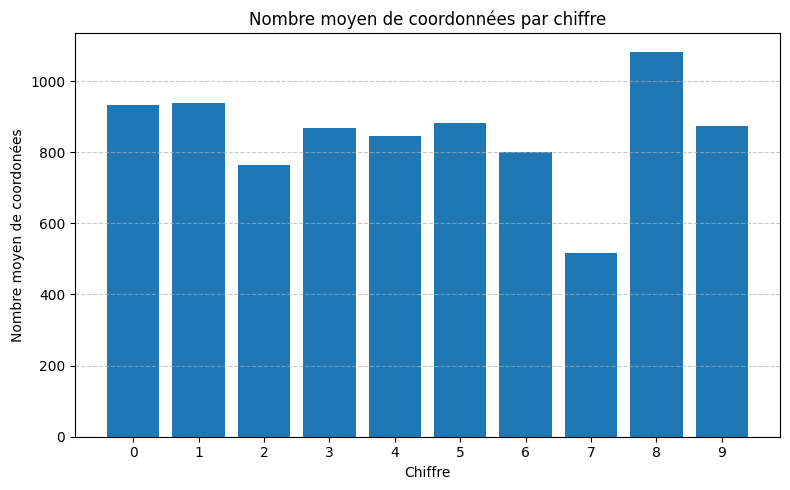

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_4980\3754124298.py:56: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test iter/user OUT : 1 ---
Exactitude split 1 : 97.00%

--- Test iter/user OUT : 2 ---
Exactitude split 2 : 90.00%

--- Test iter/user OUT : 3 ---
Exactitude split 3 : 100.00%

--- Test iter/user OUT : 4 ---
Exactitude split 4 : 100.00%

--- Test iter/user OUT : 5 ---
Exactitude split 5 : 88.00%

--- Test iter/user OUT : 6 ---
Exactitude split 6 : 68.00%

--- Test iter/user OUT : 7 ---
Exactitude split 7 : 93.00%

--- Test iter/user OUT : 8 ---
Exactitude split 8 : 94.00%

--- Test iter/user OUT : 9 ---
Exactitude split 9 : 100.00%

--- Test iter/user OUT : 10 ---
Exactitude split 10 : 90.00%

Exactitude globale KNN-DTW : 92.00%


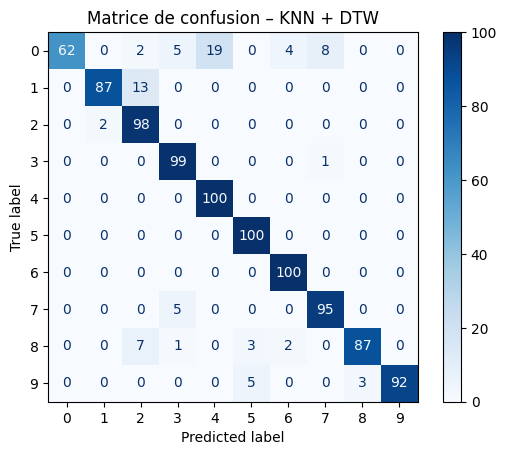

([np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64

In [7]:
### Chargement des données ###

import pandas as pd
import numpy as np
import re
from collections import Counter, defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
import seaborn as sns

df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 10+1):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


### Analyse exploratoire ###
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

### Standardisation ###
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


### Resampling à longueur fixe ###
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)

        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


### Dictionnaires user-out et iter-out ###
def dict_creation_iterout(df, iter_out):
    test_df = df[df["iter"] == iter_out]
    train_df = df[df["iter"] != iter_out]

    dict_train = defaultdict(list)
    dict_test = defaultdict(list)

    for (gesture, subject, iteration), group in train_df.groupby(["gesture", "subject", "iter"]):
        dict_train[gesture].append(group[["x_std", "y_std", "z_std"]].values.tolist())

    for (gesture, subject, iteration), group in test_df.groupby(["gesture", "subject", "iter"]):
        dict_test[gesture].append(group[["x_std", "y_std", "z_std"]].values.tolist())

    return dict_train, dict_test


def dict_creation_userout(df, subj_out):
    test_df = df[df["subject"] == subj_out]
    train_df = df[df["subject"] != subj_out]

    dict_train = defaultdict(list)
    dict_test = defaultdict(list)

    for (gesture, subject, iteration), group in train_df.groupby(["gesture", "subject", "iter"]):
        dict_train[gesture].append(group[["x_std", "y_std", "z_std"]].values.tolist())

    for (gesture, subject, iteration), group in test_df.groupby(["gesture", "subject", "iter"]):
        dict_test[gesture].append(group[["x_std", "y_std", "z_std"]].values.tolist())

    return dict_train, dict_test


### Distance Euclidienne ###
def eucl_dist(p1, p2):
    return np.sqrt((p1[0] - p2[0])**2 +
                   (p1[1] - p2[1])**2 +
                   (p1[2] - p2[2])**2)


### Distance DTW ###
def dtw_dist(seq1, seq2):
    n, m = len(seq1), len(seq2)
    dtw = np.full((n+1, m+1), np.inf)
    dtw[0, 0] = 0

    for i in range(1, n+1):
        for j in range(1, m+1):
            cost = eucl_dist(seq1[i-1], seq2[j-1])
            dtw[i, j] = cost + min(dtw[i-1, j],
                                   dtw[i, j-1],
                                   dtw[i-1, j-1])

    return dtw[n, m]


### KNN-DTW ###
def knn_dtw_predict(reference_seq, train_dict, k=5):
    distances = []

    for gesture, sequences in train_dict.items():
        for seq in sequences:
            dist = dtw_dist(reference_seq, seq)
            distances.append((gesture, dist))

    distances.sort(key=lambda x: x[1])
    k_nearest = distances[:k]

    votes = Counter([g for g, _ in k_nearest])
    return votes.most_common(1)[0][0]


### TEST DU MODELE ###
def testmodel(DictCreationFunc, df, loop_range=10, k=5):
    total_true = []
    total_pred = []

    for i in range(1, loop_range + 1):
        print(f"\n--- Test iter/user OUT : {i} ---")
        coord_train, coord_test = DictCreationFunc(df, i)

        y_true, y_pred = [], []

        for gesture, sequences in coord_test.items():
            for seq in sequences:
                pred = knn_dtw_predict(seq, coord_train, k=k)
                y_true.append(gesture)
                y_pred.append(pred)

        acc = accuracy_score(y_true, y_pred)
        total_true.extend(y_true)
        total_pred.extend(y_pred)
        print(f"Exactitude split {i} : {acc:.2%}")

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale KNN-DTW : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – KNN + DTW")
    plt.show()

    return total_true, total_pred


### Lancer un test ###
testmodel(dict_creation_userout, df100)
# testmodel(dict_creation_iterout, df100)

#dtw knn 7

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_7912\4058359616.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


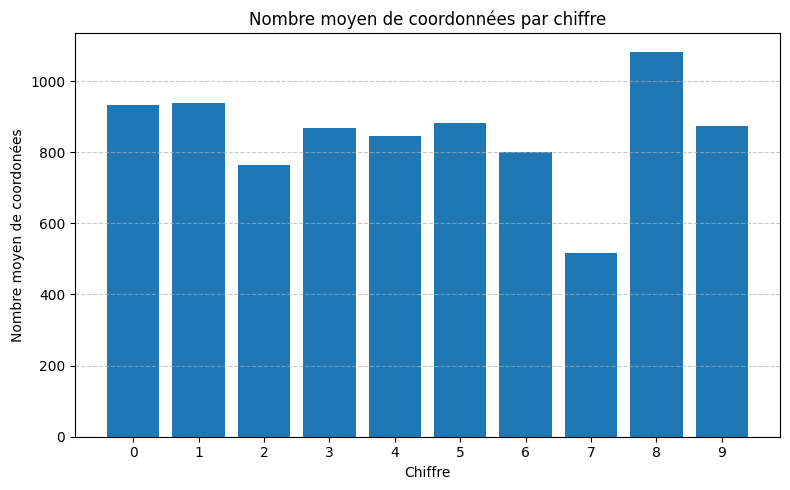

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_7912\4058359616.py:56: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test iter/user OUT : 1 ---
Exactitude split 1 : 99.00%

--- Test iter/user OUT : 2 ---
Exactitude split 2 : 89.00%

--- Test iter/user OUT : 3 ---
Exactitude split 3 : 100.00%

--- Test iter/user OUT : 4 ---
Exactitude split 4 : 100.00%

--- Test iter/user OUT : 5 ---
Exactitude split 5 : 88.00%

--- Test iter/user OUT : 6 ---
Exactitude split 6 : 69.00%

--- Test iter/user OUT : 7 ---
Exactitude split 7 : 92.00%

--- Test iter/user OUT : 8 ---
Exactitude split 8 : 94.00%

--- Test iter/user OUT : 9 ---
Exactitude split 9 : 100.00%

--- Test iter/user OUT : 10 ---
Exactitude split 10 : 90.00%

Exactitude globale KNN-DTW : 92.10%


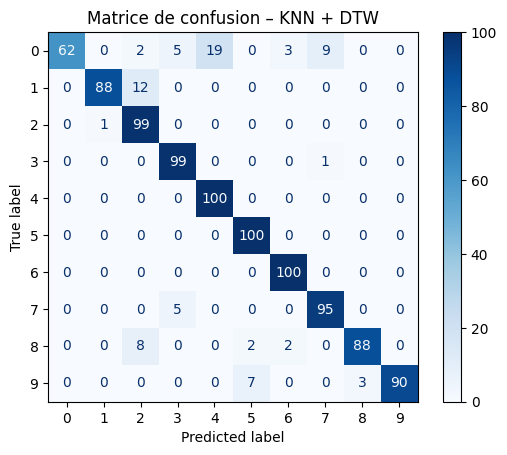

([np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64

In [2]:
### Chargement des données ###

import pandas as pd
import numpy as np
import re
from collections import Counter, defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
import seaborn as sns

df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 10+1):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


### Analyse exploratoire ###
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

### Standardisation ###
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


### Resampling à longueur fixe ###
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)

        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


### Dictionnaires user-out et iter-out ###
def dict_creation_iterout(df, iter_out):
    test_df = df[df["iter"] == iter_out]
    train_df = df[df["iter"] != iter_out]

    dict_train = defaultdict(list)
    dict_test = defaultdict(list)

    for (gesture, subject, iteration), group in train_df.groupby(["gesture", "subject", "iter"]):
        dict_train[gesture].append(group[["x_std", "y_std", "z_std"]].values.tolist())

    for (gesture, subject, iteration), group in test_df.groupby(["gesture", "subject", "iter"]):
        dict_test[gesture].append(group[["x_std", "y_std", "z_std"]].values.tolist())

    return dict_train, dict_test


def dict_creation_userout(df, subj_out):
    test_df = df[df["subject"] == subj_out]
    train_df = df[df["subject"] != subj_out]

    dict_train = defaultdict(list)
    dict_test = defaultdict(list)

    for (gesture, subject, iteration), group in train_df.groupby(["gesture", "subject", "iter"]):
        dict_train[gesture].append(group[["x_std", "y_std", "z_std"]].values.tolist())

    for (gesture, subject, iteration), group in test_df.groupby(["gesture", "subject", "iter"]):
        dict_test[gesture].append(group[["x_std", "y_std", "z_std"]].values.tolist())

    return dict_train, dict_test


### Distance Euclidienne ###
def eucl_dist(p1, p2):
    return np.sqrt((p1[0] - p2[0])**2 +
                   (p1[1] - p2[1])**2 +
                   (p1[2] - p2[2])**2)


### Distance DTW ###
def dtw_dist(seq1, seq2):
    n, m = len(seq1), len(seq2)
    dtw = np.full((n+1, m+1), np.inf)
    dtw[0, 0] = 0

    for i in range(1, n+1):
        for j in range(1, m+1):
            cost = eucl_dist(seq1[i-1], seq2[j-1])
            dtw[i, j] = cost + min(dtw[i-1, j],
                                   dtw[i, j-1],
                                   dtw[i-1, j-1])

    return dtw[n, m]


### KNN-DTW ###
def knn_dtw_predict(reference_seq, train_dict, k=7):
    distances = []

    for gesture, sequences in train_dict.items():
        for seq in sequences:
            dist = dtw_dist(reference_seq, seq)
            distances.append((gesture, dist))

    distances.sort(key=lambda x: x[1])
    k_nearest = distances[:k]

    votes = Counter([g for g, _ in k_nearest])
    return votes.most_common(1)[0][0]


### TEST DU MODELE ###
def testmodel(DictCreationFunc, df, loop_range=10, k=7):
    total_true = []
    total_pred = []

    for i in range(1, loop_range + 1):
        print(f"\n--- Test iter/user OUT : {i} ---")
        coord_train, coord_test = DictCreationFunc(df, i)

        y_true, y_pred = [], []

        for gesture, sequences in coord_test.items():
            for seq in sequences:
                pred = knn_dtw_predict(seq, coord_train, k=k)
                y_true.append(gesture)
                y_pred.append(pred)

        acc = accuracy_score(y_true, y_pred)
        total_true.extend(y_true)
        total_pred.extend(y_pred)
        print(f"Exactitude split {i} : {acc:.2%}")

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale KNN-DTW : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – KNN + DTW")
    plt.show()

    return total_true, total_pred


### Lancer un test ###
testmodel(dict_creation_userout, df100)
# testmodel(dict_creation_iterout, df100)

# dtw knn 3 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_8024\3325760422.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


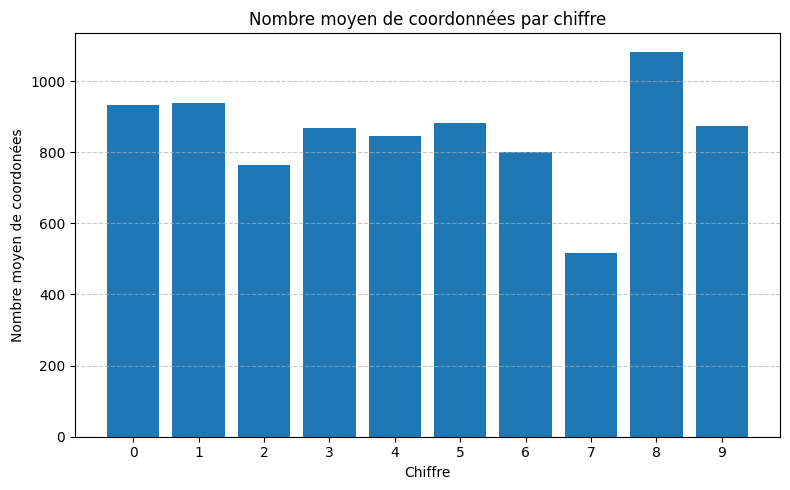

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_8024\3325760422.py:56: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test iter/user OUT : 1 ---
Exactitude split 1 : 96.00%

--- Test iter/user OUT : 2 ---
Exactitude split 2 : 90.00%

--- Test iter/user OUT : 3 ---
Exactitude split 3 : 100.00%

--- Test iter/user OUT : 4 ---
Exactitude split 4 : 100.00%

--- Test iter/user OUT : 5 ---
Exactitude split 5 : 89.00%

--- Test iter/user OUT : 6 ---
Exactitude split 6 : 70.00%

--- Test iter/user OUT : 7 ---
Exactitude split 7 : 95.00%

--- Test iter/user OUT : 8 ---
Exactitude split 8 : 94.00%

--- Test iter/user OUT : 9 ---
Exactitude split 9 : 100.00%

--- Test iter/user OUT : 10 ---
Exactitude split 10 : 90.00%

Exactitude globale KNN-DTW : 92.40%


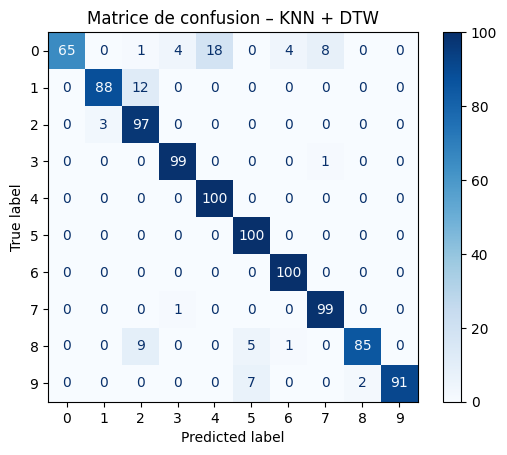

([np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64

In [1]:
### Chargement des données ###

import pandas as pd
import numpy as np
import re
from collections import Counter, defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
import seaborn as sns

df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 10+1):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


### Analyse exploratoire ###
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

### Standardisation ###
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


### Resampling à longueur fixe ###
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)

        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


### Dictionnaires user-out et iter-out ###
def dict_creation_iterout(df, iter_out):
    test_df = df[df["iter"] == iter_out]
    train_df = df[df["iter"] != iter_out]

    dict_train = defaultdict(list)
    dict_test = defaultdict(list)

    for (gesture, subject, iteration), group in train_df.groupby(["gesture", "subject", "iter"]):
        dict_train[gesture].append(group[["x_std", "y_std", "z_std"]].values.tolist())

    for (gesture, subject, iteration), group in test_df.groupby(["gesture", "subject", "iter"]):
        dict_test[gesture].append(group[["x_std", "y_std", "z_std"]].values.tolist())

    return dict_train, dict_test


def dict_creation_userout(df, subj_out):
    test_df = df[df["subject"] == subj_out]
    train_df = df[df["subject"] != subj_out]

    dict_train = defaultdict(list)
    dict_test = defaultdict(list)

    for (gesture, subject, iteration), group in train_df.groupby(["gesture", "subject", "iter"]):
        dict_train[gesture].append(group[["x_std", "y_std", "z_std"]].values.tolist())

    for (gesture, subject, iteration), group in test_df.groupby(["gesture", "subject", "iter"]):
        dict_test[gesture].append(group[["x_std", "y_std", "z_std"]].values.tolist())

    return dict_train, dict_test


### Distance Euclidienne ###
def eucl_dist(p1, p2):
    return np.sqrt((p1[0] - p2[0])**2 +
                   (p1[1] - p2[1])**2 +
                   (p1[2] - p2[2])**2)


### Distance DTW ###
def dtw_dist(seq1, seq2):
    n, m = len(seq1), len(seq2)
    dtw = np.full((n+1, m+1), np.inf)
    dtw[0, 0] = 0

    for i in range(1, n+1):
        for j in range(1, m+1):
            cost = eucl_dist(seq1[i-1], seq2[j-1])
            dtw[i, j] = cost + min(dtw[i-1, j],
                                   dtw[i, j-1],
                                   dtw[i-1, j-1])

    return dtw[n, m]


### KNN-DTW ###
def knn_dtw_predict(reference_seq, train_dict, k=3):
    distances = []

    for gesture, sequences in train_dict.items():
        for seq in sequences:
            dist = dtw_dist(reference_seq, seq)
            distances.append((gesture, dist))

    distances.sort(key=lambda x: x[1])
    k_nearest = distances[:k]

    votes = Counter([g for g, _ in k_nearest])
    return votes.most_common(1)[0][0]


### TEST DU MODELE ###
def testmodel(DictCreationFunc, df, loop_range=10, k=3):
    total_true = []
    total_pred = []

    for i in range(1, loop_range + 1):
        print(f"\n--- Test iter/user OUT : {i} ---")
        coord_train, coord_test = DictCreationFunc(df, i)

        y_true, y_pred = [], []

        for gesture, sequences in coord_test.items():
            for seq in sequences:
                pred = knn_dtw_predict(seq, coord_train, k=k)
                y_true.append(gesture)
                y_pred.append(pred)

        acc = accuracy_score(y_true, y_pred)
        total_true.extend(y_true)
        total_pred.extend(y_pred)
        print(f"Exactitude split {i} : {acc:.2%}")

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale KNN-DTW : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – KNN + DTW")
    plt.show()

    return total_true, total_pred


### Lancer un test ###
testmodel(dict_creation_userout, df100)
# testmodel(dict_creation_iterout, df100)

#etdit distanvc test final


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_19932\1382499791.py:21: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


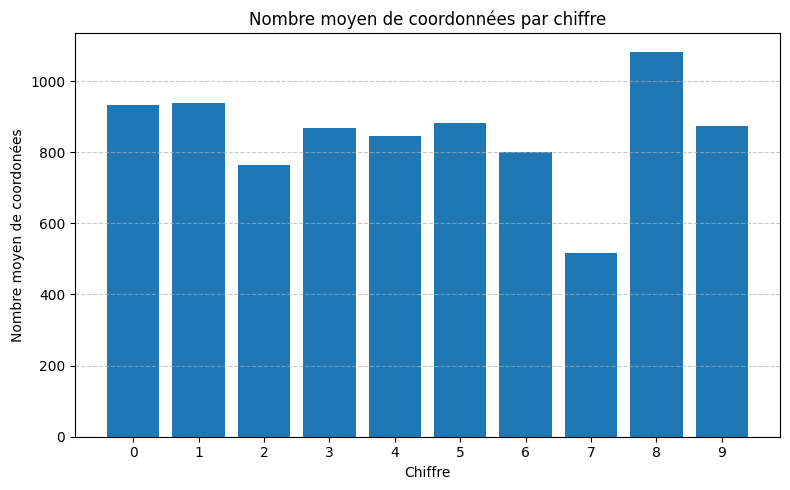

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_19932\1382499791.py:56: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test iter/user OUT : 1 ---
Exactitude split 1 : 98.00%

--- Test iter/user OUT : 2 ---
Exactitude split 2 : 81.00%

--- Test iter/user OUT : 3 ---
Exactitude split 3 : 98.00%

--- Test iter/user OUT : 4 ---
Exactitude split 4 : 100.00%

--- Test iter/user OUT : 5 ---
Exactitude split 5 : 86.00%

--- Test iter/user OUT : 6 ---
Exactitude split 6 : 72.00%

--- Test iter/user OUT : 7 ---
Exactitude split 7 : 86.00%

--- Test iter/user OUT : 8 ---
Exactitude split 8 : 96.00%

--- Test iter/user OUT : 9 ---
Exactitude split 9 : 97.00%

--- Test iter/user OUT : 10 ---
Exactitude split 10 : 89.00%

Exactitude globale KNN-EditDistance : 90.30%


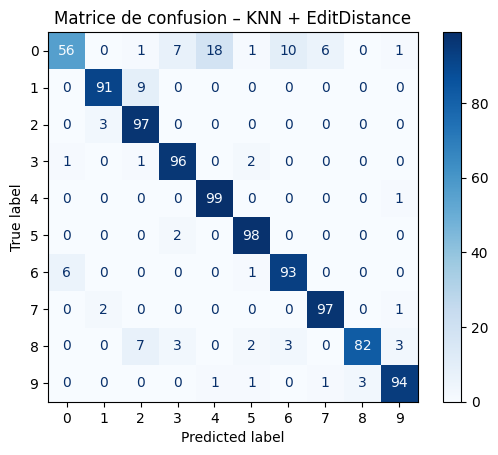

([np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64

In [ ]:
import pandas as pd
import numpy as np
from collections import Counter, defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# Création du DataFrame vide
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

# Chargement des fichiers
for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


### Analyse exploratoire ###
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")


### Standardisation ###
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


### Resampling à longueur fixe ###
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)

        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


### Vector Quantization pour convertir points 3D en symboles ###
all_points = df100[['x_std','y_std','z_std']].values
k_clusters = 50
kmeans = KMeans(n_clusters=k_clusters, random_state=42)
kmeans.fit(all_points)

def assign_symbol(row):
    point = np.array([row['x_std'], row['y_std'], row['z_std']])
    cluster_idx = kmeans.predict([point])[0]
    return chr(ord('A') + cluster_idx % 26)

df100['symbol'] = df100.apply(assign_symbol, axis=1)


### Convertir chaque gesture en séquence de symboles ###
def gesture_to_sequence(df):
    seq_dict = defaultdict(list)
    for (gesture, subject, iteration), group in df.groupby(['gesture','subject','iter']):
        seq = ''.join(group['symbol'].tolist())
        seq_dict[gesture].append(seq)
    return seq_dict


### Crée les dictionnaires train/test ### # pas meme dico car cleui la retourne des symbole AAAAOOOCC (par rapport dico dtw retpourne sequence de ppint en 3d)
def dict_creation_iterout(df, iter_out):
    test_df = df[df["iter"] == iter_out]
    train_df = df[df["iter"] != iter_out]
    return gesture_to_sequence(train_df), gesture_to_sequence(test_df)

def dict_creation_userout(df, subj_out):
    test_df = df[df["subject"] == subj_out]
    train_df = df[df["subject"] != subj_out]
    return gesture_to_sequence(train_df), gesture_to_sequence(test_df)


### Edit distance classique ###
def edit_distance(s1, s2):
    n, m = len(s1), len(s2)
    matrix = [[0]*(m+1) for _ in range(n+1)]
    for i in range(n+1):
        matrix[i][0] = i
    for j in range(m+1):
        matrix[0][j] = j
    for i in range(1,n+1):
        for j in range(1,m+1):
            cost = 0 if s1[i-1] == s2[j-1] else 1
            matrix[i][j] = min(
                matrix[i-1][j-1]+cost,  # substitution
                matrix[i][j-1]+1,       # insertion
                matrix[i-1][j]+1        # deletion
            )
    return matrix[n][m]


### KNN basé sur edit distance ###
def knn_edit_predict(seq, train_dict, k=3):
    distances = []
    for gesture, sequences in train_dict.items():
        for s in sequences:
            d = edit_distance(seq, s)
            distances.append((gesture, d))
    distances.sort(key=lambda x: x[1])
    k_nearest = distances[:k]
    votes = Counter([g for g,_ in k_nearest])
    return votes.most_common(1)[0][0]


### TEST DU MODELE ###
def testmodel(DictCreationFunc, df, loop_range=10, k=3):
    total_true = []
    total_pred = []

    for i in range(1, loop_range + 1):
        print(f"\n--- Test iter/user OUT : {i} ---")
        coord_train, coord_test = DictCreationFunc(df, i)

        y_true, y_pred = [], []

        for gesture, sequences in coord_test.items():
            for seq in sequences:
                pred = knn_edit_predict(seq, coord_train, k=k)
                y_true.append(gesture)
                y_pred.append(pred)

        acc = accuracy_score(y_true, y_pred)
        total_true.extend(y_true)
        total_pred.extend(y_pred)
        print(f"Exactitude split {i} : {acc:.2%}")

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale KNN-EditDistance : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – KNN + EditDistance")
    plt.show()

    return total_true, total_pred


### Lancer un test ###
testmodel(dict_creation_userout, df100)
# testmodel(dict_creation_iterout, df100)

# edit distanc knn 3 cluser 50 cross valid et clustering dedans 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_10216\2331573405.py:24: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])
C:\Users\Isadiki\AppData\Local\Temp\ipykernel_10216\2331573405.py:36: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(["subject", "gesture", "iter"], group_keys=False).apply(standardize_gesture)



=== TEST OUT : 1 ===
Exactitude split 1 : 98.00%

=== TEST OUT : 2 ===
Exactitude split 2 : 86.00%

=== TEST OUT : 3 ===
Exactitude split 3 : 91.00%

=== TEST OUT : 4 ===
Exactitude split 4 : 100.00%

=== TEST OUT : 5 ===
Exactitude split 5 : 86.00%

=== TEST OUT : 6 ===
Exactitude split 6 : 64.00%

=== TEST OUT : 7 ===
Exactitude split 7 : 89.00%

=== TEST OUT : 8 ===
Exactitude split 8 : 93.00%

=== TEST OUT : 9 ===
Exactitude split 9 : 98.00%

=== TEST OUT : 10 ===
Exactitude split 10 : 88.00%

=== EXACTITUDE GLOBALE : 89.30% ===


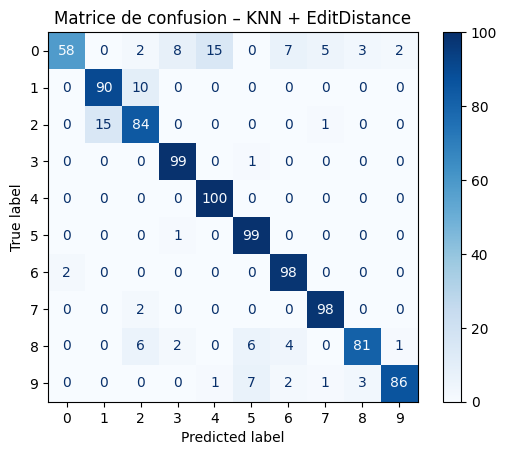

([np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64

In [3]:
import pandas as pd
import numpy as np
from collections import Counter, defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d


# ===========================================================
#               CHARGEMENT ET PREPARATION
# ===========================================================

df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f"Domain1_csv/Subject{subject}-{number}-{iteration}.csv"
            file = pd.read_csv(filename)
            file["gesture"] = number
            file["subject"] = subject
            file["iter"] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']


# ---------- Standardisation ----------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f"{axis}_std"] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(["subject", "gesture", "iter"], group_keys=False).apply(standardize_gesture)



# ---------- Resampling à longueur fixe ----------
def resample_gesture(df, target_len=100):

    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(["gesture", "subject", "iter"]):

        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)

        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            "gesture": [gesture]*target_len,
            "subject": [subject]*target_len,
            "iter": [iteration]*target_len,
            "x_std": interp("x_std"),
            "y_std": interp("y_std"),
            "z_std": interp("z_std")
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


# ===========================================================
#                SEQUENCES DE SYMBOLES
# ===========================================================

def gesture_to_sequence(df):
    seq_dict = defaultdict(list)
    for (gesture, subject, iteration), group in df.groupby(["gesture", "subject", "iter"]):
        seq = "".join(group["symbol"].tolist())
        seq_dict[gesture].append(seq)
    return seq_dict


# ===========================================================
#         CREATION TRAIN/TEST SANS SYMBOLS (CROSS-VAL)
# ===========================================================

def dict_creation_iterout(df, iter_out):
    test_df = df[df["iter"] == iter_out]
    train_df = df[df["iter"] != iter_out]
    return train_df, test_df

def dict_creation_userout(df, subj_out):
    test_df = df[df["subject"] == subj_out]
    train_df = df[df["subject"] != subj_out]
    return train_df, test_df


# ===========================================================
#             CLUSTERING DANS LA CROSS-VALIDATION
# ===========================================================

def cluster_and_convert(df_train, df_test, k_clusters=50):

    # ---- Fit KMeans sur train ----
    train_points = df_train[['x_std', 'y_std', 'z_std']].values
    kmeans = KMeans(n_clusters=k_clusters, random_state=42)
    kmeans.fit(train_points)

    # ---- Attribuer les symboles ----
    def assign_symbols(df_local):
        pts = df_local[['x_std', 'y_std', 'z_std']].values
        clusters = kmeans.predict(pts)
        symbols = [chr(ord('A') + (c % 26)) for c in clusters]
        df_local = df_local.copy()
        df_local["symbol"] = symbols
        return df_local

    train_sym = assign_symbols(df_train)
    test_sym = assign_symbols(df_test)

    # ---- Convertir en chaînes ----
    return gesture_to_sequence(train_sym), gesture_to_sequence(test_sym)



# ===========================================================
#                    EDIT DISTANCE
# ===========================================================

def edit_distance(s1, s2):
    n, m = len(s1), len(s2)
    M = [[0]*(m+1) for _ in range(n+1)]

    for i in range(n+1): M[i][0] = i
    for j in range(m+1): M[0][j] = j

    for i in range(1, n+1):
        for j in range(1, m+1):
            cost = 0 if s1[i-1] == s2[j-1] else 1
            M[i][j] = min(
                M[i-1][j] + 1,
                M[i][j-1] + 1,
                M[i-1][j-1] + cost
            )

    return M[n][m]


# ===========================================================
#                     KNN EDIT DISTANCE
# ===========================================================

def knn_edit_predict(seq, train_dict, k=3):

    distances = []

    for gesture, sequences in train_dict.items():
        for s in sequences:
            d = edit_distance(seq, s)
            distances.append((gesture, d))

    distances.sort(key=lambda x: x[1])
    k_nearest = distances[:k]
    votes = Counter([g for g, _ in k_nearest])

    return votes.most_common(1)[0][0]


# ===========================================================
#                       TEST FINAL
# ===========================================================

def testmodel(DictCreationFunc, df, loop_range=10, k=3, k_clusters=50):

    total_true = []
    total_pred = []

    for i in range(1, loop_range+1):

        print(f"\n=== TEST OUT : {i} ===")

        # Split train/test
        train_df, test_df = DictCreationFunc(df, i)

        # Clustering + symbolisation
        coord_train, coord_test = cluster_and_convert(train_df, test_df, k_clusters)

        y_true, y_pred = [], []

        # KNN
        for gesture, sequences in coord_test.items():
            for seq in sequences:
                pred = knn_edit_predict(seq, coord_train, k=k)
                y_true.append(gesture)
                y_pred.append(pred)

        acc = accuracy_score(y_true, y_pred)
        print(f"Exactitude split {i} : {acc:.2%}")

        total_true.extend(y_true)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\n=== EXACTITUDE GLOBALE : {final_acc:.2%} ===")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – KNN + EditDistance")
    plt.show()

    return total_true, total_pred



# ===========================================================
#                   LANCEMENT DU TEST
# ===========================================================

testmodel(dict_creation_userout, df100)
# testmodel(dict_creation_iterout, df100)

#edti distancre cluster 40

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_4980\2247576011.py:21: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


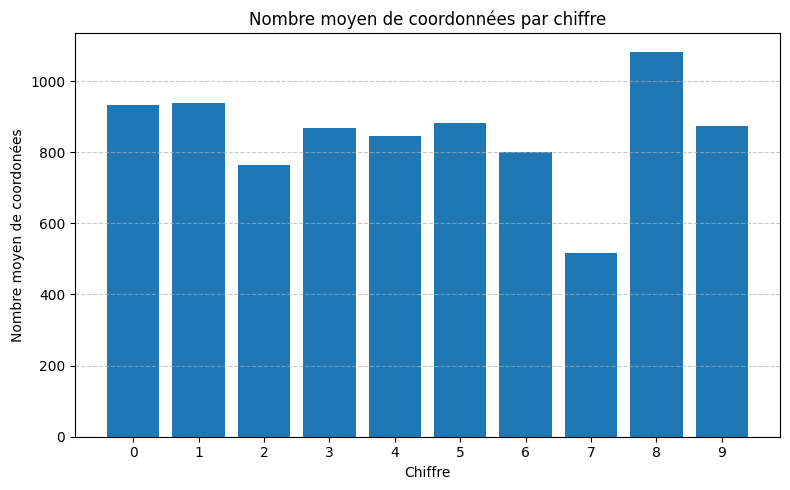

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_4980\2247576011.py:56: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test iter/user OUT : 1 ---
Exactitude split 1 : 95.00%

--- Test iter/user OUT : 2 ---
Exactitude split 2 : 87.00%

--- Test iter/user OUT : 3 ---
Exactitude split 3 : 97.00%

--- Test iter/user OUT : 4 ---
Exactitude split 4 : 100.00%

--- Test iter/user OUT : 5 ---
Exactitude split 5 : 84.00%

--- Test iter/user OUT : 6 ---
Exactitude split 6 : 68.00%

--- Test iter/user OUT : 7 ---
Exactitude split 7 : 88.00%

--- Test iter/user OUT : 8 ---
Exactitude split 8 : 96.00%

--- Test iter/user OUT : 9 ---
Exactitude split 9 : 96.00%

--- Test iter/user OUT : 10 ---
Exactitude split 10 : 88.00%

Exactitude globale KNN-EditDistance : 89.90%


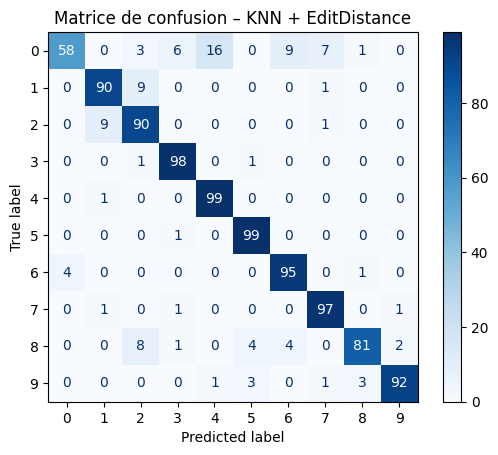

([np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64

In [1]:
import pandas as pd
import numpy as np
from collections import Counter, defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# Création du DataFrame vide
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

# Chargement des fichiers
for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


### Analyse exploratoire ###
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")


### Standardisation ###
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


### Resampling à longueur fixe ###
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)

        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


### Vector Quantization pour convertir points 3D en symboles ###
all_points = df100[['x_std','y_std','z_std']].values
k_clusters = 40
kmeans = KMeans(n_clusters=k_clusters, random_state=42)
kmeans.fit(all_points)

def assign_symbol(row):
    point = np.array([row['x_std'], row['y_std'], row['z_std']])
    cluster_idx = kmeans.predict([point])[0]
    return chr(ord('A') + cluster_idx % 26)

df100['symbol'] = df100.apply(assign_symbol, axis=1)


### Convertir chaque gesture en séquence de symboles ###
def gesture_to_sequence(df):
    seq_dict = defaultdict(list)
    for (gesture, subject, iteration), group in df.groupby(['gesture','subject','iter']):
        seq = ''.join(group['symbol'].tolist())
        seq_dict[gesture].append(seq)
    return seq_dict


### Crée les dictionnaires train/test ### # pas meme dico car cleui la retourne des symbole AAAAOOOCC (par rapport dico dtw retpourne sequence de ppint en 3d)
def dict_creation_iterout(df, iter_out):
    test_df = df[df["iter"] == iter_out]
    train_df = df[df["iter"] != iter_out]
    return gesture_to_sequence(train_df), gesture_to_sequence(test_df)

def dict_creation_userout(df, subj_out):
    test_df = df[df["subject"] == subj_out]
    train_df = df[df["subject"] != subj_out]
    return gesture_to_sequence(train_df), gesture_to_sequence(test_df)


### Edit distance classique ###
def edit_distance(s1, s2):
    n, m = len(s1), len(s2)
    matrix = [[0]*(m+1) for _ in range(n+1)]
    for i in range(n+1):
        matrix[i][0] = i
    for j in range(m+1):
        matrix[0][j] = j
    for i in range(1,n+1):
        for j in range(1,m+1):
            cost = 0 if s1[i-1] == s2[j-1] else 1
            matrix[i][j] = min(
                matrix[i-1][j-1]+cost,  # substitution
                matrix[i][j-1]+1,       # insertion
                matrix[i-1][j]+1        # deletion
            )
    return matrix[n][m]


### KNN basé sur edit distance ###
def knn_edit_predict(seq, train_dict, k=3):
    distances = []
    for gesture, sequences in train_dict.items():
        for s in sequences:
            d = edit_distance(seq, s)
            distances.append((gesture, d))
    distances.sort(key=lambda x: x[1])
    k_nearest = distances[:k]
    votes = Counter([g for g,_ in k_nearest])
    return votes.most_common(1)[0][0]


### TEST DU MODELE ###
def testmodel(DictCreationFunc, df, loop_range=10, k=3):
    total_true = []
    total_pred = []

    for i in range(1, loop_range + 1):
        print(f"\n--- Test iter/user OUT : {i} ---")
        coord_train, coord_test = DictCreationFunc(df, i)

        y_true, y_pred = [], []

        for gesture, sequences in coord_test.items():
            for seq in sequences:
                pred = knn_edit_predict(seq, coord_train, k=k)
                y_true.append(gesture)
                y_pred.append(pred)

        acc = accuracy_score(y_true, y_pred)
        total_true.extend(y_true)
        total_pred.extend(y_pred)
        print(f"Exactitude split {i} : {acc:.2%}")

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale KNN-EditDistance : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – KNN + EditDistance")
    plt.show()

    return total_true, total_pred


### Lancer un test ###
testmodel(dict_creation_userout, df100)
# testmodel(dict_creation_iterout, df100)

#edit distance final tets cmuster 5

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_13680\2050745568.py:21: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


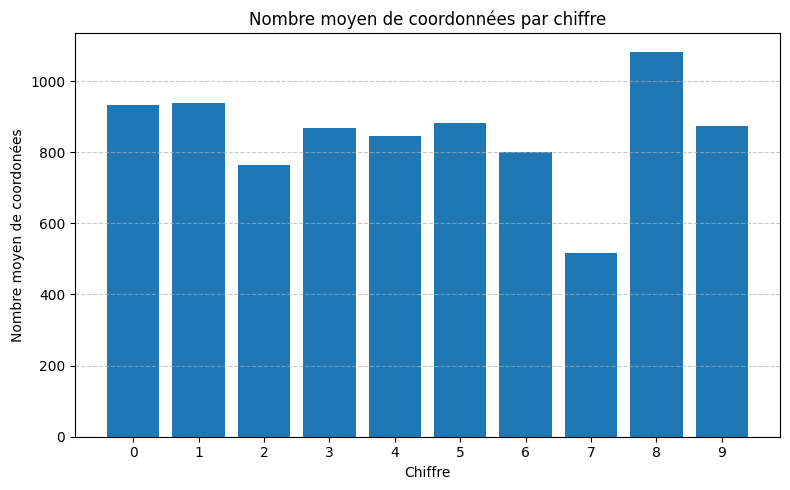

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_13680\2050745568.py:56: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test iter/user OUT : 1 ---
Exactitude split 1 : 89.00%

--- Test iter/user OUT : 2 ---
Exactitude split 2 : 76.00%

--- Test iter/user OUT : 3 ---
Exactitude split 3 : 87.00%

--- Test iter/user OUT : 4 ---
Exactitude split 4 : 92.00%

--- Test iter/user OUT : 5 ---
Exactitude split 5 : 74.00%

--- Test iter/user OUT : 6 ---
Exactitude split 6 : 58.00%

--- Test iter/user OUT : 7 ---
Exactitude split 7 : 86.00%

--- Test iter/user OUT : 8 ---
Exactitude split 8 : 94.00%

--- Test iter/user OUT : 9 ---
Exactitude split 9 : 87.00%

--- Test iter/user OUT : 10 ---
Exactitude split 10 : 80.00%

Exactitude globale KNN-EditDistance : 82.30%


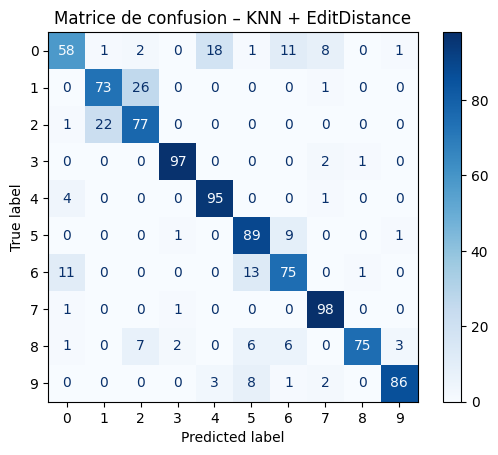

([np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64

In [2]:
import pandas as pd
import numpy as np
from collections import Counter, defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# Création du DataFrame vide
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

# Chargement des fichiers
for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


### Analyse exploratoire ###
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# stndardisation global car mieux aue local ici 
### Standardisation ###
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


### Resampling à longueur fixe ###
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)

        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


### Vector Quantization pour convertir points 3D en symboles ###  # si cluster nmbre petit (5) :Beaucoup de points différents se retrouvent dans le même cluster : sequence : AAABBCCC > tres compresseet rapide mais perte information donc precision diminue 
# alors que lcuster 50 :Chaque forme locale a son propre symbole et La séquence est plus complexe : ADKFHS > Plus d’information > plus long > Mais meilleure précision
# ccl: 5–10 clusters → très rapide, un peu moins précis ,10–20 → bon compromis ,30–50 → très détaillé, mais lent
all_points = df100[['x_std','y_std','z_std']].values
k_clusters = 5
kmeans = KMeans(n_clusters=k_clusters, random_state=42) # 42 nombre aleatoire qui n a pas de signification donc est une valeur par defaut donc mettrait 1,10000 change rien
kmeans.fit(all_points)

def assign_symbol(row):
    point = np.array([row['x_std'], row['y_std'], row['z_std']])
    cluster_idx = kmeans.predict([point])[0]
    return chr(ord('A') + cluster_idx % 26) # car a 26 lettre dans l alphabet car ici convertis cghaque cluster en lettre 

df100['symbol'] = df100.apply(assign_symbol, axis=1)
#  donc :Ex : K = 50 clusters > Alors les indices :0 → A,1 → B,25 → Z,26 → A (26 % 26),27 → B (27 % 26) alors que si cluster : 5 > cluster_idx = 0  → 'A',cluster_idx = 1  → 'B',cluster_idx = 2  → 'C',cluster_idx = 25 → 'Z'
#sol a faire donc autre raison avoir k < 26 : car si k > 26 : Parce que deux clusters différents auront la même lettre donc 1)Ça écrase de l’information !,2)L’Edit Distance devient moins discriminant > ccl : Si K > 26, collisions ! À éviter
### Convertir chaque gesture en séquence de symboles ###
def gesture_to_sequence(df):
    seq_dict = defaultdict(list)
    for (gesture, subject, iteration), group in df.groupby(['gesture','subject','iter']):
        seq = ''.join(group['symbol'].tolist())
        seq_dict[gesture].append(seq)
    return seq_dict


### Crée les dictionnaires train/test ### # pas meme dico car cleui la retourne des symbole AAAAOOOCC (par rapport dico dtw retpourne sequence de ppint en 3d)
def dict_creation_iterout(df, iter_out):
    test_df = df[df["iter"] == iter_out]
    train_df = df[df["iter"] != iter_out]
    return gesture_to_sequence(train_df), gesture_to_sequence(test_df)

def dict_creation_userout(df, subj_out):
    test_df = df[df["subject"] == subj_out]
    train_df = df[df["subject"] != subj_out]
    return gesture_to_sequence(train_df), gesture_to_sequence(test_df)


### Edit distance classique ###
def edit_distance(s1, s2):
    n, m = len(s1), len(s2)
    matrix = [[0]*(m+1) for _ in range(n+1)]
    for i in range(n+1):
        matrix[i][0] = i
    for j in range(m+1):
        matrix[0][j] = j
    for i in range(1,n+1):
        for j in range(1,m+1):
            cost = 0 if s1[i-1] == s2[j-1] else 1
            matrix[i][j] = min(
                matrix[i-1][j-1]+cost,  # substitution
                matrix[i][j-1]+1,       # insertion
                matrix[i-1][j]+1        # deletion
            )
    return matrix[n][m]


### KNN basé sur edit distance ###
def knn_edit_predict(seq, train_dict, k=3):
    distances = []
    for gesture, sequences in train_dict.items():
        for s in sequences:
            d = edit_distance(seq, s)
            distances.append((gesture, d))
    distances.sort(key=lambda x: x[1])
    k_nearest = distances[:k]
    votes = Counter([g for g,_ in k_nearest])
    return votes.most_common(1)[0][0]


### TEST DU MODELE ###
def testmodel(DictCreationFunc, df, loop_range=10, k=3):
    total_true = []
    total_pred = []

    for i in range(1, loop_range + 1):
        print(f"\n--- Test iter/user OUT : {i} ---")
        coord_train, coord_test = DictCreationFunc(df, i)

        y_true, y_pred = [], []

        for gesture, sequences in coord_test.items():
            for seq in sequences:
                pred = knn_edit_predict(seq, coord_train, k=k)
                y_true.append(gesture)
                y_pred.append(pred)

        acc = accuracy_score(y_true, y_pred)
        total_true.extend(y_true)
        total_pred.extend(y_pred)
        print(f"Exactitude split {i} : {acc:.2%}")

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale KNN-EditDistance : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – KNN + EditDistance")
    plt.show()

    return total_true, total_pred


### Lancer un test ###
testmodel(dict_creation_userout, df100)
# testmodel(dict_creation_iterout, df100)

#edit distance cluster 10

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_13680\3281744713.py:21: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


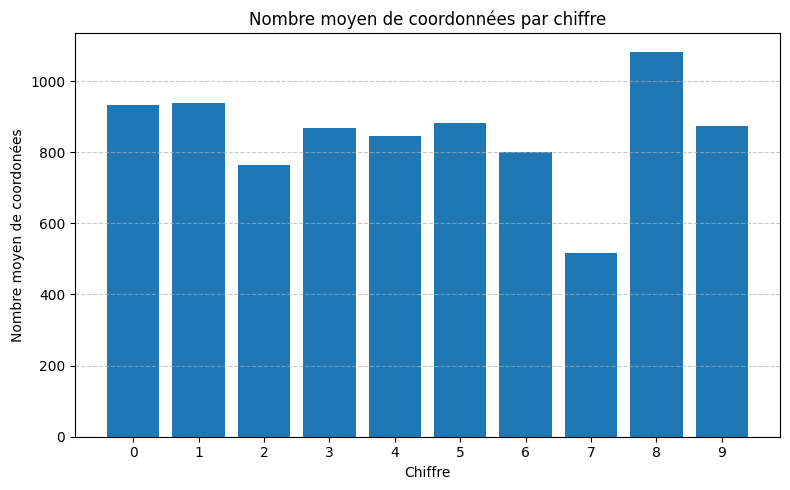

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_13680\3281744713.py:56: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test iter/user OUT : 1 ---
Exactitude split 1 : 98.00%

--- Test iter/user OUT : 2 ---
Exactitude split 2 : 83.00%

--- Test iter/user OUT : 3 ---
Exactitude split 3 : 96.00%

--- Test iter/user OUT : 4 ---
Exactitude split 4 : 99.00%

--- Test iter/user OUT : 5 ---
Exactitude split 5 : 81.00%

--- Test iter/user OUT : 6 ---
Exactitude split 6 : 72.00%

--- Test iter/user OUT : 7 ---
Exactitude split 7 : 84.00%

--- Test iter/user OUT : 8 ---
Exactitude split 8 : 96.00%

--- Test iter/user OUT : 9 ---
Exactitude split 9 : 90.00%

--- Test iter/user OUT : 10 ---
Exactitude split 10 : 85.00%

Exactitude globale KNN-EditDistance : 88.40%


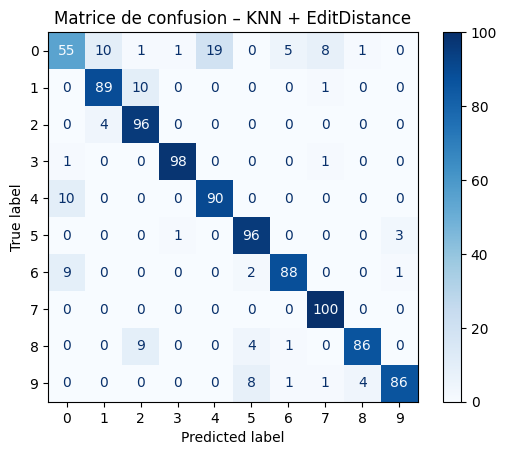

([np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64

In [3]:
import pandas as pd
import numpy as np
from collections import Counter, defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# Création du DataFrame vide
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

# Chargement des fichiers
for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


### Analyse exploratoire ###
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# stndardisation global car mieux aue local ici 
### Standardisation ###
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


### Resampling à longueur fixe ###
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)

        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


### Vector Quantization pour convertir points 3D en symboles ###  # si cluster nmbre petit (5) :Beaucoup de points différents se retrouvent dans le même cluster : sequence : AAABBCCC > tres compresseet rapide mais perte information donc precision diminue 
# alors que lcuster 50 :Chaque forme locale a son propre symbole et La séquence est plus complexe : ADKFHS > Plus d’information > plus long > Mais meilleure précision
# ccl: 5–10 clusters → très rapide, un peu moins précis ,10–20 → bon compromis ,30–50 → très détaillé, mais lent
all_points = df100[['x_std','y_std','z_std']].values
k_clusters = 10
kmeans = KMeans(n_clusters=k_clusters, random_state=42) # 42 nombre aleatoire qui n a pas de signification donc est une valeur par defaut donc mettrait 1,10000 change rien
kmeans.fit(all_points)
# kmeans est type clustering nin hierarvchise et non supervise car hieracrhice c est arbe ou faut crrer un dendogramme 
# etape : tu collectes tous les points 3D de tes gestes (x_std, y_std, z_std),tu fais un K-Means sur ces points,K-Means va créer k_clusters groupes,chaque groupe est décrit par un centroïde (= un point 3D moyen),un clustering de type centroid-based
def assign_symbol(row):
    point = np.array([row['x_std'], row['y_std'], row['z_std']])
    cluster_idx = kmeans.predict([point])[0]
    return chr(ord('A') + cluster_idx % 26) # car a 26 lettre dans l alphabet car ici convertis cghaque cluster en lettre 

df100['symbol'] = df100.apply(assign_symbol, axis=1)
#  donc :Ex : K = 50 clusters > Alors les indices :0 → A,1 → B,25 → Z,26 → A (26 % 26),27 → B (27 % 26) alors que si cluster : 5 > cluster_idx = 0  → 'A',cluster_idx = 1  → 'B',cluster_idx = 2  → 'C',cluster_idx = 25 → 'Z'
#sol a faire donc autre raison avoir k < 26 : car si k > 26 : Parce que deux clusters différents auront la même lettre donc 1)Ça écrase de l’information !,2)L’Edit Distance devient moins discriminant > ccl : Si K > 26, collisions ! À éviter
# ccl : ideal cluster 10 ou 15
### Convertir chaque gesture en séquence de symboles ###
def gesture_to_sequence(df):
    seq_dict = defaultdict(list)
    for (gesture, subject, iteration), group in df.groupby(['gesture','subject','iter']):
        seq = ''.join(group['symbol'].tolist())
        seq_dict[gesture].append(seq)
    return seq_dict
# cela rassemble chaque gest en chaine de lettre : ["a","b","c"] > "abc" > chaque geste devient une chaîne de lettres, prête pour Edit Distance / LCS

### Crée les dictionnaires train/test ### # pas meme dico car cleui la retourne des symbole AAAAOOOCC (par rapport dico dtw retpourne sequence de ppint en 3d)
def dict_creation_iterout(df, iter_out):
    test_df = df[df["iter"] == iter_out]
    train_df = df[df["iter"] != iter_out]
    return gesture_to_sequence(train_df), gesture_to_sequence(test_df)

def dict_creation_userout(df, subj_out):
    test_df = df[df["subject"] == subj_out]
    train_df = df[df["subject"] != subj_out]
    return gesture_to_sequence(train_df), gesture_to_sequence(test_df)


### Edit distance classique ###
def edit_distance(s1, s2):
    n, m = len(s1), len(s2)
    matrix = [[0]*(m+1) for _ in range(n+1)]
    for i in range(n+1):
        matrix[i][0] = i
    for j in range(m+1):
        matrix[0][j] = j
    for i in range(1,n+1):
        for j in range(1,m+1):
            cost = 0 if s1[i-1] == s2[j-1] else 1
            matrix[i][j] = min(
                matrix[i-1][j-1]+cost,  # substitution
                matrix[i][j-1]+1,       # insertion
                matrix[i-1][j]+1        # deletion
            )
    return matrix[n][m]


### KNN basé sur edit distance ###
def knn_edit_predict(seq, train_dict, k=3):
    distances = []
    for gesture, sequences in train_dict.items():
        for s in sequences:
            d = edit_distance(seq, s)
            distances.append((gesture, d))
    distances.sort(key=lambda x: x[1])
    k_nearest = distances[:k]
    votes = Counter([g for g,_ in k_nearest])
    return votes.most_common(1)[0][0]


### TEST DU MODELE ###
def testmodel(DictCreationFunc, df, loop_range=10, k=3):
    total_true = []
    total_pred = []

    for i in range(1, loop_range + 1):
        print(f"\n--- Test iter/user OUT : {i} ---")
        coord_train, coord_test = DictCreationFunc(df, i)

        y_true, y_pred = [], []

        for gesture, sequences in coord_test.items():
            for seq in sequences:
                pred = knn_edit_predict(seq, coord_train, k=k)
                y_true.append(gesture)
                y_pred.append(pred)

        acc = accuracy_score(y_true, y_pred)
        total_true.extend(y_true)
        total_pred.extend(y_pred)
        print(f"Exactitude split {i} : {acc:.2%}")

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale KNN-EditDistance : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – KNN + EditDistance")
    plt.show()

    return total_true, total_pred


### Lancer un test ###
testmodel(dict_creation_userout, df100)
# testmodel(dict_creation_iterout, df100)

# edity ditance cluster 20

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_13680\1092335429.py:21: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


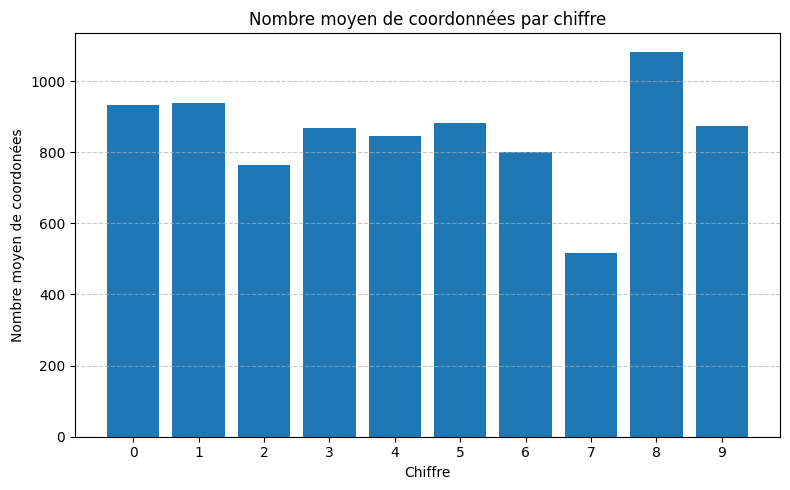

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_13680\1092335429.py:56: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test iter/user OUT : 1 ---
Exactitude split 1 : 91.00%

--- Test iter/user OUT : 2 ---
Exactitude split 2 : 86.00%

--- Test iter/user OUT : 3 ---
Exactitude split 3 : 98.00%

--- Test iter/user OUT : 4 ---
Exactitude split 4 : 98.00%

--- Test iter/user OUT : 5 ---
Exactitude split 5 : 85.00%

--- Test iter/user OUT : 6 ---
Exactitude split 6 : 77.00%

--- Test iter/user OUT : 7 ---
Exactitude split 7 : 87.00%

--- Test iter/user OUT : 8 ---
Exactitude split 8 : 97.00%

--- Test iter/user OUT : 9 ---
Exactitude split 9 : 100.00%

--- Test iter/user OUT : 10 ---
Exactitude split 10 : 91.00%

Exactitude globale KNN-EditDistance : 91.00%


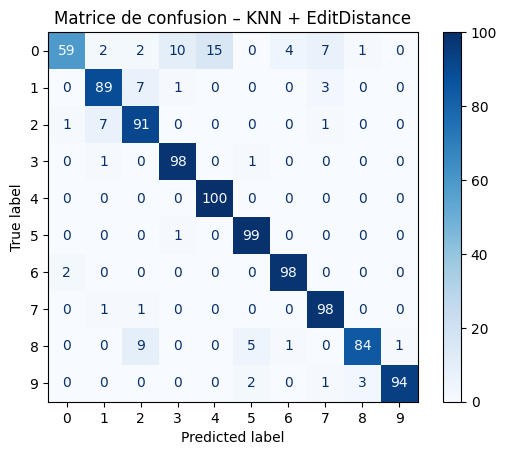

([np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64

In [5]:
import pandas as pd
import numpy as np
from collections import Counter, defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# Création du DataFrame vide
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

# Chargement des fichiers
for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


### Analyse exploratoire ###
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# stndardisation global car mieux aue local ici 
### Standardisation ###
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


### Resampling à longueur fixe ###
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)

        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


### Vector Quantization pour convertir points 3D en symboles ###  # si cluster nmbre petit (5) :Beaucoup de points différents se retrouvent dans le même cluster : sequence : AAABBCCC > tres compresseet rapide mais perte information donc precision diminue 
# alors que lcuster 50 :Chaque forme locale a son propre symbole et La séquence est plus complexe : ADKFHS > Plus d’information > plus long > Mais meilleure précision
# ccl: 5–10 clusters → très rapide, un peu moins précis ,10–20 → bon compromis ,30–50 → très détaillé, mais lent
all_points = df100[['x_std','y_std','z_std']].values
k_clusters = 20
kmeans = KMeans(n_clusters=k_clusters, random_state=42) # 42 nombre aleatoire qui n a pas de signification donc est une valeur par defaut donc mettrait 1,10000 change rien
kmeans.fit(all_points)
# kmeans est type clustering nin hierarvchise et non supervise car hieracrhice c est arbe ou faut crrer un dendogramme 
# etape : tu collectes tous les points 3D de tes gestes (x_std, y_std, z_std),tu fais un K-Means sur ces points,K-Means va créer k_clusters groupes,chaque groupe est décrit par un centroïde (= un point 3D moyen),un clustering de type centroid-based
def assign_symbol(row):
    point = np.array([row['x_std'], row['y_std'], row['z_std']])
    cluster_idx = kmeans.predict([point])[0]
    return chr(ord('A') + cluster_idx % 26) # car a 26 lettre dans l alphabet car ici convertis cghaque cluster en lettre 

df100['symbol'] = df100.apply(assign_symbol, axis=1)
#  donc :Ex : K = 50 clusters > Alors les indices :0 → A,1 → B,25 → Z,26 → A (26 % 26),27 → B (27 % 26) alors que si cluster : 5 > cluster_idx = 0  → 'A',cluster_idx = 1  → 'B',cluster_idx = 2  → 'C',cluster_idx = 25 → 'Z'
#sol a faire donc autre raison avoir k < 26 : car si k > 26 : Parce que deux clusters différents auront la même lettre donc 1)Ça écrase de l’information !,2)L’Edit Distance devient moins discriminant > ccl : Si K > 26, collisions ! À éviter
# ccl : ideal cluster 10 ou 15
### Convertir chaque gesture en séquence de symboles ###
def gesture_to_sequence(df):
    seq_dict = defaultdict(list)
    for (gesture, subject, iteration), group in df.groupby(['gesture','subject','iter']):
        seq = ''.join(group['symbol'].tolist())
        seq_dict[gesture].append(seq)
    return seq_dict
# cela rassemble chaque gest en chaine de lettre : ["a","b","c"] > "abc" > chaque geste devient une chaîne de lettres, prête pour Edit Distance / LCS

### Crée les dictionnaires train/test ### # pas meme dico car cleui la retourne des symbole AAAAOOOCC (par rapport dico dtw retpourne sequence de ppint en 3d)
def dict_creation_iterout(df, iter_out):
    test_df = df[df["iter"] == iter_out]
    train_df = df[df["iter"] != iter_out]
    return gesture_to_sequence(train_df), gesture_to_sequence(test_df)

def dict_creation_userout(df, subj_out):
    test_df = df[df["subject"] == subj_out]
    train_df = df[df["subject"] != subj_out]
    return gesture_to_sequence(train_df), gesture_to_sequence(test_df)


### Edit distance classique ###
def edit_distance(s1, s2):
    n, m = len(s1), len(s2)
    matrix = [[0]*(m+1) for _ in range(n+1)]
    for i in range(n+1):
        matrix[i][0] = i
    for j in range(m+1):
        matrix[0][j] = j
    for i in range(1,n+1):
        for j in range(1,m+1):
            cost = 0 if s1[i-1] == s2[j-1] else 1
            matrix[i][j] = min(
                matrix[i-1][j-1]+cost,  # substitution
                matrix[i][j-1]+1,       # insertion
                matrix[i-1][j]+1        # deletion
            )
    return matrix[n][m]


### KNN basé sur edit distance ###
def knn_edit_predict(seq, train_dict, k=3):
    distances = []
    for gesture, sequences in train_dict.items():
        for s in sequences:
            d = edit_distance(seq, s)
            distances.append((gesture, d))
    distances.sort(key=lambda x: x[1])
    k_nearest = distances[:k]
    votes = Counter([g for g,_ in k_nearest])
    return votes.most_common(1)[0][0]


### TEST DU MODELE ###
def testmodel(DictCreationFunc, df, loop_range=10, k=3):
    total_true = []
    total_pred = []

    for i in range(1, loop_range + 1):
        print(f"\n--- Test iter/user OUT : {i} ---")
        coord_train, coord_test = DictCreationFunc(df, i)

        y_true, y_pred = [], []

        for gesture, sequences in coord_test.items():
            for seq in sequences:
                pred = knn_edit_predict(seq, coord_train, k=k)
                y_true.append(gesture)
                y_pred.append(pred)

        acc = accuracy_score(y_true, y_pred)
        total_true.extend(y_true)
        total_pred.extend(y_pred)
        print(f"Exactitude split {i} : {acc:.2%}")

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale KNN-EditDistance : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – KNN + EditDistance")
    plt.show()

    return total_true, total_pred


### Lancer un test ###
testmodel(dict_creation_userout, df100)
# testmodel(dict_creation_iterout, df100)

# edit dist cluster 20 knn 3 avec clusetirng dans corss valid 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_7912\2997654236.py:24: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])
C:\Users\Isadiki\AppData\Local\Temp\ipykernel_7912\2997654236.py:36: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(["subject", "gesture", "iter"], group_keys=False).apply(standardize_gesture)



=== TEST OUT : 1 ===
Exactitude split 1 : 89.00%

=== TEST OUT : 2 ===
Exactitude split 2 : 86.00%

=== TEST OUT : 3 ===
Exactitude split 3 : 97.00%

=== TEST OUT : 4 ===
Exactitude split 4 : 99.00%

=== TEST OUT : 5 ===
Exactitude split 5 : 85.00%

=== TEST OUT : 6 ===
Exactitude split 6 : 61.00%

=== TEST OUT : 7 ===
Exactitude split 7 : 89.00%

=== TEST OUT : 8 ===
Exactitude split 8 : 97.00%

=== TEST OUT : 9 ===
Exactitude split 9 : 99.00%

=== TEST OUT : 10 ===
Exactitude split 10 : 90.00%

=== EXACTITUDE GLOBALE : 89.20% ===


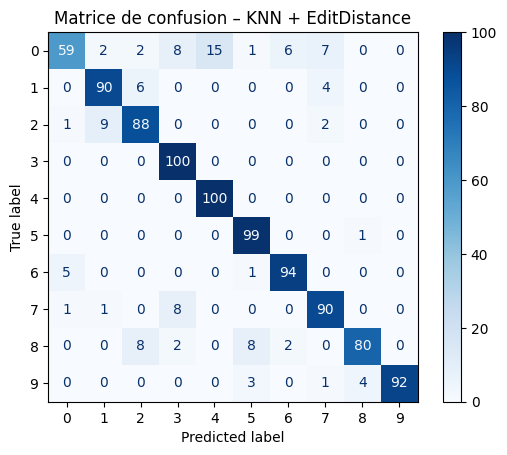

([np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64

In [3]:
import pandas as pd
import numpy as np
from collections import Counter, defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d


# ===========================================================
#               CHARGEMENT ET PREPARATION
# ===========================================================

df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f"Domain1_csv/Subject{subject}-{number}-{iteration}.csv"
            file = pd.read_csv(filename)
            file["gesture"] = number
            file["subject"] = subject
            file["iter"] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']


# ---------- Standardisation ----------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f"{axis}_std"] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(["subject", "gesture", "iter"], group_keys=False).apply(standardize_gesture)



# ---------- Resampling à longueur fixe ----------
def resample_gesture(df, target_len=100):

    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(["gesture", "subject", "iter"]):

        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)

        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            "gesture": [gesture]*target_len,
            "subject": [subject]*target_len,
            "iter": [iteration]*target_len,
            "x_std": interp("x_std"),
            "y_std": interp("y_std"),
            "z_std": interp("z_std")
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


# ===========================================================
#                SEQUENCES DE SYMBOLES
# ===========================================================

def gesture_to_sequence(df):
    seq_dict = defaultdict(list)
    for (gesture, subject, iteration), group in df.groupby(["gesture", "subject", "iter"]):
        seq = "".join(group["symbol"].tolist())
        seq_dict[gesture].append(seq)
    return seq_dict


# ===========================================================
#         CREATION TRAIN/TEST SANS SYMBOLS (CROSS-VAL)
# ===========================================================

def dict_creation_iterout(df, iter_out):
    test_df = df[df["iter"] == iter_out]
    train_df = df[df["iter"] != iter_out]
    return train_df, test_df

def dict_creation_userout(df, subj_out):
    test_df = df[df["subject"] == subj_out]
    train_df = df[df["subject"] != subj_out]
    return train_df, test_df


# ===========================================================
#             CLUSTERING DANS LA CROSS-VALIDATION
# ===========================================================

def cluster_and_convert(df_train, df_test, k_clusters=20):

    # ---- Fit KMeans sur train ----
    train_points = df_train[['x_std', 'y_std', 'z_std']].values
    kmeans = KMeans(n_clusters=k_clusters, random_state=42)
    kmeans.fit(train_points)

    # ---- Attribuer les symboles ----
    def assign_symbols(df_local):
        pts = df_local[['x_std', 'y_std', 'z_std']].values
        clusters = kmeans.predict(pts)
        symbols = [chr(ord('A') + (c % 26)) for c in clusters]
        df_local = df_local.copy()
        df_local["symbol"] = symbols
        return df_local

    train_sym = assign_symbols(df_train)
    test_sym = assign_symbols(df_test)

    # ---- Convertir en chaînes ----
    return gesture_to_sequence(train_sym), gesture_to_sequence(test_sym)



# ===========================================================
#                    EDIT DISTANCE
# ===========================================================

def edit_distance(s1, s2):
    n, m = len(s1), len(s2)
    M = [[0]*(m+1) for _ in range(n+1)]

    for i in range(n+1): M[i][0] = i
    for j in range(m+1): M[0][j] = j

    for i in range(1, n+1):
        for j in range(1, m+1):
            cost = 0 if s1[i-1] == s2[j-1] else 1
            M[i][j] = min(
                M[i-1][j] + 1,
                M[i][j-1] + 1,
                M[i-1][j-1] + cost
            )

    return M[n][m]


# ===========================================================
#                     KNN EDIT DISTANCE
# ===========================================================

def knn_edit_predict(seq, train_dict, k=3):

    distances = []

    for gesture, sequences in train_dict.items():
        for s in sequences:
            d = edit_distance(seq, s)
            distances.append((gesture, d))

    distances.sort(key=lambda x: x[1])
    k_nearest = distances[:k]
    votes = Counter([g for g, _ in k_nearest])

    return votes.most_common(1)[0][0]


# ===========================================================
#                       TEST FINAL
# ===========================================================

def testmodel(DictCreationFunc, df, loop_range=10, k=3, k_clusters=20):

    total_true = []
    total_pred = []

    for i in range(1, loop_range+1):

        print(f"\n=== TEST OUT : {i} ===")

        # Split train/test
        train_df, test_df = DictCreationFunc(df, i)

        # Clustering + symbolisation
        coord_train, coord_test = cluster_and_convert(train_df, test_df, k_clusters)

        y_true, y_pred = [], []

        # KNN
        for gesture, sequences in coord_test.items():
            for seq in sequences:
                pred = knn_edit_predict(seq, coord_train, k=k)
                y_true.append(gesture)
                y_pred.append(pred)

        acc = accuracy_score(y_true, y_pred)
        print(f"Exactitude split {i} : {acc:.2%}")

        total_true.extend(y_true)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\n=== EXACTITUDE GLOBALE : {final_acc:.2%} ===")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – KNN + EditDistance")
    plt.show()

    return total_true, total_pred



# ===========================================================
#                   LANCEMENT DU TEST
# ===========================================================

testmodel(dict_creation_userout, df100)
# testmodel(dict_creation_iterout, df100)

#t'est edit cluster 20 knn 3 + methode tiebreak et deiscripytif 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_18956\3782220919.py:24: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_18956\3782220919.py:40: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



===== TEST SUR USER 1 (User-Out) =====

--- Nouveau test : Vrai label = 0 ---

Votes par classe :
  0 : 3 vote(s)
→ Choix final (vote majoritaire) : 0
Prédiction = 0

--- Nouveau test : Vrai label = 0 ---

Votes par classe :
  6 : 3 vote(s)
→ Choix final (vote majoritaire) : 6
Prédiction = 6

--- Nouveau test : Vrai label = 0 ---

Votes par classe :
  6 : 2 vote(s)
  2 : 1 vote(s)
→ Choix final (vote majoritaire) : 6
Prédiction = 6

--- Nouveau test : Vrai label = 0 ---

Votes par classe :
  6 : 1 vote(s)
  0 : 2 vote(s)
→ Choix final (vote majoritaire) : 0
Prédiction = 0

--- Nouveau test : Vrai label = 0 ---

Votes par classe :
  0 : 3 vote(s)
→ Choix final (vote majoritaire) : 0
Prédiction = 0

--- Nouveau test : Vrai label = 0 ---

Votes par classe :
  0 : 3 vote(s)
→ Choix final (vote majoritaire) : 0
Prédiction = 0

--- Nouveau test : Vrai label = 0 ---

Votes par classe :
  0 : 3 vote(s)
→ Choix final (vote majoritaire) : 0
Prédiction = 0

--- Nouveau test : Vrai label = 0 ---


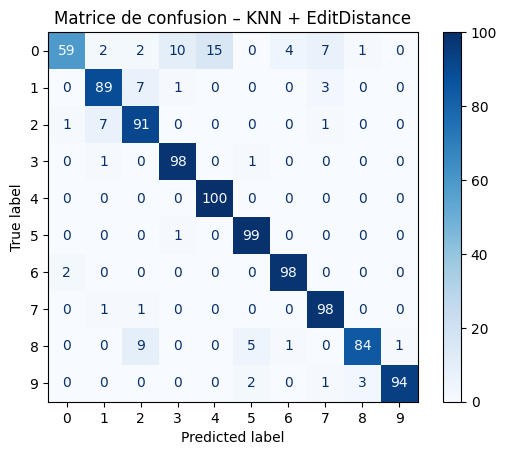

([np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64

In [1]:
import pandas as pd
import numpy as np
from collections import Counter, defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d


# ===========================================================
#                     CHARGEMENT DONNÉES
# ===========================================================

df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


# ===========================================================
#                     STANDARDISATION
# ===========================================================

def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


# ===========================================================
#                     RESAMPLING = 100 POINTS
# ===========================================================

def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)

        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


# ===========================================================
#                     KMEANS → SYMBOLS (A,B,C...)
# ===========================================================

all_points = df100[['x_std', 'y_std', 'z_std']].values
k_clusters = 20
kmeans = KMeans(n_clusters=k_clusters, random_state=42)
kmeans.fit(all_points)

def assign_symbol(row):
    point = np.array([row['x_std'], row['y_std'], row['z_std']])
    cluster_idx = kmeans.predict([point])[0]
    return chr(ord('A') + cluster_idx % 26)

df100['symbol'] = df100.apply(assign_symbol, axis=1)


# ===========================================================
#      CONVERTIR CHAQUE GESTE EN CHAÎNE DE LETTRES
# ===========================================================

def gesture_to_sequence(df):
    seq_dict = defaultdict(list)
    for (gesture, subject, iteration), group in df.groupby(['gesture','subject','iter']):
        seq = ''.join(group['symbol'].tolist())
        seq_dict[gesture].append(seq)
    return seq_dict


# ===========================================================
#      CRÉATION DICT TRAIN/TEST — USER OUT / ITER OUT
# ===========================================================

def dict_creation_iterout(df, iter_out):
    test_df = df[df["iter"] == iter_out]
    train_df = df[df["iter"] != iter_out]
    return gesture_to_sequence(train_df), gesture_to_sequence(test_df)

def dict_creation_userout(df, subj_out):
    test_df = df[df["subject"] == subj_out]
    train_df = df[df["subject"] != subj_out]
    return gesture_to_sequence(train_df), gesture_to_sequence(test_df)


# ===========================================================
#                     EDIT DISTANCE
# ===========================================================

def edit_distance(s1, s2):
    n, m = len(s1), len(s2)
    matrix = [[0]*(m+1) for _ in range(n+1)]

    for i in range(n+1): matrix[i][0] = i
    for j in range(m+1): matrix[0][j] = j

    for i in range(1,n+1):
        for j in range(1,m+1):
            cost = 0 if s1[i-1] == s2[j-1] else 1
            matrix[i][j] = min(
                matrix[i-1][j-1] + cost,
                matrix[i][j-1] + 1,
                matrix[i-1][j] + 1
            )
    return matrix[n][m]


# ===========================================================
#       🔥 KNN + Tie-Break (distance minimale en cas d’égalité)
# ===========================================================

def knn_edit_predict(seq, train_dict, k=3):
    distances = []
    for gesture, sequences in train_dict.items():
        for s in sequences:
            d = edit_distance(seq, s)
            distances.append((gesture, d))

    distances.sort(key=lambda x: x[1])
    k_nearest = distances[:k]

    votes = Counter([g for g,_ in k_nearest])

    print("\nVotes par classe :")
    for g, c in votes.items():
        print(f"  {g} : {c} vote(s)")

    max_votes = max(votes.values())
    candidates = [g for g, c in votes.items() if c == max_votes]

    if len(candidates) == 1:
        pred = candidates[0]
        print(f"→ Choix final (vote majoritaire) : {pred}")
        return pred

    print("⚠️ Égalité détectée – tie-break basé sur la distance minimale")

    min_dist = float("inf")
    best_class = None
    for g, d in k_nearest:
        if g in candidates and d < min_dist:
            min_dist = d
            best_class = g

    print(f"→ Classe choisie après tie-break : {best_class} (distance = {min_dist})")
    return best_class


# ===========================================================
#                     TEST DU MODELE
# ===========================================================

def testmodel(DictCreationFunc, df, loop_range=10, k=3):
    total_true = []
    total_pred = []

    for i in range(1, loop_range + 1):
        print(f"\n===== TEST SUR USER {i} (User-Out) =====")

        coord_train, coord_test = DictCreationFunc(df, i)
        y_true, y_pred = [], []

        for gesture, sequences in coord_test.items():
            for seq in sequences:
                print(f"\n--- Nouveau test : Vrai label = {gesture} ---")
                pred = knn_edit_predict(seq, coord_train, k=k)
                y_true.append(gesture)
                y_pred.append(pred)
                print(f"Prédiction = {pred}")

        acc = accuracy_score(y_true, y_pred)
        total_true.extend(y_true)
        total_pred.extend(y_pred)

        print(f"Exactitude split {i} : {acc:.2%}")

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale KNN-EditDistance : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – KNN + EditDistance")
    plt.show()

    return total_true, total_pred


# ===========================================================
#                     LANCER LE TEST
# ===========================================================

testmodel(dict_creation_userout, df100)
# testmodel(dict_creation_iterout, df100)

#edit distance cluster 25

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_13680\251368638.py:21: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


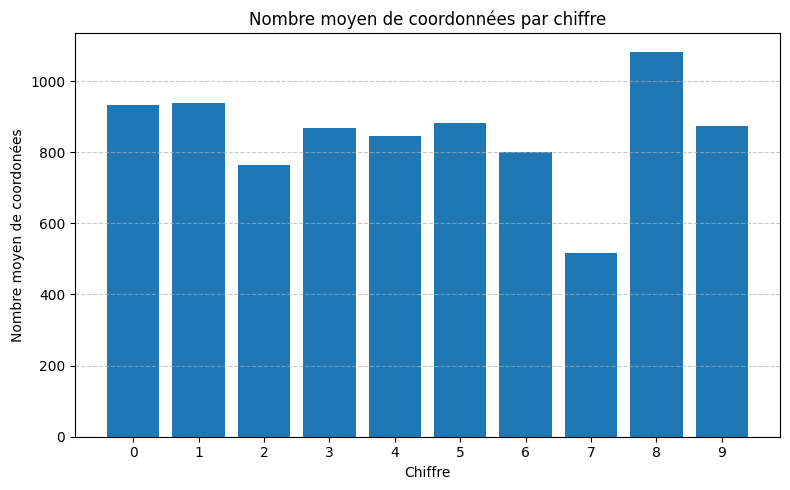

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_13680\251368638.py:56: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test iter/user OUT : 1 ---
Exactitude split 1 : 87.00%

--- Test iter/user OUT : 2 ---
Exactitude split 2 : 87.00%

--- Test iter/user OUT : 3 ---
Exactitude split 3 : 97.00%

--- Test iter/user OUT : 4 ---
Exactitude split 4 : 100.00%

--- Test iter/user OUT : 5 ---
Exactitude split 5 : 83.00%

--- Test iter/user OUT : 6 ---
Exactitude split 6 : 70.00%

--- Test iter/user OUT : 7 ---
Exactitude split 7 : 91.00%

--- Test iter/user OUT : 8 ---
Exactitude split 8 : 93.00%

--- Test iter/user OUT : 9 ---
Exactitude split 9 : 100.00%

--- Test iter/user OUT : 10 ---
Exactitude split 10 : 91.00%

Exactitude globale KNN-EditDistance : 89.90%


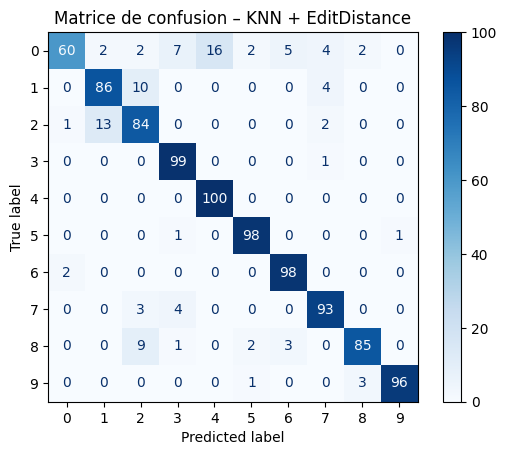

([np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64

In [7]:
import pandas as pd
import numpy as np
from collections import Counter, defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# Création du DataFrame vide
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

# Chargement des fichiers
for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


### Analyse exploratoire ###
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# stndardisation global car mieux aue local ici 
### Standardisation ###
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


### Resampling à longueur fixe ###
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)

        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


### Vector Quantization pour convertir points 3D en symboles ###  # si cluster nmbre petit (5) :Beaucoup de points différents se retrouvent dans le même cluster : sequence : AAABBCCC > tres compresseet rapide mais perte information donc precision diminue 
# alors que lcuster 50 :Chaque forme locale a son propre symbole et La séquence est plus complexe : ADKFHS > Plus d’information > plus long > Mais meilleure précision
# ccl: 5–10 clusters → très rapide, un peu moins précis ,10–20 → bon compromis ,30–50 → très détaillé, mais lent
# ccl : extreme en tehorie 50 donnera mieux que 5 car plus info mais cotrepartie k > 26 crrer colisison donne donc faut entre 10 et 26 donc faut trouver balance entre avoir ufisament donne et pas colisison car > 26 : deux clusters différents peuvent avoir la même lettre et la séquence symbolique perd de l’information
# > Rester ≤ 26 clusters , K = 20–25 → sécurité, pas de collisions,Toujours compatible avec A–Z,Bon compromis précision / rapidité
# > Plus K est grand → chaque cluster correspond à une zone plus petite → meilleure distinction des gestes,Plus K est petit → clusters plus gros → séquences plus compressées → perte d’info
all_points = df100[['x_std','y_std','z_std']].values
k_clusters = 25
kmeans = KMeans(n_clusters=k_clusters, random_state=42) # 42 nombre aleatoire qui n a pas de signification donc est une valeur par defaut donc mettrait 1,10000 change rien
kmeans.fit(all_points)
# kmeans est type clustering nin hierarvchise et non supervise car hieracrhice c est arbe ou faut crrer un dendogramme 
# etape : tu collectes tous les points 3D de tes gestes (x_std, y_std, z_std),tu fais un K-Means sur ces points,K-Means va créer k_clusters groupes,chaque groupe est décrit par un centroïde (= un point 3D moyen),un clustering de type centroid-based
def assign_symbol(row):
    point = np.array([row['x_std'], row['y_std'], row['z_std']])
    cluster_idx = kmeans.predict([point])[0]
    return chr(ord('A') + cluster_idx % 26) # car a 26 lettre dans l alphabet car ici convertis cghaque cluster en lettre 

df100['symbol'] = df100.apply(assign_symbol, axis=1)
#  donc :Ex : K = 50 clusters > Alors les indices :0 → A,1 → B,25 → Z,26 → A (26 % 26),27 → B (27 % 26) alors que si cluster : 5 > cluster_idx = 0  → 'A',cluster_idx = 1  → 'B',cluster_idx = 2  → 'C',cluster_idx = 25 → 'Z'
#sol a faire donc autre raison avoir k < 26 : car si k > 26 : Parce que deux clusters différents auront la même lettre donc 1)Ça écrase de l’information !,2)L’Edit Distance devient moins discriminant > ccl : Si K > 26, collisions ! À éviter
# ccl : ideal cluster 10 ou 15
### Convertir chaque gesture en séquence de symboles ###
def gesture_to_sequence(df):
    seq_dict = defaultdict(list)
    for (gesture, subject, iteration), group in df.groupby(['gesture','subject','iter']):
        seq = ''.join(group['symbol'].tolist())
        seq_dict[gesture].append(seq)
    return seq_dict
# cela rassemble chaque gest en chaine de lettre : ["a","b","c"] > "abc" > chaque geste devient une chaîne de lettres, prête pour Edit Distance / LCS

### Crée les dictionnaires train/test ### # pas meme dico car cleui la retourne des symbole AAAAOOOCC (par rapport dico dtw retpourne sequence de ppint en 3d)
def dict_creation_iterout(df, iter_out):
    test_df = df[df["iter"] == iter_out]
    train_df = df[df["iter"] != iter_out]
    return gesture_to_sequence(train_df), gesture_to_sequence(test_df)

def dict_creation_userout(df, subj_out):
    test_df = df[df["subject"] == subj_out]
    train_df = df[df["subject"] != subj_out]
    return gesture_to_sequence(train_df), gesture_to_sequence(test_df)


### Edit distance classique ###
def edit_distance(s1, s2):
    n, m = len(s1), len(s2)
    matrix = [[0]*(m+1) for _ in range(n+1)]
    for i in range(n+1):
        matrix[i][0] = i
    for j in range(m+1):
        matrix[0][j] = j
    for i in range(1,n+1):
        for j in range(1,m+1):
            cost = 0 if s1[i-1] == s2[j-1] else 1
            matrix[i][j] = min(
                matrix[i-1][j-1]+cost,  # substitution
                matrix[i][j-1]+1,       # insertion
                matrix[i-1][j]+1        # deletion
            )
    return matrix[n][m]


### KNN basé sur edit distance ###
def knn_edit_predict(seq, train_dict, k=3):
    distances = []
    for gesture, sequences in train_dict.items():
        for s in sequences:
            d = edit_distance(seq, s)
            distances.append((gesture, d))
    distances.sort(key=lambda x: x[1])
    k_nearest = distances[:k]
    votes = Counter([g for g,_ in k_nearest])
    return votes.most_common(1)[0][0]


### TEST DU MODELE ###
def testmodel(DictCreationFunc, df, loop_range=10, k=3):
    total_true = []
    total_pred = []

    for i in range(1, loop_range + 1):
        print(f"\n--- Test iter/user OUT : {i} ---")
        coord_train, coord_test = DictCreationFunc(df, i)

        y_true, y_pred = [], []

        for gesture, sequences in coord_test.items():
            for seq in sequences:
                pred = knn_edit_predict(seq, coord_train, k=k)
                y_true.append(gesture)
                y_pred.append(pred)

        acc = accuracy_score(y_true, y_pred)
        total_true.extend(y_true)
        total_pred.extend(y_pred)
        print(f"Exactitude split {i} : {acc:.2%}")

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale KNN-EditDistance : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – KNN + EditDistance")
    plt.show()

    return total_true, total_pred


### Lancer un test ###
testmodel(dict_creation_userout, df100)
# testmodel(dict_creation_iterout, df100)

#eduit distance cluster 50 et k de knn 5 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_13680\1777138474.py:21: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


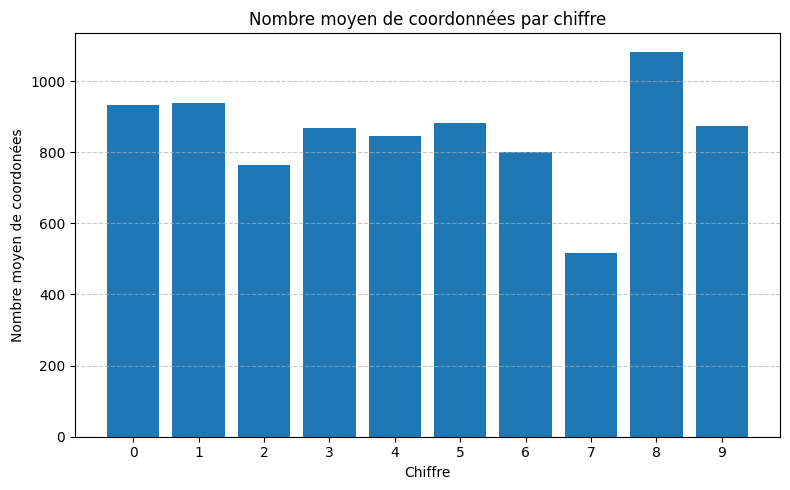

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_13680\1777138474.py:56: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test iter/user OUT : 1 ---
Exactitude split 1 : 97.00%

--- Test iter/user OUT : 2 ---
Exactitude split 2 : 80.00%

--- Test iter/user OUT : 3 ---
Exactitude split 3 : 97.00%

--- Test iter/user OUT : 4 ---
Exactitude split 4 : 100.00%

--- Test iter/user OUT : 5 ---
Exactitude split 5 : 83.00%

--- Test iter/user OUT : 6 ---
Exactitude split 6 : 75.00%

--- Test iter/user OUT : 7 ---
Exactitude split 7 : 87.00%

--- Test iter/user OUT : 8 ---
Exactitude split 8 : 97.00%

--- Test iter/user OUT : 9 ---
Exactitude split 9 : 97.00%

--- Test iter/user OUT : 10 ---
Exactitude split 10 : 87.00%

Exactitude globale KNN-EditDistance : 90.00%


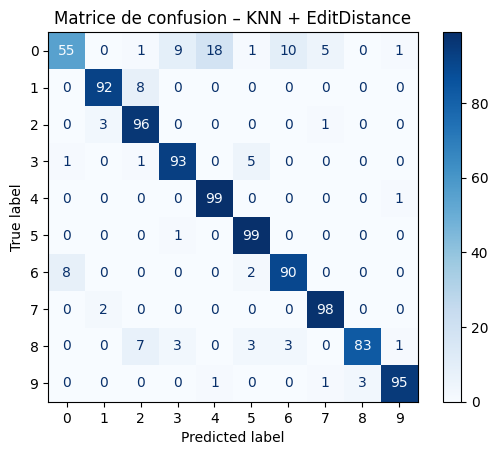

([np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64

In [10]:
import pandas as pd
import numpy as np
from collections import Counter, defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# Création du DataFrame vide
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

# Chargement des fichiers
for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


### Analyse exploratoire ###
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")


### Standardisation ###
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


### Resampling à longueur fixe ###
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)

        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


### Vector Quantization pour convertir points 3D en symboles ###
all_points = df100[['x_std','y_std','z_std']].values
k_clusters = 50
kmeans = KMeans(n_clusters=k_clusters, random_state=42)
kmeans.fit(all_points)

def assign_symbol(row):
    point = np.array([row['x_std'], row['y_std'], row['z_std']])
    cluster_idx = kmeans.predict([point])[0]
    return chr(ord('A') + cluster_idx % 26)

df100['symbol'] = df100.apply(assign_symbol, axis=1)


### Convertir chaque gesture en séquence de symboles ###
def gesture_to_sequence(df):
    seq_dict = defaultdict(list)
    for (gesture, subject, iteration), group in df.groupby(['gesture','subject','iter']):
        seq = ''.join(group['symbol'].tolist())
        seq_dict[gesture].append(seq)
    return seq_dict


### Crée les dictionnaires train/test ### # pas meme dico car cleui la retourne des symbole AAAAOOOCC (par rapport dico dtw retpourne sequence de ppint en 3d)
def dict_creation_iterout(df, iter_out):
    test_df = df[df["iter"] == iter_out]
    train_df = df[df["iter"] != iter_out]
    return gesture_to_sequence(train_df), gesture_to_sequence(test_df)

def dict_creation_userout(df, subj_out):
    test_df = df[df["subject"] == subj_out]
    train_df = df[df["subject"] != subj_out]
    return gesture_to_sequence(train_df), gesture_to_sequence(test_df)


### Edit distance classique ###
def edit_distance(s1, s2):
    n, m = len(s1), len(s2)
    matrix = [[0]*(m+1) for _ in range(n+1)]
    for i in range(n+1):
        matrix[i][0] = i
    for j in range(m+1):
        matrix[0][j] = j
    for i in range(1,n+1):
        for j in range(1,m+1):
            cost = 0 if s1[i-1] == s2[j-1] else 1
            matrix[i][j] = min(
                matrix[i-1][j-1]+cost,  # substitution
                matrix[i][j-1]+1,       # insertion
                matrix[i-1][j]+1        # deletion
            )
    return matrix[n][m]


### KNN basé sur edit distance ###
def knn_edit_predict(seq, train_dict, k=5):   # ici test k 5 au lieu de 3 pour voir si change : Sur des datasets petits → k trop grand peut mélanger des classes,Sur des datasets plus gros → k plus grand stabilise la prédiction,
 #k plus grand → plus robuste aux gestes bruités ou atypiques,k plus petit → plus sensible aux variations locales mais peut mieux capturer les différences subtiles,Plus k est grand → tu regardes plus de séquences similaires avant de voter,Si les distances Edit Distance sont bien séparées → augmentation de k → peu de différence,Si certaines séquences sont très proches entre gestes différents → augmentation de k peut réduire les erreurs ponctuelles
   # testera : k=1 → modèle très sensible au bruit, capture les séquences les plus proches, k=5 → vote plus stable, moins sensible aux outliers
    distances = []
    for gesture, sequences in train_dict.items():
        for s in sequences:
            d = edit_distance(seq, s)
            distances.append((gesture, d))
    distances.sort(key=lambda x: x[1])
    k_nearest = distances[:k]
    votes = Counter([g for g,_ in k_nearest])
    return votes.most_common(1)[0][0]


### TEST DU MODELE ###
def testmodel(DictCreationFunc, df, loop_range=10, k=5):
    total_true = []
    total_pred = []

    for i in range(1, loop_range + 1):
        print(f"\n--- Test iter/user OUT : {i} ---")
        coord_train, coord_test = DictCreationFunc(df, i)

        y_true, y_pred = [], []

        for gesture, sequences in coord_test.items():
            for seq in sequences:
                pred = knn_edit_predict(seq, coord_train, k=k)
                y_true.append(gesture)
                y_pred.append(pred)

        acc = accuracy_score(y_true, y_pred)
        total_true.extend(y_true)
        total_pred.extend(y_pred)
        print(f"Exactitude split {i} : {acc:.2%}")

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale KNN-EditDistance : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – KNN + EditDistance")
    plt.show()

    return total_true, total_pred


### Lancer un test ###
testmodel(dict_creation_userout, df100)
# testmodel(dict_creation_iterout, df100)

#edti distance cluster 20 et k 5

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_13680\3090718522.py:21: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


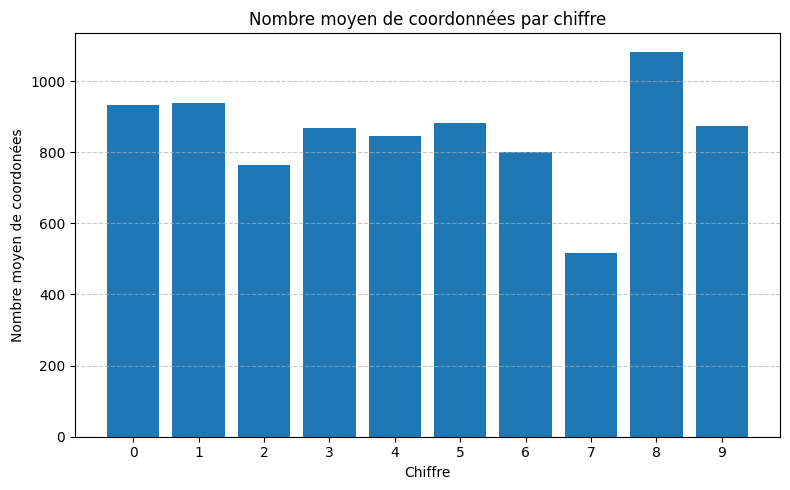

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_13680\3090718522.py:56: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test iter/user OUT : 1 ---
Exactitude split 1 : 90.00%

--- Test iter/user OUT : 2 ---
Exactitude split 2 : 84.00%

--- Test iter/user OUT : 3 ---
Exactitude split 3 : 99.00%

--- Test iter/user OUT : 4 ---
Exactitude split 4 : 98.00%

--- Test iter/user OUT : 5 ---
Exactitude split 5 : 85.00%

--- Test iter/user OUT : 6 ---
Exactitude split 6 : 74.00%

--- Test iter/user OUT : 7 ---
Exactitude split 7 : 89.00%

--- Test iter/user OUT : 8 ---
Exactitude split 8 : 98.00%

--- Test iter/user OUT : 9 ---
Exactitude split 9 : 100.00%

--- Test iter/user OUT : 10 ---
Exactitude split 10 : 87.00%

Exactitude globale KNN-EditDistance : 90.40%


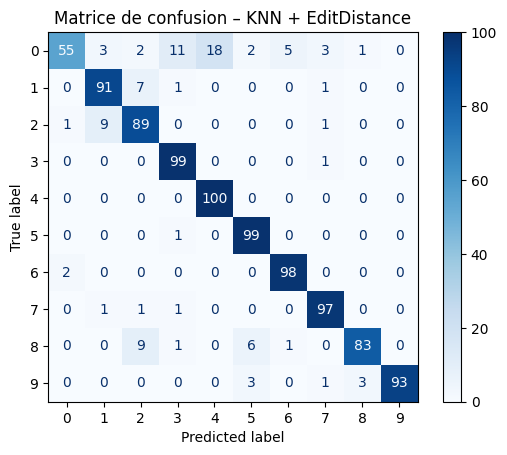

([np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64

In [11]:
import pandas as pd
import numpy as np
from collections import Counter, defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# Création du DataFrame vide
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

# Chargement des fichiers
for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


### Analyse exploratoire ###
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")


### Standardisation ###
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


### Resampling à longueur fixe ###
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)

        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


### Vector Quantization pour convertir points 3D en symboles ###
all_points = df100[['x_std','y_std','z_std']].values
k_clusters = 20
kmeans = KMeans(n_clusters=k_clusters, random_state=42)
kmeans.fit(all_points)

def assign_symbol(row):
    point = np.array([row['x_std'], row['y_std'], row['z_std']])
    cluster_idx = kmeans.predict([point])[0]
    return chr(ord('A') + cluster_idx % 26)

df100['symbol'] = df100.apply(assign_symbol, axis=1)


### Convertir chaque gesture en séquence de symboles ###
def gesture_to_sequence(df):
    seq_dict = defaultdict(list)
    for (gesture, subject, iteration), group in df.groupby(['gesture','subject','iter']):
        seq = ''.join(group['symbol'].tolist())
        seq_dict[gesture].append(seq)
    return seq_dict


### Crée les dictionnaires train/test ### # pas meme dico car cleui la retourne des symbole AAAAOOOCC (par rapport dico dtw retpourne sequence de ppint en 3d)
def dict_creation_iterout(df, iter_out):
    test_df = df[df["iter"] == iter_out]
    train_df = df[df["iter"] != iter_out]
    return gesture_to_sequence(train_df), gesture_to_sequence(test_df)

def dict_creation_userout(df, subj_out):
    test_df = df[df["subject"] == subj_out]
    train_df = df[df["subject"] != subj_out]
    return gesture_to_sequence(train_df), gesture_to_sequence(test_df)


### Edit distance classique ###
def edit_distance(s1, s2):
    n, m = len(s1), len(s2)
    matrix = [[0]*(m+1) for _ in range(n+1)]
    for i in range(n+1):
        matrix[i][0] = i
    for j in range(m+1):
        matrix[0][j] = j
    for i in range(1,n+1):
        for j in range(1,m+1):
            cost = 0 if s1[i-1] == s2[j-1] else 1
            matrix[i][j] = min(
                matrix[i-1][j-1]+cost,  # substitution
                matrix[i][j-1]+1,       # insertion
                matrix[i-1][j]+1        # deletion
            )
    return matrix[n][m]


### KNN basé sur edit distance ###
def knn_edit_predict(seq, train_dict, k=5):   # ici test k 5 au lieu de 3 pour voir si change : Sur des datasets petits → k trop grand peut mélanger des classes,Sur des datasets plus gros → k plus grand stabilise la prédiction,
 #k plus grand → plus robuste aux gestes bruités ou atypiques,k plus petit → plus sensible aux variations locales mais peut mieux capturer les différences subtiles,Plus k est grand → tu regardes plus de séquences similaires avant de voter,Si les distances Edit Distance sont bien séparées → augmentation de k → peu de différence,Si certaines séquences sont très proches entre gestes différents → augmentation de k peut réduire les erreurs ponctuelles
   # testera : k=1 → modèle très sensible au bruit, capture les séquences les plus proches, k=5 → vote plus stable, moins sensible aux outliers
    distances = []
    for gesture, sequences in train_dict.items():
        for s in sequences:
            d = edit_distance(seq, s)
            distances.append((gesture, d))
    distances.sort(key=lambda x: x[1])
    k_nearest = distances[:k]
    votes = Counter([g for g,_ in k_nearest])
    return votes.most_common(1)[0][0]


### TEST DU MODELE ###
def testmodel(DictCreationFunc, df, loop_range=10, k=5):
    total_true = []
    total_pred = []

    for i in range(1, loop_range + 1):
        print(f"\n--- Test iter/user OUT : {i} ---")
        coord_train, coord_test = DictCreationFunc(df, i)

        y_true, y_pred = [], []

        for gesture, sequences in coord_test.items():
            for seq in sequences:
                pred = knn_edit_predict(seq, coord_train, k=k)
                y_true.append(gesture)
                y_pred.append(pred)

        acc = accuracy_score(y_true, y_pred)
        total_true.extend(y_true)
        total_pred.extend(y_pred)
        print(f"Exactitude split {i} : {acc:.2%}")

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale KNN-EditDistance : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – KNN + EditDistance")
    plt.show()

    return total_true, total_pred


### Lancer un test ###
testmodel(dict_creation_userout, df100)
# testmodel(dict_creation_iterout, df100)

#knn 5 CLUSTER 20 ave ccluster dans cross

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_19660\2915544783.py:24: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])
C:\Users\Isadiki\AppData\Local\Temp\ipykernel_19660\2915544783.py:36: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(["subject", "gesture", "iter"], group_keys=False).apply(standardize_gesture)



=== TEST OUT : 1 ===
Exactitude split 1 : 89.00%

=== TEST OUT : 2 ===
Exactitude split 2 : 85.00%

=== TEST OUT : 3 ===
Exactitude split 3 : 97.00%

=== TEST OUT : 4 ===
Exactitude split 4 : 100.00%

=== TEST OUT : 5 ===
Exactitude split 5 : 85.00%

=== TEST OUT : 6 ===
Exactitude split 6 : 61.00%

=== TEST OUT : 7 ===
Exactitude split 7 : 89.00%

=== TEST OUT : 8 ===
Exactitude split 8 : 97.00%

=== TEST OUT : 9 ===
Exactitude split 9 : 98.00%

=== TEST OUT : 10 ===
Exactitude split 10 : 89.00%

=== EXACTITUDE GLOBALE : 89.00% ===


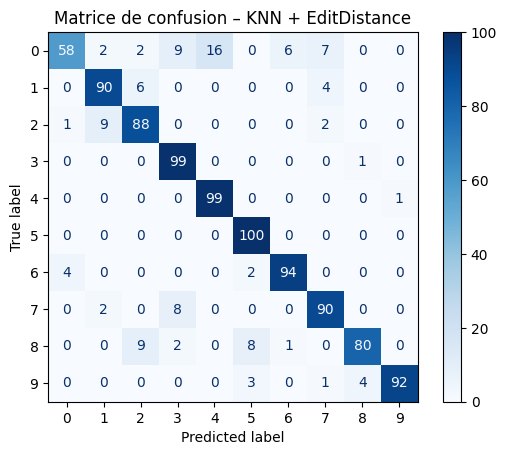

([np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64

In [1]:
import pandas as pd
import numpy as np
from collections import Counter, defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d


# ===========================================================
#               CHARGEMENT ET PREPARATION
# ===========================================================

df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f"Domain1_csv/Subject{subject}-{number}-{iteration}.csv"
            file = pd.read_csv(filename)
            file["gesture"] = number
            file["subject"] = subject
            file["iter"] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']


# ---------- Standardisation ----------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f"{axis}_std"] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(["subject", "gesture", "iter"], group_keys=False).apply(standardize_gesture)



# ---------- Resampling à longueur fixe ----------
def resample_gesture(df, target_len=100):

    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(["gesture", "subject", "iter"]):

        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)

        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            "gesture": [gesture]*target_len,
            "subject": [subject]*target_len,
            "iter": [iteration]*target_len,
            "x_std": interp("x_std"),
            "y_std": interp("y_std"),
            "z_std": interp("z_std")
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


# ===========================================================
#                SEQUENCES DE SYMBOLES
# ===========================================================

def gesture_to_sequence(df):
    seq_dict = defaultdict(list)
    for (gesture, subject, iteration), group in df.groupby(["gesture", "subject", "iter"]):
        seq = "".join(group["symbol"].tolist())
        seq_dict[gesture].append(seq)
    return seq_dict


# ===========================================================
#         CREATION TRAIN/TEST SANS SYMBOLS (CROSS-VAL)
# ===========================================================

def dict_creation_iterout(df, iter_out):
    test_df = df[df["iter"] == iter_out]
    train_df = df[df["iter"] != iter_out]
    return train_df, test_df

def dict_creation_userout(df, subj_out):
    test_df = df[df["subject"] == subj_out]
    train_df = df[df["subject"] != subj_out]
    return train_df, test_df


# ===========================================================
#             CLUSTERING DANS LA CROSS-VALIDATION
# ===========================================================

def cluster_and_convert(df_train, df_test, k_clusters=20):

    # ---- Fit KMeans sur train ----
    train_points = df_train[['x_std', 'y_std', 'z_std']].values
    kmeans = KMeans(n_clusters=k_clusters, random_state=42)
    kmeans.fit(train_points)

    # ---- Attribuer les symboles ----
    def assign_symbols(df_local):
        pts = df_local[['x_std', 'y_std', 'z_std']].values
        clusters = kmeans.predict(pts)
        symbols = [chr(ord('A') + (c % 26)) for c in clusters]
        df_local = df_local.copy()
        df_local["symbol"] = symbols
        return df_local

    train_sym = assign_symbols(df_train)
    test_sym = assign_symbols(df_test)

    # ---- Convertir en chaînes ----
    return gesture_to_sequence(train_sym), gesture_to_sequence(test_sym)



# ===========================================================
#                    EDIT DISTANCE
# ===========================================================

def edit_distance(s1, s2):
    n, m = len(s1), len(s2)
    M = [[0]*(m+1) for _ in range(n+1)]

    for i in range(n+1): M[i][0] = i
    for j in range(m+1): M[0][j] = j

    for i in range(1, n+1):
        for j in range(1, m+1):
            cost = 0 if s1[i-1] == s2[j-1] else 1
            M[i][j] = min(
                M[i-1][j] + 1,
                M[i][j-1] + 1,
                M[i-1][j-1] + cost
            )

    return M[n][m]


# ===========================================================
#                     KNN EDIT DISTANCE
# ===========================================================

def knn_edit_predict(seq, train_dict, k=5):

    distances = []

    for gesture, sequences in train_dict.items():
        for s in sequences:
            d = edit_distance(seq, s)
            distances.append((gesture, d))

    distances.sort(key=lambda x: x[1])
    k_nearest = distances[:k]
    votes = Counter([g for g, _ in k_nearest])

    return votes.most_common(1)[0][0]


# ===========================================================
#                       TEST FINAL
# ===========================================================

def testmodel(DictCreationFunc, df, loop_range=10, k=5, k_clusters=20):

    total_true = []
    total_pred = []

    for i in range(1, loop_range+1):

        print(f"\n=== TEST OUT : {i} ===")

        # Split train/test
        train_df, test_df = DictCreationFunc(df, i)

        # Clustering + symbolisation
        coord_train, coord_test = cluster_and_convert(train_df, test_df, k_clusters)

        y_true, y_pred = [], []

        # KNN
        for gesture, sequences in coord_test.items():
            for seq in sequences:
                pred = knn_edit_predict(seq, coord_train, k=k)
                y_true.append(gesture)
                y_pred.append(pred)

        acc = accuracy_score(y_true, y_pred)
        print(f"Exactitude split {i} : {acc:.2%}")

        total_true.extend(y_true)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\n=== EXACTITUDE GLOBALE : {final_acc:.2%} ===")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – KNN + EditDistance")
    plt.show()

    return total_true, total_pred



# ===========================================================
#                   LANCEMENT DU TEST
# ===========================================================

testmodel(dict_creation_userout, df100)
# testmodel(dict_creation_iterout, df100)

#lcss knn 5 cluster 50 cluster dedans 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_15068\3929745521.py:24: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])
C:\Users\Isadiki\AppData\Local\Temp\ipykernel_15068\3929745521.py:36: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(["subject", "gesture", "iter"], group_keys=False).apply(standardize_gesture)



=== TEST OUT : 1 ===
Exactitude split 1 : 97.00%

=== TEST OUT : 2 ===
Exactitude split 2 : 85.00%

=== TEST OUT : 3 ===
Exactitude split 3 : 91.00%

=== TEST OUT : 4 ===
Exactitude split 4 : 100.00%

=== TEST OUT : 5 ===
Exactitude split 5 : 85.00%

=== TEST OUT : 6 ===
Exactitude split 6 : 69.00%

=== TEST OUT : 7 ===
Exactitude split 7 : 89.00%

=== TEST OUT : 8 ===
Exactitude split 8 : 94.00%

=== TEST OUT : 9 ===
Exactitude split 9 : 99.00%

=== TEST OUT : 10 ===
Exactitude split 10 : 87.00%

=== EXACTITUDE GLOBALE : 89.60% ===


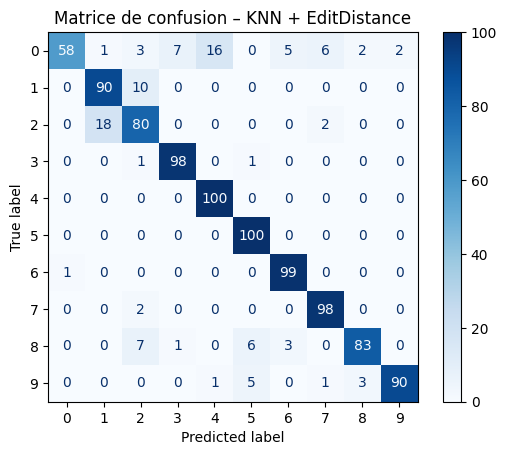

([np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64

In [1]:
import pandas as pd
import numpy as np
from collections import Counter, defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d


# ===========================================================
#               CHARGEMENT ET PREPARATION
# ===========================================================

df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f"Domain1_csv/Subject{subject}-{number}-{iteration}.csv"
            file = pd.read_csv(filename)
            file["gesture"] = number
            file["subject"] = subject
            file["iter"] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']


# ---------- Standardisation ----------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f"{axis}_std"] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(["subject", "gesture", "iter"], group_keys=False).apply(standardize_gesture)



# ---------- Resampling à longueur fixe ----------
def resample_gesture(df, target_len=100):

    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(["gesture", "subject", "iter"]):

        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)

        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            "gesture": [gesture]*target_len,
            "subject": [subject]*target_len,
            "iter": [iteration]*target_len,
            "x_std": interp("x_std"),
            "y_std": interp("y_std"),
            "z_std": interp("z_std")
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


# ===========================================================
#                SEQUENCES DE SYMBOLES
# ===========================================================

def gesture_to_sequence(df):
    seq_dict = defaultdict(list)
    for (gesture, subject, iteration), group in df.groupby(["gesture", "subject", "iter"]):
        seq = "".join(group["symbol"].tolist())
        seq_dict[gesture].append(seq)
    return seq_dict


# ===========================================================
#         CREATION TRAIN/TEST SANS SYMBOLS (CROSS-VAL)
# ===========================================================

def dict_creation_iterout(df, iter_out):
    test_df = df[df["iter"] == iter_out]
    train_df = df[df["iter"] != iter_out]
    return train_df, test_df

def dict_creation_userout(df, subj_out):
    test_df = df[df["subject"] == subj_out]
    train_df = df[df["subject"] != subj_out]
    return train_df, test_df


# ===========================================================
#             CLUSTERING DANS LA CROSS-VALIDATION
# ===========================================================

def cluster_and_convert(df_train, df_test, k_clusters=50):

    # ---- Fit KMeans sur train ----
    train_points = df_train[['x_std', 'y_std', 'z_std']].values
    kmeans = KMeans(n_clusters=k_clusters, random_state=42)
    kmeans.fit(train_points)

    # ---- Attribuer les symboles ----
    def assign_symbols(df_local):
        pts = df_local[['x_std', 'y_std', 'z_std']].values
        clusters = kmeans.predict(pts)
        symbols = [chr(ord('A') + (c % 26)) for c in clusters]
        df_local = df_local.copy()
        df_local["symbol"] = symbols
        return df_local

    train_sym = assign_symbols(df_train)
    test_sym = assign_symbols(df_test)

    # ---- Convertir en chaînes ----
    return gesture_to_sequence(train_sym), gesture_to_sequence(test_sym)



# ===========================================================
#                    EDIT DISTANCE
# ===========================================================

def edit_distance(s1, s2):
    n, m = len(s1), len(s2)
    M = [[0]*(m+1) for _ in range(n+1)]

    for i in range(n+1): M[i][0] = i
    for j in range(m+1): M[0][j] = j

    for i in range(1, n+1):
        for j in range(1, m+1):
            cost = 0 if s1[i-1] == s2[j-1] else 1
            M[i][j] = min(
                M[i-1][j] + 1,
                M[i][j-1] + 1,
                M[i-1][j-1] + cost
            )

    return M[n][m]


# ===========================================================
#                     KNN EDIT DISTANCE
# ===========================================================

def knn_edit_predict(seq, train_dict, k=5):

    distances = []

    for gesture, sequences in train_dict.items():
        for s in sequences:
            d = edit_distance(seq, s)
            distances.append((gesture, d))

    distances.sort(key=lambda x: x[1])
    k_nearest = distances[:k]
    votes = Counter([g for g, _ in k_nearest])

    return votes.most_common(1)[0][0]


# ===========================================================
#                       TEST FINAL
# ===========================================================

def testmodel(DictCreationFunc, df, loop_range=10, k=5, k_clusters=50):

    total_true = []
    total_pred = []

    for i in range(1, loop_range+1):

        print(f"\n=== TEST OUT : {i} ===")

        # Split train/test
        train_df, test_df = DictCreationFunc(df, i)

        # Clustering + symbolisation
        coord_train, coord_test = cluster_and_convert(train_df, test_df, k_clusters)

        y_true, y_pred = [], []

        # KNN
        for gesture, sequences in coord_test.items():
            for seq in sequences:
                pred = knn_edit_predict(seq, coord_train, k=k)
                y_true.append(gesture)
                y_pred.append(pred)

        acc = accuracy_score(y_true, y_pred)
        print(f"Exactitude split {i} : {acc:.2%}")

        total_true.extend(y_true)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\n=== EXACTITUDE GLOBALE : {final_acc:.2%} ===")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – KNN + EditDistance")
    plt.show()

    return total_true, total_pred



# ===========================================================
#                   LANCEMENT DU TEST
# ===========================================================

testmodel(dict_creation_userout, df100)
# testmodel(dict_creation_iterout, df100)

#ediyt distance cluster 5 et knn 5

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_13680\4243974617.py:21: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


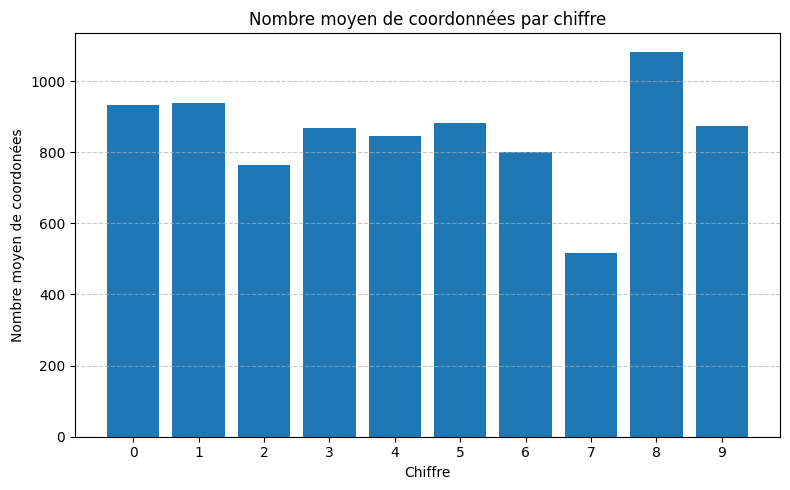

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_13680\4243974617.py:56: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test iter/user OUT : 1 ---
Exactitude split 1 : 91.00%

--- Test iter/user OUT : 2 ---
Exactitude split 2 : 74.00%

--- Test iter/user OUT : 3 ---
Exactitude split 3 : 88.00%

--- Test iter/user OUT : 4 ---
Exactitude split 4 : 93.00%

--- Test iter/user OUT : 5 ---
Exactitude split 5 : 77.00%

--- Test iter/user OUT : 6 ---
Exactitude split 6 : 58.00%

--- Test iter/user OUT : 7 ---
Exactitude split 7 : 85.00%

--- Test iter/user OUT : 8 ---
Exactitude split 8 : 97.00%

--- Test iter/user OUT : 9 ---
Exactitude split 9 : 89.00%

--- Test iter/user OUT : 10 ---
Exactitude split 10 : 79.00%

Exactitude globale KNN-EditDistance : 83.10%


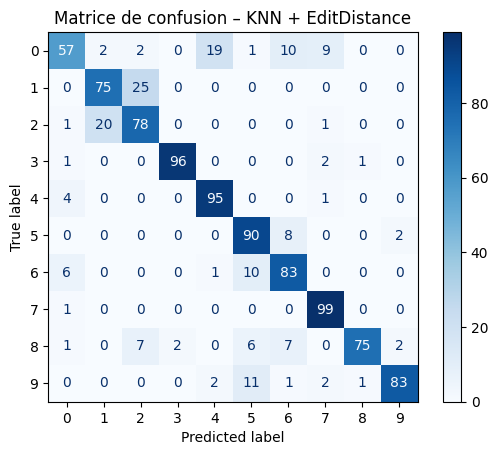

([np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64

In [12]:
import pandas as pd
import numpy as np
from collections import Counter, defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# Création du DataFrame vide
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

# Chargement des fichiers
for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


### Analyse exploratoire ###
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")


### Standardisation ###
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


### Resampling à longueur fixe ###
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)

        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


### Vector Quantization pour convertir points 3D en symboles ###
all_points = df100[['x_std','y_std','z_std']].values
k_clusters = 5
kmeans = KMeans(n_clusters=k_clusters, random_state=42)
kmeans.fit(all_points)

def assign_symbol(row):
    point = np.array([row['x_std'], row['y_std'], row['z_std']])
    cluster_idx = kmeans.predict([point])[0]
    return chr(ord('A') + cluster_idx % 26)

df100['symbol'] = df100.apply(assign_symbol, axis=1)


### Convertir chaque gesture en séquence de symboles ###
def gesture_to_sequence(df):
    seq_dict = defaultdict(list)
    for (gesture, subject, iteration), group in df.groupby(['gesture','subject','iter']):
        seq = ''.join(group['symbol'].tolist())
        seq_dict[gesture].append(seq)
    return seq_dict


### Crée les dictionnaires train/test ### # pas meme dico car cleui la retourne des symbole AAAAOOOCC (par rapport dico dtw retpourne sequence de ppint en 3d)
def dict_creation_iterout(df, iter_out):
    test_df = df[df["iter"] == iter_out]
    train_df = df[df["iter"] != iter_out]
    return gesture_to_sequence(train_df), gesture_to_sequence(test_df)

def dict_creation_userout(df, subj_out):
    test_df = df[df["subject"] == subj_out]
    train_df = df[df["subject"] != subj_out]
    return gesture_to_sequence(train_df), gesture_to_sequence(test_df)


### Edit distance classique ###
def edit_distance(s1, s2):
    n, m = len(s1), len(s2)
    matrix = [[0]*(m+1) for _ in range(n+1)]
    for i in range(n+1):
        matrix[i][0] = i
    for j in range(m+1):
        matrix[0][j] = j
    for i in range(1,n+1):
        for j in range(1,m+1):
            cost = 0 if s1[i-1] == s2[j-1] else 1
            matrix[i][j] = min(
                matrix[i-1][j-1]+cost,  # substitution
                matrix[i][j-1]+1,       # insertion
                matrix[i-1][j]+1        # deletion
            )
    return matrix[n][m]


### KNN basé sur edit distance ###
def knn_edit_predict(seq, train_dict, k=5):   # ici test k 5 au lieu de 3 pour voir si change : Sur des datasets petits → k trop grand peut mélanger des classes,Sur des datasets plus gros → k plus grand stabilise la prédiction,
 #k plus grand → plus robuste aux gestes bruités ou atypiques,k plus petit → plus sensible aux variations locales mais peut mieux capturer les différences subtiles,Plus k est grand → tu regardes plus de séquences similaires avant de voter,Si les distances Edit Distance sont bien séparées → augmentation de k → peu de différence,Si certaines séquences sont très proches entre gestes différents → augmentation de k peut réduire les erreurs ponctuelles
   # testera : k=1 → modèle très sensible au bruit, capture les séquences les plus proches, k=5 → vote plus stable, moins sensible aux outliers
    distances = []
    for gesture, sequences in train_dict.items():
        for s in sequences:
            d = edit_distance(seq, s)
            distances.append((gesture, d))
    distances.sort(key=lambda x: x[1])
    k_nearest = distances[:k]
    votes = Counter([g for g,_ in k_nearest])
    return votes.most_common(1)[0][0]


### TEST DU MODELE ###
def testmodel(DictCreationFunc, df, loop_range=10, k=5):
    total_true = []
    total_pred = []

    for i in range(1, loop_range + 1):
        print(f"\n--- Test iter/user OUT : {i} ---")
        coord_train, coord_test = DictCreationFunc(df, i)

        y_true, y_pred = [], []

        for gesture, sequences in coord_test.items():
            for seq in sequences:
                pred = knn_edit_predict(seq, coord_train, k=k)
                y_true.append(gesture)
                y_pred.append(pred)

        acc = accuracy_score(y_true, y_pred)
        total_true.extend(y_true)
        total_pred.extend(y_pred)
        print(f"Exactitude split {i} : {acc:.2%}")

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale KNN-EditDistance : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – KNN + EditDistance")
    plt.show()

    return total_true, total_pred


### Lancer un test ###
testmodel(dict_creation_userout, df100)
# testmodel(dict_creation_iterout, df100)

#ediy distacnce cluster 20 et knn 7 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_13680\1460531546.py:21: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


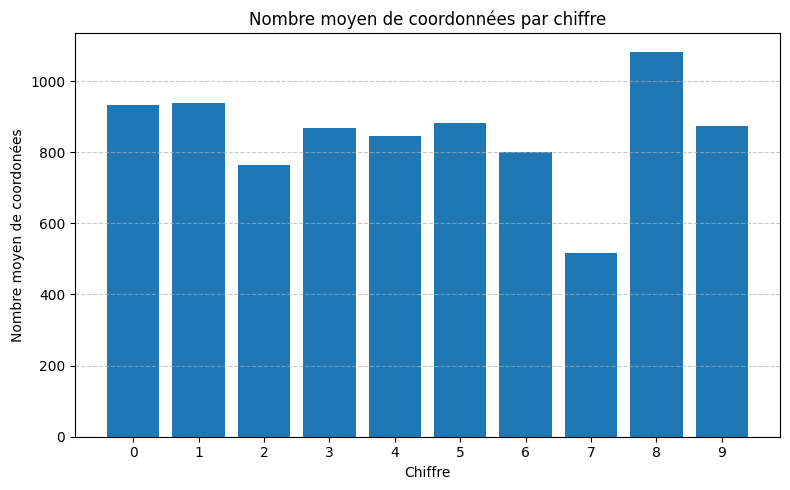

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_13680\1460531546.py:56: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test iter/user OUT : 1 ---
Exactitude split 1 : 89.00%

--- Test iter/user OUT : 2 ---
Exactitude split 2 : 84.00%

--- Test iter/user OUT : 3 ---
Exactitude split 3 : 98.00%

--- Test iter/user OUT : 4 ---
Exactitude split 4 : 99.00%

--- Test iter/user OUT : 5 ---
Exactitude split 5 : 86.00%

--- Test iter/user OUT : 6 ---
Exactitude split 6 : 75.00%

--- Test iter/user OUT : 7 ---
Exactitude split 7 : 89.00%

--- Test iter/user OUT : 8 ---
Exactitude split 8 : 97.00%

--- Test iter/user OUT : 9 ---
Exactitude split 9 : 100.00%

--- Test iter/user OUT : 10 ---
Exactitude split 10 : 86.00%

Exactitude globale KNN-EditDistance : 90.30%


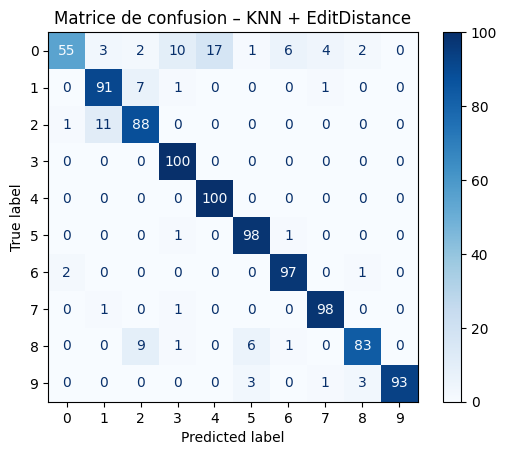

([np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64

In [13]:
import pandas as pd
import numpy as np
from collections import Counter, defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# Création du DataFrame vide
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

# Chargement des fichiers
for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


### Analyse exploratoire ###
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")


### Standardisation ###
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


### Resampling à longueur fixe ###
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)

        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


### Vector Quantization pour convertir points 3D en symboles ###
all_points = df100[['x_std','y_std','z_std']].values
k_clusters = 20
kmeans = KMeans(n_clusters=k_clusters, random_state=42)
kmeans.fit(all_points)

def assign_symbol(row):
    point = np.array([row['x_std'], row['y_std'], row['z_std']])
    cluster_idx = kmeans.predict([point])[0]
    return chr(ord('A') + cluster_idx % 26)

df100['symbol'] = df100.apply(assign_symbol, axis=1)


### Convertir chaque gesture en séquence de symboles ###
def gesture_to_sequence(df):
    seq_dict = defaultdict(list)
    for (gesture, subject, iteration), group in df.groupby(['gesture','subject','iter']):
        seq = ''.join(group['symbol'].tolist())
        seq_dict[gesture].append(seq)
    return seq_dict


### Crée les dictionnaires train/test ### # pas meme dico car cleui la retourne des symbole AAAAOOOCC (par rapport dico dtw retpourne sequence de ppint en 3d)
def dict_creation_iterout(df, iter_out):
    test_df = df[df["iter"] == iter_out]
    train_df = df[df["iter"] != iter_out]
    return gesture_to_sequence(train_df), gesture_to_sequence(test_df)

def dict_creation_userout(df, subj_out):
    test_df = df[df["subject"] == subj_out]
    train_df = df[df["subject"] != subj_out]
    return gesture_to_sequence(train_df), gesture_to_sequence(test_df)


### Edit distance classique ###
def edit_distance(s1, s2):
    n, m = len(s1), len(s2)
    matrix = [[0]*(m+1) for _ in range(n+1)]
    for i in range(n+1):
        matrix[i][0] = i
    for j in range(m+1):
        matrix[0][j] = j
    for i in range(1,n+1):
        for j in range(1,m+1):
            cost = 0 if s1[i-1] == s2[j-1] else 1
            matrix[i][j] = min(
                matrix[i-1][j-1]+cost,  # substitution
                matrix[i][j-1]+1,       # insertion
                matrix[i-1][j]+1        # deletion
            )
    return matrix[n][m]


### KNN basé sur edit distance ###
def knn_edit_predict(seq, train_dict, k=7):   # ici test k 5 au lieu de 3 pour voir si change : Sur des datasets petits → k trop grand peut mélanger des classes,Sur des datasets plus gros → k plus grand stabilise la prédiction,
 #k plus grand → plus robuste aux gestes bruités ou atypiques,k plus petit → plus sensible aux variations locales mais peut mieux capturer les différences subtiles,Plus k est grand → tu regardes plus de séquences similaires avant de voter,Si les distances Edit Distance sont bien séparées → augmentation de k → peu de différence,Si certaines séquences sont très proches entre gestes différents → augmentation de k peut réduire les erreurs ponctuelles
   # testera : k=1 → modèle très sensible au bruit, capture les séquences les plus proches, k=5 → vote plus stable, moins sensible aux outliers
    distances = []
    for gesture, sequences in train_dict.items():
        for s in sequences:
            d = edit_distance(seq, s)
            distances.append((gesture, d))
    distances.sort(key=lambda x: x[1])
    k_nearest = distances[:k]
    votes = Counter([g for g,_ in k_nearest])
    return votes.most_common(1)[0][0]


### TEST DU MODELE ###
def testmodel(DictCreationFunc, df, loop_range=10, k=7):
    total_true = []
    total_pred = []

    for i in range(1, loop_range + 1):
        print(f"\n--- Test iter/user OUT : {i} ---")
        coord_train, coord_test = DictCreationFunc(df, i)

        y_true, y_pred = [], []

        for gesture, sequences in coord_test.items():
            for seq in sequences:
                pred = knn_edit_predict(seq, coord_train, k=k)
                y_true.append(gesture)
                y_pred.append(pred)

        acc = accuracy_score(y_true, y_pred)
        total_true.extend(y_true)
        total_pred.extend(y_pred)
        print(f"Exactitude split {i} : {acc:.2%}")

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale KNN-EditDistance : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – KNN + EditDistance")
    plt.show()

    return total_true, total_pred


### Lancer un test ###
testmodel(dict_creation_userout, df100)
# testmodel(dict_creation_iterout, df100)

#edit distance knn 7 cmuser 20 cross valuid dedans 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_10216\3406474700.py:24: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])
C:\Users\Isadiki\AppData\Local\Temp\ipykernel_10216\3406474700.py:36: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(["subject", "gesture", "iter"], group_keys=False).apply(standardize_gesture)



=== TEST OUT : 1 ===
Exactitude split 1 : 90.00%

=== TEST OUT : 2 ===
Exactitude split 2 : 86.00%

=== TEST OUT : 3 ===
Exactitude split 3 : 96.00%

=== TEST OUT : 4 ===
Exactitude split 4 : 100.00%

=== TEST OUT : 5 ===
Exactitude split 5 : 82.00%

=== TEST OUT : 6 ===
Exactitude split 6 : 62.00%

=== TEST OUT : 7 ===
Exactitude split 7 : 89.00%

=== TEST OUT : 8 ===
Exactitude split 8 : 98.00%

=== TEST OUT : 9 ===
Exactitude split 9 : 100.00%

=== TEST OUT : 10 ===
Exactitude split 10 : 89.00%

=== EXACTITUDE GLOBALE : 89.20% ===


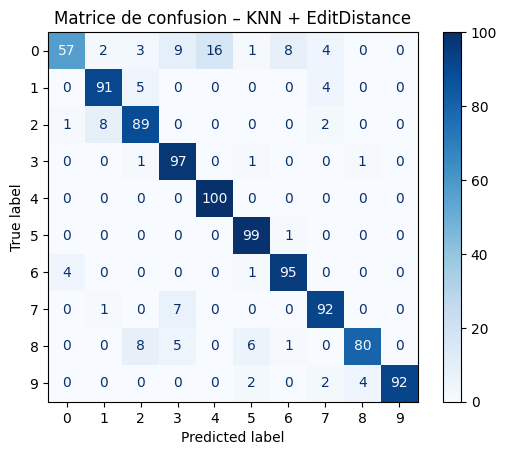

([np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64

In [2]:
import pandas as pd
import numpy as np
from collections import Counter, defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d


# ===========================================================
#               CHARGEMENT ET PREPARATION
# ===========================================================

df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f"Domain1_csv/Subject{subject}-{number}-{iteration}.csv"
            file = pd.read_csv(filename)
            file["gesture"] = number
            file["subject"] = subject
            file["iter"] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']


# ---------- Standardisation ----------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f"{axis}_std"] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(["subject", "gesture", "iter"], group_keys=False).apply(standardize_gesture)



# ---------- Resampling à longueur fixe ----------
def resample_gesture(df, target_len=100):

    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(["gesture", "subject", "iter"]):

        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)

        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            "gesture": [gesture]*target_len,
            "subject": [subject]*target_len,
            "iter": [iteration]*target_len,
            "x_std": interp("x_std"),
            "y_std": interp("y_std"),
            "z_std": interp("z_std")
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


# ===========================================================
#                SEQUENCES DE SYMBOLES
# ===========================================================

def gesture_to_sequence(df):
    seq_dict = defaultdict(list)
    for (gesture, subject, iteration), group in df.groupby(["gesture", "subject", "iter"]):
        seq = "".join(group["symbol"].tolist())
        seq_dict[gesture].append(seq)
    return seq_dict


# ===========================================================
#         CREATION TRAIN/TEST SANS SYMBOLS (CROSS-VAL)
# ===========================================================

def dict_creation_iterout(df, iter_out):
    test_df = df[df["iter"] == iter_out]
    train_df = df[df["iter"] != iter_out]
    return train_df, test_df

def dict_creation_userout(df, subj_out):
    test_df = df[df["subject"] == subj_out]
    train_df = df[df["subject"] != subj_out]
    return train_df, test_df


# ===========================================================
#             CLUSTERING DANS LA CROSS-VALIDATION
# ===========================================================

def cluster_and_convert(df_train, df_test, k_clusters=20):

    # ---- Fit KMeans sur train ----
    train_points = df_train[['x_std', 'y_std', 'z_std']].values
    kmeans = KMeans(n_clusters=k_clusters, random_state=42)
    kmeans.fit(train_points)

    # ---- Attribuer les symboles ----
    def assign_symbols(df_local):
        pts = df_local[['x_std', 'y_std', 'z_std']].values
        clusters = kmeans.predict(pts)
        symbols = [chr(ord('A') + (c % 26)) for c in clusters]
        df_local = df_local.copy()
        df_local["symbol"] = symbols
        return df_local

    train_sym = assign_symbols(df_train)
    test_sym = assign_symbols(df_test)

    # ---- Convertir en chaînes ----
    return gesture_to_sequence(train_sym), gesture_to_sequence(test_sym)



# ===========================================================
#                    EDIT DISTANCE
# ===========================================================

def edit_distance(s1, s2):
    n, m = len(s1), len(s2)
    M = [[0]*(m+1) for _ in range(n+1)]

    for i in range(n+1): M[i][0] = i
    for j in range(m+1): M[0][j] = j

    for i in range(1, n+1):
        for j in range(1, m+1):
            cost = 0 if s1[i-1] == s2[j-1] else 1
            M[i][j] = min(
                M[i-1][j] + 1,
                M[i][j-1] + 1,
                M[i-1][j-1] + cost
            )

    return M[n][m]


# ===========================================================
#                     KNN EDIT DISTANCE
# ===========================================================

def knn_edit_predict(seq, train_dict, k=7):

    distances = []

    for gesture, sequences in train_dict.items():
        for s in sequences:
            d = edit_distance(seq, s)
            distances.append((gesture, d))

    distances.sort(key=lambda x: x[1])
    k_nearest = distances[:k]
    votes = Counter([g for g, _ in k_nearest])

    return votes.most_common(1)[0][0]


# ===========================================================
#                       TEST FINAL
# ===========================================================

def testmodel(DictCreationFunc, df, loop_range=10, k=7, k_clusters=20):

    total_true = []
    total_pred = []

    for i in range(1, loop_range+1):

        print(f"\n=== TEST OUT : {i} ===")

        # Split train/test
        train_df, test_df = DictCreationFunc(df, i)

        # Clustering + symbolisation
        coord_train, coord_test = cluster_and_convert(train_df, test_df, k_clusters)

        y_true, y_pred = [], []

        # KNN
        for gesture, sequences in coord_test.items():
            for seq in sequences:
                pred = knn_edit_predict(seq, coord_train, k=k)
                y_true.append(gesture)
                y_pred.append(pred)

        acc = accuracy_score(y_true, y_pred)
        print(f"Exactitude split {i} : {acc:.2%}")

        total_true.extend(y_true)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\n=== EXACTITUDE GLOBALE : {final_acc:.2%} ===")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – KNN + EditDistance")
    plt.show()

    return total_true, total_pred



# ===========================================================
#                   LANCEMENT DU TEST
# ===========================================================

testmodel(dict_creation_userout, df100)
# testmodel(dict_creation_iterout, df100)

#edi diydytznce knn 7 cluster 50 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_4980\2736662801.py:21: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


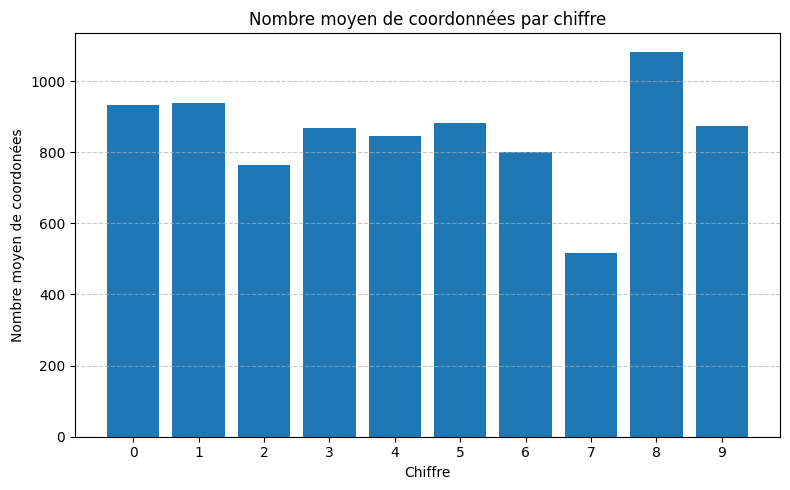

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_4980\2736662801.py:56: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test iter/user OUT : 1 ---
Exactitude split 1 : 97.00%

--- Test iter/user OUT : 2 ---
Exactitude split 2 : 80.00%

--- Test iter/user OUT : 3 ---
Exactitude split 3 : 99.00%

--- Test iter/user OUT : 4 ---
Exactitude split 4 : 100.00%

--- Test iter/user OUT : 5 ---
Exactitude split 5 : 86.00%

--- Test iter/user OUT : 6 ---
Exactitude split 6 : 75.00%

--- Test iter/user OUT : 7 ---
Exactitude split 7 : 88.00%

--- Test iter/user OUT : 8 ---
Exactitude split 8 : 98.00%

--- Test iter/user OUT : 9 ---
Exactitude split 9 : 96.00%

--- Test iter/user OUT : 10 ---
Exactitude split 10 : 87.00%

Exactitude globale KNN-EditDistance : 90.60%


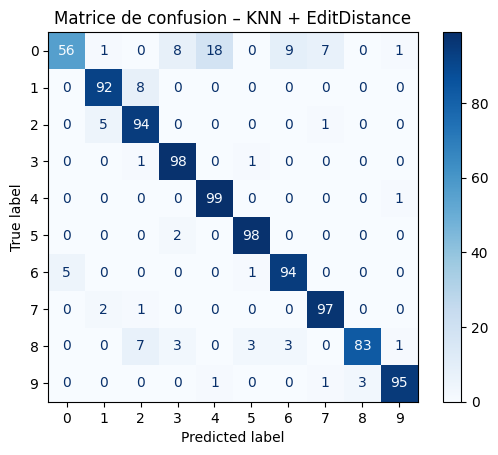

([np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64

In [3]:
import pandas as pd
import numpy as np
from collections import Counter, defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# Création du DataFrame vide
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

# Chargement des fichiers
for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


### Analyse exploratoire ###
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")


### Standardisation ###
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


### Resampling à longueur fixe ###
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)

        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


### Vector Quantization pour convertir points 3D en symboles ###
all_points = df100[['x_std','y_std','z_std']].values
k_clusters = 50
kmeans = KMeans(n_clusters=k_clusters, random_state=42)
kmeans.fit(all_points)

def assign_symbol(row):
    point = np.array([row['x_std'], row['y_std'], row['z_std']])
    cluster_idx = kmeans.predict([point])[0]
    return chr(ord('A') + cluster_idx % 26)

df100['symbol'] = df100.apply(assign_symbol, axis=1)


### Convertir chaque gesture en séquence de symboles ###
def gesture_to_sequence(df):
    seq_dict = defaultdict(list)
    for (gesture, subject, iteration), group in df.groupby(['gesture','subject','iter']):
        seq = ''.join(group['symbol'].tolist())
        seq_dict[gesture].append(seq)
    return seq_dict


### Crée les dictionnaires train/test ### # pas meme dico car cleui la retourne des symbole AAAAOOOCC (par rapport dico dtw retpourne sequence de ppint en 3d)
def dict_creation_iterout(df, iter_out):
    test_df = df[df["iter"] == iter_out]
    train_df = df[df["iter"] != iter_out]
    return gesture_to_sequence(train_df), gesture_to_sequence(test_df)

def dict_creation_userout(df, subj_out):
    test_df = df[df["subject"] == subj_out]
    train_df = df[df["subject"] != subj_out]
    return gesture_to_sequence(train_df), gesture_to_sequence(test_df)


### Edit distance classique ###
def edit_distance(s1, s2):
    n, m = len(s1), len(s2)
    matrix = [[0]*(m+1) for _ in range(n+1)]
    for i in range(n+1):
        matrix[i][0] = i
    for j in range(m+1):
        matrix[0][j] = j
    for i in range(1,n+1):
        for j in range(1,m+1):
            cost = 0 if s1[i-1] == s2[j-1] else 1
            matrix[i][j] = min(
                matrix[i-1][j-1]+cost,  # substitution
                matrix[i][j-1]+1,       # insertion
                matrix[i-1][j]+1        # deletion
            )
    return matrix[n][m]


### KNN basé sur edit distance ###
def knn_edit_predict(seq, train_dict, k=7):   # ici test k 5 au lieu de 3 pour voir si change : Sur des datasets petits → k trop grand peut mélanger des classes,Sur des datasets plus gros → k plus grand stabilise la prédiction,
 #k plus grand → plus robuste aux gestes bruités ou atypiques,k plus petit → plus sensible aux variations locales mais peut mieux capturer les différences subtiles,Plus k est grand → tu regardes plus de séquences similaires avant de voter,Si les distances Edit Distance sont bien séparées → augmentation de k → peu de différence,Si certaines séquences sont très proches entre gestes différents → augmentation de k peut réduire les erreurs ponctuelles
   # testera : k=1 → modèle très sensible au bruit, capture les séquences les plus proches, k=5 → vote plus stable, moins sensible aux outliers
    distances = []
    for gesture, sequences in train_dict.items():
        for s in sequences:
            d = edit_distance(seq, s)
            distances.append((gesture, d))
    distances.sort(key=lambda x: x[1])
    k_nearest = distances[:k]
    votes = Counter([g for g,_ in k_nearest])
    return votes.most_common(1)[0][0]


### TEST DU MODELE ###
def testmodel(DictCreationFunc, df, loop_range=10, k=7):
    total_true = []
    total_pred = []

    for i in range(1, loop_range + 1):
        print(f"\n--- Test iter/user OUT : {i} ---")
        coord_train, coord_test = DictCreationFunc(df, i)

        y_true, y_pred = [], []

        for gesture, sequences in coord_test.items():
            for seq in sequences:
                pred = knn_edit_predict(seq, coord_train, k=k)
                y_true.append(gesture)
                y_pred.append(pred)

        acc = accuracy_score(y_true, y_pred)
        total_true.extend(y_true)
        total_pred.extend(y_pred)
        print(f"Exactitude split {i} : {acc:.2%}")

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale KNN-EditDistance : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – KNN + EditDistance")
    plt.show()

    return total_true, total_pred


### Lancer un test ###
testmodel(dict_creation_userout, df100)
# testmodel(dict_creation_iterout, df100)

# knn 7 cluster 50

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_10216\98084706.py:24: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])
C:\Users\Isadiki\AppData\Local\Temp\ipykernel_10216\98084706.py:36: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(["subject", "gesture", "iter"], group_keys=False).apply(standardize_gesture)



=== TEST OUT : 1 ===
Exactitude split 1 : 94.00%

=== TEST OUT : 2 ===
Exactitude split 2 : 87.00%

=== TEST OUT : 3 ===
Exactitude split 3 : 92.00%

=== TEST OUT : 4 ===
Exactitude split 4 : 100.00%

=== TEST OUT : 5 ===
Exactitude split 5 : 84.00%

=== TEST OUT : 6 ===
Exactitude split 6 : 72.00%

=== TEST OUT : 7 ===
Exactitude split 7 : 89.00%

=== TEST OUT : 8 ===
Exactitude split 8 : 94.00%

=== TEST OUT : 9 ===
Exactitude split 9 : 99.00%

=== TEST OUT : 10 ===
Exactitude split 10 : 85.00%

=== EXACTITUDE GLOBALE : 89.60% ===


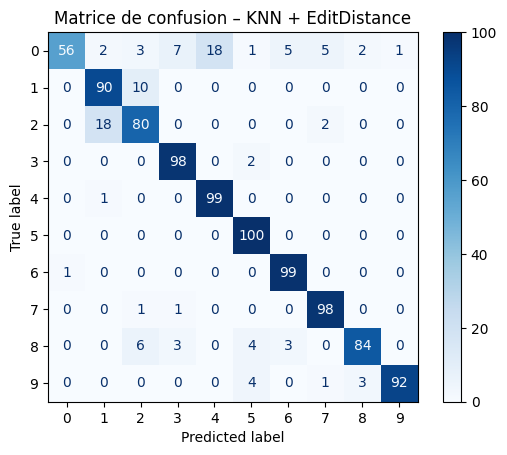

([np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64

In [1]:
import pandas as pd
import numpy as np
from collections import Counter, defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d


# ===========================================================
#               CHARGEMENT ET PREPARATION
# ===========================================================

df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f"Domain1_csv/Subject{subject}-{number}-{iteration}.csv"
            file = pd.read_csv(filename)
            file["gesture"] = number
            file["subject"] = subject
            file["iter"] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']


# ---------- Standardisation ----------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f"{axis}_std"] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(["subject", "gesture", "iter"], group_keys=False).apply(standardize_gesture)



# ---------- Resampling à longueur fixe ----------
def resample_gesture(df, target_len=100):

    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(["gesture", "subject", "iter"]):

        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)

        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            "gesture": [gesture]*target_len,
            "subject": [subject]*target_len,
            "iter": [iteration]*target_len,
            "x_std": interp("x_std"),
            "y_std": interp("y_std"),
            "z_std": interp("z_std")
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


# ===========================================================
#                SEQUENCES DE SYMBOLES
# ===========================================================

def gesture_to_sequence(df):
    seq_dict = defaultdict(list)
    for (gesture, subject, iteration), group in df.groupby(["gesture", "subject", "iter"]):
        seq = "".join(group["symbol"].tolist())
        seq_dict[gesture].append(seq)
    return seq_dict


# ===========================================================
#         CREATION TRAIN/TEST SANS SYMBOLS (CROSS-VAL)
# ===========================================================

def dict_creation_iterout(df, iter_out):
    test_df = df[df["iter"] == iter_out]
    train_df = df[df["iter"] != iter_out]
    return train_df, test_df

def dict_creation_userout(df, subj_out):
    test_df = df[df["subject"] == subj_out]
    train_df = df[df["subject"] != subj_out]
    return train_df, test_df


# ===========================================================
#             CLUSTERING DANS LA CROSS-VALIDATION
# ===========================================================

def cluster_and_convert(df_train, df_test, k_clusters=50):

    # ---- Fit KMeans sur train ----
    train_points = df_train[['x_std', 'y_std', 'z_std']].values
    kmeans = KMeans(n_clusters=k_clusters, random_state=42)
    kmeans.fit(train_points)

    # ---- Attribuer les symboles ----
    def assign_symbols(df_local):
        pts = df_local[['x_std', 'y_std', 'z_std']].values
        clusters = kmeans.predict(pts)
        symbols = [chr(ord('A') + (c % 26)) for c in clusters]
        df_local = df_local.copy()
        df_local["symbol"] = symbols
        return df_local

    train_sym = assign_symbols(df_train)
    test_sym = assign_symbols(df_test)

    # ---- Convertir en chaînes ----
    return gesture_to_sequence(train_sym), gesture_to_sequence(test_sym)



# ===========================================================
#                    EDIT DISTANCE
# ===========================================================

def edit_distance(s1, s2):
    n, m = len(s1), len(s2)
    M = [[0]*(m+1) for _ in range(n+1)]

    for i in range(n+1): M[i][0] = i
    for j in range(m+1): M[0][j] = j

    for i in range(1, n+1):
        for j in range(1, m+1):
            cost = 0 if s1[i-1] == s2[j-1] else 1
            M[i][j] = min(
                M[i-1][j] + 1,
                M[i][j-1] + 1,
                M[i-1][j-1] + cost
            )

    return M[n][m]


# ===========================================================
#                     KNN EDIT DISTANCE
# ===========================================================

def knn_edit_predict(seq, train_dict, k=7):

    distances = []

    for gesture, sequences in train_dict.items():
        for s in sequences:
            d = edit_distance(seq, s)
            distances.append((gesture, d))

    distances.sort(key=lambda x: x[1])
    k_nearest = distances[:k]
    votes = Counter([g for g, _ in k_nearest])

    return votes.most_common(1)[0][0]


# ===========================================================
#                       TEST FINAL
# ===========================================================

def testmodel(DictCreationFunc, df, loop_range=10, k=7, k_clusters=50):

    total_true = []
    total_pred = []

    for i in range(1, loop_range+1):

        print(f"\n=== TEST OUT : {i} ===")

        # Split train/test
        train_df, test_df = DictCreationFunc(df, i)

        # Clustering + symbolisation
        coord_train, coord_test = cluster_and_convert(train_df, test_df, k_clusters)

        y_true, y_pred = [], []

        # KNN
        for gesture, sequences in coord_test.items():
            for seq in sequences:
                pred = knn_edit_predict(seq, coord_train, k=k)
                y_true.append(gesture)
                y_pred.append(pred)

        acc = accuracy_score(y_true, y_pred)
        print(f"Exactitude split {i} : {acc:.2%}")

        total_true.extend(y_true)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\n=== EXACTITUDE GLOBALE : {final_acc:.2%} ===")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – KNN + EditDistance")
    plt.show()

    return total_true, total_pred



# ===========================================================
#                   LANCEMENT DU TEST
# ===========================================================

testmodel(dict_creation_userout, df100)
# testmodel(dict_creation_iterout, df100)

#edti distance knn 7 cluyster 5

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_4980\761922091.py:21: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


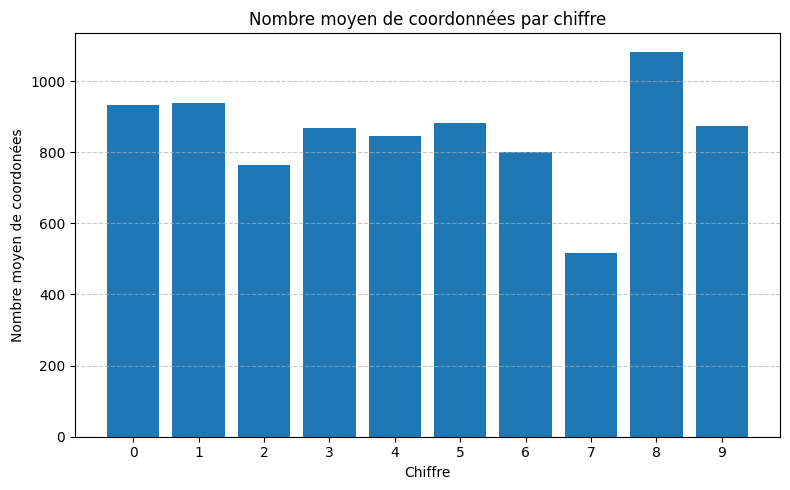

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_4980\761922091.py:56: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test iter/user OUT : 1 ---
Exactitude split 1 : 92.00%

--- Test iter/user OUT : 2 ---
Exactitude split 2 : 73.00%

--- Test iter/user OUT : 3 ---
Exactitude split 3 : 88.00%

--- Test iter/user OUT : 4 ---
Exactitude split 4 : 92.00%

--- Test iter/user OUT : 5 ---
Exactitude split 5 : 80.00%

--- Test iter/user OUT : 6 ---
Exactitude split 6 : 57.00%

--- Test iter/user OUT : 7 ---
Exactitude split 7 : 84.00%

--- Test iter/user OUT : 8 ---
Exactitude split 8 : 97.00%

--- Test iter/user OUT : 9 ---
Exactitude split 9 : 89.00%

--- Test iter/user OUT : 10 ---
Exactitude split 10 : 78.00%

Exactitude globale KNN-EditDistance : 83.00%


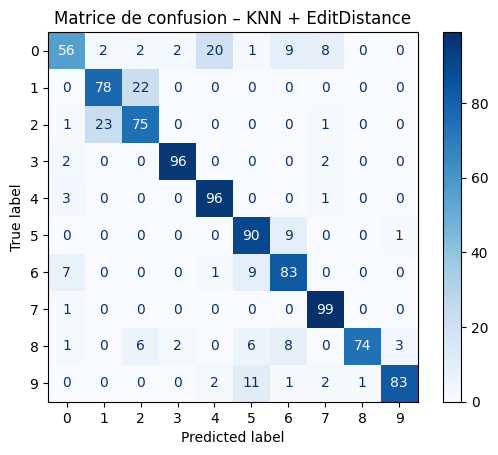

([np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64

In [4]:
import pandas as pd
import numpy as np
from collections import Counter, defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# Création du DataFrame vide
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

# Chargement des fichiers
for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


### Analyse exploratoire ###
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")


### Standardisation ###
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


### Resampling à longueur fixe ###
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)

        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


### Vector Quantization pour convertir points 3D en symboles ###
all_points = df100[['x_std','y_std','z_std']].values
k_clusters = 5
kmeans = KMeans(n_clusters=k_clusters, random_state=42)
kmeans.fit(all_points)

def assign_symbol(row):
    point = np.array([row['x_std'], row['y_std'], row['z_std']])
    cluster_idx = kmeans.predict([point])[0]
    return chr(ord('A') + cluster_idx % 26)

df100['symbol'] = df100.apply(assign_symbol, axis=1)


### Convertir chaque gesture en séquence de symboles ###
def gesture_to_sequence(df):
    seq_dict = defaultdict(list)
    for (gesture, subject, iteration), group in df.groupby(['gesture','subject','iter']):
        seq = ''.join(group['symbol'].tolist())
        seq_dict[gesture].append(seq)
    return seq_dict


### Crée les dictionnaires train/test ### # pas meme dico car cleui la retourne des symbole AAAAOOOCC (par rapport dico dtw retpourne sequence de ppint en 3d)
def dict_creation_iterout(df, iter_out):
    test_df = df[df["iter"] == iter_out]
    train_df = df[df["iter"] != iter_out]
    return gesture_to_sequence(train_df), gesture_to_sequence(test_df)

def dict_creation_userout(df, subj_out):
    test_df = df[df["subject"] == subj_out]
    train_df = df[df["subject"] != subj_out]
    return gesture_to_sequence(train_df), gesture_to_sequence(test_df)


### Edit distance classique ###
def edit_distance(s1, s2):
    n, m = len(s1), len(s2)
    matrix = [[0]*(m+1) for _ in range(n+1)]
    for i in range(n+1):
        matrix[i][0] = i
    for j in range(m+1):
        matrix[0][j] = j
    for i in range(1,n+1):
        for j in range(1,m+1):
            cost = 0 if s1[i-1] == s2[j-1] else 1
            matrix[i][j] = min(
                matrix[i-1][j-1]+cost,  # substitution
                matrix[i][j-1]+1,       # insertion
                matrix[i-1][j]+1        # deletion
            )
    return matrix[n][m]


### KNN basé sur edit distance ###
def knn_edit_predict(seq, train_dict, k=7):   # ici test k 5 au lieu de 3 pour voir si change : Sur des datasets petits → k trop grand peut mélanger des classes,Sur des datasets plus gros → k plus grand stabilise la prédiction,
 #k plus grand → plus robuste aux gestes bruités ou atypiques,k plus petit → plus sensible aux variations locales mais peut mieux capturer les différences subtiles,Plus k est grand → tu regardes plus de séquences similaires avant de voter,Si les distances Edit Distance sont bien séparées → augmentation de k → peu de différence,Si certaines séquences sont très proches entre gestes différents → augmentation de k peut réduire les erreurs ponctuelles
   # testera : k=1 → modèle très sensible au bruit, capture les séquences les plus proches, k=5 → vote plus stable, moins sensible aux outliers
    distances = []
    for gesture, sequences in train_dict.items():
        for s in sequences:
            d = edit_distance(seq, s)
            distances.append((gesture, d))
    distances.sort(key=lambda x: x[1])
    k_nearest = distances[:k]
    votes = Counter([g for g,_ in k_nearest])
    return votes.most_common(1)[0][0]


### TEST DU MODELE ###
def testmodel(DictCreationFunc, df, loop_range=10, k=7):
    total_true = []
    total_pred = []

    for i in range(1, loop_range + 1):
        print(f"\n--- Test iter/user OUT : {i} ---")
        coord_train, coord_test = DictCreationFunc(df, i)

        y_true, y_pred = [], []

        for gesture, sequences in coord_test.items():
            for seq in sequences:
                pred = knn_edit_predict(seq, coord_train, k=k)
                y_true.append(gesture)
                y_pred.append(pred)

        acc = accuracy_score(y_true, y_pred)
        total_true.extend(y_true)
        total_pred.extend(y_pred)
        print(f"Exactitude split {i} : {acc:.2%}")

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale KNN-EditDistance : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – KNN + EditDistance")
    plt.show()

    return total_true, total_pred


### Lancer un test ###
testmodel(dict_creation_userout, df100)
# testmodel(dict_creation_iterout, df100)

# lcsq finql 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_6792\3277079335.py:23: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


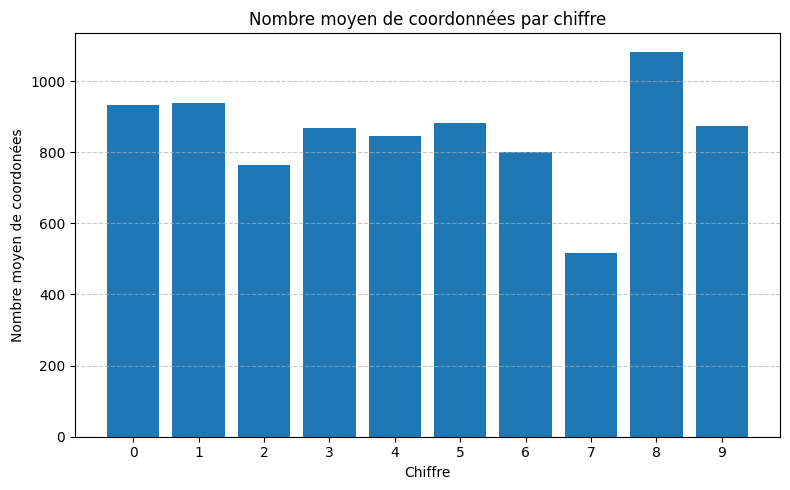

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_6792\3277079335.py:58: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test iter/user OUT : 1 ---
Exactitude split 1 : 94.00%

--- Test iter/user OUT : 2 ---
Exactitude split 2 : 80.00%

--- Test iter/user OUT : 3 ---
Exactitude split 3 : 98.00%

--- Test iter/user OUT : 4 ---
Exactitude split 4 : 100.00%

--- Test iter/user OUT : 5 ---
Exactitude split 5 : 87.00%

--- Test iter/user OUT : 6 ---
Exactitude split 6 : 56.00%

--- Test iter/user OUT : 7 ---
Exactitude split 7 : 85.00%

--- Test iter/user OUT : 8 ---
Exactitude split 8 : 97.00%

--- Test iter/user OUT : 9 ---
Exactitude split 9 : 92.00%

--- Test iter/user OUT : 10 ---
Exactitude split 10 : 90.00%

Exactitude globale KNN-LCS : 87.90%


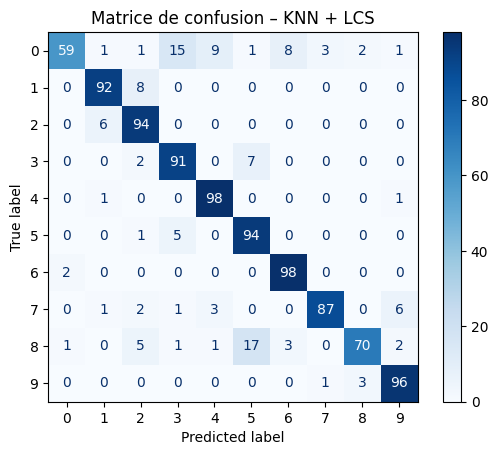

([np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64

In [1]:
### Chargement des données ###

import pandas as pd
import numpy as np
from collections import Counter, defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# Création du DataFrame vide
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

# Chargement des fichiers
for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


### Analyse exploratoire ###
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")


### Standardisation ###
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


### Resampling à longueur fixe ###
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)

        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


### Vector Quantization pour convertir points 3D en symboles ###
all_points = df100[['x_std','y_std','z_std']].values
k_clusters = 50
kmeans = KMeans(n_clusters=k_clusters, random_state=42)
kmeans.fit(all_points)

def assign_symbol(row):
    point = np.array([row['x_std'], row['y_std'], row['z_std']])
    cluster_idx = kmeans.predict([point])[0]
    return chr(ord('A') + cluster_idx % 26)

df100['symbol'] = df100.apply(assign_symbol, axis=1)


### Convertir chaque gesture en séquence de symboles ###
def gesture_to_sequence(df):
    seq_dict = defaultdict(list)
    for (gesture, subject, iteration), group in df.groupby(['gesture','subject','iter']):
        seq = ''.join(group['symbol'].tolist())
        seq_dict[gesture].append(seq)
    return seq_dict


### Crée les dictionnaires train/test ###
def dict_creation_iterout(df, iter_out):
    test_df = df[df["iter"] == iter_out]
    train_df = df[df["iter"] != iter_out]
    return gesture_to_sequence(train_df), gesture_to_sequence(test_df)

def dict_creation_userout(df, subj_out):
    test_df = df[df["subject"] == subj_out]
    train_df = df[df["subject"] != subj_out]
    return gesture_to_sequence(train_df), gesture_to_sequence(test_df)


### Longest Common Subsequence ###
def lcs_length(s1, s2):
    n, m = len(s1), len(s2)
    dp = [[0]*(m+1) for _ in range(n+1)]
    for i in range(1, n+1):
        for j in range(1, m+1):
            if s1[i-1] == s2[j-1]:
                dp[i][j] = dp[i-1][j-1]+1
            else:
                dp[i][j] = max(dp[i-1][j], dp[i][j-1])
    return dp[n][m]

def lcs_distance(s1, s2):
    # distance = len(s1) + len(s2) - 2*LCS
    return len(s1) + len(s2) - 2*lcs_length(s1, s2)


### KNN basé sur LCS ###
def knn_lcs_predict(seq, train_dict, k=3):
    distances = []
    for gesture, sequences in train_dict.items():
        for s in sequences:
            d = lcs_distance(seq, s)
            distances.append((gesture, d))
    distances.sort(key=lambda x: x[1])
    k_nearest = distances[:k]
    votes = Counter([g for g,_ in k_nearest])
    return votes.most_common(1)[0][0]


### TEST DU MODELE ###
def testmodel(DictCreationFunc, df, loop_range=10, k=3):
    total_true = []
    total_pred = []

    for i in range(1, loop_range + 1):
        print(f"\n--- Test iter/user OUT : {i} ---")
        coord_train, coord_test = DictCreationFunc(df, i)

        y_true, y_pred = [], []

        for gesture, sequences in coord_test.items():
            for seq in sequences:
                pred = knn_lcs_predict(seq, coord_train, k=k)
                y_true.append(gesture)
                y_pred.append(pred)

        acc = accuracy_score(y_true, y_pred)
        total_true.extend(y_true)
        total_pred.extend(y_pred)
        print(f"Exactitude split {i} : {acc:.2%}")

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale KNN-LCS : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – KNN + LCS")
    plt.show()

    return total_true, total_pred


### Lancer un test ###
testmodel(dict_creation_userout, df100)
# testmodel(dict_creation_iterout, df100)

#Lcq cluster 20 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_13680\4134190547.py:23: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


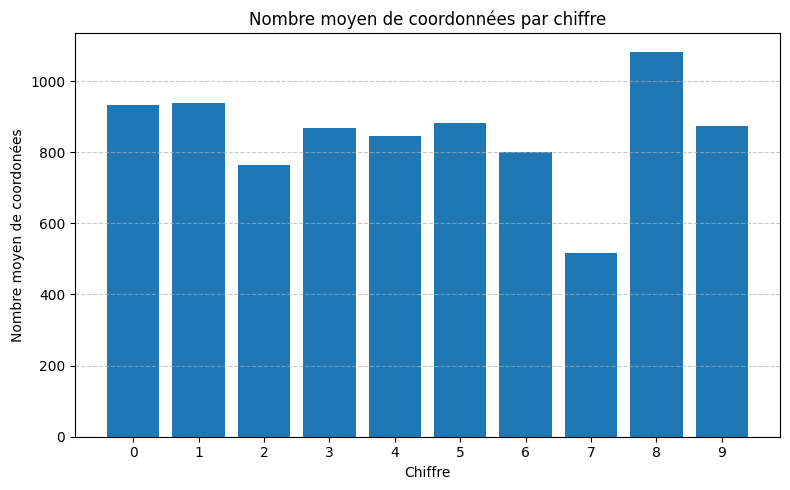

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_13680\4134190547.py:58: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test iter/user OUT : 1 ---
Exactitude split 1 : 90.00%

--- Test iter/user OUT : 2 ---
Exactitude split 2 : 86.00%

--- Test iter/user OUT : 3 ---
Exactitude split 3 : 99.00%

--- Test iter/user OUT : 4 ---
Exactitude split 4 : 97.00%

--- Test iter/user OUT : 5 ---
Exactitude split 5 : 88.00%

--- Test iter/user OUT : 6 ---
Exactitude split 6 : 52.00%

--- Test iter/user OUT : 7 ---
Exactitude split 7 : 88.00%

--- Test iter/user OUT : 8 ---
Exactitude split 8 : 96.00%

--- Test iter/user OUT : 9 ---
Exactitude split 9 : 96.00%

--- Test iter/user OUT : 10 ---
Exactitude split 10 : 93.00%

Exactitude globale KNN-LCS : 88.50%


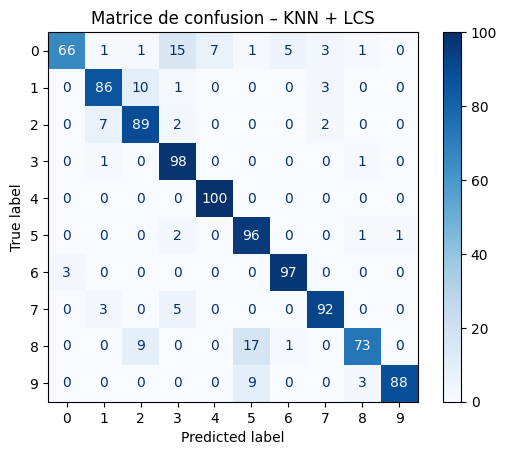

([np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64

In [8]:
### Chargement des données ###

import pandas as pd
import numpy as np
from collections import Counter, defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# Création du DataFrame vide
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

# Chargement des fichiers
for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


### Analyse exploratoire ###
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")


### Standardisation ###
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


### Resampling à longueur fixe ###
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)

        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


### Vector Quantization pour convertir points 3D en symboles ###
all_points = df100[['x_std','y_std','z_std']].values
k_clusters = 20
kmeans = KMeans(n_clusters=k_clusters, random_state=42)
kmeans.fit(all_points)

def assign_symbol(row):
    point = np.array([row['x_std'], row['y_std'], row['z_std']])
    cluster_idx = kmeans.predict([point])[0]
    return chr(ord('A') + cluster_idx % 26)

df100['symbol'] = df100.apply(assign_symbol, axis=1)


### Convertir chaque gesture en séquence de symboles ###
def gesture_to_sequence(df):
    seq_dict = defaultdict(list)
    for (gesture, subject, iteration), group in df.groupby(['gesture','subject','iter']):
        seq = ''.join(group['symbol'].tolist())
        seq_dict[gesture].append(seq)
    return seq_dict


### Crée les dictionnaires train/test ###
def dict_creation_iterout(df, iter_out):
    test_df = df[df["iter"] == iter_out]
    train_df = df[df["iter"] != iter_out]
    return gesture_to_sequence(train_df), gesture_to_sequence(test_df)

def dict_creation_userout(df, subj_out):
    test_df = df[df["subject"] == subj_out]
    train_df = df[df["subject"] != subj_out]
    return gesture_to_sequence(train_df), gesture_to_sequence(test_df)


### Longest Common Subsequence ###
def lcs_length(s1, s2):
    n, m = len(s1), len(s2)
    dp = [[0]*(m+1) for _ in range(n+1)]
    for i in range(1, n+1):
        for j in range(1, m+1):
            if s1[i-1] == s2[j-1]:
                dp[i][j] = dp[i-1][j-1]+1
            else:
                dp[i][j] = max(dp[i-1][j], dp[i][j-1])
    return dp[n][m]

def lcs_distance(s1, s2):
    # distance = len(s1) + len(s2) - 2*LCS
    return len(s1) + len(s2) - 2*lcs_length(s1, s2)


### KNN basé sur LCS ###
def knn_lcs_predict(seq, train_dict, k=3):
    distances = []
    for gesture, sequences in train_dict.items():
        for s in sequences:
            d = lcs_distance(seq, s)
            distances.append((gesture, d))
    distances.sort(key=lambda x: x[1])
    k_nearest = distances[:k]
    votes = Counter([g for g,_ in k_nearest])
    return votes.most_common(1)[0][0]


### TEST DU MODELE ###
def testmodel(DictCreationFunc, df, loop_range=10, k=3):
    total_true = []
    total_pred = []

    for i in range(1, loop_range + 1):
        print(f"\n--- Test iter/user OUT : {i} ---")
        coord_train, coord_test = DictCreationFunc(df, i)

        y_true, y_pred = [], []

        for gesture, sequences in coord_test.items():
            for seq in sequences:
                pred = knn_lcs_predict(seq, coord_train, k=k)
                y_true.append(gesture)
                y_pred.append(pred)

        acc = accuracy_score(y_true, y_pred)
        total_true.extend(y_true)
        total_pred.extend(y_pred)
        print(f"Exactitude split {i} : {acc:.2%}")

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale KNN-LCS : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – KNN + LCS")
    plt.show()

    return total_true, total_pred


### Lancer un test ###
testmodel(dict_creation_userout, df100)
# testmodel(dict_creation_iterout, df100)

# lcss knn 3 cluster 20 crossvalid cluisrter dedans 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_15020\3009607417.py:25: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])
C:\Users\Isadiki\AppData\Local\Temp\ipykernel_15020\3009607417.py:36: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- TEST SUJET SORTI : 1 ---
Précision pour ce split : 93.00%

--- TEST SUJET SORTI : 2 ---
Précision pour ce split : 87.00%

--- TEST SUJET SORTI : 3 ---
Précision pour ce split : 98.00%

--- TEST SUJET SORTI : 4 ---
Précision pour ce split : 98.00%

--- TEST SUJET SORTI : 5 ---
Précision pour ce split : 90.00%

--- TEST SUJET SORTI : 6 ---
Précision pour ce split : 55.00%

--- TEST SUJET SORTI : 7 ---
Précision pour ce split : 89.00%

--- TEST SUJET SORTI : 8 ---
Précision pour ce split : 96.00%

--- TEST SUJET SORTI : 9 ---
Précision pour ce split : 99.00%

--- TEST SUJET SORTI : 10 ---
Précision pour ce split : 93.00%

=== EXACTITUDE GLOBALE : 89.80% ===


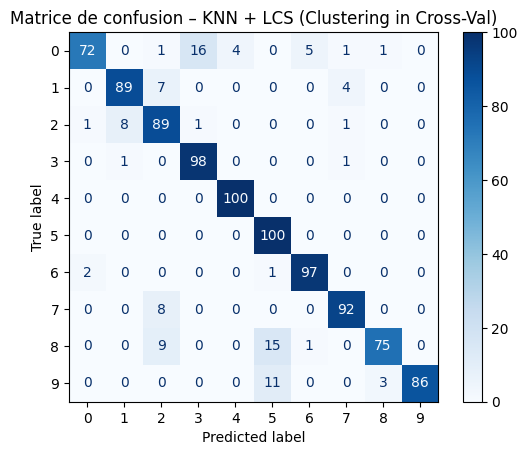

In [2]:
import pandas as pd
import numpy as np
from collections import Counter, defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# ===========================================================
# 1. CHARGEMENT ET PRÉPARATION
# ===========================================================

df = pd.DataFrame(columns=['x', 'y', 'z', 't', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            try:
                file = pd.read_csv(filename)
                file['gesture'] = number
                file['subject'] = subject
                file['iter'] = iteration
                file.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
                df = pd.concat([df, file])
            except FileNotFoundError:
                continue

# ---------- Standardisation ----------
def standardize_gesture(df_group):
    res = df_group.copy()
    for axis in ['x', 'y', 'z']:
        res[f'{axis}_std'] = (res[axis] - res[axis].mean()) / res[axis].std()
    return res

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)

# ---------- Resampling à longueur fixe ----------
def resample_gesture(df_input, target_len=100):
    resampled_data = []
    for (gesture, subject, iteration), group in df_input.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        if n < 2: continue
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))
    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ===========================================================
# 2. LOGIQUE CLUSTERING ET CONVERSION (INTERNE)
# ===========================================================

def cluster_and_symbolize(train_df, test_df, k_clusters=20):
    # Fit KMeans UNIQUEMENT sur le train
    kmeans = KMeans(n_clusters=k_clusters, random_state=42, n_init=10)
    train_points = train_df[['x_std', 'y_std', 'z_std']].values
    kmeans.fit(train_points)

    def to_seq_dict(df_target):
        # Attribution des symboles
        pts = df_target[['x_std', 'y_std', 'z_std']].values
        clusters = kmeans.predict(pts)
        symbols = [chr(ord('A') + (c % 26)) for c in clusters]
        
        temp_df = df_target.copy()
        temp_df['symbol'] = symbols
        
        # Groupement en chaînes de caractères
        seq_dict = defaultdict(list)
        for (gest, subj, it), group in temp_df.groupby(['gesture', 'subject', 'iter']):
            seq_dict[gest].append("".join(group['symbol'].tolist()))
        return seq_dict

    return to_seq_dict(train_df), to_seq_dict(test_df)

# ===========================================================
# 3. ALGORITHME LCSS
# ===========================================================

def lcs_length(s1, s2):
    n, m = len(s1), len(s2)
    dp = [[0]*(m+1) for _ in range(n+1)]
    for i in range(1, n+1):
        for j in range(1, m+1):
            if s1[i-1] == s2[j-1]:
                dp[i][j] = dp[i-1][j-1] + 1
            else:
                dp[i][j] = max(dp[i-1][j], dp[i][j-1])
    return dp[n][m]

def lcs_distance(s1, s2):
    return len(s1) + len(s2) - 2 * lcs_length(s1, s2)

def knn_lcs_predict(seq, train_dict, k=3):
    distances = []
    for gesture, sequences in train_dict.items():
        for s in sequences:
            d = lcs_distance(seq, s)
            distances.append((gesture, d))
    distances.sort(key=lambda x: x[1])
    k_nearest = distances[:k]
    votes = Counter([g for g, _ in k_nearest])
    return votes.most_common(1)[0][0]

# ===========================================================
# 4. SPLITS ET TEST FINAL
# ===========================================================

def dict_creation_userout(df_in, subj_out):
    test_df = df_in[df_in["subject"] == subj_out]
    train_df = df_in[df_in["subject"] != subj_out]
    return train_df, test_df

def testmodel(df_input, loop_range=10, k_knn=3, k_clusters=20):
    total_true, total_pred = [], []

    for i in range(1, loop_range + 1):
        print(f"\n--- TEST SUJET SORTI : {i} ---")
        
        # 1. Split (sur DataFrames bruts)
        train_df, test_df = dict_creation_userout(df_input, i)
        if test_df.empty: continue

        # 2. Clustering & Symbolisation (Interne au split)
        train_dict, test_dict = cluster_and_symbolize(train_df, test_df, k_clusters)

        # 3. Prédiction
        y_true, y_pred = [], []
        for gesture, sequences in test_dict.items():
            for seq in sequences:
                pred = knn_lcs_predict(seq, train_dict, k=k_knn)
                y_true.append(gesture)
                y_pred.append(pred)

        acc = accuracy_score(y_true, y_pred)
        print(f"Précision pour ce split : {acc:.2%}")
        total_true.extend(y_true)
        total_pred.extend(y_pred)

    print(f"\n=== EXACTITUDE GLOBALE : {accuracy_score(total_true, total_pred):.2%} ===")
    
    # Matrice de confusion
    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – KNN + LCS (Clustering in Cross-Val)")
    plt.show()

# LANCEMENT
testmodel(df100)

# lcs knn 3 cluster 50 cmlsuer dedans 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_15020\3489189921.py:25: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])
C:\Users\Isadiki\AppData\Local\Temp\ipykernel_15020\3489189921.py:36: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- TEST SUJET SORTI : 1 ---
Précision pour ce split : 93.00%

--- TEST SUJET SORTI : 2 ---
Précision pour ce split : 87.00%

--- TEST SUJET SORTI : 3 ---
Précision pour ce split : 91.00%

--- TEST SUJET SORTI : 4 ---
Précision pour ce split : 99.00%

--- TEST SUJET SORTI : 5 ---
Précision pour ce split : 84.00%

--- TEST SUJET SORTI : 6 ---
Précision pour ce split : 40.00%

--- TEST SUJET SORTI : 7 ---
Précision pour ce split : 80.00%

--- TEST SUJET SORTI : 8 ---
Précision pour ce split : 96.00%

--- TEST SUJET SORTI : 9 ---
Précision pour ce split : 96.00%

--- TEST SUJET SORTI : 10 ---
Précision pour ce split : 89.00%

=== EXACTITUDE GLOBALE : 85.50% ===


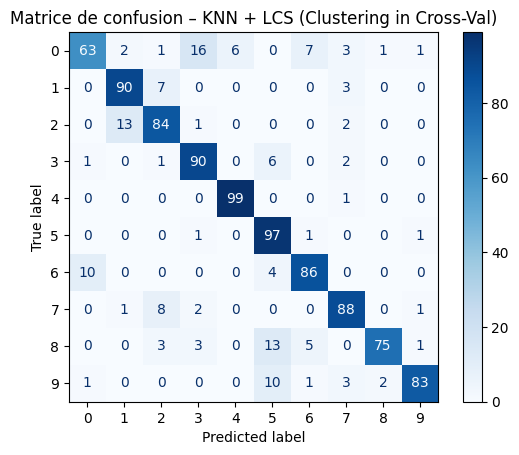

In [5]:
import pandas as pd
import numpy as np
from collections import Counter, defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# ===========================================================
# 1. CHARGEMENT ET PRÉPARATION
# ===========================================================

df = pd.DataFrame(columns=['x', 'y', 'z', 't', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            try:
                file = pd.read_csv(filename)
                file['gesture'] = number
                file['subject'] = subject
                file['iter'] = iteration
                file.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
                df = pd.concat([df, file])
            except FileNotFoundError:
                continue

# ---------- Standardisation ----------
def standardize_gesture(df_group):
    res = df_group.copy()
    for axis in ['x', 'y', 'z']:
        res[f'{axis}_std'] = (res[axis] - res[axis].mean()) / res[axis].std()
    return res

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)

# ---------- Resampling à longueur fixe ----------
def resample_gesture(df_input, target_len=100):
    resampled_data = []
    for (gesture, subject, iteration), group in df_input.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        if n < 2: continue
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))
    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ===========================================================
# 2. LOGIQUE CLUSTERING ET CONVERSION (INTERNE)
# ===========================================================

def cluster_and_symbolize(train_df, test_df, k_clusters=50):
    # Fit KMeans UNIQUEMENT sur le train
    kmeans = KMeans(n_clusters=k_clusters, random_state=42, n_init=10)
    train_points = train_df[['x_std', 'y_std', 'z_std']].values
    kmeans.fit(train_points)

    def to_seq_dict(df_target):
        # Attribution des symboles
        pts = df_target[['x_std', 'y_std', 'z_std']].values
        clusters = kmeans.predict(pts)
        symbols = [chr(ord('A') + (c % 26)) for c in clusters]
        
        temp_df = df_target.copy()
        temp_df['symbol'] = symbols
        
        # Groupement en chaînes de caractères
        seq_dict = defaultdict(list)
        for (gest, subj, it), group in temp_df.groupby(['gesture', 'subject', 'iter']):
            seq_dict[gest].append("".join(group['symbol'].tolist()))
        return seq_dict

    return to_seq_dict(train_df), to_seq_dict(test_df)

# ===========================================================
# 3. ALGORITHME LCSS
# ===========================================================

def lcs_length(s1, s2):
    n, m = len(s1), len(s2)
    dp = [[0]*(m+1) for _ in range(n+1)]
    for i in range(1, n+1):
        for j in range(1, m+1):
            if s1[i-1] == s2[j-1]:
                dp[i][j] = dp[i-1][j-1] + 1
            else:
                dp[i][j] = max(dp[i-1][j], dp[i][j-1])
    return dp[n][m]

def lcs_distance(s1, s2):
    return len(s1) + len(s2) - 2 * lcs_length(s1, s2)

def knn_lcs_predict(seq, train_dict, k=3):
    distances = []
    for gesture, sequences in train_dict.items():
        for s in sequences:
            d = lcs_distance(seq, s)
            distances.append((gesture, d))
    distances.sort(key=lambda x: x[1])
    k_nearest = distances[:k]
    votes = Counter([g for g, _ in k_nearest])
    return votes.most_common(1)[0][0]

# ===========================================================
# 4. SPLITS ET TEST FINAL
# ===========================================================

def dict_creation_userout(df_in, subj_out):
    test_df = df_in[df_in["subject"] == subj_out]
    train_df = df_in[df_in["subject"] != subj_out]
    return train_df, test_df

def testmodel(df_input, loop_range=10, k_knn=3, k_clusters=50):
    total_true, total_pred = [], []

    for i in range(1, loop_range + 1):
        print(f"\n--- TEST SUJET SORTI : {i} ---")
        
        # 1. Split (sur DataFrames bruts)
        train_df, test_df = dict_creation_userout(df_input, i)
        if test_df.empty: continue

        # 2. Clustering & Symbolisation (Interne au split)
        train_dict, test_dict = cluster_and_symbolize(train_df, test_df, k_clusters)

        # 3. Prédiction
        y_true, y_pred = [], []
        for gesture, sequences in test_dict.items():
            for seq in sequences:
                pred = knn_lcs_predict(seq, train_dict, k=k_knn)
                y_true.append(gesture)
                y_pred.append(pred)

        acc = accuracy_score(y_true, y_pred)
        print(f"Précision pour ce split : {acc:.2%}")
        total_true.extend(y_true)
        total_pred.extend(y_pred)

    print(f"\n=== EXACTITUDE GLOBALE : {accuracy_score(total_true, total_pred):.2%} ===")
    
    # Matrice de confusion
    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – KNN + LCS (Clustering in Cross-Val)")
    plt.show()

# LANCEMENT
testmodel(df100)

#lcs cluster 40 knn3

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_4980\3205195072.py:23: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


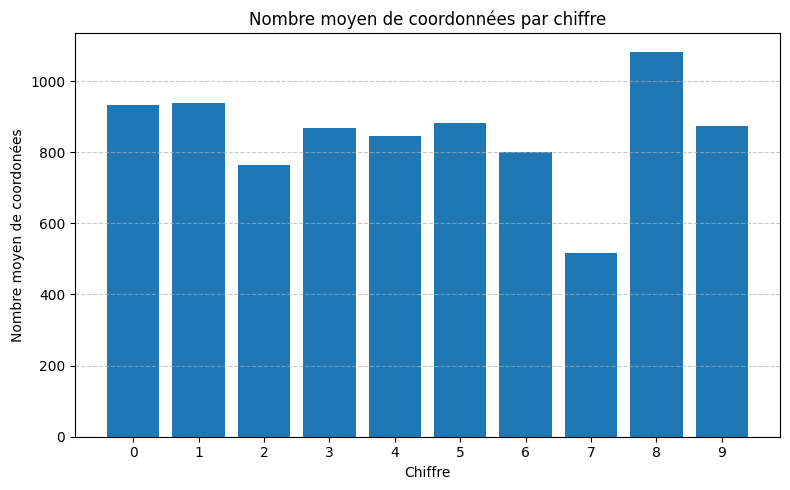

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_4980\3205195072.py:58: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test iter/user OUT : 1 ---
Exactitude split 1 : 93.00%

--- Test iter/user OUT : 2 ---
Exactitude split 2 : 85.00%

--- Test iter/user OUT : 3 ---
Exactitude split 3 : 90.00%

--- Test iter/user OUT : 4 ---
Exactitude split 4 : 100.00%

--- Test iter/user OUT : 5 ---
Exactitude split 5 : 82.00%

--- Test iter/user OUT : 6 ---
Exactitude split 6 : 47.00%

--- Test iter/user OUT : 7 ---
Exactitude split 7 : 83.00%

--- Test iter/user OUT : 8 ---
Exactitude split 8 : 95.00%

--- Test iter/user OUT : 9 ---
Exactitude split 9 : 95.00%

--- Test iter/user OUT : 10 ---
Exactitude split 10 : 89.00%

Exactitude globale KNN-LCS : 85.90%


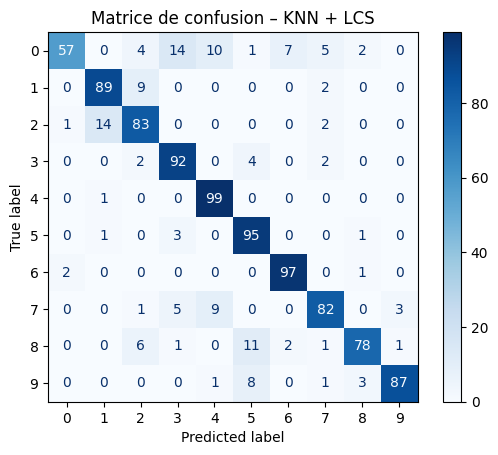

([np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64

In [2]:
### Chargement des données ###

import pandas as pd
import numpy as np
from collections import Counter, defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# Création du DataFrame vide
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

# Chargement des fichiers
for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


### Analyse exploratoire ###
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")


### Standardisation ###
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


### Resampling à longueur fixe ###
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)

        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


### Vector Quantization pour convertir points 3D en symboles ###
all_points = df100[['x_std','y_std','z_std']].values
k_clusters = 40
kmeans = KMeans(n_clusters=k_clusters, random_state=42)
kmeans.fit(all_points)

def assign_symbol(row):
    point = np.array([row['x_std'], row['y_std'], row['z_std']])
    cluster_idx = kmeans.predict([point])[0]
    return chr(ord('A') + cluster_idx % 26)

df100['symbol'] = df100.apply(assign_symbol, axis=1)


### Convertir chaque gesture en séquence de symboles ###
def gesture_to_sequence(df):
    seq_dict = defaultdict(list)
    for (gesture, subject, iteration), group in df.groupby(['gesture','subject','iter']):
        seq = ''.join(group['symbol'].tolist())
        seq_dict[gesture].append(seq)
    return seq_dict


### Crée les dictionnaires train/test ###
def dict_creation_iterout(df, iter_out):
    test_df = df[df["iter"] == iter_out]
    train_df = df[df["iter"] != iter_out]
    return gesture_to_sequence(train_df), gesture_to_sequence(test_df)

def dict_creation_userout(df, subj_out):
    test_df = df[df["subject"] == subj_out]
    train_df = df[df["subject"] != subj_out]
    return gesture_to_sequence(train_df), gesture_to_sequence(test_df)


### Longest Common Subsequence ###
def lcs_length(s1, s2):
    n, m = len(s1), len(s2)
    dp = [[0]*(m+1) for _ in range(n+1)]
    for i in range(1, n+1):
        for j in range(1, m+1):
            if s1[i-1] == s2[j-1]:
                dp[i][j] = dp[i-1][j-1]+1
            else:
                dp[i][j] = max(dp[i-1][j], dp[i][j-1])
    return dp[n][m]

def lcs_distance(s1, s2):
    # distance = len(s1) + len(s2) - 2*LCS
    return len(s1) + len(s2) - 2*lcs_length(s1, s2)


### KNN basé sur LCS ###
def knn_lcs_predict(seq, train_dict, k=3):
    distances = []
    for gesture, sequences in train_dict.items():
        for s in sequences:
            d = lcs_distance(seq, s)
            distances.append((gesture, d))
    distances.sort(key=lambda x: x[1])
    k_nearest = distances[:k]
    votes = Counter([g for g,_ in k_nearest])
    return votes.most_common(1)[0][0]


### TEST DU MODELE ###
def testmodel(DictCreationFunc, df, loop_range=10, k=3):
    total_true = []
    total_pred = []

    for i in range(1, loop_range + 1):
        print(f"\n--- Test iter/user OUT : {i} ---")
        coord_train, coord_test = DictCreationFunc(df, i)

        y_true, y_pred = [], []

        for gesture, sequences in coord_test.items():
            for seq in sequences:
                pred = knn_lcs_predict(seq, coord_train, k=k)
                y_true.append(gesture)
                y_pred.append(pred)

        acc = accuracy_score(y_true, y_pred)
        total_true.extend(y_true)
        total_pred.extend(y_pred)
        print(f"Exactitude split {i} : {acc:.2%}")

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale KNN-LCS : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – KNN + LCS")
    plt.show()

    return total_true, total_pred


### Lancer un test ###
testmodel(dict_creation_userout, df100)
# testmodel(dict_crea

#lcq cluster 5

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_13680\3091887207.py:23: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


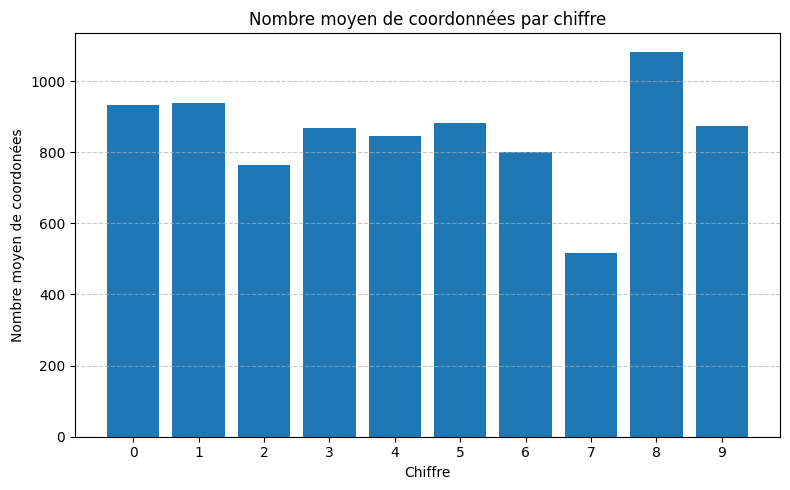

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_13680\3091887207.py:58: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test iter/user OUT : 1 ---
Exactitude split 1 : 89.00%

--- Test iter/user OUT : 2 ---
Exactitude split 2 : 73.00%

--- Test iter/user OUT : 3 ---
Exactitude split 3 : 89.00%

--- Test iter/user OUT : 4 ---
Exactitude split 4 : 92.00%

--- Test iter/user OUT : 5 ---
Exactitude split 5 : 72.00%

--- Test iter/user OUT : 6 ---
Exactitude split 6 : 44.00%

--- Test iter/user OUT : 7 ---
Exactitude split 7 : 82.00%

--- Test iter/user OUT : 8 ---
Exactitude split 8 : 92.00%

--- Test iter/user OUT : 9 ---
Exactitude split 9 : 85.00%

--- Test iter/user OUT : 10 ---
Exactitude split 10 : 83.00%

Exactitude globale KNN-LCS : 80.10%


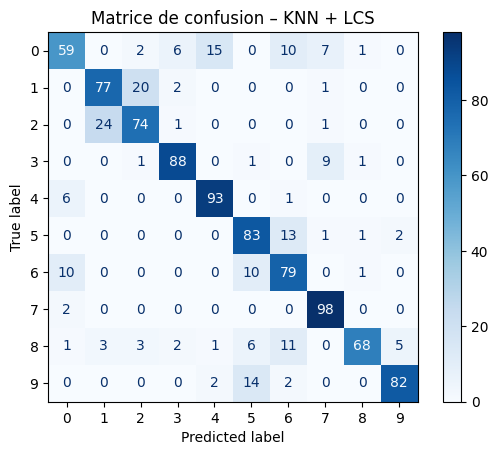

([np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64

In [9]:
### Chargement des données ###

import pandas as pd
import numpy as np
from collections import Counter, defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# Création du DataFrame vide
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

# Chargement des fichiers
for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


### Analyse exploratoire ###
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")


### Standardisation ###
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


### Resampling à longueur fixe ###
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)

        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


### Vector Quantization pour convertir points 3D en symboles ###
all_points = df100[['x_std','y_std','z_std']].values
k_clusters = 5
kmeans = KMeans(n_clusters=k_clusters, random_state=42)
kmeans.fit(all_points)

def assign_symbol(row):
    point = np.array([row['x_std'], row['y_std'], row['z_std']])
    cluster_idx = kmeans.predict([point])[0]
    return chr(ord('A') + cluster_idx % 26)

df100['symbol'] = df100.apply(assign_symbol, axis=1)


### Convertir chaque gesture en séquence de symboles ###
def gesture_to_sequence(df):
    seq_dict = defaultdict(list)
    for (gesture, subject, iteration), group in df.groupby(['gesture','subject','iter']):
        seq = ''.join(group['symbol'].tolist())
        seq_dict[gesture].append(seq)
    return seq_dict


### Crée les dictionnaires train/test ###
def dict_creation_iterout(df, iter_out):
    test_df = df[df["iter"] == iter_out]
    train_df = df[df["iter"] != iter_out]
    return gesture_to_sequence(train_df), gesture_to_sequence(test_df)

def dict_creation_userout(df, subj_out):
    test_df = df[df["subject"] == subj_out]
    train_df = df[df["subject"] != subj_out]
    return gesture_to_sequence(train_df), gesture_to_sequence(test_df)


### Longest Common Subsequence ###
def lcs_length(s1, s2):
    n, m = len(s1), len(s2)
    dp = [[0]*(m+1) for _ in range(n+1)]
    for i in range(1, n+1):
        for j in range(1, m+1):
            if s1[i-1] == s2[j-1]:
                dp[i][j] = dp[i-1][j-1]+1
            else:
                dp[i][j] = max(dp[i-1][j], dp[i][j-1])
    return dp[n][m]

def lcs_distance(s1, s2):
    # distance = len(s1) + len(s2) - 2*LCS
    return len(s1) + len(s2) - 2*lcs_length(s1, s2)


### KNN basé sur LCS ###
def knn_lcs_predict(seq, train_dict, k=3):
    distances = []
    for gesture, sequences in train_dict.items():
        for s in sequences:
            d = lcs_distance(seq, s)
            distances.append((gesture, d))
    distances.sort(key=lambda x: x[1])
    k_nearest = distances[:k]
    votes = Counter([g for g,_ in k_nearest])
    return votes.most_common(1)[0][0]


### TEST DU MODELE ###
def testmodel(DictCreationFunc, df, loop_range=10, k=3):
    total_true = []
    total_pred = []

    for i in range(1, loop_range + 1):
        print(f"\n--- Test iter/user OUT : {i} ---")
        coord_train, coord_test = DictCreationFunc(df, i)

        y_true, y_pred = [], []

        for gesture, sequences in coord_test.items():
            for seq in sequences:
                pred = knn_lcs_predict(seq, coord_train, k=k)
                y_true.append(gesture)
                y_pred.append(pred)

        acc = accuracy_score(y_true, y_pred)
        total_true.extend(y_true)
        total_pred.extend(y_pred)
        print(f"Exactitude split {i} : {acc:.2%}")

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale KNN-LCS : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – KNN + LCS")
    plt.show()

    return total_true, total_pred


### Lancer un test ###
testmodel(dict_creation_userout, df100)
# testmodel(dict_creation_iterout, df100)

#lcsq knn 5 cluster 20

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_4980\3467438156.py:23: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


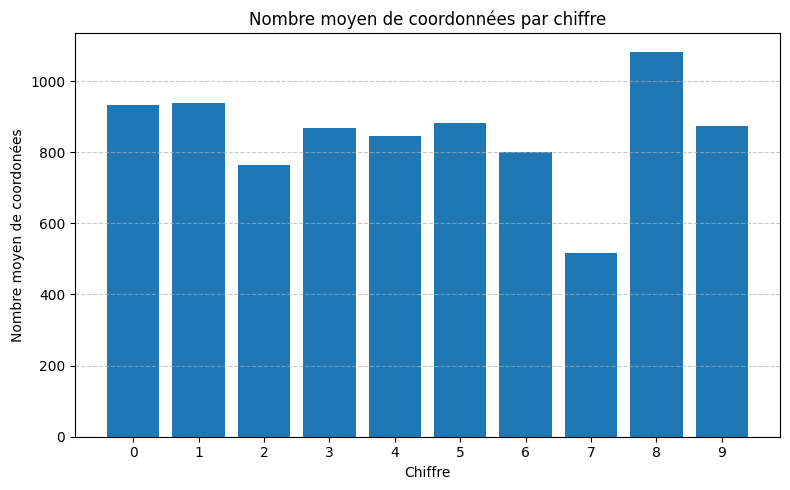

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_4980\3467438156.py:58: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test iter/user OUT : 1 ---
Exactitude split 1 : 89.00%

--- Test iter/user OUT : 2 ---
Exactitude split 2 : 86.00%

--- Test iter/user OUT : 3 ---
Exactitude split 3 : 100.00%

--- Test iter/user OUT : 4 ---
Exactitude split 4 : 98.00%

--- Test iter/user OUT : 5 ---
Exactitude split 5 : 90.00%

--- Test iter/user OUT : 6 ---
Exactitude split 6 : 54.00%

--- Test iter/user OUT : 7 ---
Exactitude split 7 : 88.00%

--- Test iter/user OUT : 8 ---
Exactitude split 8 : 95.00%

--- Test iter/user OUT : 9 ---
Exactitude split 9 : 94.00%

--- Test iter/user OUT : 10 ---
Exactitude split 10 : 92.00%

Exactitude globale KNN-LCS : 88.60%


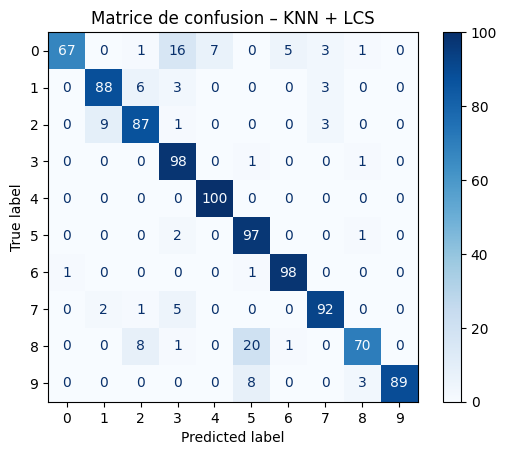

([np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64

In [5]:
### Chargement des données ###

import pandas as pd
import numpy as np
from collections import Counter, defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# Création du DataFrame vide
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

# Chargement des fichiers
for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


### Analyse exploratoire ###
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")


### Standardisation ###
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


### Resampling à longueur fixe ###
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)

        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


### Vector Quantization pour convertir points 3D en symboles ###
all_points = df100[['x_std','y_std','z_std']].values
k_clusters = 20
kmeans = KMeans(n_clusters=k_clusters, random_state=42)
kmeans.fit(all_points)

def assign_symbol(row):
    point = np.array([row['x_std'], row['y_std'], row['z_std']])
    cluster_idx = kmeans.predict([point])[0]
    return chr(ord('A') + cluster_idx % 26)

df100['symbol'] = df100.apply(assign_symbol, axis=1)


### Convertir chaque gesture en séquence de symboles ###
def gesture_to_sequence(df):
    seq_dict = defaultdict(list)
    for (gesture, subject, iteration), group in df.groupby(['gesture','subject','iter']):
        seq = ''.join(group['symbol'].tolist())
        seq_dict[gesture].append(seq)
    return seq_dict


### Crée les dictionnaires train/test ###
def dict_creation_iterout(df, iter_out):
    test_df = df[df["iter"] == iter_out]
    train_df = df[df["iter"] != iter_out]
    return gesture_to_sequence(train_df), gesture_to_sequence(test_df)

def dict_creation_userout(df, subj_out):
    test_df = df[df["subject"] == subj_out]
    train_df = df[df["subject"] != subj_out]
    return gesture_to_sequence(train_df), gesture_to_sequence(test_df)


### Longest Common Subsequence ###
def lcs_length(s1, s2):
    n, m = len(s1), len(s2)
    dp = [[0]*(m+1) for _ in range(n+1)]
    for i in range(1, n+1):
        for j in range(1, m+1):
            if s1[i-1] == s2[j-1]:
                dp[i][j] = dp[i-1][j-1]+1
            else:
                dp[i][j] = max(dp[i-1][j], dp[i][j-1])
    return dp[n][m]

def lcs_distance(s1, s2):
    # distance = len(s1) + len(s2) - 2*LCS
    return len(s1) + len(s2) - 2*lcs_length(s1, s2)


### KNN basé sur LCS ###
def knn_lcs_predict(seq, train_dict, k=5):
    distances = []
    for gesture, sequences in train_dict.items():
        for s in sequences:
            d = lcs_distance(seq, s)
            distances.append((gesture, d))
    distances.sort(key=lambda x: x[1])
    k_nearest = distances[:k]
    votes = Counter([g for g,_ in k_nearest])
    return votes.most_common(1)[0][0]


### TEST DU MODELE ###
def testmodel(DictCreationFunc, df, loop_range=10, k=5):
    total_true = []
    total_pred = []

    for i in range(1, loop_range + 1):
        print(f"\n--- Test iter/user OUT : {i} ---")
        coord_train, coord_test = DictCreationFunc(df, i)

        y_true, y_pred = [], []

        for gesture, sequences in coord_test.items():
            for seq in sequences:
                pred = knn_lcs_predict(seq, coord_train, k=k)
                y_true.append(gesture)
                y_pred.append(pred)

        acc = accuracy_score(y_true, y_pred)
        total_true.extend(y_true)
        total_pred.extend(y_pred)
        print(f"Exactitude split {i} : {acc:.2%}")

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale KNN-LCS : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – KNN + LCS")
    plt.show()

    return total_true, total_pred


### Lancer un test ###
testmodel(dict_creation_userout, df100)
# testmodel(dict_creation_iterout, df100)

# lcss knn 5 cluser 20 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_15020\1134994019.py:25: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])
C:\Users\Isadiki\AppData\Local\Temp\ipykernel_15020\1134994019.py:36: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- TEST SUJET SORTI : 1 ---
Précision pour ce split : 91.00%

--- TEST SUJET SORTI : 2 ---
Précision pour ce split : 86.00%

--- TEST SUJET SORTI : 3 ---
Précision pour ce split : 99.00%

--- TEST SUJET SORTI : 4 ---
Précision pour ce split : 98.00%

--- TEST SUJET SORTI : 5 ---
Précision pour ce split : 90.00%

--- TEST SUJET SORTI : 6 ---
Précision pour ce split : 55.00%

--- TEST SUJET SORTI : 7 ---
Précision pour ce split : 88.00%

--- TEST SUJET SORTI : 8 ---
Précision pour ce split : 96.00%

--- TEST SUJET SORTI : 9 ---
Précision pour ce split : 98.00%

--- TEST SUJET SORTI : 10 ---
Précision pour ce split : 92.00%

=== EXACTITUDE GLOBALE : 89.30% ===


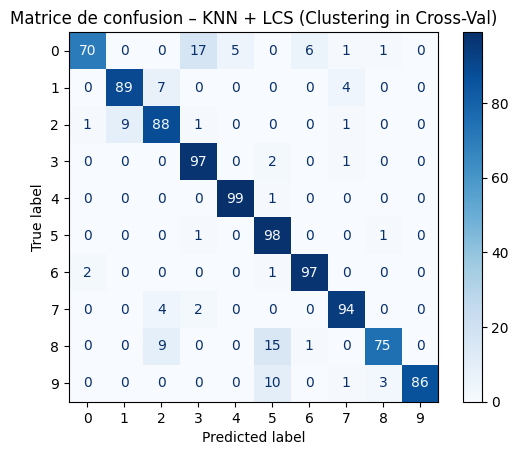

In [1]:
import pandas as pd
import numpy as np
from collections import Counter, defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# ===========================================================
# 1. CHARGEMENT ET PRÉPARATION
# ===========================================================

df = pd.DataFrame(columns=['x', 'y', 'z', 't', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            try:
                file = pd.read_csv(filename)
                file['gesture'] = number
                file['subject'] = subject
                file['iter'] = iteration
                file.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
                df = pd.concat([df, file])
            except FileNotFoundError:
                continue

# ---------- Standardisation ----------
def standardize_gesture(df_group):
    res = df_group.copy()
    for axis in ['x', 'y', 'z']:
        res[f'{axis}_std'] = (res[axis] - res[axis].mean()) / res[axis].std()
    return res

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)

# ---------- Resampling à longueur fixe ----------
def resample_gesture(df_input, target_len=100):
    resampled_data = []
    for (gesture, subject, iteration), group in df_input.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        if n < 2: continue
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))
    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ===========================================================
# 2. LOGIQUE CLUSTERING ET CONVERSION (INTERNE)
# ===========================================================

def cluster_and_symbolize(train_df, test_df, k_clusters=20):
    # Fit KMeans UNIQUEMENT sur le train
    kmeans = KMeans(n_clusters=k_clusters, random_state=42, n_init=10)
    train_points = train_df[['x_std', 'y_std', 'z_std']].values
    kmeans.fit(train_points)

    def to_seq_dict(df_target):
        # Attribution des symboles
        pts = df_target[['x_std', 'y_std', 'z_std']].values
        clusters = kmeans.predict(pts)
        symbols = [chr(ord('A') + (c % 26)) for c in clusters]
        
        temp_df = df_target.copy()
        temp_df['symbol'] = symbols
        
        # Groupement en chaînes de caractères
        seq_dict = defaultdict(list)
        for (gest, subj, it), group in temp_df.groupby(['gesture', 'subject', 'iter']):
            seq_dict[gest].append("".join(group['symbol'].tolist()))
        return seq_dict

    return to_seq_dict(train_df), to_seq_dict(test_df)

# ===========================================================
# 3. ALGORITHME LCSS
# ===========================================================

def lcs_length(s1, s2):
    n, m = len(s1), len(s2)
    dp = [[0]*(m+1) for _ in range(n+1)]
    for i in range(1, n+1):
        for j in range(1, m+1):
            if s1[i-1] == s2[j-1]:
                dp[i][j] = dp[i-1][j-1] + 1
            else:
                dp[i][j] = max(dp[i-1][j], dp[i][j-1])
    return dp[n][m]

def lcs_distance(s1, s2):
    return len(s1) + len(s2) - 2 * lcs_length(s1, s2)

def knn_lcs_predict(seq, train_dict, k=5):
    distances = []
    for gesture, sequences in train_dict.items():
        for s in sequences:
            d = lcs_distance(seq, s)
            distances.append((gesture, d))
    distances.sort(key=lambda x: x[1])
    k_nearest = distances[:k]
    votes = Counter([g for g, _ in k_nearest])
    return votes.most_common(1)[0][0]

# ===========================================================
# 4. SPLITS ET TEST FINAL
# ===========================================================

def dict_creation_userout(df_in, subj_out):
    test_df = df_in[df_in["subject"] == subj_out]
    train_df = df_in[df_in["subject"] != subj_out]
    return train_df, test_df

def testmodel(df_input, loop_range=10, k_knn=5, k_clusters=20):
    total_true, total_pred = [], []

    for i in range(1, loop_range + 1):
        print(f"\n--- TEST SUJET SORTI : {i} ---")
        
        # 1. Split (sur DataFrames bruts)
        train_df, test_df = dict_creation_userout(df_input, i)
        if test_df.empty: continue

        # 2. Clustering & Symbolisation (Interne au split)
        train_dict, test_dict = cluster_and_symbolize(train_df, test_df, k_clusters)

        # 3. Prédiction
        y_true, y_pred = [], []
        for gesture, sequences in test_dict.items():
            for seq in sequences:
                pred = knn_lcs_predict(seq, train_dict, k=k_knn)
                y_true.append(gesture)
                y_pred.append(pred)

        acc = accuracy_score(y_true, y_pred)
        print(f"Précision pour ce split : {acc:.2%}")
        total_true.extend(y_true)
        total_pred.extend(y_pred)

    print(f"\n=== EXACTITUDE GLOBALE : {accuracy_score(total_true, total_pred):.2%} ===")
    
    # Matrice de confusion
    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – KNN + LCS (Clustering in Cross-Val)")
    plt.show()

# LANCEMENT
testmodel(df100)

#lcsq knn 7 cluset 50 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_4980\3915256182.py:23: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


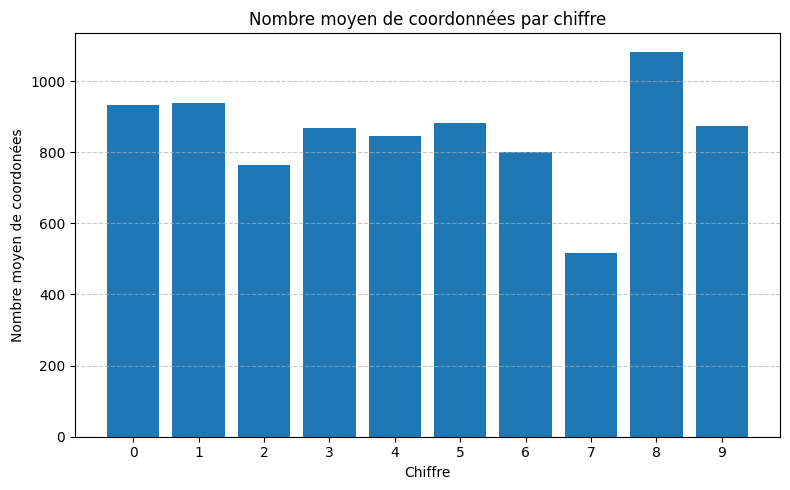

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_4980\3915256182.py:58: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test iter/user OUT : 1 ---
Exactitude split 1 : 93.00%

--- Test iter/user OUT : 2 ---
Exactitude split 2 : 76.00%

--- Test iter/user OUT : 3 ---
Exactitude split 3 : 94.00%

--- Test iter/user OUT : 4 ---
Exactitude split 4 : 100.00%

--- Test iter/user OUT : 5 ---
Exactitude split 5 : 84.00%

--- Test iter/user OUT : 6 ---
Exactitude split 6 : 57.00%

--- Test iter/user OUT : 7 ---
Exactitude split 7 : 84.00%

--- Test iter/user OUT : 8 ---
Exactitude split 8 : 95.00%

--- Test iter/user OUT : 9 ---
Exactitude split 9 : 97.00%

--- Test iter/user OUT : 10 ---
Exactitude split 10 : 88.00%

Exactitude globale KNN-LCS : 86.80%


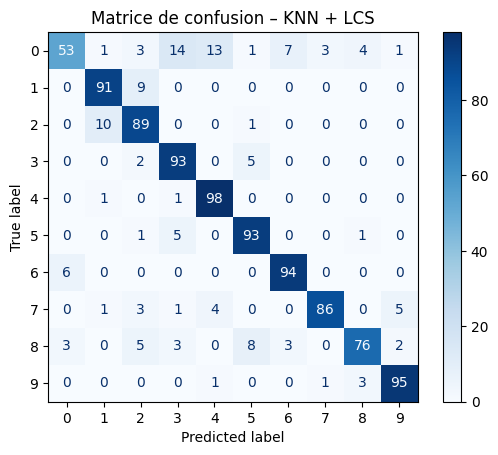

([np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(0),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(1),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(2),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(3),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(4),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(5),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64(6),
  np.int64

In [ ]:
import pandas as pd
import numpy as np
from collections import Counter, defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# ===========================================================
# 1. CHARGEMENT ET PRÉPARATION
# ===========================================================

df = pd.DataFrame(columns=['x', 'y', 'z', 't', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            try:
                file = pd.read_csv(filename)
                file['gesture'] = number
                file['subject'] = subject
                file['iter'] = iteration
                file.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
                df = pd.concat([df, file])
            except FileNotFoundError:
                continue

# ---------- Standardisation ----------
def standardize_gesture(df_group):
    res = df_group.copy()
    for axis in ['x', 'y', 'z']:
        res[f'{axis}_std'] = (res[axis] - res[axis].mean()) / res[axis].std()
    return res

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)

# ---------- Resampling à longueur fixe ----------
def resample_gesture(df_input, target_len=100):
    resampled_data = []
    for (gesture, subject, iteration), group in df_input.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        if n < 2: continue
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))
    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ===========================================================
# 2. LOGIQUE CLUSTERING ET CONVERSION (INTERNE)
# ===========================================================

def cluster_and_symbolize(train_df, test_df, k_clusters=50):
    # Fit KMeans UNIQUEMENT sur le train
    kmeans = KMeans(n_clusters=k_clusters, random_state=42, n_init=10)
    train_points = train_df[['x_std', 'y_std', 'z_std']].values
    kmeans.fit(train_points)

    def to_seq_dict(df_target):
        # Attribution des symboles
        pts = df_target[['x_std', 'y_std', 'z_std']].values
        clusters = kmeans.predict(pts)
        symbols = [chr(ord('A') + (c % 26)) for c in clusters]
        
        temp_df = df_target.copy()
        temp_df['symbol'] = symbols
        
        # Groupement en chaînes de caractères
        seq_dict = defaultdict(list)
        for (gest, subj, it), group in temp_df.groupby(['gesture', 'subject', 'iter']):
            seq_dict[gest].append("".join(group['symbol'].tolist()))
        return seq_dict

    return to_seq_dict(train_df), to_seq_dict(test_df)

# ===========================================================
# 3. ALGORITHME LCSS
# ===========================================================

def lcs_length(s1, s2):
    n, m = len(s1), len(s2)
    dp = [[0]*(m+1) for _ in range(n+1)]
    for i in range(1, n+1):
        for j in range(1, m+1):
            if s1[i-1] == s2[j-1]:
                dp[i][j] = dp[i-1][j-1] + 1
            else:
                dp[i][j] = max(dp[i-1][j], dp[i][j-1])
    return dp[n][m]

def lcs_distance(s1, s2):
    return len(s1) + len(s2) - 2 * lcs_length(s1, s2)

def knn_lcs_predict(seq, train_dict, k=7):
    distances = []
    for gesture, sequences in train_dict.items():
        for s in sequences:
            d = lcs_distance(seq, s)
            distances.append((gesture, d))
    distances.sort(key=lambda x: x[1])
    k_nearest = distances[:k]
    votes = Counter([g for g, _ in k_nearest])
    return votes.most_common(1)[0][0]

# ===========================================================
# 4. SPLITS ET TEST FINAL
# ===========================================================

def dict_creation_userout(df_in, subj_out):
    test_df = df_in[df_in["subject"] == subj_out]
    train_df = df_in[df_in["subject"] != subj_out]
    return train_df, test_df

def testmodel(df_input, loop_range=10, k_knn=7, k_clusters=50):
    total_true, total_pred = [], []

    for i in range(1, loop_range + 1):
        print(f"\n--- TEST SUJET SORTI : {i} ---")
        
        # 1. Split (sur DataFrames bruts)
        train_df, test_df = dict_creation_userout(df_input, i)
        if test_df.empty: continue

        # 2. Clustering & Symbolisation (Interne au split)
        train_dict, test_dict = cluster_and_symbolize(train_df, test_df, k_clusters)

        # 3. Prédiction
        y_true, y_pred = [], []
        for gesture, sequences in test_dict.items():
            for seq in sequences:
                pred = knn_lcs_predict(seq, train_dict, k=k_knn)
                y_true.append(gesture)
                y_pred.append(pred)

        acc = accuracy_score(y_true, y_pred)
        print(f"Précision pour ce split : {acc:.2%}")
        total_true.extend(y_true)
        total_pred.extend(y_pred)

    print(f"\n=== EXACTITUDE GLOBALE : {accuracy_score(total_true, total_pred):.2%} ===")
    
    # Matrice de confusion
    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – KNN + LCS (Clustering in Cross-Val)")
    plt.show()

# LANCEMENT
testmodel(df100)

#lcs knn 7 cluser 50 dedans cluster 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_15020\2807329688.py:25: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])
C:\Users\Isadiki\AppData\Local\Temp\ipykernel_15020\2807329688.py:36: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- TEST SUJET SORTI : 1 ---
Précision pour ce split : 95.00%

--- TEST SUJET SORTI : 2 ---
Précision pour ce split : 85.00%

--- TEST SUJET SORTI : 3 ---
Précision pour ce split : 88.00%

--- TEST SUJET SORTI : 4 ---
Précision pour ce split : 98.00%

--- TEST SUJET SORTI : 5 ---
Précision pour ce split : 86.00%

--- TEST SUJET SORTI : 6 ---
Précision pour ce split : 54.00%

--- TEST SUJET SORTI : 7 ---
Précision pour ce split : 80.00%

--- TEST SUJET SORTI : 8 ---
Précision pour ce split : 93.00%

--- TEST SUJET SORTI : 9 ---
Précision pour ce split : 95.00%

--- TEST SUJET SORTI : 10 ---
Précision pour ce split : 87.00%

=== EXACTITUDE GLOBALE : 86.10% ===


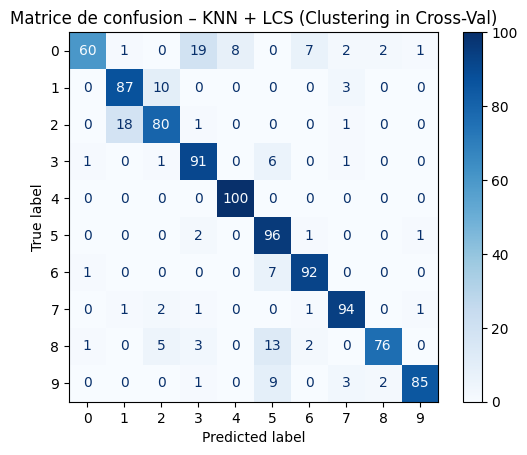

In [3]:
import pandas as pd
import numpy as np
from collections import Counter, defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# ===========================================================
# 1. CHARGEMENT ET PRÉPARATION
# ===========================================================

df = pd.DataFrame(columns=['x', 'y', 'z', 't', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            try:
                file = pd.read_csv(filename)
                file['gesture'] = number
                file['subject'] = subject
                file['iter'] = iteration
                file.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
                df = pd.concat([df, file])
            except FileNotFoundError:
                continue

# ---------- Standardisation ----------
def standardize_gesture(df_group):
    res = df_group.copy()
    for axis in ['x', 'y', 'z']:
        res[f'{axis}_std'] = (res[axis] - res[axis].mean()) / res[axis].std()
    return res

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)

# ---------- Resampling à longueur fixe ----------
def resample_gesture(df_input, target_len=100):
    resampled_data = []
    for (gesture, subject, iteration), group in df_input.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        if n < 2: continue
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))
    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ===========================================================
# 2. LOGIQUE CLUSTERING ET CONVERSION (INTERNE)
# ===========================================================

def cluster_and_symbolize(train_df, test_df, k_clusters=50):
    # Fit KMeans UNIQUEMENT sur le train
    kmeans = KMeans(n_clusters=k_clusters, random_state=42, n_init=10)
    train_points = train_df[['x_std', 'y_std', 'z_std']].values
    kmeans.fit(train_points)

    def to_seq_dict(df_target):
        # Attribution des symboles
        pts = df_target[['x_std', 'y_std', 'z_std']].values
        clusters = kmeans.predict(pts)
        symbols = [chr(ord('A') + (c % 26)) for c in clusters]
        
        temp_df = df_target.copy()
        temp_df['symbol'] = symbols
        
        # Groupement en chaînes de caractères
        seq_dict = defaultdict(list)
        for (gest, subj, it), group in temp_df.groupby(['gesture', 'subject', 'iter']):
            seq_dict[gest].append("".join(group['symbol'].tolist()))
        return seq_dict

    return to_seq_dict(train_df), to_seq_dict(test_df)

# ===========================================================
# 3. ALGORITHME LCSS
# ===========================================================

def lcs_length(s1, s2):
    n, m = len(s1), len(s2)
    dp = [[0]*(m+1) for _ in range(n+1)]
    for i in range(1, n+1):
        for j in range(1, m+1):
            if s1[i-1] == s2[j-1]:
                dp[i][j] = dp[i-1][j-1] + 1
            else:
                dp[i][j] = max(dp[i-1][j], dp[i][j-1])
    return dp[n][m]

def lcs_distance(s1, s2):
    return len(s1) + len(s2) - 2 * lcs_length(s1, s2)

def knn_lcs_predict(seq, train_dict, k=7):
    distances = []
    for gesture, sequences in train_dict.items():
        for s in sequences:
            d = lcs_distance(seq, s)
            distances.append((gesture, d))
    distances.sort(key=lambda x: x[1])
    k_nearest = distances[:k]
    votes = Counter([g for g, _ in k_nearest])
    return votes.most_common(1)[0][0]

# ===========================================================
# 4. SPLITS ET TEST FINAL
# ===========================================================

def dict_creation_userout(df_in, subj_out):
    test_df = df_in[df_in["subject"] == subj_out]
    train_df = df_in[df_in["subject"] != subj_out]
    return train_df, test_df

def testmodel(df_input, loop_range=10, k_knn=7, k_clusters=50):
    total_true, total_pred = [], []

    for i in range(1, loop_range + 1):
        print(f"\n--- TEST SUJET SORTI : {i} ---")
        
        # 1. Split (sur DataFrames bruts)
        train_df, test_df = dict_creation_userout(df_input, i)
        if test_df.empty: continue

        # 2. Clustering & Symbolisation (Interne au split)
        train_dict, test_dict = cluster_and_symbolize(train_df, test_df, k_clusters)

        # 3. Prédiction
        y_true, y_pred = [], []
        for gesture, sequences in test_dict.items():
            for seq in sequences:
                pred = knn_lcs_predict(seq, train_dict, k=k_knn)
                y_true.append(gesture)
                y_pred.append(pred)

        acc = accuracy_score(y_true, y_pred)
        print(f"Précision pour ce split : {acc:.2%}")
        total_true.extend(y_true)
        total_pred.extend(y_pred)

    print(f"\n=== EXACTITUDE GLOBALE : {accuracy_score(total_true, total_pred):.2%} ===")
    
    # Matrice de confusion
    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – KNN + LCS (Clustering in Cross-Val)")
    plt.show()

# LANCEMENT
testmodel(df100)

# lcs knn 7 cluter 20 cluser dedans 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_15020\3397819090.py:25: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])
C:\Users\Isadiki\AppData\Local\Temp\ipykernel_15020\3397819090.py:36: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- TEST SUJET SORTI : 1 ---
Précision pour ce split : 90.00%

--- TEST SUJET SORTI : 2 ---
Précision pour ce split : 87.00%

--- TEST SUJET SORTI : 3 ---
Précision pour ce split : 98.00%

--- TEST SUJET SORTI : 4 ---
Précision pour ce split : 99.00%

--- TEST SUJET SORTI : 5 ---
Précision pour ce split : 88.00%

--- TEST SUJET SORTI : 6 ---
Précision pour ce split : 49.00%

--- TEST SUJET SORTI : 7 ---
Précision pour ce split : 88.00%

--- TEST SUJET SORTI : 8 ---
Précision pour ce split : 96.00%

--- TEST SUJET SORTI : 9 ---
Précision pour ce split : 97.00%

--- TEST SUJET SORTI : 10 ---
Précision pour ce split : 93.00%

=== EXACTITUDE GLOBALE : 88.50% ===


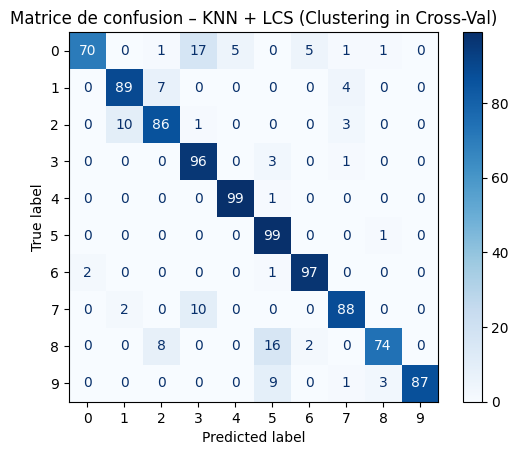

In [4]:
import pandas as pd
import numpy as np
from collections import Counter, defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# ===========================================================
# 1. CHARGEMENT ET PRÉPARATION
# ===========================================================

df = pd.DataFrame(columns=['x', 'y', 'z', 't', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            try:
                file = pd.read_csv(filename)
                file['gesture'] = number
                file['subject'] = subject
                file['iter'] = iteration
                file.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
                df = pd.concat([df, file])
            except FileNotFoundError:
                continue

# ---------- Standardisation ----------
def standardize_gesture(df_group):
    res = df_group.copy()
    for axis in ['x', 'y', 'z']:
        res[f'{axis}_std'] = (res[axis] - res[axis].mean()) / res[axis].std()
    return res

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)

# ---------- Resampling à longueur fixe ----------
def resample_gesture(df_input, target_len=100):
    resampled_data = []
    for (gesture, subject, iteration), group in df_input.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        if n < 2: continue
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))
    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ===========================================================
# 2. LOGIQUE CLUSTERING ET CONVERSION (INTERNE)
# ===========================================================

def cluster_and_symbolize(train_df, test_df, k_clusters=20):
    # Fit KMeans UNIQUEMENT sur le train
    kmeans = KMeans(n_clusters=k_clusters, random_state=42, n_init=10)
    train_points = train_df[['x_std', 'y_std', 'z_std']].values
    kmeans.fit(train_points)

    def to_seq_dict(df_target):
        # Attribution des symboles
        pts = df_target[['x_std', 'y_std', 'z_std']].values
        clusters = kmeans.predict(pts)
        symbols = [chr(ord('A') + (c % 26)) for c in clusters]
        
        temp_df = df_target.copy()
        temp_df['symbol'] = symbols
        
        # Groupement en chaînes de caractères
        seq_dict = defaultdict(list)
        for (gest, subj, it), group in temp_df.groupby(['gesture', 'subject', 'iter']):
            seq_dict[gest].append("".join(group['symbol'].tolist()))
        return seq_dict

    return to_seq_dict(train_df), to_seq_dict(test_df)

# ===========================================================
# 3. ALGORITHME LCSS
# ===========================================================

def lcs_length(s1, s2):
    n, m = len(s1), len(s2)
    dp = [[0]*(m+1) for _ in range(n+1)]
    for i in range(1, n+1):
        for j in range(1, m+1):
            if s1[i-1] == s2[j-1]:
                dp[i][j] = dp[i-1][j-1] + 1
            else:
                dp[i][j] = max(dp[i-1][j], dp[i][j-1])
    return dp[n][m]

def lcs_distance(s1, s2):
    return len(s1) + len(s2) - 2 * lcs_length(s1, s2)

def knn_lcs_predict(seq, train_dict, k=7):
    distances = []
    for gesture, sequences in train_dict.items():
        for s in sequences:
            d = lcs_distance(seq, s)
            distances.append((gesture, d))
    distances.sort(key=lambda x: x[1])
    k_nearest = distances[:k]
    votes = Counter([g for g, _ in k_nearest])
    return votes.most_common(1)[0][0]

# ===========================================================
# 4. SPLITS ET TEST FINAL
# ===========================================================

def dict_creation_userout(df_in, subj_out):
    test_df = df_in[df_in["subject"] == subj_out]
    train_df = df_in[df_in["subject"] != subj_out]
    return train_df, test_df

def testmodel(df_input, loop_range=10, k_knn=7, k_clusters=20):
    total_true, total_pred = [], []

    for i in range(1, loop_range + 1):
        print(f"\n--- TEST SUJET SORTI : {i} ---")
        
        # 1. Split (sur DataFrames bruts)
        train_df, test_df = dict_creation_userout(df_input, i)
        if test_df.empty: continue

        # 2. Clustering & Symbolisation (Interne au split)
        train_dict, test_dict = cluster_and_symbolize(train_df, test_df, k_clusters)

        # 3. Prédiction
        y_true, y_pred = [], []
        for gesture, sequences in test_dict.items():
            for seq in sequences:
                pred = knn_lcs_predict(seq, train_dict, k=k_knn)
                y_true.append(gesture)
                y_pred.append(pred)

        acc = accuracy_score(y_true, y_pred)
        print(f"Précision pour ce split : {acc:.2%}")
        total_true.extend(y_true)
        total_pred.extend(y_pred)

    print(f"\n=== EXACTITUDE GLOBALE : {accuracy_score(total_true, total_pred):.2%} ===")
    
    # Matrice de confusion
    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – KNN + LCS (Clustering in Cross-Val)")
    plt.show()

# LANCEMENT
testmodel(df100)

#lcq + edit distance fusionner

In [1]:
### Imports ###
import pandas as pd
import numpy as np
from collections import Counter, defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d


############################################################
#                1. CHARGEMENT DES DONNÉES                 #
############################################################

df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 10 + 1):
    for number in range(0, 9 + 1):
        for iteration in range(1, 10 + 1):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df.head())


############################################################
#             2. ANALYSE : LONGUEURS & DURÉES              #
############################################################

grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')

mean_lengths = sequence_lengths.groupby('gesture')['length'].mean()
plt.bar(mean_lengths.index, mean_lengths.values)
plt.title("Frames moyens par chiffre")
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min())
print("\nDurée moyenne par geste :")
print(durations.groupby('gesture').mean())


############################################################
#                  3. STANDARDISATION                      #
############################################################

def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f"{axis}_std"] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)


############################################################
#              4. RESAMPLING À LONGUEUR FIXE               #
############################################################

def resample_gesture(df, target_len=100):
    resampled = []
    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)

        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled)

df100 = resample_gesture(df)


############################################################
#      5. VECTOR QUANTIZATION → TRANSFORMATION EN STRING   #
############################################################

all_points = df100[['x_std', 'y_std', 'z_std']].values
k_clusters = 50
kmeans = KMeans(n_clusters=k_clusters, random_state=42).fit(all_points)

def assign_symbol(row):
    point = np.array([row['x_std'], row['y_std'], row['z_std']])
    cluster = kmeans.predict([point])[0]
    return chr(ord('A') + (cluster % 26))

df100['symbol'] = df100.apply(assign_symbol, axis=1)


############################################################
#                6. SÉQUENCES DE GESTES                    #
############################################################

def gesture_to_sequence(df):
    d = defaultdict(list)
    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        seq = ''.join(group['symbol'])
        d[gesture].append(seq)
    return d


############################################################
#            7. SPLITS ITER-OUT / USER-OUT                 #
############################################################

def dict_creation_iterout(df, iter_out):
    test = df[df["iter"] == iter_out]
    train = df[df["iter"] != iter_out]
    return gesture_to_sequence(train), gesture_to_sequence(test)

def dict_creation_userout(df, subj_out):
    test = df[df["subject"] == subj_out]
    train = df[df["subject"] != subj_out]
    return gesture_to_sequence(train), gesture_to_sequence(test)


############################################################
#         8. EDIT DISTANCE + LCS DISTANCE                  #
############################################################

def edit_distance(s1, s2):
    n, m = len(s1), len(s2)
    dp = [[0]*(m+1) for _ in range(n+1)]

    for i in range(n+1): dp[i][0] = i
    for j in range(m+1): dp[0][j] = j

    for i in range(1, n+1):
        for j in range(1, m+1):
            cost = 0 if s1[i-1] == s2[j-1] else 1
            dp[i][j] = min(
                dp[i-1][j] + 1,        # deletion
                dp[i][j-1] + 1,        # insertion
                dp[i-1][j-1] + cost    # substitution
            )
    return dp[n][m]


def lcs_length(s1, s2):
    n, m = len(s1), len(s2)
    dp = [[0]*(m+1) for _ in range(n+1)]
    for i in range(1, n+1):
        for j in range(1, m+1):
            if s1[i-1] == s2[j-1]:
                dp[i][j] = dp[i-1][j-1] + 1
            else:
                dp[i][j] = max(dp[i-1][j], dp[i][j-1])
    return dp[n][m]

def lcs_distance(s1, s2):
    return len(s1) + len(s2) - 2*lcs_length(s1, s2)


############################################################
#                     9. KNN CLASSIFIER                    #
############################################################

def knn_predict(seq, train_dict, k=3, metric="lcs"):
    distances = []
    for gesture, sequences in train_dict.items():
        for s in sequences:

            if metric == "lcs":
                d = lcs_distance(seq, s)
            elif metric == "edit":
                d = edit_distance(seq, s)
            else:
                raise ValueError("Metric must be 'lcs' or 'edit'.")

            distances.append((gesture, d))

    distances.sort(key=lambda x: x[1])
    k_labels = [g for g,_ in distances[:k]]
    return Counter(k_labels).most_common(1)[0][0]


############################################################
#                       10. TEST MODEL                     #
############################################################

def testmodel(split_func, df, loop_range=10, k=3, metric="lcs"):
    total_true, total_pred = [], []

    for i in range(1, loop_range+1):
        print(f"\n--- TEST OUT = {i} ---")

        train_dict, test_dict = split_func(df, i)
        y_true, y_pred = [], []

        for gesture, sequences in test_dict.items():
            for seq in sequences:
                pred = knn_predict(seq, train_dict, k=k, metric=metric)
                y_true.append(gesture)
                y_pred.append(pred)

        acc = accuracy_score(y_true, y_pred)
        print(f"Accuracy split {i}: {acc:.2%}")
        total_true += y_true
        total_pred += y_pred

    final_acc = accuracy_score(total_true, total_pred)
    print("\n=== Accuracy finale ===")
    print(f"KNN ({metric}) = {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    ConfusionMatrixDisplay(cm).plot(cmap="Blues")
    plt.show()

    return total_true, total_pred


############################################################
#                 11. LANCEMENT DES TESTS                  #
############################################################

# Utilise LCS par défaut :
testmodel(dict_creation_userout, df100, metric="lcs")

# Pour tester Edit Distance :
# testmodel(dict_creation_userout, df100, metric="edit")

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_20436\1127239612.py:25: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


KeyboardInterrupt: 

#DOMAINE 2 

# faut converti fichier base txt en csv domaine 2

In [3]:
import os
import pandas as pd

# Dossier contenant les fichiers .txt
input_folder = r"\\student.fucam.ac.be\users$\isadiki\Downloads\Domain2base"
# Dossier où les CSV seront sauvegardés
output_folder = r"\\student.fucam.ac.be\users$\isadiki\Downloads\Domain2base\csv_output"

# Créer le dossier de sortie si nécessaire
os.makedirs(output_folder, exist_ok=True)

# Parcourir tous les fichiers .txt
for filename in os.listdir(input_folder):
    if filename.endswith('.txt'):
        input_file = os.path.join(input_folder, filename)
        
        # Lire le fichier texte ; si séparé par tabulation, mettre sep='\t'
        df = pd.read_csv(input_file, sep='\s+', header=None)  
        df.columns = ['x','y','z','t']  # Renommer colonnes

        # Chemin du fichier CSV de sortie
        output_file = os.path.join(output_folder, filename.replace('.txt','.csv'))
        df.to_csv(output_file, index=False)
        print(f"{filename} → {output_file} ✅")

print("Conversion terminée pour tous les fichiers !")

<>:18: SyntaxWarning: invalid escape sequence '\s'
<>:18: SyntaxWarning: invalid escape sequence '\s'
C:\Users\Isadiki\AppData\Local\Temp\ipykernel_20436\2554579628.py:18: SyntaxWarning: invalid escape sequence '\s'
  df = pd.read_csv(input_file, sep='\s+', header=None)


1001.txt → \\student.fucam.ac.be\users$\isadiki\Downloads\Domain2base\csv_output\1001.csv ✅
1002.txt → \\student.fucam.ac.be\users$\isadiki\Downloads\Domain2base\csv_output\1002.csv ✅
1003.txt → \\student.fucam.ac.be\users$\isadiki\Downloads\Domain2base\csv_output\1003.csv ✅
1004.txt → \\student.fucam.ac.be\users$\isadiki\Downloads\Domain2base\csv_output\1004.csv ✅
1005.txt → \\student.fucam.ac.be\users$\isadiki\Downloads\Domain2base\csv_output\1005.csv ✅
1006.txt → \\student.fucam.ac.be\users$\isadiki\Downloads\Domain2base\csv_output\1006.csv ✅
1007.txt → \\student.fucam.ac.be\users$\isadiki\Downloads\Domain2base\csv_output\1007.csv ✅
1008.txt → \\student.fucam.ac.be\users$\isadiki\Downloads\Domain2base\csv_output\1008.csv ✅
1009 (1).txt → \\student.fucam.ac.be\users$\isadiki\Downloads\Domain2base\csv_output\1009 (1).csv ✅
1009.txt → \\student.fucam.ac.be\users$\isadiki\Downloads\Domain2base\csv_output\1009.csv ✅
1010.txt → \\student.fucam.ac.be\users$\isadiki\Downloads\Domain2base\cs

# avoir les fichier en nom subjecit -chifre -chiofree pouir povuori etre lu par le code 

In [7]:
import os
import shutil

source_directory = r"\\student.fucam.ac.be\users$\isadiki\Downloads\Domain2base\csv_output"
target_directory = r"\\student.fucam.ac.be\users$\isadiki\Downloads\Domain2base\DOMAIN2_CSV"

os.makedirs(target_directory, exist_ok=True)

iteration_counter = {}

def extract_number(line):
    cleaned = ''.join(c for c in line if c.isdigit() or c == '.')
    if cleaned == "":
        return None
    return int(float(cleaned))

files = sorted([
    f for f in os.listdir(source_directory)
    if f.endswith(".csv") and f.replace(".csv", "").isdigit()
])

for filename in files:
    source_path = os.path.join(source_directory, filename)

    subject_id = None
    gesture_id = None

    with open(source_path, "r") as f:
        for line in f:
            if "User" in line:
                subject_id = extract_number(line)
            if "Class" in line:
                gesture_id = extract_number(line)
            if subject_id is not None and gesture_id is not None:
                break

    if subject_id is None or gesture_id is None:
        print(f"[IGNORÉ] Impossible de lire subject/gesture dans {filename}")
        continue

    key = (subject_id, gesture_id)
    iteration = iteration_counter.get(key, 0) + 1
    iteration_counter[key] = iteration

    new_filename = f"Subject{subject_id}-{gesture_id}-{iteration}.csv"
    target_path = os.path.join(target_directory, new_filename)

    shutil.copy(source_path, target_path)

    print(f"{filename}  ➜  {new_filename}")

print("\n✔ Renommage terminé !")

1001.csv  ➜  Subject1-1-1.csv
1002.csv  ➜  Subject1-1-2.csv
1003.csv  ➜  Subject1-1-3.csv
1004.csv  ➜  Subject1-1-4.csv
1005.csv  ➜  Subject1-1-5.csv
1006.csv  ➜  Subject1-1-6.csv
1007.csv  ➜  Subject1-1-7.csv
1008.csv  ➜  Subject1-1-8.csv
1009.csv  ➜  Subject1-1-9.csv
1010.csv  ➜  Subject1-1-10.csv
1011.csv  ➜  Subject1-2-1.csv
1012.csv  ➜  Subject1-2-2.csv
1013.csv  ➜  Subject1-2-3.csv
1014.csv  ➜  Subject1-2-4.csv
1015.csv  ➜  Subject1-2-5.csv
1016.csv  ➜  Subject1-2-6.csv
1017.csv  ➜  Subject1-2-7.csv
1018.csv  ➜  Subject1-2-8.csv
1019.csv  ➜  Subject1-2-9.csv
1020.csv  ➜  Subject1-2-10.csv
1021.csv  ➜  Subject1-3-1.csv
1022.csv  ➜  Subject1-3-2.csv
1023.csv  ➜  Subject1-3-3.csv
1024.csv  ➜  Subject1-3-4.csv
1025.csv  ➜  Subject1-3-5.csv
1026.csv  ➜  Subject1-3-6.csv
1027.csv  ➜  Subject1-3-7.csv
1028.csv  ➜  Subject1-3-8.csv
1029.csv  ➜  Subject1-3-9.csv
1030.csv  ➜  Subject1-3-10.csv
1031.csv  ➜  Subject1-4-1.csv
1032.csv  ➜  Subject1-4-2.csv
1033.csv  ➜  Subject1-4-3.csv
1034.cs

#edit distance knn 3 cluister 20 sans pca

#DOMAINE 3

In [8]:
import os
import pandas as pd

# Dossier contenant les fichiers .txt
input_folder = r"\\student.fucam.ac.be\users$\isadiki\Downloads\Domain3base"
# Dossier où les CSV seront sauvegardés
output_folder = r"\\student.fucam.ac.be\users$\isadiki\Downloads\Domain3base\csv_output"

# Créer le dossier de sortie si nécessaire
os.makedirs(output_folder, exist_ok=True)

# Parcourir tous les fichiers .txt
for filename in os.listdir(input_folder):
    if filename.endswith('.txt'):
        input_file = os.path.join(input_folder, filename)
        
        # Lire le fichier texte ; si séparé par tabulation, mettre sep='\t'
        df = pd.read_csv(input_file, sep='\s+', header=None)  
        df.columns = ['x','y','z','t']  # Renommer colonnes

        # Chemin du fichier CSV de sortie
        output_file = os.path.join(output_folder, filename.replace('.txt','.csv'))
        df.to_csv(output_file, index=False)
        print(f"{filename} → {output_file} ✅")

print("Conversion terminée pour tous les fichiers !")

<>:18: SyntaxWarning: invalid escape sequence '\s'
<>:18: SyntaxWarning: invalid escape sequence '\s'
C:\Users\Isadiki\AppData\Local\Temp\ipykernel_20436\3400397041.py:18: SyntaxWarning: invalid escape sequence '\s'
  df = pd.read_csv(input_file, sep='\s+', header=None)


2001.txt → \\student.fucam.ac.be\users$\isadiki\Downloads\Domain3base\csv_output\2001.csv ✅
2002.txt → \\student.fucam.ac.be\users$\isadiki\Downloads\Domain3base\csv_output\2002.csv ✅
2003.txt → \\student.fucam.ac.be\users$\isadiki\Downloads\Domain3base\csv_output\2003.csv ✅
2004.txt → \\student.fucam.ac.be\users$\isadiki\Downloads\Domain3base\csv_output\2004.csv ✅
2005.txt → \\student.fucam.ac.be\users$\isadiki\Downloads\Domain3base\csv_output\2005.csv ✅
2006.txt → \\student.fucam.ac.be\users$\isadiki\Downloads\Domain3base\csv_output\2006.csv ✅
2007.txt → \\student.fucam.ac.be\users$\isadiki\Downloads\Domain3base\csv_output\2007.csv ✅
2008.txt → \\student.fucam.ac.be\users$\isadiki\Downloads\Domain3base\csv_output\2008.csv ✅
2009.txt → \\student.fucam.ac.be\users$\isadiki\Downloads\Domain3base\csv_output\2009.csv ✅
2010.txt → \\student.fucam.ac.be\users$\isadiki\Downloads\Domain3base\csv_output\2010.csv ✅
2011.txt → \\student.fucam.ac.be\users$\isadiki\Downloads\Domain3base\csv_output

# comme domaine 2 : changer titrre doc pour avoir subect user -iter-gestur 

In [9]:
import os
import shutil

source_directory = r"\\student.fucam.ac.be\users$\isadiki\Downloads\Domain3base\csv_output"
target_directory = r"\\student.fucam.ac.be\users$\isadiki\Downloads\Domain3base\DOMAIN3_CSV"

os.makedirs(target_directory, exist_ok=True)

iteration_counter = {}

def extract_number(line):
    cleaned = ''.join(c for c in line if c.isdigit() or c == '.')
    if cleaned == "":
        return None
    return int(float(cleaned))

files = sorted([
    f for f in os.listdir(source_directory)
    if f.endswith(".csv") and f.replace(".csv", "").isdigit()
])

for filename in files:
    source_path = os.path.join(source_directory, filename)

    subject_id = None
    gesture_id = None

    with open(source_path, "r") as f:
        for line in f:
            if "User" in line:
                subject_id = extract_number(line)
            if "Class" in line:
                gesture_id = extract_number(line)
            if subject_id is not None and gesture_id is not None:
                break

    if subject_id is None or gesture_id is None:
        print(f"[IGNORÉ] Impossible de lire subject/gesture dans {filename}")
        continue

    key = (subject_id, gesture_id)
    iteration = iteration_counter.get(key, 0) + 1
    iteration_counter[key] = iteration

    new_filename = f"Subject{subject_id}-{gesture_id}-{iteration}.csv"
    target_path = os.path.join(target_directory, new_filename)

    shutil.copy(source_path, target_path)

    print(f"{filename}  ➜  {new_filename}")

print("\n✔ Renommage terminé !")

2001.csv  ➜  Subject1-1-1.csv
2002.csv  ➜  Subject1-1-2.csv
2003.csv  ➜  Subject1-1-3.csv
2004.csv  ➜  Subject1-1-4.csv
2005.csv  ➜  Subject1-1-5.csv
2006.csv  ➜  Subject1-1-6.csv
2007.csv  ➜  Subject1-1-7.csv
2008.csv  ➜  Subject1-1-8.csv
2009.csv  ➜  Subject1-1-9.csv
2010.csv  ➜  Subject1-1-10.csv
2011.csv  ➜  Subject1-2-1.csv
2012.csv  ➜  Subject1-2-2.csv
2013.csv  ➜  Subject1-2-3.csv
2014.csv  ➜  Subject1-2-4.csv
2015.csv  ➜  Subject1-2-5.csv
2016.csv  ➜  Subject1-2-6.csv
2017.csv  ➜  Subject1-2-7.csv
2018.csv  ➜  Subject1-2-8.csv
2019.csv  ➜  Subject1-2-9.csv
2020.csv  ➜  Subject1-2-10.csv
2021.csv  ➜  Subject1-3-1.csv
2022.csv  ➜  Subject1-3-2.csv
2023.csv  ➜  Subject1-3-3.csv
2024.csv  ➜  Subject1-3-4.csv
2025.csv  ➜  Subject1-3-5.csv
2026.csv  ➜  Subject1-3-6.csv
2027.csv  ➜  Subject1-3-7.csv
2028.csv  ➜  Subject1-3-8.csv
2029.csv  ➜  Subject1-3-9.csv
2030.csv  ➜  Subject1-3-10.csv
2031.csv  ➜  Subject1-4-1.csv
2032.csv  ➜  Subject1-4-2.csv
2033.csv  ➜  Subject1-4-3.csv
2034.cs

#domaine4

In [1]:
import os
import pandas as pd

# Dossier contenant les fichiers .txt
input_folder = r"\\student.fucam.ac.be\users$\isadiki\Downloads\Domain4base"
# Dossier où les CSV seront sauvegardés
output_folder = r"\\student.fucam.ac.be\users$\isadiki\Downloads\Domain4base\csv_output"

# Créer le dossier de sortie si nécessaire
os.makedirs(output_folder, exist_ok=True)

# Parcourir tous les fichiers .txt
for filename in os.listdir(input_folder):
    if filename.endswith('.txt'):
        input_file = os.path.join(input_folder, filename)
        
        # Lire le fichier texte ; si séparé par tabulation, mettre sep='\t'
        df = pd.read_csv(input_file, sep='\s+', header=None)  
        df.columns = ['x','y','z','t']  # Renommer colonnes

        # Chemin du fichier CSV de sortie
        output_file = os.path.join(output_folder, filename.replace('.txt','.csv'))
        df.to_csv(output_file, index=False)
        print(f"{filename} → {output_file} ✅")

print("Conversion terminée pour tous les fichiers !")

<>:18: SyntaxWarning: invalid escape sequence '\s'
<>:18: SyntaxWarning: invalid escape sequence '\s'
C:\Users\Isadiki\AppData\Local\Temp\ipykernel_10972\3463696903.py:18: SyntaxWarning: invalid escape sequence '\s'
  df = pd.read_csv(input_file, sep='\s+', header=None)


3001.txt → \\student.fucam.ac.be\users$\isadiki\Downloads\Domain4base\csv_output\3001.csv ✅
3002.txt → \\student.fucam.ac.be\users$\isadiki\Downloads\Domain4base\csv_output\3002.csv ✅
3003.txt → \\student.fucam.ac.be\users$\isadiki\Downloads\Domain4base\csv_output\3003.csv ✅
3004.txt → \\student.fucam.ac.be\users$\isadiki\Downloads\Domain4base\csv_output\3004.csv ✅
3005.txt → \\student.fucam.ac.be\users$\isadiki\Downloads\Domain4base\csv_output\3005.csv ✅
3006.txt → \\student.fucam.ac.be\users$\isadiki\Downloads\Domain4base\csv_output\3006.csv ✅
3007.txt → \\student.fucam.ac.be\users$\isadiki\Downloads\Domain4base\csv_output\3007.csv ✅
3008.txt → \\student.fucam.ac.be\users$\isadiki\Downloads\Domain4base\csv_output\3008.csv ✅
3009.txt → \\student.fucam.ac.be\users$\isadiki\Downloads\Domain4base\csv_output\3009.csv ✅
3010.txt → \\student.fucam.ac.be\users$\isadiki\Downloads\Domain4base\csv_output\3010.csv ✅
3011.txt → \\student.fucam.ac.be\users$\isadiki\Downloads\Domain4base\csv_output

# mdofi totre et pas avoir 1231 donc subject ...

In [1]:
import os
import shutil

source_directory = r"\\student.fucam.ac.be\users$\isadiki\Downloads\Domain4base\csv_output"
target_directory = r"\\student.fucam.ac.be\users$\isadiki\Downloads\Domain4base\DOMAIN4_CSV"

os.makedirs(target_directory, exist_ok=True)

iteration_counter = {}

def extract_number(line):
    cleaned = ''.join(c for c in line if c.isdigit() or c == '.')
    if cleaned == "":
        return None
    return int(float(cleaned))

files = sorted([
    f for f in os.listdir(source_directory)
    if f.endswith(".csv") and f.replace(".csv", "").isdigit()
])

for filename in files:
    source_path = os.path.join(source_directory, filename)

    subject_id = None
    gesture_id = None

    with open(source_path, "r") as f:
        for line in f:
            if "User" in line:
                subject_id = extract_number(line)
            if "Class" in line:
                gesture_id = extract_number(line)
            if subject_id is not None and gesture_id is not None:
                break

    if subject_id is None or gesture_id is None:
        print(f"[IGNORÉ] Impossible de lire subject/gesture dans {filename}")
        continue

    key = (subject_id, gesture_id)
    iteration = iteration_counter.get(key, 0) + 1
    iteration_counter[key] = iteration

    new_filename = f"Subject{subject_id}-{gesture_id}-{iteration}.csv"
    target_path = os.path.join(target_directory, new_filename)

    shutil.copy(source_path, target_path)

    print(f"{filename}  ➜  {new_filename}")

print("\n✔ Renommage terminé !")

3001.csv  ➜  Subject1-1-1.csv
3002.csv  ➜  Subject1-1-2.csv
3003.csv  ➜  Subject1-1-3.csv
3004.csv  ➜  Subject1-1-4.csv
3005.csv  ➜  Subject1-1-5.csv
3006.csv  ➜  Subject1-1-6.csv
3007.csv  ➜  Subject1-1-7.csv
3008.csv  ➜  Subject1-1-8.csv
3009.csv  ➜  Subject1-1-9.csv
3010.csv  ➜  Subject1-1-10.csv
3011.csv  ➜  Subject1-2-1.csv
3012.csv  ➜  Subject1-2-2.csv
3013.csv  ➜  Subject1-2-3.csv
3014.csv  ➜  Subject1-2-4.csv
3015.csv  ➜  Subject1-2-5.csv
3016.csv  ➜  Subject1-2-6.csv
3017.csv  ➜  Subject1-2-7.csv
3018.csv  ➜  Subject1-2-8.csv
3019.csv  ➜  Subject1-2-9.csv
3020.csv  ➜  Subject1-2-10.csv
3021.csv  ➜  Subject1-3-1.csv
3022.csv  ➜  Subject1-3-2.csv
3023.csv  ➜  Subject1-3-3.csv
3024.csv  ➜  Subject1-3-4.csv
3025.csv  ➜  Subject1-3-5.csv
3026.csv  ➜  Subject1-3-6.csv
3027.csv  ➜  Subject1-3-7.csv
3028.csv  ➜  Subject1-3-8.csv
3029.csv  ➜  Subject1-3-9.csv
3030.csv  ➜  Subject1-3-10.csv
3031.csv  ➜  Subject1-4-1.csv
3032.csv  ➜  Subject1-4-2.csv
3033.csv  ➜  Subject1-4-3.csv
3034.cs

# crrection bug passant de 10 a 9 et 1 a 0 par la martric e de confision pour avoir de 0 a 9 et pas de 1 a 10  dossier 4 

In [2]:
import os
import re

# --- CONFIGURATION DES DOSSIERS ---
dossier_source = r"\\student.fucam.ac.be\users$\isadiki\Downloads\Domain4base\DOMAIN4_CSV"
dossier_resultat = r"\\student.fucam.ac.be\users$\isadiki\Downloads\Domain4base\DOMAIN4_CSVcorrigé"

if not os.path.exists(dossier_resultat):
    os.makedirs(dossier_resultat)
    print(f"Dossier '{dossier_resultat}' créé.")

def transformer_nom(nom_fichier):
    # Cherche SubjectX-Y-Z (on ignore l'extension ici)
    pattern = r"Subject(\d+)-(\d+)-(\d+)"
    match = re.search(pattern, nom_fichier)
    
    if match:
        s1 = match.group(1)
        s2 = int(match.group(2))
        s3 = match.group(3)
        
        nouveau_s2 = s2 - 1
        
        # On force la sortie en .csv
        return f"Subject{s1}-{nouveau_s2}-{s3}.csv"
    return None

# --- TRAITEMENT ---
print("Lancement de la conversion...")

fichiers_trouves = os.listdir(dossier_source)
compteur = 0

for nom in fichiers_trouves:
    # On traite les fichiers .txt OU .csv pour être sûr
    if nom.lower().endswith(".txt") or nom.lower().endswith(".csv"):
        nouveau_nom = transformer_nom(nom)
        
        if nouveau_nom:
            chemin_ancien = os.path.join(dossier_source, nom)
            chemin_nouveau = os.path.join(dossier_resultat, nouveau_nom)
            
            try:
                with open(chemin_ancien, 'r', encoding='utf-8') as f:
                    contenu = f.read()
                
                with open(chemin_nouveau, 'w', encoding='utf-8') as f:
                    f.write(contenu)
                
                compteur += 1
                if compteur % 100 == 0: # Affiche un message tous les 100 fichiers pour ne pas polluer l'écran
                    print(f"Progression : {compteur} fichiers traités...")
            except Exception as e:
                print(f"Erreur sur le fichier {nom}: {e}")

print(f"\nTerminé ! {compteur} fichiers sont maintenant dans :")
print(f"--> {dossier_resultat}")

Dossier '\\student.fucam.ac.be\users$\isadiki\Downloads\Domain4base\DOMAIN4_CSVcorrigé' créé.
Lancement de la conversion...
Progression : 100 fichiers traités...
Progression : 200 fichiers traités...
Progression : 300 fichiers traités...
Progression : 400 fichiers traités...
Progression : 500 fichiers traités...
Progression : 600 fichiers traités...
Progression : 700 fichiers traités...
Progression : 800 fichiers traités...
Progression : 900 fichiers traités...
Progression : 1000 fichiers traités...

Terminé ! 1000 fichiers sont maintenant dans :
--> \\student.fucam.ac.be\users$\isadiki\Downloads\Domain4base\DOMAIN4_CSVcorrigé


# meme chose dossier 3 

In [3]:
import os
import re

# --- CONFIGURATION DES DOSSIERS ---
dossier_source = r"\\student.fucam.ac.be\users$\isadiki\Downloads\Domain3base\DOMAIN3_CSV"
dossier_resultat = r"\\student.fucam.ac.be\users$\isadiki\Downloads\Domain3base\DOMAIN3_CSVcorrigé"

if not os.path.exists(dossier_resultat):
    os.makedirs(dossier_resultat)
    print(f"Dossier '{dossier_resultat}' créé.")

def transformer_nom(nom_fichier):
    # Cherche SubjectX-Y-Z (on ignore l'extension ici)
    pattern = r"Subject(\d+)-(\d+)-(\d+)"
    match = re.search(pattern, nom_fichier)
    
    if match:
        s1 = match.group(1)
        s2 = int(match.group(2))
        s3 = match.group(3)
        
        nouveau_s2 = s2 - 1
        
        # On force la sortie en .csv
        return f"Subject{s1}-{nouveau_s2}-{s3}.csv"
    return None

# --- TRAITEMENT ---
print("Lancement de la conversion...")

fichiers_trouves = os.listdir(dossier_source)
compteur = 0

for nom in fichiers_trouves:
    # On traite les fichiers .txt OU .csv pour être sûr
    if nom.lower().endswith(".txt") or nom.lower().endswith(".csv"):
        nouveau_nom = transformer_nom(nom)
        
        if nouveau_nom:
            chemin_ancien = os.path.join(dossier_source, nom)
            chemin_nouveau = os.path.join(dossier_resultat, nouveau_nom)
            
            try:
                with open(chemin_ancien, 'r', encoding='utf-8') as f:
                    contenu = f.read()
                
                with open(chemin_nouveau, 'w', encoding='utf-8') as f:
                    f.write(contenu)
                
                compteur += 1
                if compteur % 100 == 0: # Affiche un message tous les 100 fichiers pour ne pas polluer l'écran
                    print(f"Progression : {compteur} fichiers traités...")
            except Exception as e:
                print(f"Erreur sur le fichier {nom}: {e}")

print(f"\nTerminé ! {compteur} fichiers sont maintenant dans :")
print(f"--> {dossier_resultat}")

Dossier '\\student.fucam.ac.be\users$\isadiki\Downloads\Domain3base\DOMAIN3_CSVcorrigé' créé.
Lancement de la conversion...
Progression : 100 fichiers traités...
Progression : 200 fichiers traités...
Progression : 300 fichiers traités...
Progression : 400 fichiers traités...
Progression : 500 fichiers traités...
Progression : 600 fichiers traités...
Progression : 700 fichiers traités...
Progression : 800 fichiers traités...
Progression : 900 fichiers traités...
Progression : 1000 fichiers traités...

Terminé ! 1000 fichiers sont maintenant dans :
--> \\student.fucam.ac.be\users$\isadiki\Downloads\Domain3base\DOMAIN3_CSVcorrigé


# meme chose dossier 2 

In [1]:
import os
import re

# --- CONFIGURATION DES DOSSIERS ---
dossier_source =r"\\student.fucam.ac.be\users$\isadiki\Downloads\DOMAIN2_CSV"
dossier_resultat = r"\\student.fucam.ac.be\users$\isadiki\Downloads\Domain2base\DOMAIN2_CSVcorrigé"

if not os.path.exists(dossier_resultat):
    os.makedirs(dossier_resultat)
    print(f"Dossier '{dossier_resultat}' créé.")

def transformer_nom(nom_fichier):
    # Cherche SubjectX-Y-Z (on ignore l'extension ici)
    pattern = r"Subject(\d+)-(\d+)-(\d+)"
    match = re.search(pattern, nom_fichier)
    
    if match:
        s1 = match.group(1)
        s2 = int(match.group(2))
        s3 = match.group(3)
        
        nouveau_s2 = s2 - 1
        
        # On force la sortie en .csv
        return f"Subject{s1}-{nouveau_s2}-{s3}.csv"
    return None

# --- TRAITEMENT ---
print("Lancement de la conversion...")

fichiers_trouves = os.listdir(dossier_source)
compteur = 0

for nom in fichiers_trouves:
    # On traite les fichiers .txt OU .csv pour être sûr
    if nom.lower().endswith(".txt") or nom.lower().endswith(".csv"):
        nouveau_nom = transformer_nom(nom)
        
        if nouveau_nom:
            chemin_ancien = os.path.join(dossier_source, nom)
            chemin_nouveau = os.path.join(dossier_resultat, nouveau_nom)
            
            try:
                with open(chemin_ancien, 'r', encoding='utf-8') as f:
                    contenu = f.read()
                
                with open(chemin_nouveau, 'w', encoding='utf-8') as f:
                    f.write(contenu)
                
                compteur += 1
                if compteur % 100 == 0: # Affiche un message tous les 100 fichiers pour ne pas polluer l'écran
                    print(f"Progression : {compteur} fichiers traités...")
            except Exception as e:
                print(f"Erreur sur le fichier {nom}: {e}")

print(f"\nTerminé ! {compteur} fichiers sont maintenant dans :")
print(f"--> {dossier_resultat}")

Dossier '\\student.fucam.ac.be\users$\isadiki\Downloads\Domain2base\DOMAIN2_CSVcorrigé' créé.
Lancement de la conversion...
Progression : 100 fichiers traités...
Progression : 200 fichiers traités...
Progression : 300 fichiers traités...
Progression : 400 fichiers traités...
Progression : 500 fichiers traités...
Progression : 600 fichiers traités...
Progression : 700 fichiers traités...
Progression : 800 fichiers traités...
Progression : 900 fichiers traités...
Progression : 1000 fichiers traités...

Terminé ! 1000 fichiers sont maintenant dans :
--> \\student.fucam.ac.be\users$\isadiki\Downloads\Domain2base\DOMAIN2_CSVcorrigé


# il faut importer torch , tensorflow etc 

In [3]:
import sys
!"{sys.executable}" -m pip install torch

Defaulting to user installation because normal site-packages is not writeable
   ---------------------------------------- 0.0/110.9 MB ? eta -:--:--
   ---- ----------------------------------- 12.6/110.9 MB 63.0 MB/s eta 0:00:02
   ------- -------------------------------- 21.8/110.9 MB 54.3 MB/s eta 0:00:02
   ---------- ----------------------------- 28.8/110.9 MB 47.6 MB/s eta 0:00:02
   ------------- -------------------------- 36.7/110.9 MB 44.7 MB/s eta 0:00:02
   --------------- ------------------------ 42.5/110.9 MB 41.5 MB/s eta 0:00:02
   ----------------- ---------------------- 48.8/110.9 MB 39.5 MB/s eta 0:00:02
   -------------------- ------------------- 56.1/110.9 MB 38.5 MB/s eta 0:00:02
   ---------------------- ----------------- 62.1/110.9 MB 37.3 MB/s eta 0:00:02
   ------------------------ --------------- 68.2/110.9 MB 36.2 MB/s eta 0:00:02
   -------------------------- ------------- 73.1/110.9 MB 34.8 MB/s eta 0:00:02
   ---------------------------- ----------- 77.9/11


[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


#modele ia test 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_14680\2315590518.py:61: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])
C:\Users\Isadiki\AppData\Local\Temp\ipykernel_14680\2315590518.py:72: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject','gesture','iter'], group_keys=False).apply(standardize_gesture)



===== Test user-out: 1 =====
Epoch 1/20 - Loss: 2.3207 - Val Acc: 0.1000
Epoch 2/20 - Loss: 2.3094 - Val Acc: 0.1000
Epoch 3/20 - Loss: 2.3076 - Val Acc: 0.1000
Epoch 4/20 - Loss: 2.3069 - Val Acc: 0.1000
Epoch 5/20 - Loss: 2.3057 - Val Acc: 0.1000
Epoch 6/20 - Loss: 2.3053 - Val Acc: 0.1000
Epoch 7/20 - Loss: 2.3050 - Val Acc: 0.1000
Epoch 8/20 - Loss: 2.3053 - Val Acc: 0.1000
Epoch 9/20 - Loss: 2.3049 - Val Acc: 0.1000
Epoch 10/20 - Loss: 2.3047 - Val Acc: 0.1000
Epoch 11/20 - Loss: 2.3041 - Val Acc: 0.1000
Epoch 12/20 - Loss: 2.3035 - Val Acc: 0.1000
Epoch 13/20 - Loss: 2.3035 - Val Acc: 0.1000
Epoch 14/20 - Loss: 2.3036 - Val Acc: 0.1000
Epoch 15/20 - Loss: 2.3039 - Val Acc: 0.1000
Epoch 16/20 - Loss: 2.3033 - Val Acc: 0.1000
Epoch 17/20 - Loss: 2.3037 - Val Acc: 0.1000
Epoch 18/20 - Loss: 2.3032 - Val Acc: 0.1000
Epoch 19/20 - Loss: 2.3033 - Val Acc: 0.1000
Epoch 20/20 - Loss: 2.3034 - Val Acc: 0.1000
Accuracy user-out 1: 0.1000


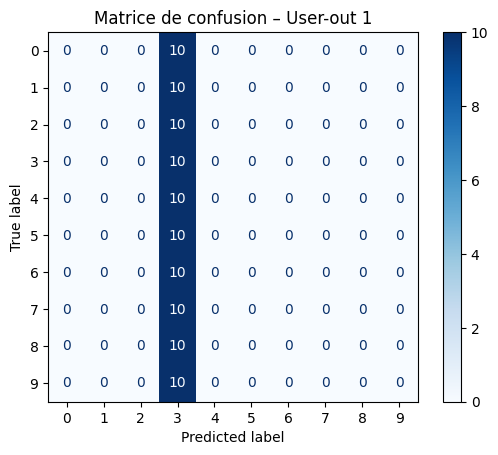


===== Test user-out: 2 =====


KeyboardInterrupt: 

In [4]:
import pandas as pd
import numpy as np
from scipy.interpolate import interp1d
import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.optim as optim
from collections import Counter
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# -------------------------------
# 1️⃣ Transformer Classifier
# -------------------------------
class IMUTransformer(nn.Module):
    def __init__(self, input_dim, model_dim, num_heads, num_layers, num_classes, dropout=0.3):
        super(IMUTransformer, self).__init__()
        self.input_fc = nn.Linear(input_dim, model_dim)
        encoder_layer = nn.TransformerEncoderLayer(d_model=model_dim, nhead=num_heads, dropout=dropout, batch_first=True)
        self.transformer_encoder = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)
        self.classifier = nn.Sequential(
            nn.Linear(model_dim, model_dim//2),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(model_dim//2, num_classes)
        )

    def forward(self, x):
        x = self.input_fc(x)
        x = self.transformer_encoder(x)
        x = x.mean(dim=1)
        return self.classifier(x)

# -------------------------------
# 2️⃣ Dataset PyTorch
# -------------------------------
class IMUDataset(Dataset):
    def __init__(self, sequences, labels):
        self.sequences = sequences.astype(np.float32)
        self.labels = labels.astype(np.int64)

    def __len__(self):
        return len(self.sequences)

    def __getitem__(self, idx):
        return self.sequences[idx], self.labels[idx]

# -------------------------------
# 3️⃣ Prétraitement : lecture CSV comme ton code
# -------------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x','y','z','t','gesture','subject','iter']

# Standardisation
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x','y','z']:
        df[f'{axis}_std'] = (df[axis]-df[axis].mean())/df[axis].std()
    return df

df = df.groupby(['subject','gesture','iter'], group_keys=False).apply(standardize_gesture)

# Resampling
def resample_gesture(df, target_len=100):
    resampled_data = []
    resampled_labels = []
    resampled_subjects = []

    for (gesture, subject, iteration), group in df.groupby(['gesture','subject','iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n-1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(np.stack([
            interp('x_std'), interp('y_std'), interp('z_std'), interp('t')
        ], axis=1))
        resampled_labels.append(gesture)
        resampled_subjects.append(subject)

    sequences = np.array(resampled_data)
    labels = np.array(resampled_labels)
    subjects = np.array(resampled_subjects)
    return sequences, labels, subjects

sequences, labels, subjects = resample_gesture(df)

# -------------------------------
# 4️⃣ Split user-independent
# -------------------------------
def user_out_split(sequences, labels, subjects, subj_out):
    train_idx = subjects != subj_out
    test_idx = subjects == subj_out
    return (sequences[train_idx], labels[train_idx]), (sequences[test_idx], labels[test_idx])

# -------------------------------
# 5️⃣ Entraînement Transformer
# -------------------------------
def train_model(model, train_loader, val_loader, epochs=20, lr=1e-3, device='cpu'):
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)
    model.to(device)

    for epoch in range(epochs):
        model.train()
        total_loss = 0
        for X_batch, y_batch in train_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            optimizer.zero_grad()
            outputs = model(X_batch)
            loss = criterion(outputs, y_batch)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
        avg_loss = total_loss / len(train_loader)

        # Validation
        model.eval()
        correct, total = 0,0
        with torch.no_grad():
            for X_batch, y_batch in val_loader:
                X_batch, y_batch = X_batch.to(device), y_batch.to(device)
                outputs = model(X_batch)
                preds = outputs.argmax(dim=1)
                correct += (preds==y_batch).sum().item()
                total += y_batch.size(0)
        val_acc = correct/total
        print(f"Epoch {epoch+1}/{epochs} - Loss: {avg_loss:.4f} - Val Acc: {val_acc:.4f}")
    return model

# -------------------------------
# 6️⃣ Boucle user-independent
# -------------------------------
device = 'cuda' if torch.cuda.is_available() else 'cpu'
num_classes = len(np.unique(labels))

for subj_out in np.unique(subjects):
    print(f"\n===== Test user-out: {subj_out} =====")
    (X_train, y_train), (X_val, y_val) = user_out_split(sequences, labels, subjects, subj_out)

    train_loader = DataLoader(IMUDataset(X_train, y_train), batch_size=16, shuffle=True)
    val_loader = DataLoader(IMUDataset(X_val, y_val), batch_size=16, shuffle=False)

    model = IMUTransformer(input_dim=4, model_dim=64, num_heads=4, num_layers=2, num_classes=num_classes)
    trained_model = train_model(model, train_loader, val_loader, epochs=20, device=device)

    # Évaluation
    trained_model.eval()
    correct, total = 0,0
    all_preds, all_true = [],[]
    with torch.no_grad():
        for X_batch, y_batch in val_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            outputs = trained_model(X_batch)
            preds = outputs.argmax(dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_true.extend(y_batch.cpu().numpy())
            correct += (preds==y_batch).sum().item()
            total += y_batch.size(0)
    acc = correct/total
    print(f"Accuracy user-out {subj_out}: {acc:.4f}")

    # Matrice de confusion
    cm = confusion_matrix(all_true, all_preds)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title(f"Matrice de confusion – User-out {subj_out}")
    plt.show()

#autres test ia 

Data shape: (85095, 7)


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_14680\3024822418.py:43: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject','gesture','iter'], group_keys=False).apply(standardize_gesture)



===== Test user-out: 1 =====
Epoch 1/20 - Loss: 2.3171 - Val Acc: 0.1000
Epoch 2/20 - Loss: 2.3070 - Val Acc: 0.1000
Epoch 3/20 - Loss: 2.3055 - Val Acc: 0.1000
Epoch 4/20 - Loss: 2.3052 - Val Acc: 0.1000
Epoch 5/20 - Loss: 2.3050 - Val Acc: 0.1000
Epoch 6/20 - Loss: 2.3046 - Val Acc: 0.1000
Epoch 7/20 - Loss: 2.3051 - Val Acc: 0.1000
Epoch 8/20 - Loss: 2.3039 - Val Acc: 0.1000
Epoch 9/20 - Loss: 2.3040 - Val Acc: 0.1000
Epoch 10/20 - Loss: 2.3038 - Val Acc: 0.1000
Epoch 11/20 - Loss: 2.3036 - Val Acc: 0.1000
Epoch 12/20 - Loss: 2.3033 - Val Acc: 0.1000
Epoch 13/20 - Loss: 2.3032 - Val Acc: 0.1000
Epoch 14/20 - Loss: 2.3032 - Val Acc: 0.1000
Epoch 15/20 - Loss: 2.3033 - Val Acc: 0.1000
Epoch 16/20 - Loss: 2.3031 - Val Acc: 0.1000
Epoch 17/20 - Loss: 2.3033 - Val Acc: 0.1000
Epoch 18/20 - Loss: 2.3031 - Val Acc: 0.1000
Epoch 19/20 - Loss: 2.3032 - Val Acc: 0.1000
Epoch 20/20 - Loss: 2.3033 - Val Acc: 0.1000
Accuracy user-out 1: 0.1000


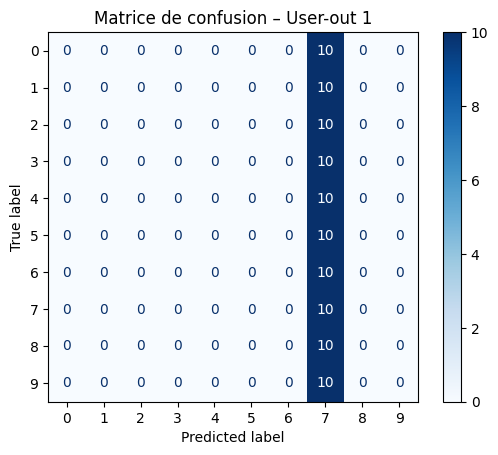


===== Test user-out: 2 =====
Epoch 1/20 - Loss: 2.3182 - Val Acc: 0.1000
Epoch 2/20 - Loss: 2.3065 - Val Acc: 0.1000
Epoch 3/20 - Loss: 2.3061 - Val Acc: 0.1000
Epoch 4/20 - Loss: 2.3062 - Val Acc: 0.1000
Epoch 5/20 - Loss: 2.3050 - Val Acc: 0.1000
Epoch 6/20 - Loss: 2.3049 - Val Acc: 0.1000
Epoch 7/20 - Loss: 2.3034 - Val Acc: 0.1000
Epoch 8/20 - Loss: 2.3042 - Val Acc: 0.1000


KeyboardInterrupt: 

In [7]:
import pandas as pd
import numpy as np
from scipy.interpolate import interp1d
from collections import defaultdict
import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.optim as optim
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# -------------------------------
# 1️⃣ Lecture CSV robuste
# -------------------------------
expected_cols = ['<x>','<y>','<z>','<t>']
df_list = []

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            # ne garder que les colonnes attendues
            file = file[expected_cols].copy()
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df_list.append(file)

df = pd.concat(df_list, ignore_index=True)
df.columns = ['x','y','z','t','gesture','subject','iter']
print("Data shape:", df.shape)

# -------------------------------
# 2️⃣ Standardisation
# -------------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x','y','z']:
        df[f'{axis}_std'] = (df[axis]-df[axis].mean())/df[axis].std()
    return df

df = df.groupby(['subject','gesture','iter'], group_keys=False).apply(standardize_gesture)

# -------------------------------
# 3️⃣ Resampling
# -------------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []
    resampled_labels = []
    resampled_subjects = []

    for (gesture, subject, iteration), group in df.groupby(['gesture','subject','iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n-1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(np.stack([
            interp('x_std'), interp('y_std'), interp('z_std'), interp('t')
        ], axis=1))
        resampled_labels.append(gesture)
        resampled_subjects.append(subject)

    sequences = np.array(resampled_data)
    labels = np.array(resampled_labels)
    subjects = np.array(resampled_subjects)
    return sequences, labels, subjects

sequences, labels, subjects = resample_gesture(df)

# -------------------------------
# 4️⃣ Dataset PyTorch
# -------------------------------
class IMUDataset(Dataset):
    def __init__(self, sequences, labels):
        self.sequences = sequences.astype(np.float32)
        self.labels = labels.astype(np.int64)

    def __len__(self):
        return len(self.sequences)

    def __getitem__(self, idx):
        return self.sequences[idx], self.labels[idx]

# -------------------------------
# 5️⃣ Split user-out
# -------------------------------
def user_out_split(sequences, labels, subjects, subj_out):
    train_idx = subjects != subj_out
    test_idx = subjects == subj_out
    return (sequences[train_idx], labels[train_idx]), (sequences[test_idx], labels[test_idx])

# -------------------------------
# 6️⃣ Transformer Encoder pour classification
# -------------------------------
class IMUTransformer(nn.Module):
    def __init__(self, input_dim=4, model_dim=64, num_heads=4, num_layers=2, num_classes=10, dropout=0.3):
        super(IMUTransformer, self).__init__()
        self.input_fc = nn.Linear(input_dim, model_dim)
        encoder_layer = nn.TransformerEncoderLayer(d_model=model_dim, nhead=num_heads, dropout=dropout, batch_first=True)
        self.transformer_encoder = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)
        self.classifier = nn.Sequential(
            nn.Linear(model_dim, model_dim//2),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(model_dim//2, num_classes)
        )

    def forward(self, x):
        x = self.input_fc(x)
        x = self.transformer_encoder(x)
        x = x.mean(dim=1)
        return self.classifier(x)

# -------------------------------
# 7️⃣ Entraînement
# -------------------------------
def train_model(model, train_loader, val_loader, epochs=20, lr=1e-3, device='cpu'):
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)
    model.to(device)

    for epoch in range(epochs):
        model.train()
        total_loss = 0
        for X_batch, y_batch in train_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            optimizer.zero_grad()
            outputs = model(X_batch)
            loss = criterion(outputs, y_batch)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
        avg_loss = total_loss / len(train_loader)

        # Validation
        model.eval()
        correct, total = 0,0
        with torch.no_grad():
            for X_batch, y_batch in val_loader:
                X_batch, y_batch = X_batch.to(device), y_batch.to(device)
                outputs = model(X_batch)
                preds = outputs.argmax(dim=1)
                correct += (preds==y_batch).sum().item()
                total += y_batch.size(0)
        val_acc = correct/total
        print(f"Epoch {epoch+1}/{epochs} - Loss: {avg_loss:.4f} - Val Acc: {val_acc:.4f}")
    return model

# -------------------------------
# 8️⃣ Boucle user-out
# -------------------------------
device = 'cuda' if torch.cuda.is_available() else 'cpu'
num_classes = len(np.unique(labels))

for subj_out in np.unique(subjects):
    print(f"\n===== Test user-out: {subj_out} =====")
    (X_train, y_train), (X_val, y_val) = user_out_split(sequences, labels, subjects, subj_out)
    train_loader = DataLoader(IMUDataset(X_train, y_train), batch_size=16, shuffle=True)
    val_loader = DataLoader(IMUDataset(X_val, y_val), batch_size=16, shuffle=False)

    model = IMUTransformer(input_dim=4, model_dim=64, num_heads=4, num_layers=2, num_classes=num_classes)
    trained_model = train_model(model, train_loader, val_loader, epochs=20, device=device)

    # Évaluation
    trained_model.eval()
    all_preds, all_true = [], []
    with torch.no_grad():
        for X_batch, y_batch in val_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            outputs = trained_model(X_batch)
            preds = outputs.argmax(dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_true.extend(y_batch.cpu().numpy())

    acc = accuracy_score(all_true, all_preds)
    print(f"Accuracy user-out {subj_out}: {acc:.4f}")

    cm = confusion_matrix(all_true, all_preds)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title(f"Matrice de confusion – User-out {subj_out}")
    plt.show()

#tensofrlow 

# rnn lstm test 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_14680\3716040018.py:58: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])
C:\Users\Isadiki\AppData\Local\Temp\ipykernel_14680\3716040018.py:67: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject','gesture','iter'], group_keys=False).apply(standardize_gesture)


Epoch 1/20 - Loss: 2.2039 - Val Acc: 0.2700
Epoch 2/20 - Loss: 1.5930 - Val Acc: 0.5050
Epoch 3/20 - Loss: 1.0904 - Val Acc: 0.6150
Epoch 4/20 - Loss: 0.8887 - Val Acc: 0.6650
Epoch 5/20 - Loss: 0.7782 - Val Acc: 0.6900
Epoch 6/20 - Loss: 0.7067 - Val Acc: 0.6650
Epoch 7/20 - Loss: 0.6364 - Val Acc: 0.7800
Epoch 8/20 - Loss: 0.5888 - Val Acc: 0.7550
Epoch 9/20 - Loss: 0.5337 - Val Acc: 0.8250
Epoch 10/20 - Loss: 0.4442 - Val Acc: 0.7200
Epoch 11/20 - Loss: 0.5191 - Val Acc: 0.8150
Epoch 12/20 - Loss: 0.4469 - Val Acc: 0.8450
Epoch 13/20 - Loss: 0.4415 - Val Acc: 0.8650
Epoch 14/20 - Loss: 0.4590 - Val Acc: 0.8550
Epoch 15/20 - Loss: 0.3258 - Val Acc: 0.9050
Epoch 16/20 - Loss: 0.4271 - Val Acc: 0.8250
Epoch 17/20 - Loss: 0.3834 - Val Acc: 0.8400
Epoch 18/20 - Loss: 0.3346 - Val Acc: 0.8800
Epoch 19/20 - Loss: 0.2417 - Val Acc: 0.8950
Epoch 20/20 - Loss: 0.2144 - Val Acc: 0.9100
Accuracy finale: 0.9100


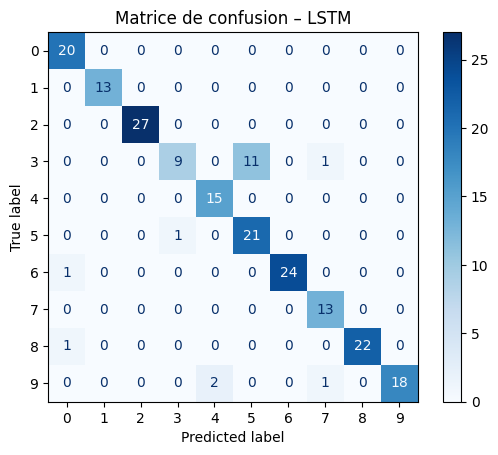

In [9]:
import pandas as pd
import numpy as np
from scipy.interpolate import interp1d
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.optim as optim

# -----------------------------
# 1️⃣ Dataset LSTM
# -----------------------------
class IMUDataset(Dataset):
    def __init__(self, sequences, labels):
        self.sequences = sequences.astype(np.float32)
        self.labels = labels.astype(np.int64)

    def __len__(self):
        return len(self.sequences)

    def __getitem__(self, idx):
        return self.sequences[idx], self.labels[idx]

# -----------------------------
# 2️⃣ LSTM Classifier
# -----------------------------
class LSTMClassifier(nn.Module):
    def __init__(self, input_dim, hidden_dim, num_layers, num_classes, dropout=0.3):
        super(LSTMClassifier, self).__init__()
        self.lstm = nn.LSTM(input_dim, hidden_dim, num_layers, batch_first=True, dropout=dropout)
        self.fc = nn.Sequential(
            nn.Linear(hidden_dim, hidden_dim//2),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(hidden_dim//2, num_classes)
        )

    def forward(self, x):
        out, (hn, cn) = self.lstm(x)
        # on prend le dernier état caché pour la classification
        last_hidden = hn[-1]
        return self.fc(last_hidden)

# -----------------------------
# 3️⃣ Prétraitement : lecture CSV et resampling
# -----------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])
for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])
df.columns = ['x','y','z','t','gesture','subject','iter']

# Standardisation
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x','y','z']:
        df[f'{axis}_std'] = (df[axis]-df[axis].mean())/df[axis].std()
    return df
df = df.groupby(['subject','gesture','iter'], group_keys=False).apply(standardize_gesture)

# Resampling à longueur fixe
def resample_gesture(df, target_len=100):
    sequences, labels = [], []
    for (gesture, subject, iteration), group in df.groupby(['gesture','subject','iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n-1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)
        seq = np.stack([interp('x_std'), interp('y_std'), interp('z_std')], axis=1)
        sequences.append(seq)
        labels.append(gesture)
    return np.array(sequences), np.array(labels)

sequences, labels = resample_gesture(df)

# -----------------------------
# 4️⃣ Split user-independent
# -----------------------------
def user_out_split(sequences, labels, subjects, subj_out):
    train_idx = subjects != subj_out
    test_idx = subjects == subj_out
    return (sequences[train_idx], labels[train_idx]), (sequences[test_idx], labels[test_idx])

subjects = df.groupby(['gesture','subject','iter']).first().reset_index()['subject'].values
# Ici on fait juste un train/test split aléatoire si pas user-out
X_train, X_val, y_train, y_val = train_test_split(sequences, labels, test_size=0.2, random_state=42)

train_loader = DataLoader(IMUDataset(X_train, y_train), batch_size=16, shuffle=True)
val_loader = DataLoader(IMUDataset(X_val, y_val), batch_size=16, shuffle=False)

# -----------------------------
# 5️⃣ Entraînement LSTM
# -----------------------------
device = 'cuda' if torch.cuda.is_available() else 'cpu'
input_dim = 3
hidden_dim = 64
num_layers = 2
num_classes = len(np.unique(labels))
model = LSTMClassifier(input_dim, hidden_dim, num_layers, num_classes).to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)
epochs = 20

for epoch in range(epochs):
    model.train()
    total_loss = 0
    for X_batch, y_batch in train_loader:
        X_batch, y_batch = X_batch.to(device), y_batch.to(device)
        optimizer.zero_grad()
        outputs = model(X_batch)
        loss = criterion(outputs, y_batch)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    avg_loss = total_loss / len(train_loader)

    # Validation
    model.eval()
    correct, total = 0,0
    with torch.no_grad():
        for X_batch, y_batch in val_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            outputs = model(X_batch)
            preds = outputs.argmax(dim=1)
            correct += (preds==y_batch).sum().item()
            total += y_batch.size(0)
    val_acc = correct/total
    print(f"Epoch {epoch+1}/{epochs} - Loss: {avg_loss:.4f} - Val Acc: {val_acc:.4f}")

# -----------------------------
# 6️⃣ Évaluation
# -----------------------------
model.eval()
all_preds, all_true = [],[]
with torch.no_grad():
    for X_batch, y_batch in val_loader:
        X_batch, y_batch = X_batch.to(device), y_batch.to(device)
        outputs = model(X_batch)
        preds = outputs.argmax(dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_true.extend(y_batch.cpu().numpy())

acc = accuracy_score(all_true, all_preds)
print(f"Accuracy finale: {acc:.4f}")

cm = confusion_matrix(all_true, all_preds)
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap="Blues")
plt.title("Matrice de confusion – LSTM")
plt.show()

#tesnorflow 

In [12]:
import sys
!"{sys.executable}" -m pip install tensorflow

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


#lstm rnn comme projet ou 95,7%

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_14680\2831222746.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


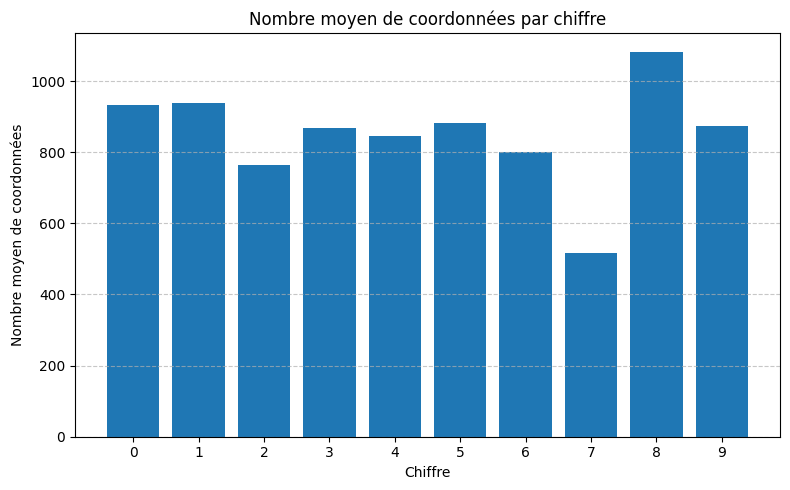

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_14680\2831222746.py:59: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 1 : 95.00%

--- Test subject OUT : 2 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 2 : 76.00%

--- Test subject OUT : 3 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 3 : 96.00%

--- Test subject OUT : 4 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 4 : 100.00%

--- Test subject OUT : 5 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 5 : 96.00%

--- Test subject OUT : 6 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 6 : 98.00%

--- Test subject OUT : 7 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 7 : 94.00%

--- Test subject OUT : 8 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 8 : 98.00%

--- Test subject OUT : 9 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 9 : 94.00%

--- Test subject OUT : 10 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 10 : 89.00%

Exactitude globale LSTM : 93.60%


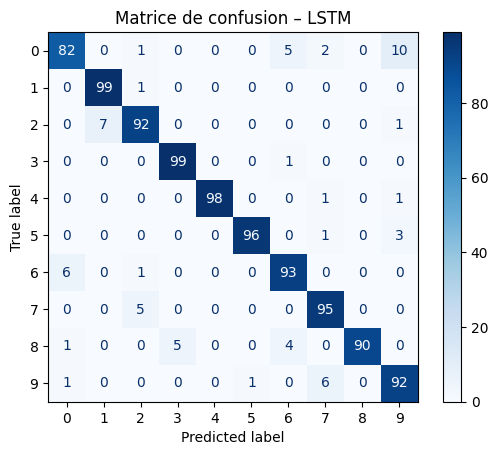

In [15]:
import pandas as pd
import numpy as np
from collections import defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import models, layers

# ------------------------
# Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)

# ------------------------
# Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# ------------------------
# Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)

# ------------------------
# Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ------------------------
# Création train/test user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test

# ------------------------
# LSTM Model
# ------------------------
def create_lstm_model(input_shape, num_classes):
    model = models.Sequential([
        layers.LSTM(64, return_sequences=True, dropout=0.2, input_shape=input_shape),
        layers.LSTM(64, dropout=0.3),
        layers.Dense(32, activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# ------------------------
# Test du modèle LSTM
# ------------------------
def test_lstm_user_independent(df, loop_range=10, epochs=50, batch_size=32):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")
        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        model = create_lstm_model(input_shape=(X_train.shape[1], X_train.shape[2]), num_classes=len(np.unique(y_train)))
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale LSTM : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – LSTM")
    plt.show()

# ------------------------
# Lancer le test
# ------------------------
test_lstm_user_independent(df100)

# ombre neurpone 32 au lieu 64 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_14680\1081679120.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


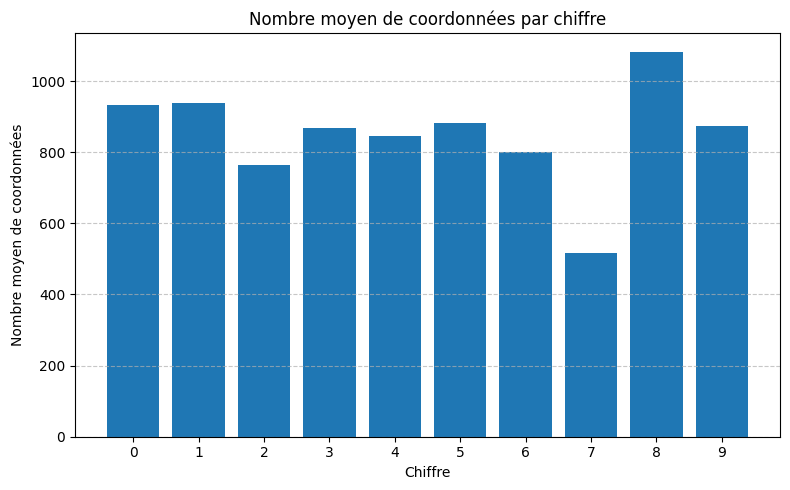

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_14680\1081679120.py:59: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 1 : 89.00%

--- Test subject OUT : 2 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 2 : 80.00%

--- Test subject OUT : 3 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 3 : 87.00%

--- Test subject OUT : 4 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 4 : 99.00%

--- Test subject OUT : 5 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 5 : 80.00%

--- Test subject OUT : 6 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 6 : 87.00%

--- Test subject OUT : 7 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 7 : 87.00%

--- Test subject OUT : 8 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 8 : 98.00%

--- Test subject OUT : 9 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 9 : 99.00%

--- Test subject OUT : 10 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 10 : 87.00%

Exactitude globale LSTM : 89.30%


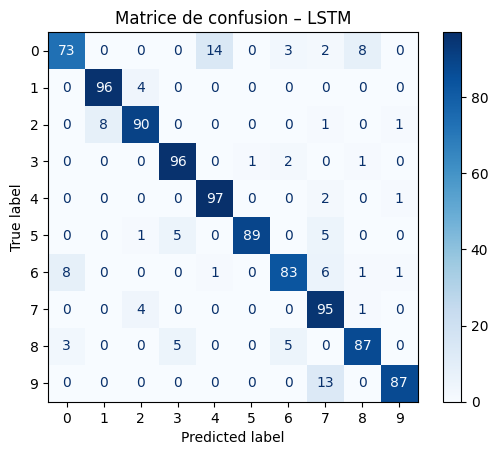

In [16]:
import pandas as pd
import numpy as np
from collections import defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import models, layers

# ------------------------
# Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)

# ------------------------
# Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# ------------------------
# Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)

# ------------------------
# Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ------------------------
# Création train/test user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test

# ------------------------
# LSTM Model
# ------------------------
def create_lstm_model(input_shape, num_classes):
    model = models.Sequential([
        layers.LSTM(32, return_sequences=True, dropout=0.2, input_shape=input_shape),
        layers.LSTM(32, dropout=0.3),
        layers.Dense(32, activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# ------------------------
# Test du modèle LSTM
# ------------------------
def test_lstm_user_independent(df, loop_range=10, epochs=50, batch_size=32):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")
        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        model = create_lstm_model(input_shape=(X_train.shape[1], X_train.shape[2]), num_classes=len(np.unique(y_train)))
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale LSTM : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – LSTM")
    plt.show()

# ------------------------
# Lancer le test
# ------------------------
test_lstm_user_independent(df100)

#nombre neurone 128

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_14680\142693011.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


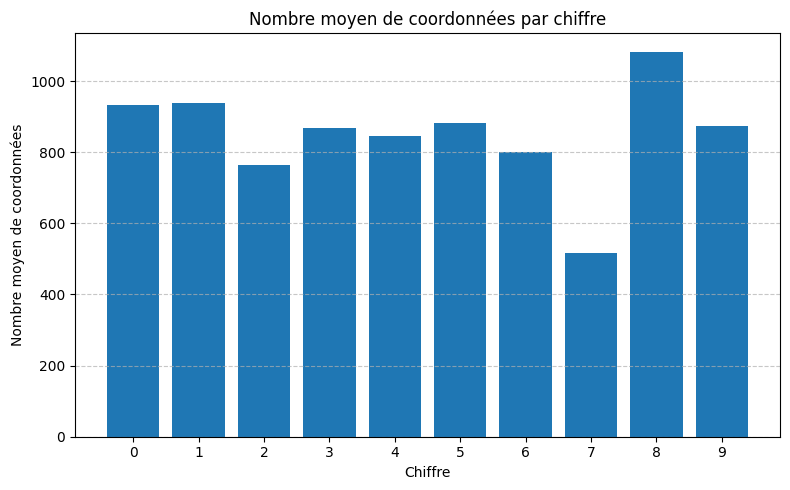

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_14680\142693011.py:59: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 1 : 85.00%

--- Test subject OUT : 2 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 2 : 79.00%

--- Test subject OUT : 3 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 3 : 98.00%

--- Test subject OUT : 4 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 4 : 100.00%

--- Test subject OUT : 5 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 5 : 96.00%

--- Test subject OUT : 6 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 6 : 94.00%

--- Test subject OUT : 7 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 7 : 91.00%

--- Test subject OUT : 8 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 8 : 99.00%

--- Test subject OUT : 9 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 9 : 100.00%

--- Test subject OUT : 10 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 10 : 97.00%

Exactitude globale LSTM : 93.90%


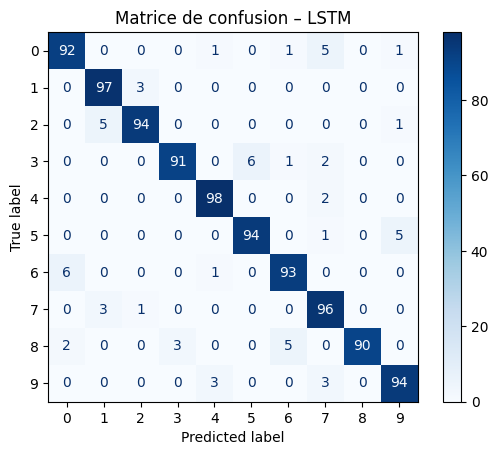

In [ ]:
import pandas as pd
import numpy as np
from collections import defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import models, layers

# ------------------------
# Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)

# ------------------------
# Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# ------------------------
# Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)

# ------------------------
# Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ------------------------
# Création train/test user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test

# ------------------------
# LSTM Model
# ------------------------
def create_lstm_model(input_shape, num_classes):
    model = models.Sequential([
        layers.LSTM(128, return_sequences=True, dropout=0.2, input_shape=input_shape),
        layers.LSTM(128, dropout=0.3),
        layers.Dense(32, activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# ------------------------
# Test du modèle LSTM
# ------------------------
def test_lstm_user_independent(df, loop_range=10, epochs=50, batch_size=32):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")
        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        model = create_lstm_model(input_shape=(X_train.shape[1], X_train.shape[2]), num_classes=len(np.unique(y_train)))
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale LSTM : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – LSTM")
    plt.show()

# ------------------------
# Lancer le test
# ------------------------
test_lstm_user_independent(df100)

#neuronne 64 - 64 dense 64

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_14680\661243272.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


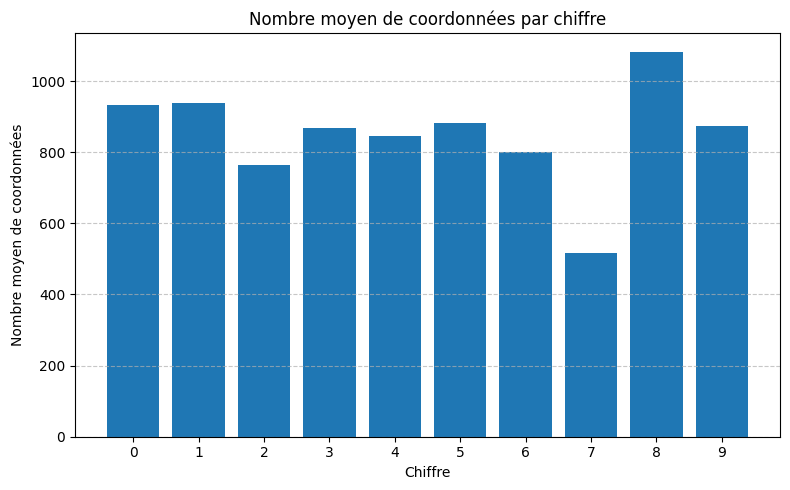

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_14680\661243272.py:59: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 1 : 97.00%

--- Test subject OUT : 2 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 2 : 82.00%

--- Test subject OUT : 3 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 3 : 100.00%

--- Test subject OUT : 4 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 4 : 100.00%

--- Test subject OUT : 5 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 5 : 91.00%

--- Test subject OUT : 6 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 6 : 97.00%

--- Test subject OUT : 7 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 7 : 86.00%

--- Test subject OUT : 8 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 8 : 99.00%

--- Test subject OUT : 9 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 9 : 97.00%

--- Test subject OUT : 10 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 10 : 88.00%

Exactitude globale LSTM : 93.70%


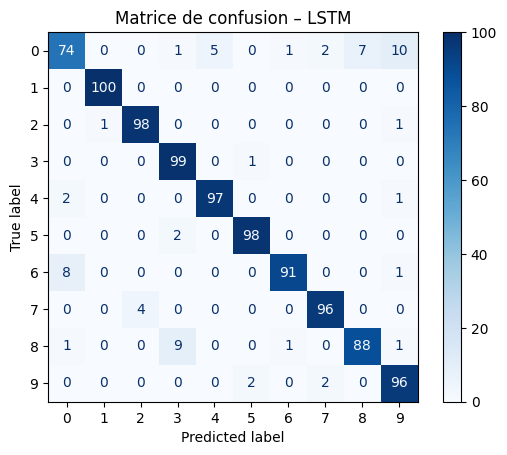

In [18]:
import pandas as pd
import numpy as np
from collections import defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import models, layers

# ------------------------
# Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)

# ------------------------
# Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# ------------------------
# Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)

# ------------------------
# Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ------------------------
# Création train/test user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test

# ------------------------
# LSTM Model
# ------------------------
def create_lstm_model(input_shape, num_classes):
    model = models.Sequential([
        layers.LSTM(64, return_sequences=True, dropout=0.2, input_shape=input_shape),
        layers.LSTM(64, dropout=0.3),
        layers.Dense(64, activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# ------------------------
# Test du modèle LSTM
# ------------------------
def test_lstm_user_independent(df, loop_range=10, epochs=50, batch_size=32):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")
        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        model = create_lstm_model(input_shape=(X_train.shape[1], X_train.shape[2]), num_classes=len(np.unique(y_train)))
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale LSTM : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – LSTM")
    plt.show()

# ------------------------
# Lancer le test
# ------------------------
test_lstm_user_independent(df100)

# 12! 128 dense 64

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_14680\105260738.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


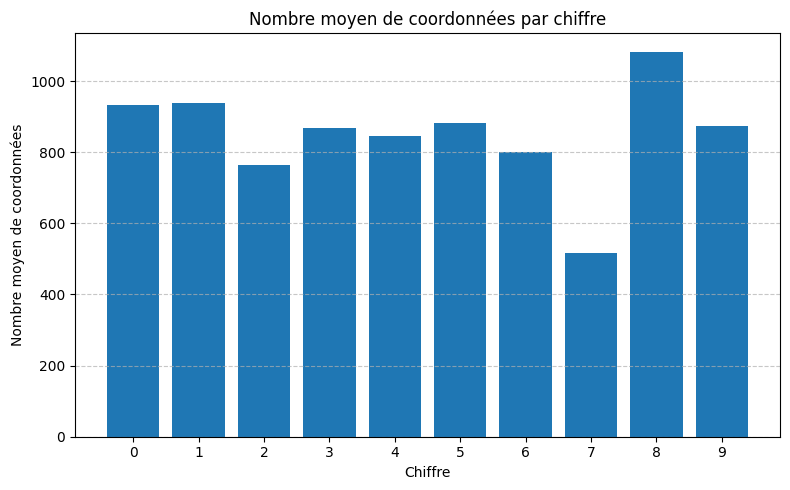

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_14680\105260738.py:59: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 1 : 98.00%

--- Test subject OUT : 2 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 2 : 70.00%

--- Test subject OUT : 3 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 3 : 99.00%

--- Test subject OUT : 4 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 4 : 100.00%

--- Test subject OUT : 5 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 5 : 90.00%

--- Test subject OUT : 6 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 6 : 91.00%

--- Test subject OUT : 7 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 7 : 88.00%

--- Test subject OUT : 8 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 8 : 97.00%

--- Test subject OUT : 9 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 9 : 100.00%

--- Test subject OUT : 10 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 10 : 87.00%

Exactitude globale LSTM : 92.00%


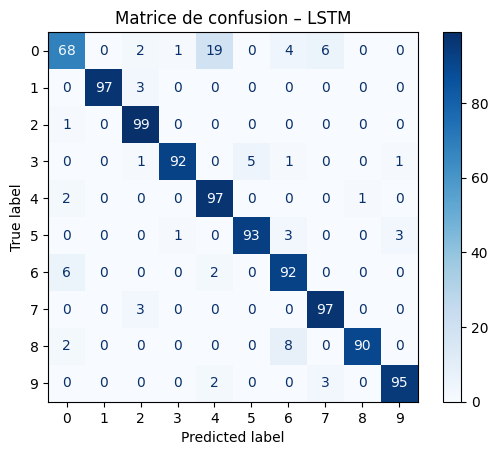

In [19]:
import pandas as pd
import numpy as np
from collections import defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import models, layers

# ------------------------
# Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)

# ------------------------
# Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# ------------------------
# Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)

# ------------------------
# Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ------------------------
# Création train/test user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test

# ------------------------
# LSTM Model
# ------------------------
def create_lstm_model(input_shape, num_classes):
    model = models.Sequential([
        layers.LSTM(128, return_sequences=True, dropout=0.2, input_shape=input_shape),
        layers.LSTM(128, dropout=0.3),
        layers.Dense(64, activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# ------------------------
# Test du modèle LSTM
# ------------------------
def test_lstm_user_independent(df, loop_range=10, epochs=50, batch_size=32):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")
        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        model = create_lstm_model(input_shape=(X_train.shape[1], X_train.shape[2]), num_classes=len(np.unique(y_train)))
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale LSTM : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – LSTM")
    plt.show()

# ------------------------
# Lancer le test
# ------------------------
test_lstm_user_independent(df100)

#32 32 dense 64

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_14680\846414299.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


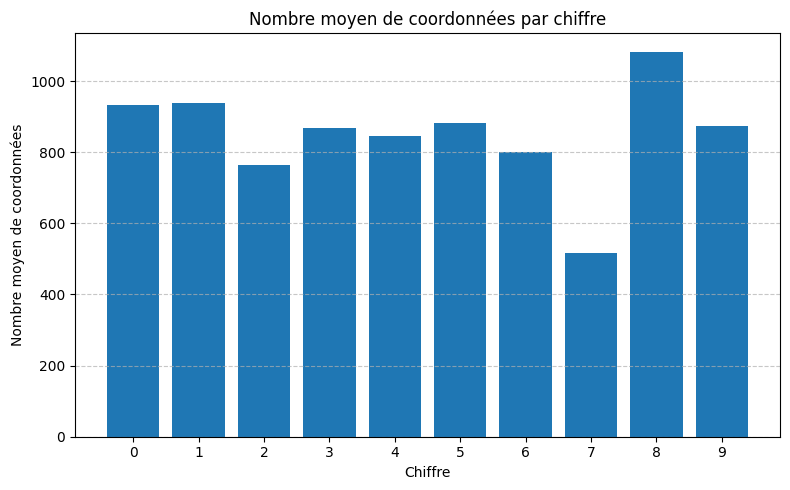

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_14680\846414299.py:59: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 1 : 95.00%

--- Test subject OUT : 2 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 2 : 76.00%

--- Test subject OUT : 3 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 3 : 90.00%

--- Test subject OUT : 4 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 4 : 98.00%

--- Test subject OUT : 5 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 5 : 78.00%

--- Test subject OUT : 6 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 6 : 88.00%

--- Test subject OUT : 7 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 7 : 83.00%

--- Test subject OUT : 8 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 8 : 99.00%

--- Test subject OUT : 9 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 9 : 98.00%

--- Test subject OUT : 10 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 10 : 84.00%

Exactitude globale LSTM : 88.90%


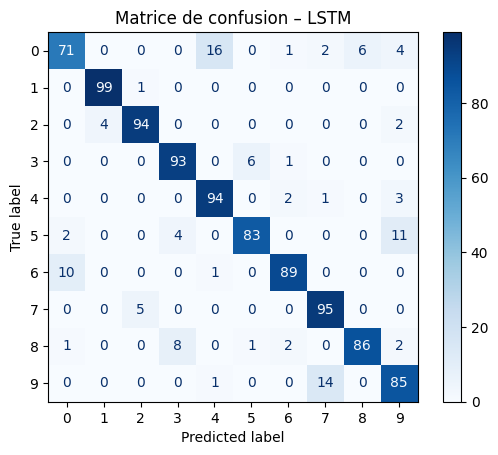

In [20]:
import pandas as pd
import numpy as np
from collections import defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import models, layers

# ------------------------
# Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)

# ------------------------
# Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# ------------------------
# Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)

# ------------------------
# Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ------------------------
# Création train/test user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test

# ------------------------
# LSTM Model
# ------------------------
def create_lstm_model(input_shape, num_classes):
    model = models.Sequential([
        layers.LSTM(32, return_sequences=True, dropout=0.2, input_shape=input_shape),
        layers.LSTM(32, dropout=0.3),
        layers.Dense(64, activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# ------------------------
# Test du modèle LSTM
# ------------------------
def test_lstm_user_independent(df, loop_range=10, epochs=50, batch_size=32):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")
        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        model = create_lstm_model(input_shape=(X_train.shape[1], X_train.shape[2]), num_classes=len(np.unique(y_train)))
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale LSTM : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – LSTM")
    plt.show()

# ------------------------
# Lancer le test
# ------------------------
test_lstm_user_independent(df100)

# 64 64 dense : 16 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_14680\2046871921.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


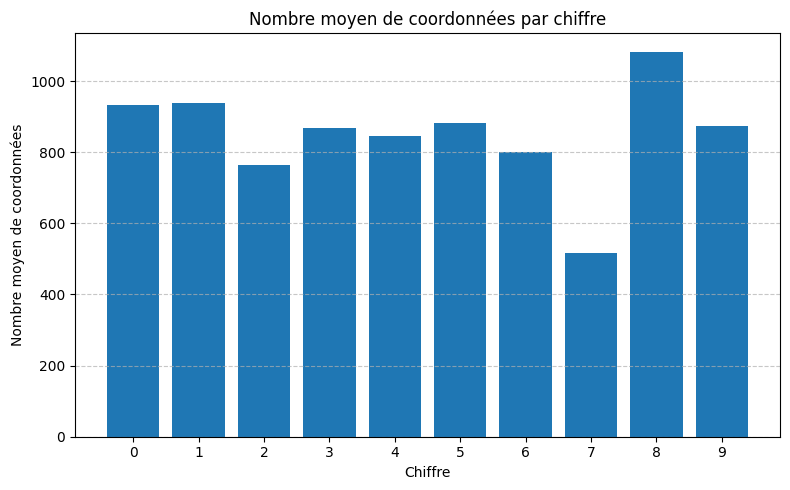

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_14680\2046871921.py:59: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 1 : 90.00%

--- Test subject OUT : 2 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 2 : 74.00%

--- Test subject OUT : 3 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 3 : 98.00%

--- Test subject OUT : 4 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 4 : 99.00%

--- Test subject OUT : 5 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 5 : 89.00%

--- Test subject OUT : 6 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 6 : 94.00%

--- Test subject OUT : 7 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 7 : 98.00%

--- Test subject OUT : 8 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 8 : 98.00%

--- Test subject OUT : 9 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 9 : 100.00%

--- Test subject OUT : 10 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 10 : 90.00%

Exactitude globale LSTM : 93.00%


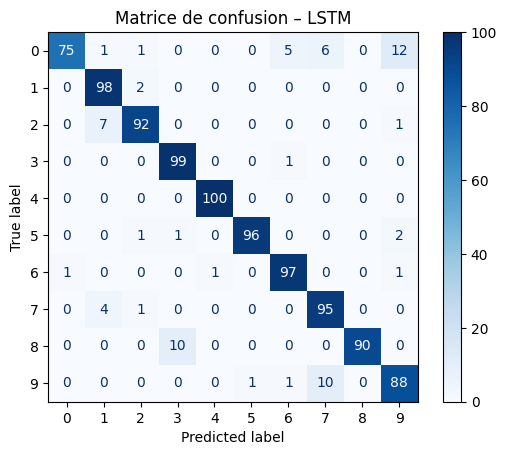

In [21]:
import pandas as pd
import numpy as np
from collections import defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import models, layers

# ------------------------
# Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)

# ------------------------
# Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# ------------------------
# Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)

# ------------------------
# Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ------------------------
# Création train/test user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test

# ------------------------
# LSTM Model
# ------------------------
def create_lstm_model(input_shape, num_classes):
    model = models.Sequential([
        layers.LSTM(64, return_sequences=True, dropout=0.2, input_shape=input_shape),
        layers.LSTM(64, dropout=0.3),
        layers.Dense(16, activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# ------------------------
# Test du modèle LSTM
# ------------------------
def test_lstm_user_independent(df, loop_range=10, epochs=50, batch_size=32):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")
        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        model = create_lstm_model(input_shape=(X_train.shape[1], X_train.shape[2]), num_classes=len(np.unique(y_train)))
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale LSTM : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – LSTM")
    plt.show()

# ------------------------
# Lancer le test
# ------------------------
test_lstm_user_independent(df100)

# 32 32 dense 16 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_14680\1876583489.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


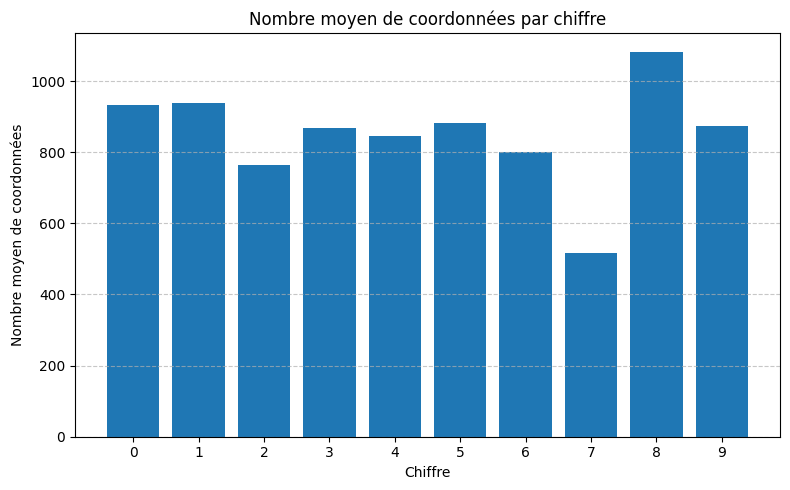

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_14680\1876583489.py:59: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 1 : 93.00%

--- Test subject OUT : 2 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 2 : 80.00%

--- Test subject OUT : 3 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 3 : 92.00%

--- Test subject OUT : 4 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 4 : 97.00%

--- Test subject OUT : 5 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 5 : 90.00%

--- Test subject OUT : 6 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 6 : 84.00%

--- Test subject OUT : 7 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 7 : 84.00%

--- Test subject OUT : 8 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 8 : 96.00%

--- Test subject OUT : 9 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 9 : 97.00%

--- Test subject OUT : 10 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 10 : 78.00%

Exactitude globale LSTM : 89.10%


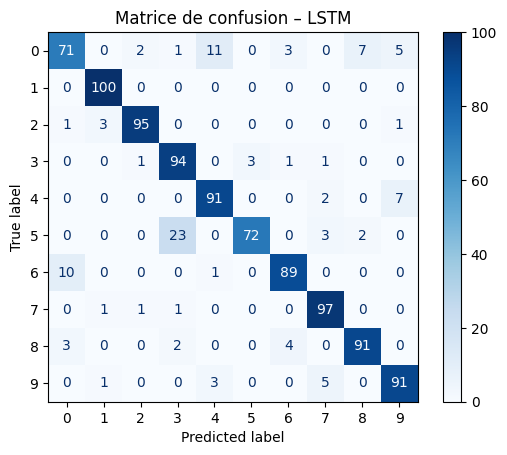

In [22]:
import pandas as pd
import numpy as np
from collections import defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import models, layers

# ------------------------
# Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)

# ------------------------
# Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# ------------------------
# Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)

# ------------------------
# Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ------------------------
# Création train/test user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test

# ------------------------
# LSTM Model
# ------------------------
def create_lstm_model(input_shape, num_classes):
    model = models.Sequential([
        layers.LSTM(32, return_sequences=True, dropout=0.2, input_shape=input_shape),
        layers.LSTM(32, dropout=0.3),
        layers.Dense(16, activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# ------------------------
# Test du modèle LSTM
# ------------------------
def test_lstm_user_independent(df, loop_range=10, epochs=50, batch_size=32):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")
        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        model = create_lstm_model(input_shape=(X_train.shape[1], X_train.shape[2]), num_classes=len(np.unique(y_train)))
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale LSTM : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – LSTM")
    plt.show()

# ------------------------
# Lancer le test
# ------------------------
test_lstm_user_independent(df100)

#16 16 dense 16

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_16992\1050345086.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


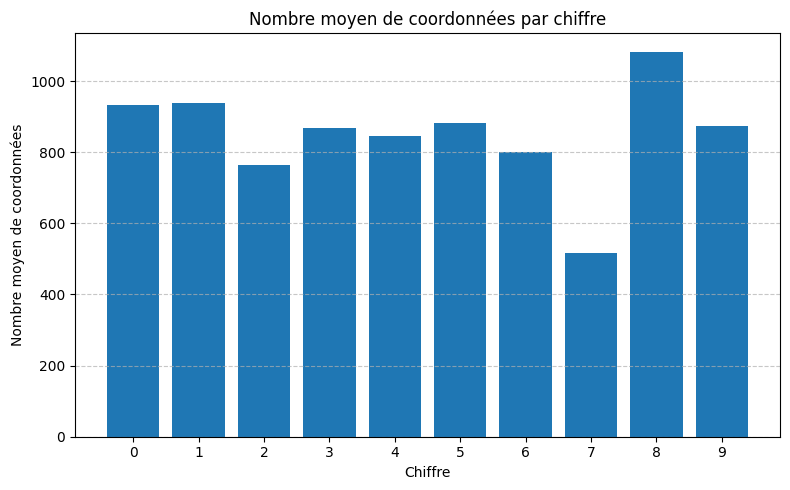

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_16992\1050345086.py:59: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 1 : 77.00%

--- Test subject OUT : 2 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 2 : 56.00%

--- Test subject OUT : 3 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 3 : 91.00%

--- Test subject OUT : 4 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 4 : 82.00%

--- Test subject OUT : 5 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 5 : 63.00%

--- Test subject OUT : 6 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 6 : 72.00%

--- Test subject OUT : 7 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 7 : 82.00%

--- Test subject OUT : 8 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 8 : 89.00%

--- Test subject OUT : 9 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 9 : 80.00%

--- Test subject OUT : 10 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 10 : 86.00%

Exactitude globale LSTM : 77.80%


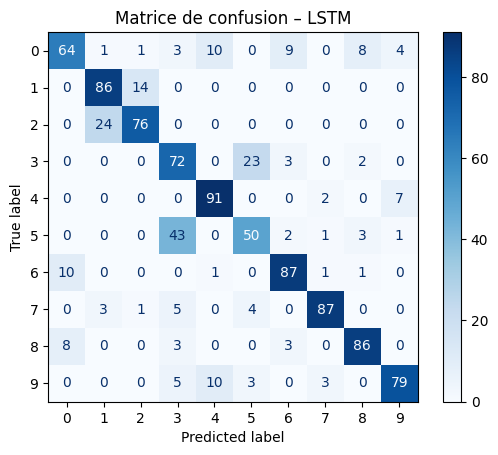

In [1]:
import pandas as pd
import numpy as np
from collections import defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import models, layers

# ------------------------
# Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)

# ------------------------
# Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# ------------------------
# Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)

# ------------------------
# Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ------------------------
# Création train/test user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test

# ------------------------
# LSTM Model
# ------------------------
def create_lstm_model(input_shape, num_classes):
    model = models.Sequential([
        layers.LSTM(16, return_sequences=True, dropout=0.2, input_shape=input_shape),
        layers.LSTM(16, dropout=0.3),
        layers.Dense(16, activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# ------------------------
# Test du modèle LSTM
# ------------------------
def test_lstm_user_independent(df, loop_range=10, epochs=50, batch_size=32):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")
        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        model = create_lstm_model(input_shape=(X_train.shape[1], X_train.shape[2]), num_classes=len(np.unique(y_train)))
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale LSTM : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – LSTM")
    plt.show()

# ------------------------
# Lancer le test
# ------------------------
test_lstm_user_independent(df100)

# lstm 16 16 32

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_6560\3788398329.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


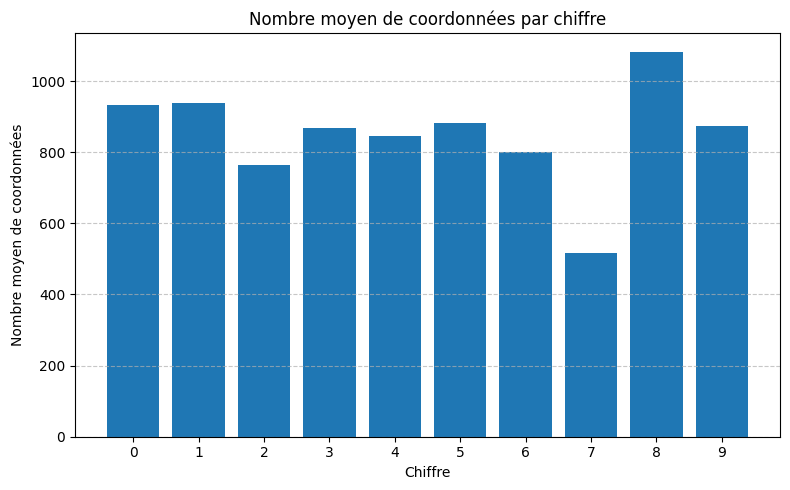

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_6560\3788398329.py:59: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 1 : 90.00%

--- Test subject OUT : 2 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 2 : 62.00%

--- Test subject OUT : 3 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 3 : 84.00%

--- Test subject OUT : 4 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 4 : 83.00%

--- Test subject OUT : 5 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 5 : 68.00%

--- Test subject OUT : 6 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 6 : 68.00%

--- Test subject OUT : 7 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 7 : 71.00%

--- Test subject OUT : 8 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 8 : 85.00%

--- Test subject OUT : 9 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 9 : 92.00%

--- Test subject OUT : 10 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 10 : 81.00%

Exactitude globale LSTM : 78.40%


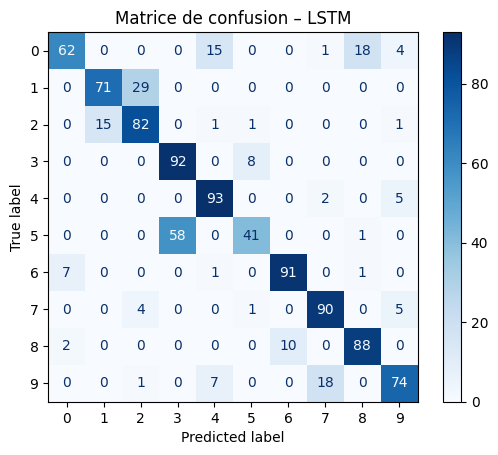

In [1]:
import pandas as pd
import numpy as np
from collections import defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import models, layers

# ------------------------
# Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)

# ------------------------
# Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# ------------------------
# Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)

# ------------------------
# Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ------------------------
# Création train/test user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test

# ------------------------
# LSTM Model
# ------------------------
def create_lstm_model(input_shape, num_classes):
    model = models.Sequential([
        layers.LSTM(16, return_sequences=True, dropout=0.2, input_shape=input_shape),
        layers.LSTM(16, dropout=0.3),
        layers.Dense(32, activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# ------------------------
# Test du modèle LSTM
# ------------------------
def test_lstm_user_independent(df, loop_range=10, epochs=50, batch_size=32):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")
        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        model = create_lstm_model(input_shape=(X_train.shape[1], X_train.shape[2]), num_classes=len(np.unique(y_train)))
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale LSTM : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – LSTM")
    plt.show()

# ------------------------
# Lancer le test
# ------------------------
test_lstm_user_independent(df100)

# lstm 16 16 64

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_6560\3545831525.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


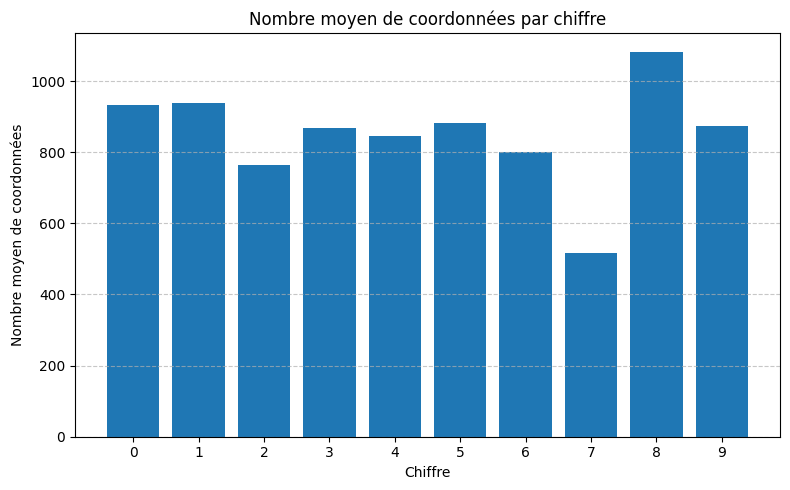

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_6560\3545831525.py:59: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 1 : 82.00%

--- Test subject OUT : 2 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 2 : 58.00%

--- Test subject OUT : 3 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 3 : 80.00%

--- Test subject OUT : 4 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 4 : 83.00%

--- Test subject OUT : 5 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 5 : 71.00%

--- Test subject OUT : 6 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 6 : 85.00%

--- Test subject OUT : 7 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 7 : 69.00%

--- Test subject OUT : 8 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 8 : 93.00%

--- Test subject OUT : 9 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 9 : 87.00%

--- Test subject OUT : 10 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 10 : 84.00%

Exactitude globale LSTM : 79.20%


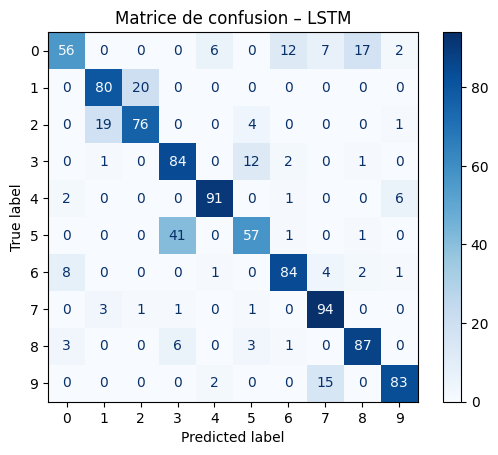

In [2]:
import pandas as pd
import numpy as np
from collections import defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import models, layers

# ------------------------
# Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)

# ------------------------
# Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# ------------------------
# Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)

# ------------------------
# Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ------------------------
# Création train/test user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test

# ------------------------
# LSTM Model
# ------------------------
def create_lstm_model(input_shape, num_classes):
    model = models.Sequential([
        layers.LSTM(16, return_sequences=True, dropout=0.2, input_shape=input_shape),
        layers.LSTM(16, dropout=0.3),
        layers.Dense(64, activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# ------------------------
# Test du modèle LSTM
# ------------------------
def test_lstm_user_independent(df, loop_range=10, epochs=50, batch_size=32):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")
        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        model = create_lstm_model(input_shape=(X_train.shape[1], X_train.shape[2]), num_classes=len(np.unique(y_train)))
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale LSTM : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – LSTM")
    plt.show()

# ------------------------
# Lancer le test
# ------------------------
test_lstm_user_independent(df100)

#256 256 dense 32

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_16992\1656696849.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


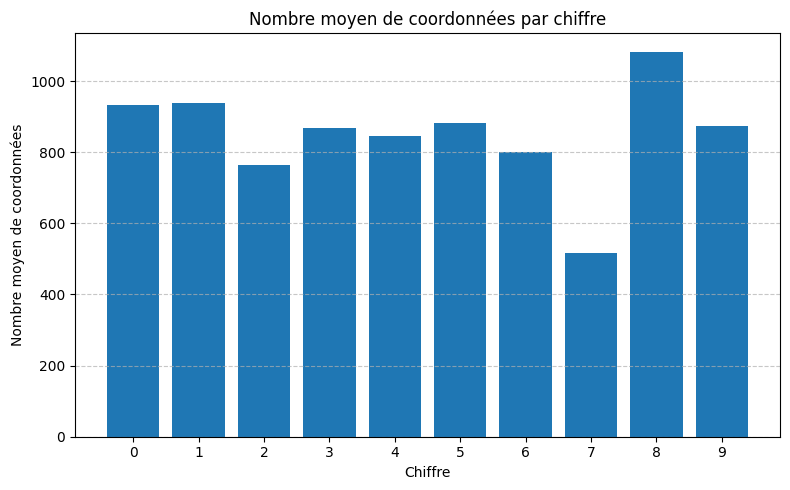

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_16992\1656696849.py:59: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 1 : 96.00%

--- Test subject OUT : 2 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 2 : 86.00%

--- Test subject OUT : 3 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 3 : 100.00%

--- Test subject OUT : 4 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 4 : 100.00%

--- Test subject OUT : 5 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 5 : 91.00%

--- Test subject OUT : 6 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 6 : 97.00%

--- Test subject OUT : 7 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 7 : 95.00%

--- Test subject OUT : 8 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 8 : 100.00%

--- Test subject OUT : 9 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 9 : 100.00%

--- Test subject OUT : 10 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 10 : 88.00%

Exactitude globale LSTM : 95.30%


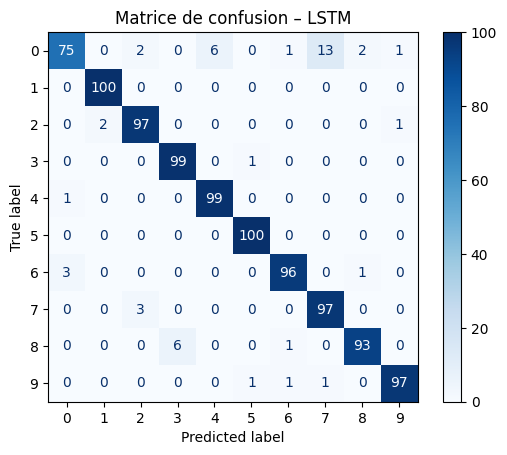

In [2]:
import pandas as pd
import numpy as np
from collections import defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import models, layers

# ------------------------
# Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)

# ------------------------
# Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# ------------------------
# Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)

# ------------------------
# Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ------------------------
# Création train/test user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test

# ------------------------
# LSTM Model
# ------------------------
def create_lstm_model(input_shape, num_classes):
    model = models.Sequential([
        layers.LSTM(256, return_sequences=True, dropout=0.2, input_shape=input_shape),
        layers.LSTM(256, dropout=0.3),
        layers.Dense(32 , activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# ------------------------
# Test du modèle LSTM
# ------------------------
def test_lstm_user_independent(df, loop_range=10, epochs=50, batch_size=32):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")
        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        model = create_lstm_model(input_shape=(X_train.shape[1], X_train.shape[2]), num_classes=len(np.unique(y_train)))
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale LSTM : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues") 
    plt.title("Matrice de confusion – LSTM")
    plt.show()

# ------------------------
# Lancer le test
# ------------------------
test_lstm_user_independent(df100)

# 256 256 dense 64

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_20280\2666469327.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


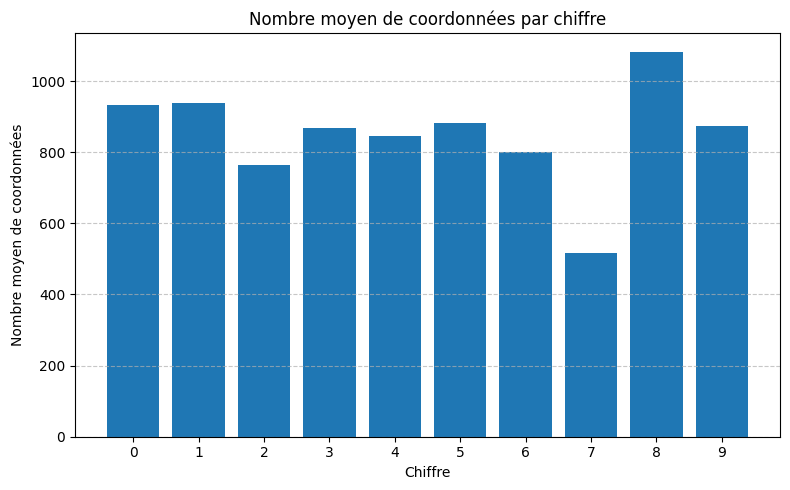

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_20280\2666469327.py:59: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 1 : 99.00%

--- Test subject OUT : 2 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 2 : 88.00%

--- Test subject OUT : 3 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 3 : 99.00%

--- Test subject OUT : 4 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 4 : 100.00%

--- Test subject OUT : 5 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 5 : 98.00%

--- Test subject OUT : 6 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 6 : 93.00%

--- Test subject OUT : 7 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 7 : 93.00%

--- Test subject OUT : 8 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 8 : 100.00%

--- Test subject OUT : 9 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 9 : 96.00%

--- Test subject OUT : 10 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 10 : 93.00%

Exactitude globale LSTM : 95.90%


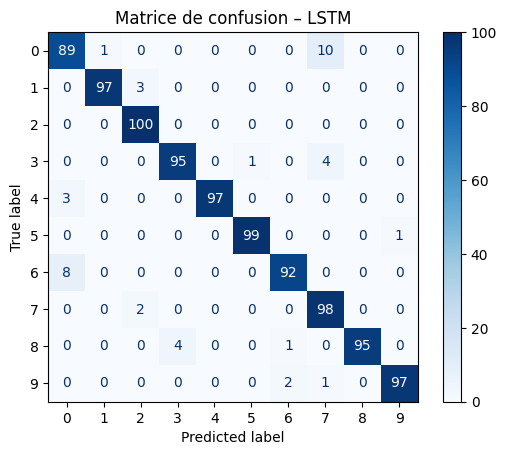

In [1]:
import pandas as pd
import numpy as np
from collections import defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import models, layers

# ------------------------
# Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)

# ------------------------
# Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# ------------------------
# Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)

# ------------------------
# Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ------------------------
# Création train/test user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test

# ------------------------
# LSTM Model
# ------------------------
def create_lstm_model(input_shape, num_classes):
    model = models.Sequential([
        layers.LSTM(256, return_sequences=True, dropout=0.2, input_shape=input_shape),
        layers.LSTM(256, dropout=0.3),
        layers.Dense(64 , activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# ------------------------
# Test du modèle LSTM
# ------------------------
def test_lstm_user_independent(df, loop_range=10, epochs=50, batch_size=32):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")
        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        model = create_lstm_model(input_shape=(X_train.shape[1], X_train.shape[2]), num_classes=len(np.unique(y_train)))
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale LSTM : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues") 
    plt.title("Matrice de confusion – LSTM")
    plt.show()

# ------------------------
# Lancer le test
# ------------------------
test_lstm_user_independent(df100)

#256 256 16

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_20280\2671649114.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


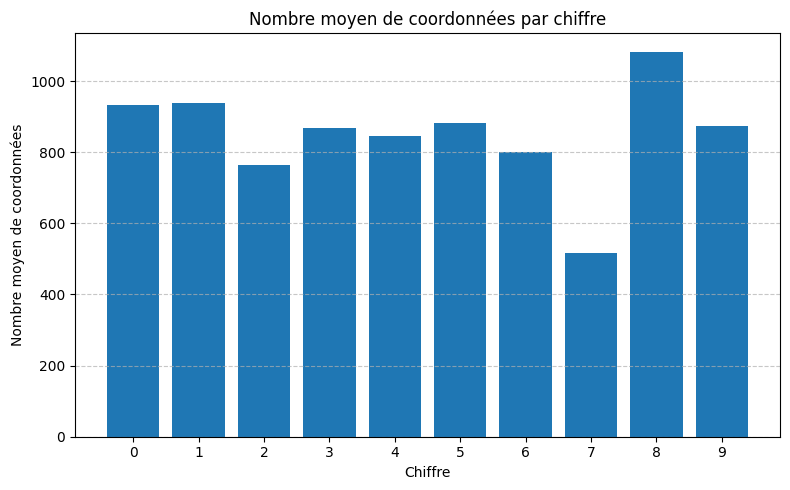

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_20280\2671649114.py:59: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 1 : 98.00%

--- Test subject OUT : 2 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 2 : 82.00%

--- Test subject OUT : 3 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 3 : 79.00%

--- Test subject OUT : 4 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 4 : 99.00%

--- Test subject OUT : 5 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 5 : 94.00%

--- Test subject OUT : 6 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 6 : 94.00%

--- Test subject OUT : 7 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 7 : 95.00%

--- Test subject OUT : 8 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 8 : 100.00%

--- Test subject OUT : 9 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 9 : 100.00%

--- Test subject OUT : 10 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 10 : 89.00%

Exactitude globale LSTM : 93.00%


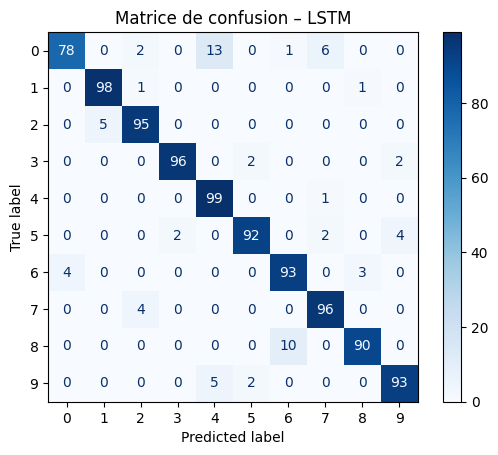

In [2]:
import pandas as pd
import numpy as np
from collections import defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import models, layers

# ------------------------
# Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)

# ------------------------
# Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# ------------------------
# Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)

# ------------------------
# Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ------------------------
# Création train/test user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test

# ------------------------
# LSTM Model
# ------------------------
def create_lstm_model(input_shape, num_classes):
    model = models.Sequential([
        layers.LSTM(256, return_sequences=True, dropout=0.2, input_shape=input_shape),
        layers.LSTM(256, dropout=0.3),
        layers.Dense(16 , activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# ------------------------
# Test du modèle LSTM
# ------------------------
def test_lstm_user_independent(df, loop_range=10, epochs=50, batch_size=32):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")
        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        model = create_lstm_model(input_shape=(X_train.shape[1], X_train.shape[2]), num_classes=len(np.unique(y_train)))
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale LSTM : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues") 
    plt.title("Matrice de confusion – LSTM")
    plt.show()

# ------------------------
# Lancer le test
# ------------------------
test_lstm_user_independent(df100)

# 64 64 32 batch 16

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_20280\631923589.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


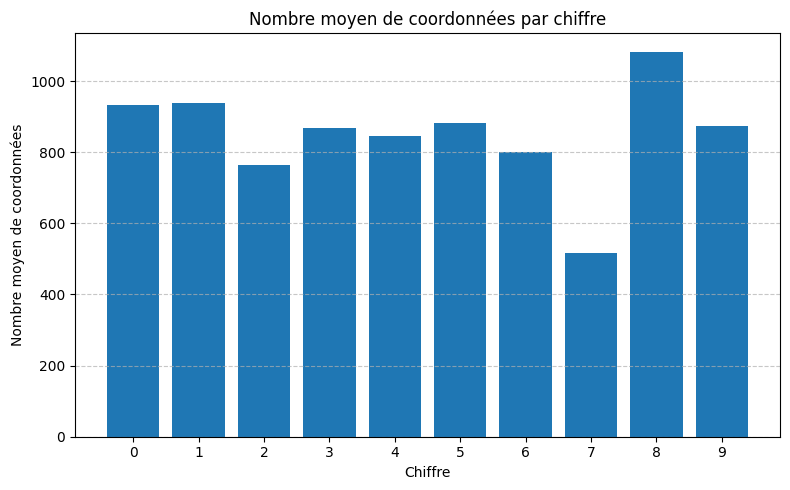

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_20280\631923589.py:59: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 1 : 99.00%

--- Test subject OUT : 2 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 2 : 75.00%

--- Test subject OUT : 3 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 3 : 96.00%

--- Test subject OUT : 4 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 4 : 99.00%

--- Test subject OUT : 5 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 5 : 94.00%

--- Test subject OUT : 6 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 6 : 96.00%

--- Test subject OUT : 7 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 7 : 92.00%

--- Test subject OUT : 8 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 8 : 99.00%

--- Test subject OUT : 9 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 9 : 94.00%

--- Test subject OUT : 10 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 10 : 88.00%

Exactitude globale LSTM : 93.20%


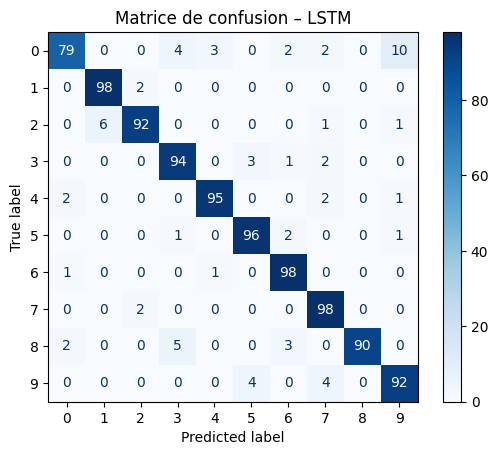

In [3]:
import pandas as pd
import numpy as np
from collections import defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import models, layers

# ------------------------
# Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)

# ------------------------
# Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# ------------------------
# Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)

# ------------------------
# Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ------------------------
# Création train/test user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test

# ------------------------
# LSTM Model
# ------------------------
def create_lstm_model(input_shape, num_classes):
    model = models.Sequential([
        layers.LSTM(64, return_sequences=True, dropout=0.2, input_shape=input_shape),
        layers.LSTM(64, dropout=0.3),
        layers.Dense(32, activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# ------------------------
# Test du modèle LSTM
# ------------------------
def test_lstm_user_independent(df, loop_range=10, epochs=50, batch_size=16):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")
        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        model = create_lstm_model(input_shape=(X_train.shape[1], X_train.shape[2]), num_classes=len(np.unique(y_train)))
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale LSTM : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – LSTM")
    plt.show()

# ------------------------
# Lancer le test
# ------------------------
test_lstm_user_independent(df100)

#64 64 32 batch 64

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_20280\586640688.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


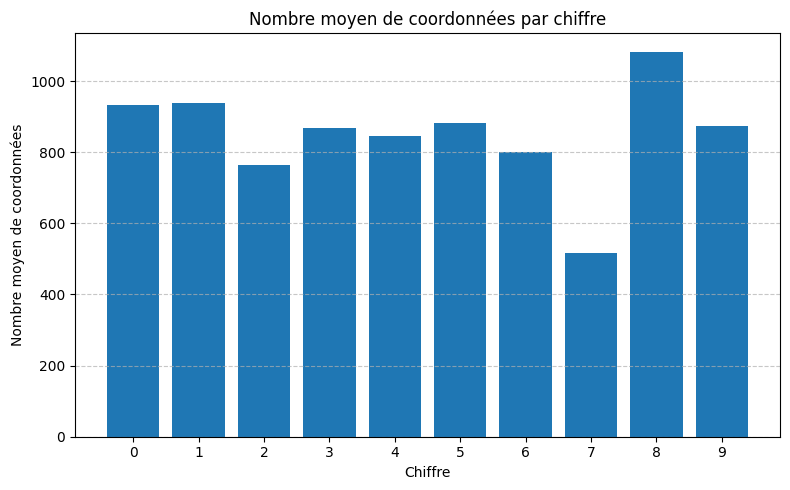

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_20280\586640688.py:59: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 1 : 99.00%

--- Test subject OUT : 2 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 2 : 88.00%

--- Test subject OUT : 3 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 3 : 92.00%

--- Test subject OUT : 4 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 4 : 99.00%

--- Test subject OUT : 5 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 5 : 82.00%

--- Test subject OUT : 6 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 6 : 91.00%

--- Test subject OUT : 7 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 7 : 90.00%

--- Test subject OUT : 8 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 8 : 98.00%

--- Test subject OUT : 9 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 9 : 98.00%

--- Test subject OUT : 10 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 10 : 86.00%

Exactitude globale LSTM : 92.30%


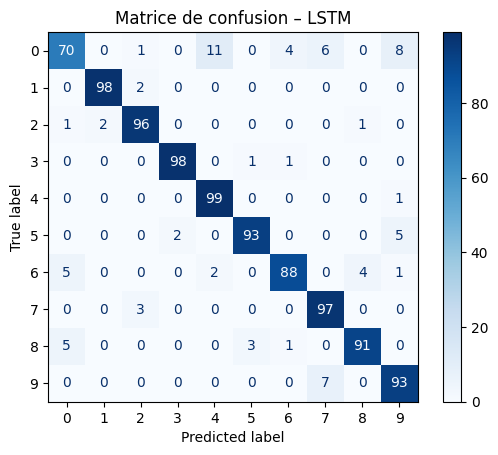

In [4]:
import pandas as pd
import numpy as np
from collections import defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import models, layers

# ------------------------
# Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)

# ------------------------
# Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# ------------------------
# Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)

# ------------------------
# Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ------------------------
# Création train/test user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test

# ------------------------
# LSTM Model
# ------------------------
def create_lstm_model(input_shape, num_classes):
    model = models.Sequential([
        layers.LSTM(64, return_sequences=True, dropout=0.2, input_shape=input_shape),
        layers.LSTM(64, dropout=0.3),
        layers.Dense(32, activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# ------------------------
# Test du modèle LSTM
# ------------------------
def test_lstm_user_independent(df, loop_range=10, epochs=50, batch_size=64):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")
        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        model = create_lstm_model(input_shape=(X_train.shape[1], X_train.shape[2]), num_classes=len(np.unique(y_train)))
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale LSTM : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – LSTM")
    plt.show()

# ------------------------
# Lancer le test
# ------------------------
test_lstm_user_independent(df100)

# 32 32 64 batch size 16

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_15148\567069908.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


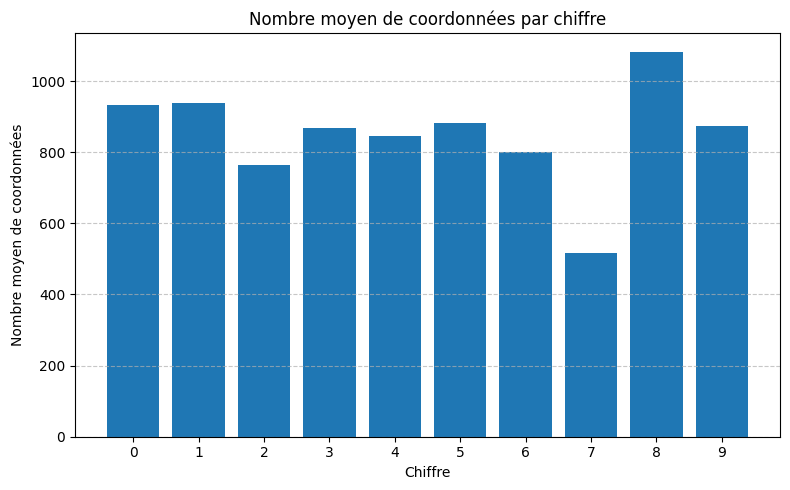

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_15148\567069908.py:59: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 1 : 96.00%

--- Test subject OUT : 2 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 2 : 76.00%

--- Test subject OUT : 3 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 3 : 90.00%

--- Test subject OUT : 4 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 4 : 100.00%

--- Test subject OUT : 5 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 5 : 90.00%

--- Test subject OUT : 6 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 6 : 93.00%

--- Test subject OUT : 7 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 7 : 92.00%

--- Test subject OUT : 8 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 8 : 97.00%

--- Test subject OUT : 9 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 9 : 92.00%

--- Test subject OUT : 10 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 10 : 89.00%

Exactitude globale LSTM : 91.50%


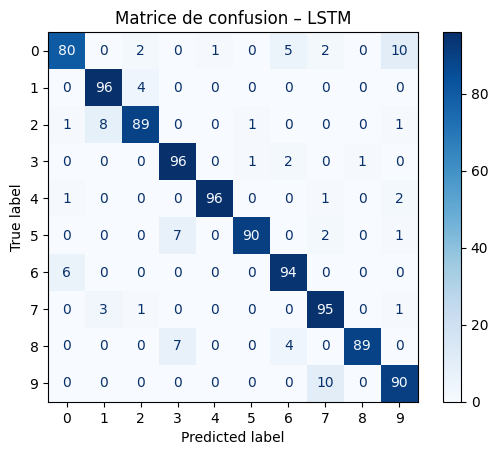

In [1]:
import pandas as pd
import numpy as np
from collections import defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import models, layers

# ------------------------
# Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)

# ------------------------
# Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# ------------------------
# Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)

# ------------------------
# Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ------------------------
# Création train/test user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test

# ------------------------
# LSTM Model
# ------------------------
def create_lstm_model(input_shape, num_classes):
    model = models.Sequential([
        layers.LSTM(32, return_sequences=True, dropout=0.2, input_shape=input_shape),
        layers.LSTM(32, dropout=0.3),
        layers.Dense(64, activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# ------------------------
# Test du modèle LSTM
# ------------------------
def test_lstm_user_independent(df, loop_range=10, epochs=50, batch_size=16):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")
        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        model = create_lstm_model(input_shape=(X_train.shape[1], X_train.shape[2]), num_classes=len(np.unique(y_train)))
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale LSTM : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – LSTM")
    plt.show()

# ------------------------
# Lancer le test
# ------------------------
test_lstm_user_independent(df100)

# 32 32 64 batch size 32

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_15148\846414299.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


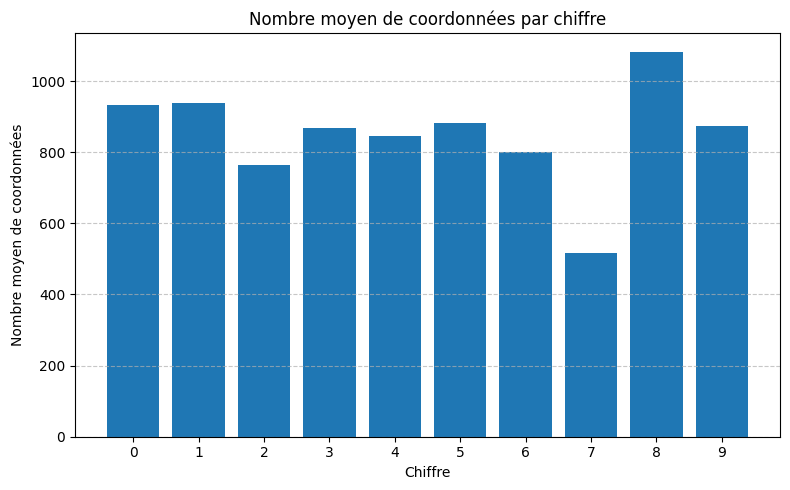

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_15148\846414299.py:59: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 1 : 95.00%

--- Test subject OUT : 2 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 2 : 79.00%

--- Test subject OUT : 3 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 3 : 98.00%

--- Test subject OUT : 4 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 4 : 90.00%

--- Test subject OUT : 5 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 5 : 88.00%

--- Test subject OUT : 6 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 6 : 97.00%

--- Test subject OUT : 7 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 7 : 93.00%

--- Test subject OUT : 8 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 8 : 93.00%

--- Test subject OUT : 9 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 9 : 99.00%

--- Test subject OUT : 10 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 10 : 88.00%

Exactitude globale LSTM : 92.00%


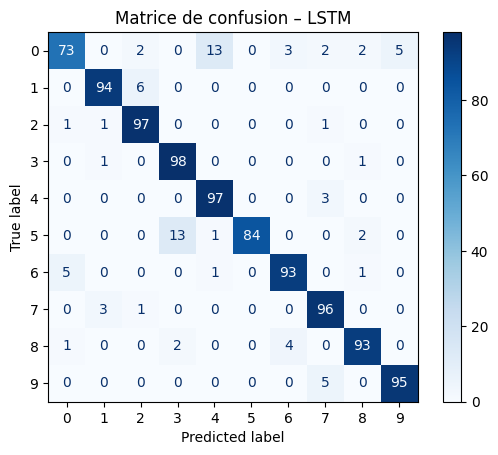

In [3]:
import pandas as pd
import numpy as np
from collections import defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import models, layers

# ------------------------
# Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)

# ------------------------
# Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# ------------------------
# Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)

# ------------------------
# Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ------------------------
# Création train/test user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test

# ------------------------
# LSTM Model
# ------------------------
def create_lstm_model(input_shape, num_classes):
    model = models.Sequential([
        layers.LSTM(32, return_sequences=True, dropout=0.2, input_shape=input_shape),
        layers.LSTM(32, dropout=0.3),
        layers.Dense(64, activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# ------------------------
# Test du modèle LSTM
# ------------------------
def test_lstm_user_independent(df, loop_range=10, epochs=50, batch_size=32):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")
        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        model = create_lstm_model(input_shape=(X_train.shape[1], X_train.shape[2]), num_classes=len(np.unique(y_train)))
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale LSTM : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – LSTM")
    plt.show()

# ------------------------
# Lancer le test
# ------------------------
test_lstm_user_independent(df100)

# 32 32 64  batch size 64 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_15148\1612814944.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


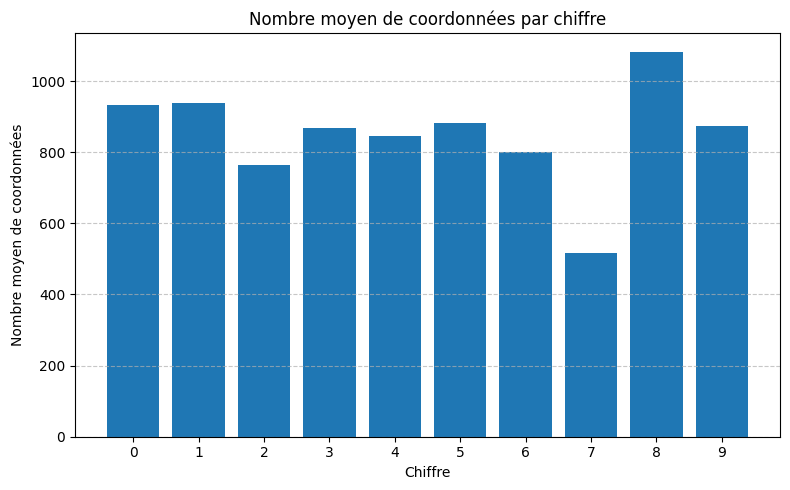

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_15148\1612814944.py:59: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 1 : 97.00%

--- Test subject OUT : 2 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 2 : 72.00%

--- Test subject OUT : 3 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 3 : 94.00%

--- Test subject OUT : 4 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 4 : 88.00%

--- Test subject OUT : 5 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 5 : 88.00%

--- Test subject OUT : 6 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 6 : 87.00%

--- Test subject OUT : 7 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 7 : 80.00%

--- Test subject OUT : 8 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 8 : 95.00%

--- Test subject OUT : 9 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 9 : 99.00%

--- Test subject OUT : 10 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 10 : 87.00%

Exactitude globale LSTM : 88.70%


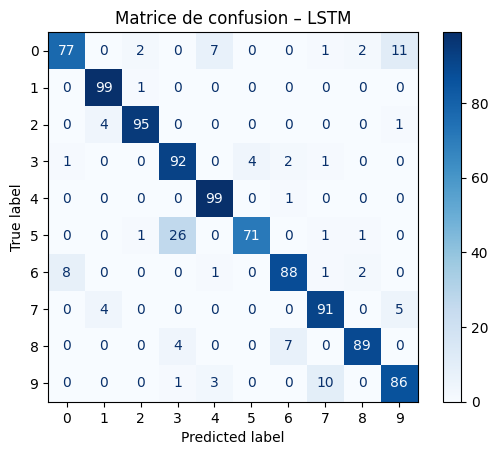

In [2]:
import pandas as pd
import numpy as np
from collections import defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import models, layers

# ------------------------
# Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)

# ------------------------
# Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# ------------------------
# Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)

# ------------------------
# Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ------------------------
# Création train/test user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test

# ------------------------
# LSTM Model
# ------------------------
def create_lstm_model(input_shape, num_classes):
    model = models.Sequential([
        layers.LSTM(32, return_sequences=True, dropout=0.2, input_shape=input_shape),
        layers.LSTM(32, dropout=0.3),
        layers.Dense(64, activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# ------------------------
# Test du modèle LSTM
# ------------------------
def test_lstm_user_independent(df, loop_range=10, epochs=50, batch_size=64):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")
        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        model = create_lstm_model(input_shape=(X_train.shape[1], X_train.shape[2]), num_classes=len(np.unique(y_train)))
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale LSTM : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – LSTM")
    plt.show()

# ------------------------
# Lancer le test
# ------------------------
test_lstm_user_independent(df100)

#128 128 32 batch 64

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_20280\3331050978.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


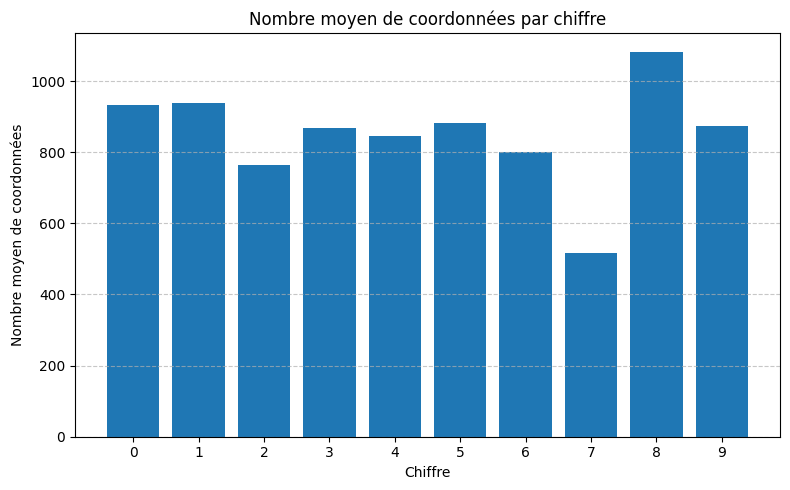

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_20280\3331050978.py:59: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 1 : 94.00%

--- Test subject OUT : 2 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 2 : 75.00%

--- Test subject OUT : 3 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 3 : 99.00%

--- Test subject OUT : 4 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 4 : 100.00%

--- Test subject OUT : 5 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 5 : 97.00%

--- Test subject OUT : 6 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 6 : 95.00%

--- Test subject OUT : 7 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 7 : 93.00%

--- Test subject OUT : 8 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 8 : 99.00%

--- Test subject OUT : 9 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 9 : 100.00%

--- Test subject OUT : 10 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 10 : 86.00%

Exactitude globale LSTM : 93.80%


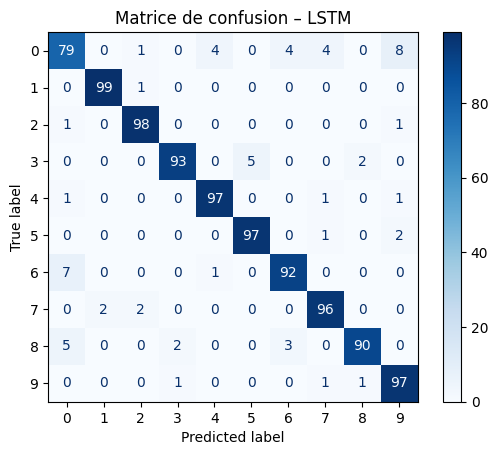

In [5]:
import pandas as pd
import numpy as np
from collections import defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import models, layers

# ------------------------
# Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)

# ------------------------
# Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# ------------------------
# Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)

# ------------------------
# Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ------------------------
# Création train/test user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test

# ------------------------
# LSTM Model
# ------------------------
def create_lstm_model(input_shape, num_classes):
    model = models.Sequential([
        layers.LSTM(128, return_sequences=True, dropout=0.2, input_shape=input_shape),
        layers.LSTM(128, dropout=0.3),
        layers.Dense(32, activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# ------------------------
# Test du modèle LSTM
# ------------------------
def test_lstm_user_independent(df, loop_range=10, epochs=50, batch_size=64):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")
        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        model = create_lstm_model(input_shape=(X_train.shape[1], X_train.shape[2]), num_classes=len(np.unique(y_train)))
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale LSTM : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – LSTM")
    plt.show()

# ------------------------
# Lancer le test
# ------------------------
test_lstm_user_independent(df100)

# 128 128 32 batch 16

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_20280\3633618431.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


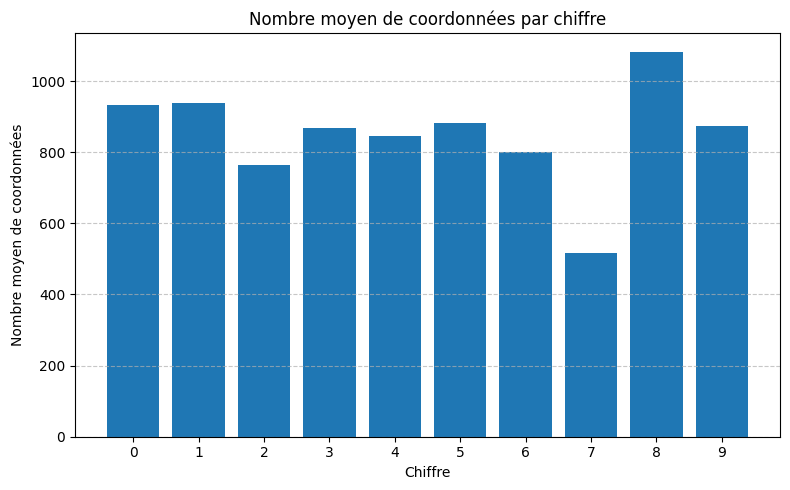

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_20280\3633618431.py:59: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 1 : 97.00%

--- Test subject OUT : 2 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 2 : 81.00%

--- Test subject OUT : 3 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 3 : 97.00%

--- Test subject OUT : 4 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 4 : 100.00%

--- Test subject OUT : 5 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 5 : 82.00%

--- Test subject OUT : 6 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 6 : 95.00%

--- Test subject OUT : 7 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 7 : 95.00%

--- Test subject OUT : 8 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 8 : 100.00%

--- Test subject OUT : 9 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 9 : 100.00%

--- Test subject OUT : 10 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 10 : 95.00%

Exactitude globale LSTM : 94.20%


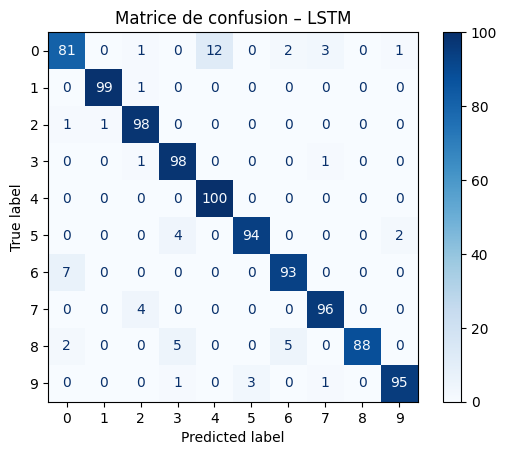

In [6]:
import pandas as pd
import numpy as np
from collections import defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import models, layers

# ------------------------
# Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)

# ------------------------
# Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# ------------------------
# Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)

# ------------------------
# Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ------------------------
# Création train/test user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test

# ------------------------
# LSTM Model
# ------------------------
def create_lstm_model(input_shape, num_classes):
    model = models.Sequential([
        layers.LSTM(128, return_sequences=True, dropout=0.2, input_shape=input_shape),
        layers.LSTM(128, dropout=0.3),
        layers.Dense(32, activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# ------------------------
# Test du modèle LSTM
# ------------------------
def test_lstm_user_independent(df, loop_range=10, epochs=50, batch_size=16):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")
        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        model = create_lstm_model(input_shape=(X_train.shape[1], X_train.shape[2]), num_classes=len(np.unique(y_train)))
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale LSTM : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – LSTM")
    plt.show()

# ------------------------
# Lancer le test
# ------------------------
test_lstm_user_independent(df100)

#256 256 128 32

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_15808\1953144226.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


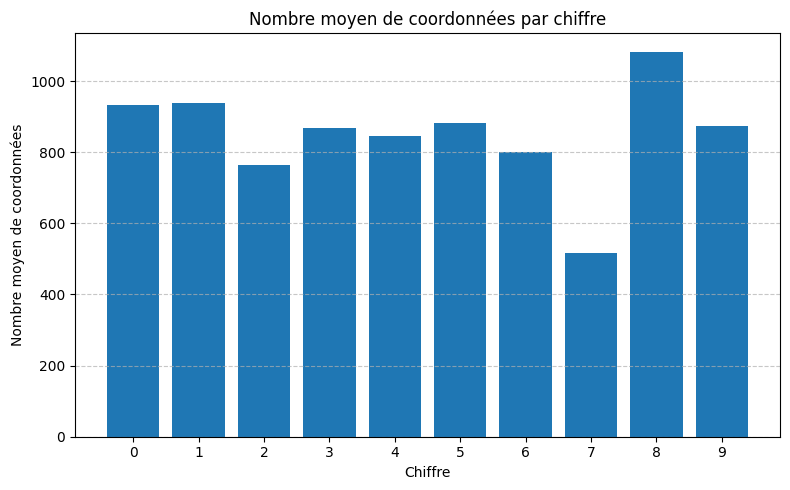

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_15808\1953144226.py:59: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 1 : 90.00%

--- Test subject OUT : 2 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 2 : 85.00%

--- Test subject OUT : 3 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 3 : 100.00%

--- Test subject OUT : 4 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 4 : 100.00%

--- Test subject OUT : 5 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 5 : 90.00%

--- Test subject OUT : 6 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 6 : 98.00%

--- Test subject OUT : 7 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 7 : 92.00%

--- Test subject OUT : 8 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 8 : 98.00%

--- Test subject OUT : 9 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 9 : 100.00%

--- Test subject OUT : 10 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 10 : 83.00%

Exactitude globale LSTM : 93.60%


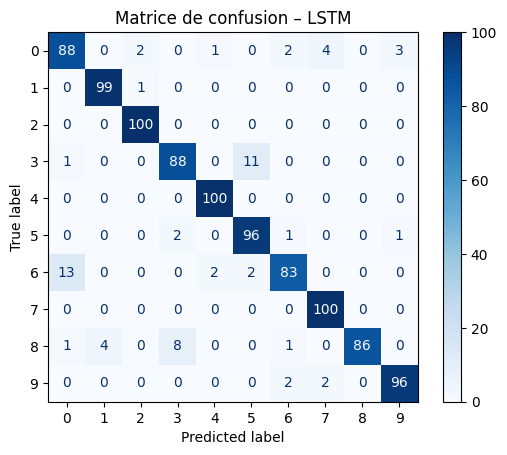

In [1]:
import pandas as pd
import numpy as np
from collections import defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import models, layers

# ------------------------
# Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)

# ------------------------
# Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# ------------------------
# Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)

# ------------------------
# Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ------------------------
# Création train/test user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test

# ------------------------
# LSTM Model
# ------------------------
def create_lstm_model(input_shape, num_classes):
    model = models.Sequential([
        layers.LSTM(256, return_sequences=True, dropout=0.2, input_shape=input_shape),
        layers.LSTM(256, dropout=0.3),
        layers.Dense(128, activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# ------------------------
# Test du modèle LSTM
# ------------------------
def test_lstm_user_independent(df, loop_range=10, epochs=50, batch_size=32):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")
        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        model = create_lstm_model(input_shape=(X_train.shape[1], X_train.shape[2]), num_classes=len(np.unique(y_train)))
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale LSTM : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – LSTM")
    plt.show()

# ------------------------
# Lancer le test
# ------------------------
test_lstm_user_independent(df100)

#256 256 64 bartch 16 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_15808\15257165.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


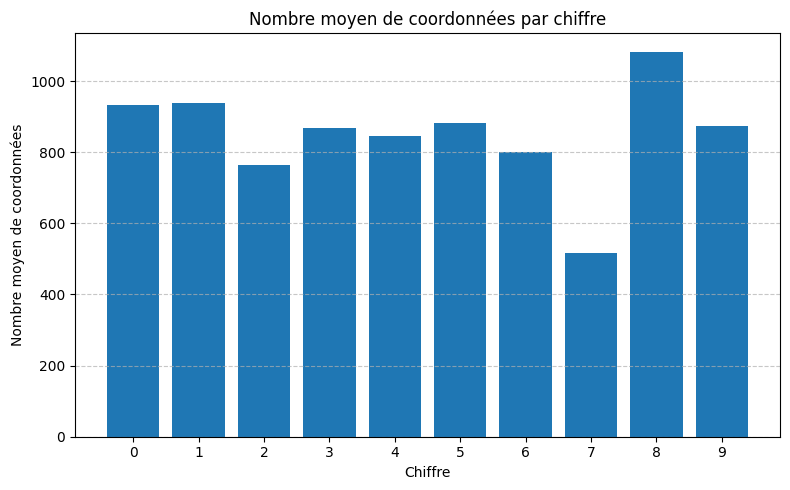

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_15808\15257165.py:59: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 1 : 98.00%

--- Test subject OUT : 2 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 2 : 81.00%

--- Test subject OUT : 3 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 3 : 99.00%

--- Test subject OUT : 4 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 4 : 100.00%

--- Test subject OUT : 5 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 5 : 95.00%

--- Test subject OUT : 6 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 6 : 98.00%

--- Test subject OUT : 7 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 7 : 91.00%

--- Test subject OUT : 8 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 8 : 99.00%

--- Test subject OUT : 9 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 9 : 100.00%

--- Test subject OUT : 10 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 10 : 96.00%

Exactitude globale LSTM : 95.70%


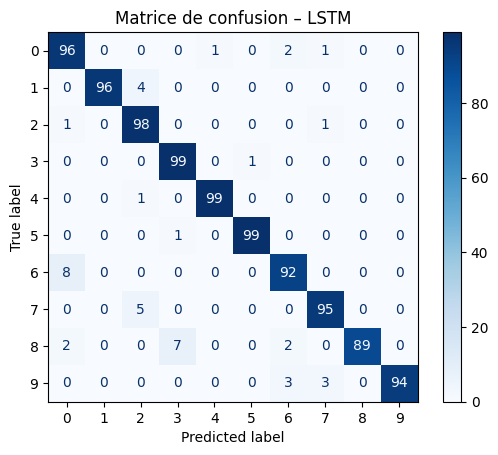

In [2]:
import pandas as pd
import numpy as np
from collections import defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import models, layers

# ------------------------
# Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)

# ------------------------
# Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# ------------------------
# Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)

# ------------------------
# Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ------------------------
# Création train/test user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test

# ------------------------
# LSTM Model
# ------------------------
def create_lstm_model(input_shape, num_classes):
    model = models.Sequential([
        layers.LSTM(256, return_sequences=True, dropout=0.2, input_shape=input_shape),
        layers.LSTM(256, dropout=0.3),
        layers.Dense(64, activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# ------------------------
# Test du modèle LSTM
# ------------------------
def test_lstm_user_independent(df, loop_range=10, epochs=50, batch_size=16):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")
        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        model = create_lstm_model(input_shape=(X_train.shape[1], X_train.shape[2]), num_classes=len(np.unique(y_train)))
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale LSTM : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – LSTM")
    plt.show()

# ------------------------
# Lancer le test
# ------------------------
test_lstm_user_independent(df100)

# 256 256 64 batch 64

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_15808\4072776423.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


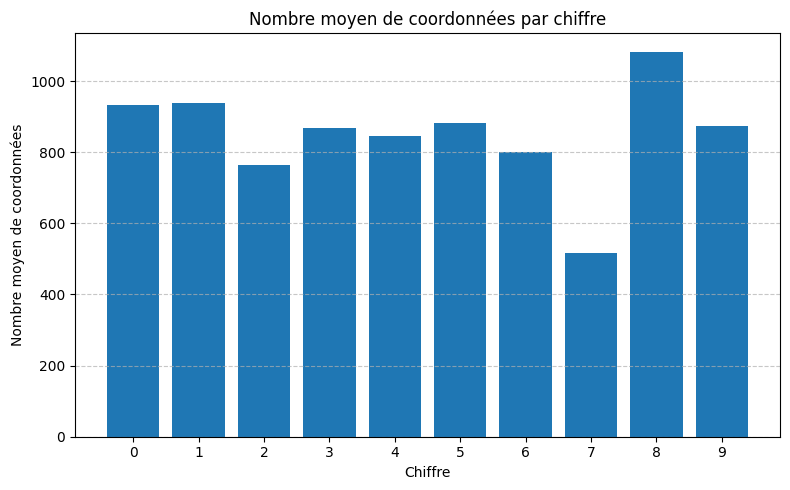

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_15808\4072776423.py:59: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 1 : 96.00%

--- Test subject OUT : 2 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 2 : 86.00%

--- Test subject OUT : 3 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 3 : 97.00%

--- Test subject OUT : 4 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 4 : 100.00%

--- Test subject OUT : 5 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 5 : 97.00%

--- Test subject OUT : 6 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 6 : 89.00%

--- Test subject OUT : 7 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 7 : 95.00%

--- Test subject OUT : 8 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 8 : 100.00%

--- Test subject OUT : 9 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 9 : 100.00%

--- Test subject OUT : 10 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 10 : 96.00%

Exactitude globale LSTM : 95.60%


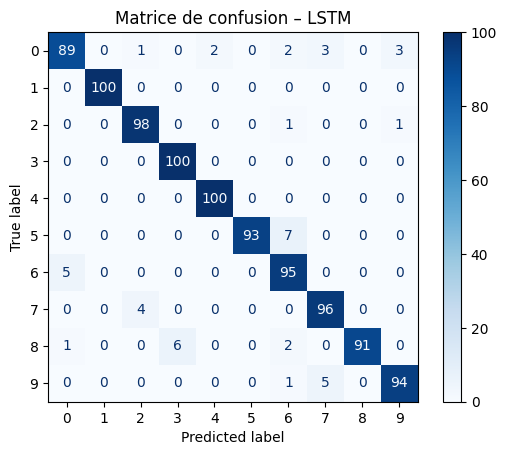

In [3]:
import pandas as pd
import numpy as np
from collections import defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import models, layers

# ------------------------
# Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)

# ------------------------
# Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# ------------------------
# Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)

# ------------------------
# Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ------------------------
# Création train/test user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test

# ------------------------
# LSTM Model
# ------------------------
def create_lstm_model(input_shape, num_classes):
    model = models.Sequential([
        layers.LSTM(256, return_sequences=True, dropout=0.2, input_shape=input_shape),
        layers.LSTM(256, dropout=0.3),
        layers.Dense(64, activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# ------------------------
# Test du modèle LSTM
# ------------------------
def test_lstm_user_independent(df, loop_range=10, epochs=50, batch_size=64):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")
        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        model = create_lstm_model(input_shape=(X_train.shape[1], X_train.shape[2]), num_classes=len(np.unique(y_train)))
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale LSTM : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – LSTM")
    plt.show()

# ------------------------
# Lancer le test
# ------------------------
test_lstm_user_independent(df100)

#64 64 64 64

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_20260\3296451049.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


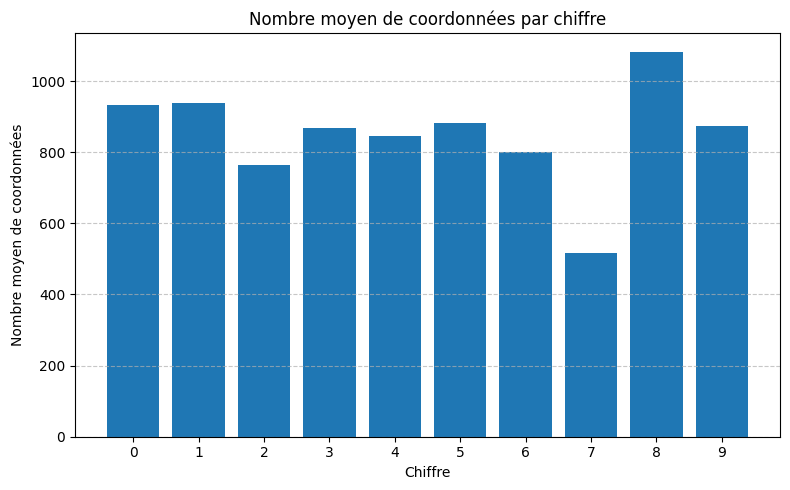

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_20260\3296451049.py:59: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 1 : 98.00%

--- Test subject OUT : 2 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 2 : 84.00%

--- Test subject OUT : 3 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 3 : 96.00%

--- Test subject OUT : 4 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 4 : 100.00%

--- Test subject OUT : 5 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 5 : 87.00%

--- Test subject OUT : 6 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 6 : 95.00%

--- Test subject OUT : 7 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 7 : 87.00%

--- Test subject OUT : 8 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 8 : 100.00%

--- Test subject OUT : 9 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 9 : 99.00%

--- Test subject OUT : 10 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 10 : 80.00%

Exactitude globale LSTM : 92.60%


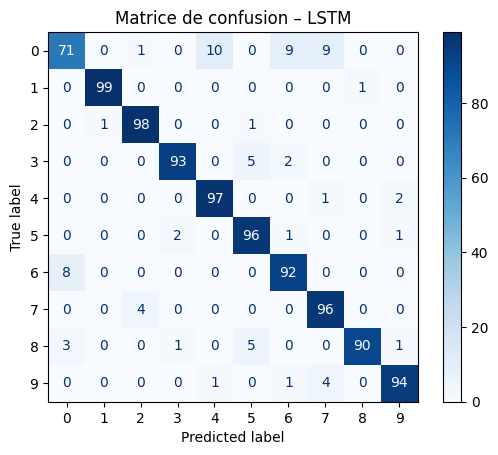

In [1]:
import pandas as pd
import numpy as np
from collections import defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import models, layers

# ------------------------
# Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)

# ------------------------
# Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# ------------------------
# Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)

# ------------------------
# Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ------------------------
# Création train/test user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test

# ------------------------
# LSTM Model
# ------------------------
def create_lstm_model(input_shape, num_classes):
    model = models.Sequential([
        layers.LSTM(64, return_sequences=True, dropout=0.2, input_shape=input_shape),
        layers.LSTM(64, dropout=0.3),
        layers.Dense(64, activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# ------------------------
# Test du modèle LSTM
# ------------------------
def test_lstm_user_independent(df, loop_range=10, epochs=50, batch_size=64):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")
        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        model = create_lstm_model(input_shape=(X_train.shape[1], X_train.shape[2]), num_classes=len(np.unique(y_train)))
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale LSTM : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – LSTM")
    plt.show()

# ------------------------
# Lancer le test
# ------------------------
test_lstm_user_independent(df100)

# 64 64 64 16

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_3384\2456353486.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


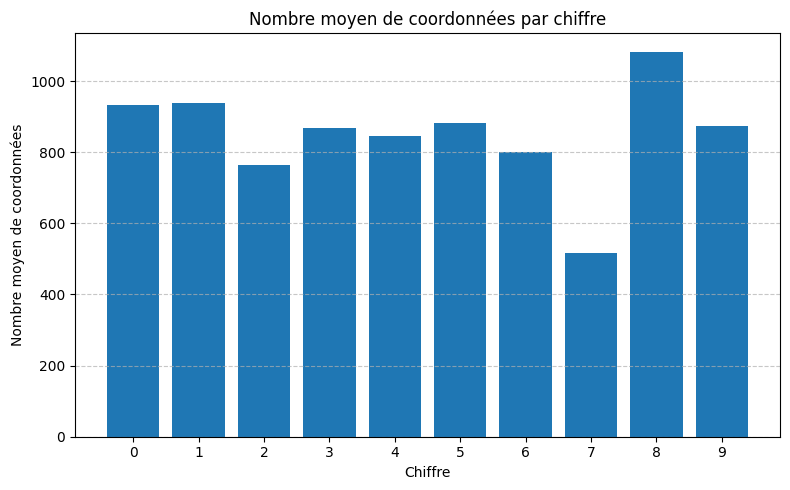

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_3384\2456353486.py:59: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 1 : 90.00%

--- Test subject OUT : 2 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 2 : 62.00%

--- Test subject OUT : 3 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 3 : 97.00%

--- Test subject OUT : 4 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 4 : 100.00%

--- Test subject OUT : 5 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 5 : 96.00%

--- Test subject OUT : 6 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 6 : 97.00%

--- Test subject OUT : 7 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 7 : 93.00%

--- Test subject OUT : 8 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 8 : 96.00%

--- Test subject OUT : 9 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 9 : 100.00%

--- Test subject OUT : 10 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 10 : 83.00%

Exactitude globale LSTM : 91.40%


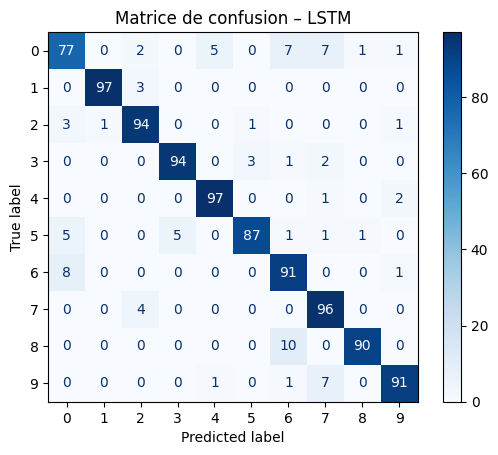

In [1]:
import pandas as pd
import numpy as np
from collections import defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import models, layers

# ------------------------
# Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)

# ------------------------
# Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# ------------------------
# Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)

# ------------------------
# Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ------------------------
# Création train/test user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test

# ------------------------
# LSTM Model
# ------------------------
def create_lstm_model(input_shape, num_classes):
    model = models.Sequential([
        layers.LSTM(64, return_sequences=True, dropout=0.2, input_shape=input_shape),
        layers.LSTM(64, dropout=0.3),
        layers.Dense(64, activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# ------------------------
# Test du modèle LSTM
# ------------------------
def test_lstm_user_independent(df, loop_range=10, epochs=50, batch_size=16):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")
        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        model = create_lstm_model(input_shape=(X_train.shape[1], X_train.shape[2]), num_classes=len(np.unique(y_train)))
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale LSTM : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – LSTM")
    plt.show()

# ------------------------
# Lancer le test
# ------------------------
test_lstm_user_independent(df100)

#64 64 64 32 25

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_3384\2570997452.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


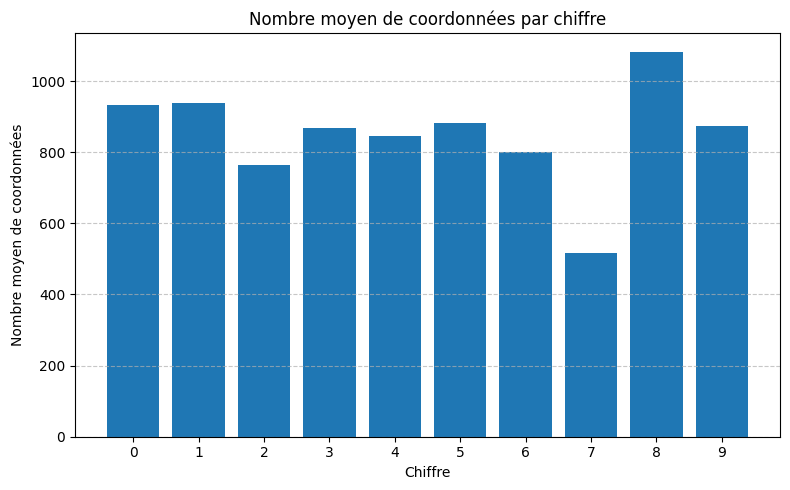

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_3384\2570997452.py:59: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 1 : 97.00%

--- Test subject OUT : 2 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 2 : 82.00%

--- Test subject OUT : 3 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 3 : 97.00%

--- Test subject OUT : 4 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 4 : 100.00%

--- Test subject OUT : 5 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 5 : 93.00%

--- Test subject OUT : 6 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 6 : 93.00%

--- Test subject OUT : 7 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 7 : 80.00%

--- Test subject OUT : 8 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 8 : 98.00%

--- Test subject OUT : 9 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 9 : 100.00%

--- Test subject OUT : 10 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 10 : 89.00%

Exactitude globale LSTM : 92.90%


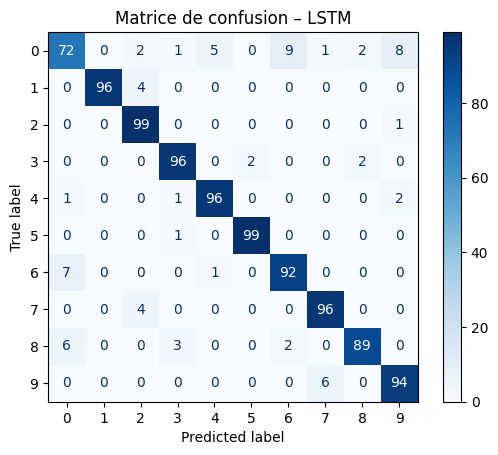

In [2]:
import pandas as pd
import numpy as np
from collections import defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import models, layers

# ------------------------
# Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)

# ------------------------
# Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# ------------------------
# Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)

# ------------------------
# Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ------------------------
# Création train/test user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test

# ------------------------
# LSTM Model
# ------------------------
def create_lstm_model(input_shape, num_classes):
    model = models.Sequential([
        layers.LSTM(64, return_sequences=True, dropout=0.2, input_shape=input_shape),
        layers.LSTM(64, dropout=0.3),
        layers.Dense(64, activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# ------------------------
# Test du modèle LSTM
# ------------------------
def test_lstm_user_independent(df, loop_range=10, epochs=25, batch_size=32):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")
        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        model = create_lstm_model(input_shape=(X_train.shape[1], X_train.shape[2]), num_classes=len(np.unique(y_train)))
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale LSTM : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – LSTM")
    plt.show()

# ------------------------
# Lancer le test
# ------------------------
test_lstm_user_independent(df100)

# 64 64 64 32 75 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_3384\479006888.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


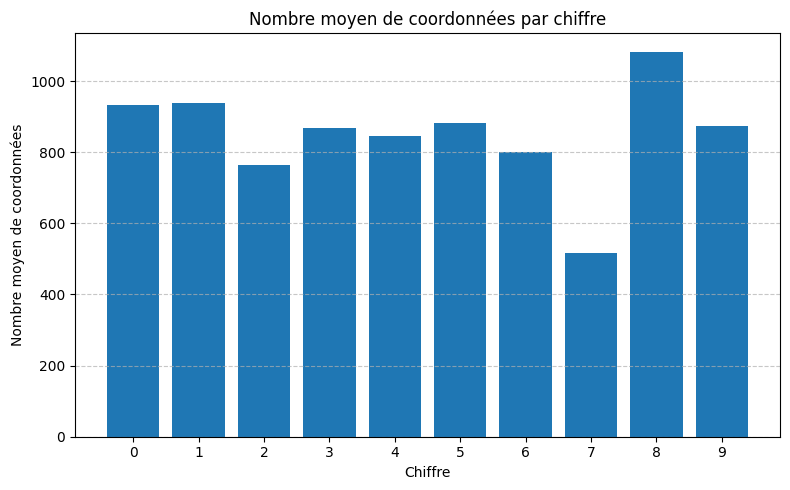

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_3384\479006888.py:59: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 1 : 99.00%

--- Test subject OUT : 2 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 2 : 81.00%

--- Test subject OUT : 3 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 3 : 94.00%

--- Test subject OUT : 4 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 4 : 100.00%

--- Test subject OUT : 5 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 5 : 93.00%

--- Test subject OUT : 6 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 6 : 96.00%

--- Test subject OUT : 7 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 7 : 90.00%

--- Test subject OUT : 8 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 8 : 98.00%

--- Test subject OUT : 9 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 9 : 100.00%

--- Test subject OUT : 10 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 10 : 87.00%

Exactitude globale LSTM : 93.80%


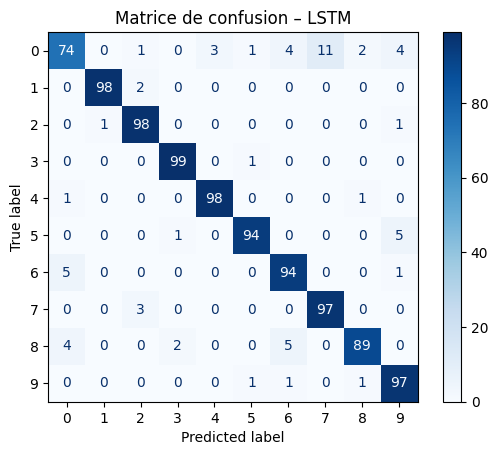

In [3]:
import pandas as pd
import numpy as np
from collections import defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import models, layers

# ------------------------
# Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)

# ------------------------
# Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# ------------------------
# Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)

# ------------------------
# Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ------------------------
# Création train/test user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test

# ------------------------
# LSTM Model
# ------------------------
def create_lstm_model(input_shape, num_classes):
    model = models.Sequential([
        layers.LSTM(64, return_sequences=True, dropout=0.2, input_shape=input_shape),
        layers.LSTM(64, dropout=0.3),
        layers.Dense(64, activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# ------------------------
# Test du modèle LSTM
# ------------------------
def test_lstm_user_independent(df, loop_range=10, epochs=75, batch_size=32):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")
        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        model = create_lstm_model(input_shape=(X_train.shape[1], X_train.shape[2]), num_classes=len(np.unique(y_train)))
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale LSTM : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – LSTM")
    plt.show()

# ------------------------
# Lancer le test
# ------------------------
test_lstm_user_independent(df100)

# 128 128 32 32 25 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_3384\2858677232.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


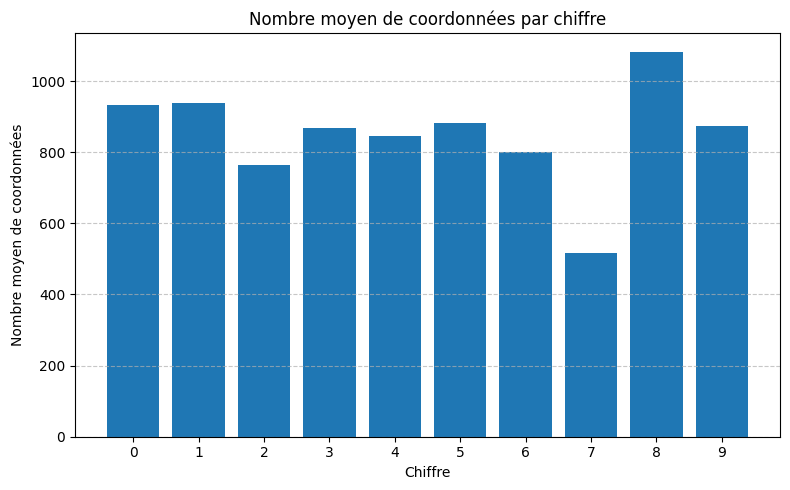

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_3384\2858677232.py:59: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 1 : 92.00%

--- Test subject OUT : 2 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 2 : 82.00%

--- Test subject OUT : 3 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 3 : 98.00%

--- Test subject OUT : 4 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 4 : 100.00%

--- Test subject OUT : 5 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 5 : 93.00%

--- Test subject OUT : 6 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 6 : 91.00%

--- Test subject OUT : 7 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 7 : 95.00%

--- Test subject OUT : 8 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 8 : 99.00%

--- Test subject OUT : 9 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 9 : 100.00%

--- Test subject OUT : 10 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 10 : 90.00%

Exactitude globale LSTM : 94.00%


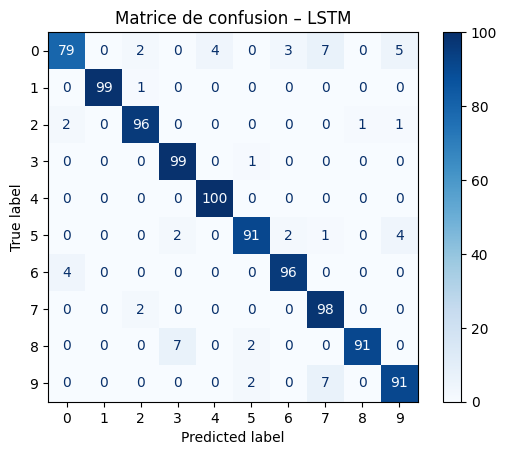

In [4]:
import pandas as pd
import numpy as np
from collections import defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import models, layers

# ------------------------
# Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)

# ------------------------
# Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# ------------------------
# Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)

# ------------------------
# Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ------------------------
# Création train/test user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test

# ------------------------
# LSTM Model
# ------------------------
def create_lstm_model(input_shape, num_classes):
    model = models.Sequential([
        layers.LSTM(128, return_sequences=True, dropout=0.2, input_shape=input_shape),
        layers.LSTM(128, dropout=0.3),
        layers.Dense(32, activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# ------------------------
# Test du modèle LSTM
# ------------------------
def test_lstm_user_independent(df, loop_range=10, epochs=25, batch_size=32):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")
        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        model = create_lstm_model(input_shape=(X_train.shape[1], X_train.shape[2]), num_classes=len(np.unique(y_train)))
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale LSTM : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – LSTM")
    plt.show()

# ------------------------
# Lancer le test
# ------------------------
test_lstm_user_independent(df100)

# 128 128 32 32 75

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_19508\64284358.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


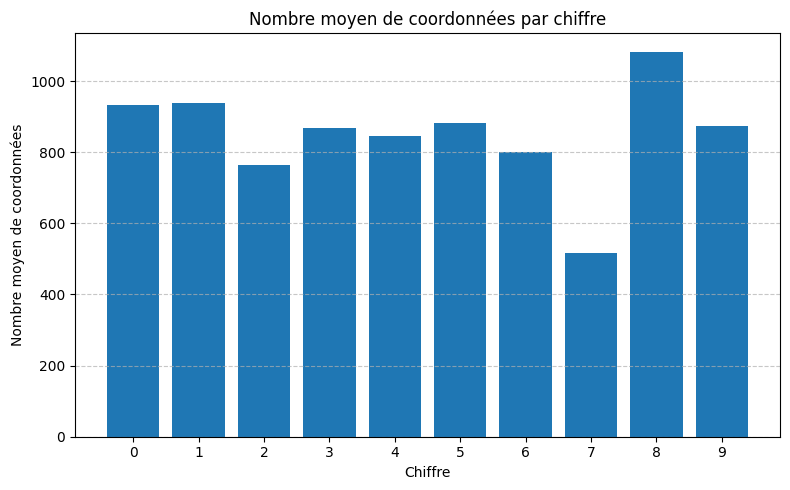

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_19508\64284358.py:59: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 1 : 89.00%

--- Test subject OUT : 2 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 2 : 86.00%

--- Test subject OUT : 3 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 3 : 100.00%

--- Test subject OUT : 4 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 4 : 95.00%

--- Test subject OUT : 5 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 5 : 90.00%

--- Test subject OUT : 6 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 6 : 98.00%

--- Test subject OUT : 7 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 7 : 88.00%

--- Test subject OUT : 8 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 8 : 97.00%

--- Test subject OUT : 9 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 9 : 99.00%

--- Test subject OUT : 10 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 10 : 87.00%

Exactitude globale LSTM : 92.90%


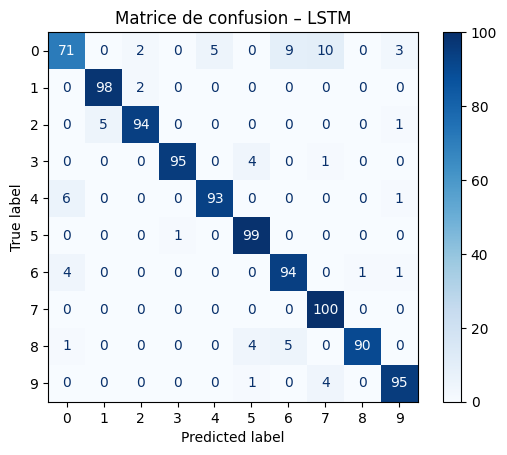

In [1]:
import pandas as pd
import numpy as np
from collections import defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import models, layers

# ------------------------
# Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)

# ------------------------
# Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# ------------------------
# Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)

# ------------------------
# Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ------------------------
# Création train/test user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test

# ------------------------
# LSTM Model
# ------------------------
def create_lstm_model(input_shape, num_classes):
    model = models.Sequential([
        layers.LSTM(128, return_sequences=True, dropout=0.2, input_shape=input_shape),
        layers.LSTM(128, dropout=0.3),
        layers.Dense(32, activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# ------------------------
# Test du modèle LSTM
# ------------------------
def test_lstm_user_independent(df, loop_range=10, epochs=75, batch_size=32):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")
        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        model = create_lstm_model(input_shape=(X_train.shape[1], X_train.shape[2]), num_classes=len(np.unique(y_train)))
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale LSTM : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – LSTM")
    plt.show()

# ------------------------
# Lancer le test
# ------------------------
test_lstm_user_independent(df100)

#256 256 64 32 25

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_19508\2458763616.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


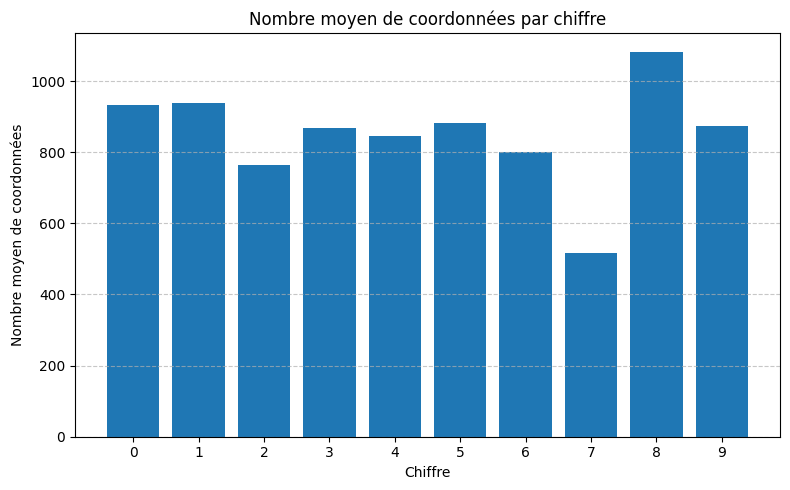

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_19508\2458763616.py:59: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 1 : 93.00%

--- Test subject OUT : 2 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 2 : 81.00%

--- Test subject OUT : 3 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 3 : 87.00%

--- Test subject OUT : 4 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 4 : 100.00%

--- Test subject OUT : 5 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 5 : 96.00%

--- Test subject OUT : 6 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 6 : 97.00%

--- Test subject OUT : 7 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 7 : 90.00%

--- Test subject OUT : 8 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 8 : 97.00%

--- Test subject OUT : 9 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 9 : 90.00%

--- Test subject OUT : 10 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 10 : 89.00%

Exactitude globale LSTM : 92.00%


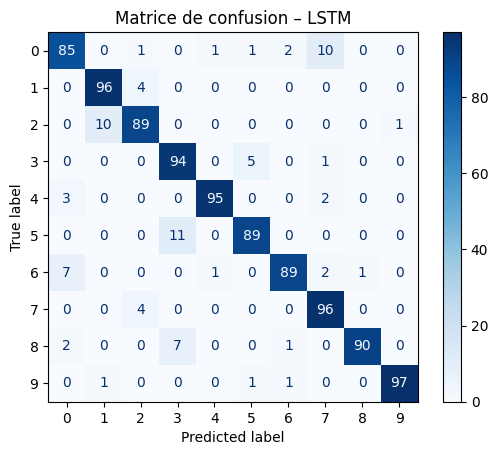

In [2]:
import pandas as pd
import numpy as np
from collections import defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import models, layers

# ------------------------
# Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)

# ------------------------
# Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# ------------------------
# Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)

# ------------------------
# Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ------------------------
# Création train/test user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test

# ------------------------
# LSTM Model
# ------------------------
def create_lstm_model(input_shape, num_classes):
    model = models.Sequential([
        layers.LSTM(256, return_sequences=True, dropout=0.2, input_shape=input_shape),
        layers.LSTM(256, dropout=0.3),
        layers.Dense(64, activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# ------------------------
# Test du modèle LSTM
# ------------------------
def test_lstm_user_independent(df, loop_range=10, epochs=25, batch_size=32):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")
        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        model = create_lstm_model(input_shape=(X_train.shape[1], X_train.shape[2]), num_classes=len(np.unique(y_train)))
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale LSTM : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – LSTM")
    plt.show()

# ------------------------
# Lancer le test
# ------------------------
test_lstm_user_independent(df100)

#256 256 64 32 75

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_19508\2062396124.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


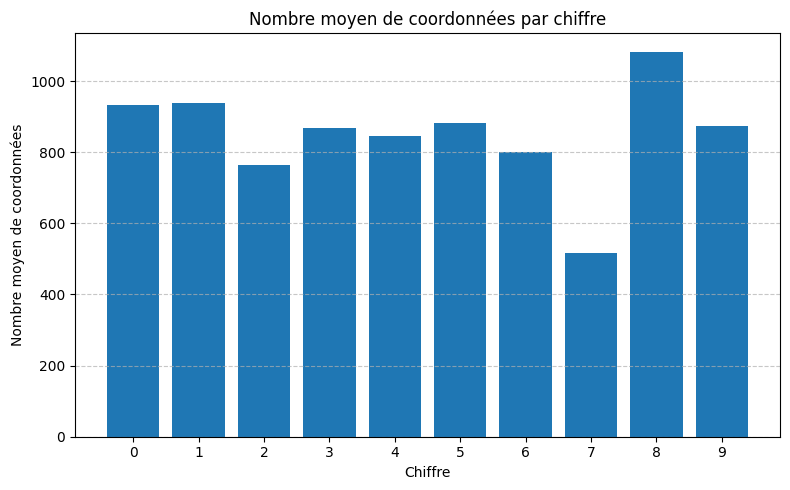

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_19508\2062396124.py:59: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 1 : 96.00%

--- Test subject OUT : 2 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 2 : 87.00%

--- Test subject OUT : 3 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 3 : 98.00%

--- Test subject OUT : 4 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 4 : 100.00%

--- Test subject OUT : 5 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 5 : 91.00%

--- Test subject OUT : 6 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 6 : 99.00%

--- Test subject OUT : 7 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 7 : 93.00%

--- Test subject OUT : 8 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 8 : 98.00%

--- Test subject OUT : 9 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 9 : 100.00%

--- Test subject OUT : 10 ---


\\student.fucam.ac.be\users$\isadiki\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Exactitude subject 10 : 89.00%

Exactitude globale LSTM : 95.10%


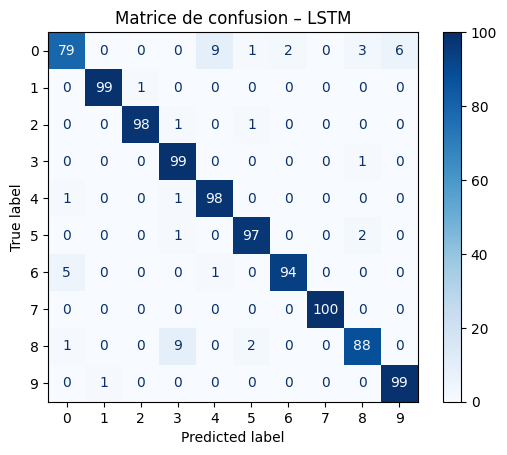

In [3]:
import pandas as pd
import numpy as np
from collections import defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import models, layers

# ------------------------
# Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)

# ------------------------
# Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# ------------------------
# Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)

# ------------------------
# Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)

# ------------------------
# Création train/test user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test

# ------------------------
# LSTM Model
# ------------------------
def create_lstm_model(input_shape, num_classes):
    model = models.Sequential([
        layers.LSTM(256, return_sequences=True, dropout=0.2, input_shape=input_shape),
        layers.LSTM(256, dropout=0.3),
        layers.Dense(64, activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# ------------------------
# Test du modèle LSTM
# ------------------------
def test_lstm_user_independent(df, loop_range=10, epochs=75, batch_size=32):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")
        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        model = create_lstm_model(input_shape=(X_train.shape[1], X_train.shape[2]), num_classes=len(np.unique(y_train)))
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale LSTM : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – LSTM")
    plt.show()

# ------------------------
# Lancer le test
# ------------------------
test_lstm_user_independent(df100)

# traofrmer encodr only 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_18460\373619361.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file], ignore_index=True)


Taille du DataFrame chargé : (85095, 7)


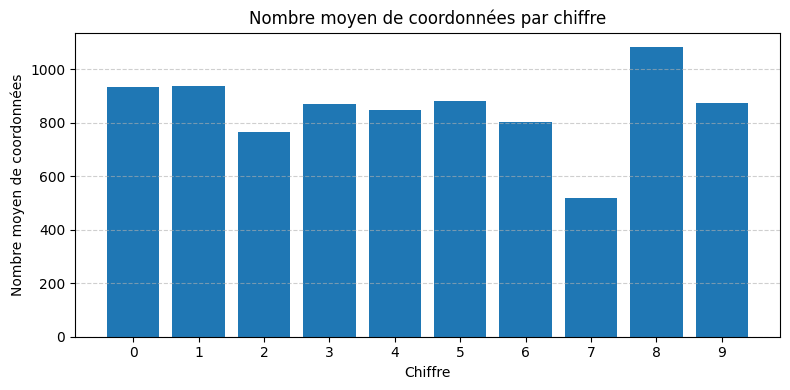

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_18460\373619361.py:79: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture).reset_index(drop=True)


Standardisation terminée.
Resampling terminé. df100 shape: (100000, 6)

--- Test subject OUT : 1 ---



OperatorNotAllowedInGraphError: Exception encountered when calling PositionalEncoding.call().

[1mCould not automatically infer the output shape / dtype of 'positional_encoding' (of type PositionalEncoding). Either the `PositionalEncoding.call()` method is incorrect, or you need to implement the `PositionalEncoding.compute_output_spec() / compute_output_shape()` method. Error encountered:

Using a symbolic `tf.Tensor` as a Python `bool` is not allowed. You can attempt the following resolutions to the problem: If you are running in Graph mode, use Eager execution mode or decorate this function with @tf.function. If you are using AutoGraph, you can try decorating this function with @tf.function. If that does not work, then you may be using an unsupported feature or your source code may not be visible to AutoGraph. See https://github.com/tensorflow/tensorflow/blob/master/tensorflow/python/autograph/g3doc/reference/limitations.md#access-to-source-code for more information.[0m

Arguments received by PositionalEncoding.call():
  • args=('<KerasTensor shape=(None, 100, 128), dtype=float32, sparse=False, ragged=False, name=keras_tensor_1>',)
  • kwargs=<class 'inspect._empty'>

In [1]:
import os
import numpy as np
import pandas as pd
from collections import defaultdict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
import tensorflow as tf
from tensorflow.keras import layers, models
import random

# ------------------------
# Réglages reproductibilité
# ------------------------
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)
random.seed(SEED)
os.environ['PYTHONHASHSEED'] = str(SEED)

# ------------------------
# Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):           # Subjects 1..10
    for number in range(0, 10):       # Gestures 0..9
        for iteration in range(1, 11):# Iterations 1..10
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            if not os.path.exists(filename):
                # si fichier manquant, on ignore et continue (pratique pour debug)
                print(f"Fichier manquant, skip: {filename}")
                continue
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file], ignore_index=True)

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print("Taille du DataFrame chargé :", df.shape)

# ------------------------
# Analyse exploratoire (rapide)
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 4))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")

# ------------------------
# Standardisation par séquence (subject, gesture, iter)
# ------------------------
def standardize_gesture(df_group):
    dfg = df_group.copy()
    for axis in ['x', 'y', 'z']:
        std = dfg[axis].std()
        if std == 0 or np.isnan(std):
            dfg[f'{axis}_std'] = 0.0
        else:
            dfg[f'{axis}_std'] = (dfg[axis] - dfg[axis].mean()) / std
    return dfg

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture).reset_index(drop=True)
df.to_csv('df_standardized.csv', index=False)
print("Standardisation terminée.")

# ------------------------
# Resampling à longueur fixe (target_len)
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        group = group.sort_values(by='t').reset_index(drop=True)
        n = len(group)
        if n < 2:
            # si seulement 1 frame, on duplique
            arr = np.repeat(group[['x_std', 'y_std', 'z_std']].values, target_len, axis=0)[:target_len]
            resampled_data.append(pd.DataFrame({
                'gesture': [gesture] * target_len,
                'subject': [subject] * target_len,
                'iter': [iteration] * target_len,
                'x_std': arr[:,0],
                'y_std': arr[:,1],
                'z_std': arr[:,2]
            }))
            continue

        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)

        def interp(col):
            f = interp1d(original_idx, group[col].values, kind='linear')
            return f(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

TARGET_LEN = 100
df100 = resample_gesture(df, target_len=TARGET_LEN)
print("Resampling terminé. df100 shape:", df100.shape)

# ------------------------
# Fonctions utilitaires pour split user-independent
# ------------------------
def df_to_array(df_in):
    X, y = [], []
    for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
        arr = group[['x_std', 'y_std', 'z_std']].values
        X.append(arr)
        y.append(gesture)
    return np.array(X), np.array(y)

def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]
    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test

# ------------------------
# Positional Encoding (sinusoidal)
# ------------------------
def get_positional_encoding(seq_len, d_model):
    """
    Retourne un tensor shape (seq_len, d_model) de positional encodings (sinusoidal)
    """
    position = np.arange(seq_len)[:, np.newaxis]          # (seq_len, 1)
    div_term = np.exp(np.arange(0, d_model, 2) * -(np.log(10000.0) / d_model))  # (d_model/2,)
    pe = np.zeros((seq_len, d_model), dtype=np.float32)
    pe[:, 0::2] = np.sin(position * div_term)
    pe[:, 1::2] = np.cos(position * div_term)
    return tf.convert_to_tensor(pe)  # tf.Tensor

class PositionalEncoding(layers.Layer):
    def __init__(self, seq_len, d_model, **kwargs):
        super().__init__(**kwargs)
        self.seq_len = seq_len
        self.d_model = d_model
        # precompute pe as constant
        pe = get_positional_encoding(seq_len, d_model)
        self.pe = tf.Variable(pe, trainable=False, name="positional_encoding")

    def call(self, x):
        # x shape: (batch, seq_len, d_model)
        seq_len = tf.shape(x)[1]
        if seq_len != self.seq_len:
            # si la séquence a changé, calcule dynamiquement (rare ici car on fixe TARGET_LEN)
            pe = get_positional_encoding(seq_len, self.d_model)
            return x + pe[None, :, :]
        return x + self.pe[None, :seq_len, :]

# ------------------------
# Création du modèle Transformer
# ------------------------
def create_transformer_model(input_shape, num_classes, d_model=128, num_heads=4, ff_dim=256, num_layers=2, seq_len=TARGET_LEN):
    """
    input_shape: (seq_len, num_features)
    """
    inputs = layers.Input(shape=input_shape)  # (seq_len, features)
    # embedding linéaire des features -> d_model
    x = layers.Dense(d_model)(inputs)         # (batch, seq_len, d_model)

    # positional encoding
    x = PositionalEncoding(seq_len, d_model)(x)

    # encoder blocks
    for _ in range(num_layers):
        # Multi-head attention (self-attention)
        attn_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=d_model // num_heads)(x, x)
        attn_output = layers.Dropout(0.1)(attn_output)
        x = layers.LayerNormalization(epsilon=1e-6)(x + attn_output)

        # Feed-forward
        ffn = layers.Dense(ff_dim, activation='relu')(x)
        ffn = layers.Dense(d_model)(ffn)
        ffn = layers.Dropout(0.1)(ffn)
        x = layers.LayerNormalization(epsilon=1e-6)(x + ffn)

    # pooling global (mean pooling)
    x = layers.GlobalAveragePooling1D()(x)

    # tête de classification
    x = layers.Dense(64, activation='relu')(x)
    x = layers.Dropout(0.2)(x)
    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# ------------------------
# Test Transformer user-independent (leave-one-subject-out)
# ------------------------
def test_transformer_user_independent(df, loop_range=10, epochs=40, batch_size=32, verbose_fit=0):
    total_true, total_pred = [], []

    # determine num_classes from whole dataset
    all_gestures = df['gesture'].unique()
    n_classes = len(all_gestures)

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")
        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        if len(X_test) == 0 or len(X_train) == 0:
            print(f"Aucun échantillon pour subject {subj_out}, skip.")
            continue

        # vérifier shapes
        # X_train shape (n_samples, seq_len, num_features)
        input_shape = (X_train.shape[1], X_train.shape[2])
        model = create_transformer_model(input_shape=input_shape, num_classes=n_classes, seq_len=input_shape[0])

        # training
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=verbose_fit)

        # prediction
        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test.tolist())
        total_pred.extend(y_pred.tolist())

    if len(total_true) == 0:
        print("Aucune prédiction globale (données manquantes).")
        return

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale Transformer : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred, labels=np.arange(n_classes))
    disp = ConfusionMatrixDisplay(cm, display_labels=np.arange(n_classes))
    disp.plot(cmap="Blues", xticks_rotation='vertical')
    plt.title("Matrice de confusion – Transformer")
    plt.tight_layout()
    plt.show()

# ------------------------
# Lancer le test Transformer
# ------------------------
# Remarque: réduit epochs si tu veux des tests plus rapides (ex: epochs=15)
test_transformer_user_independent(df100, loop_range=10, epochs=50, batch_size=32, verbose_fit=1)

# test chat Encoder-only 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_18460\850610002.py:23: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


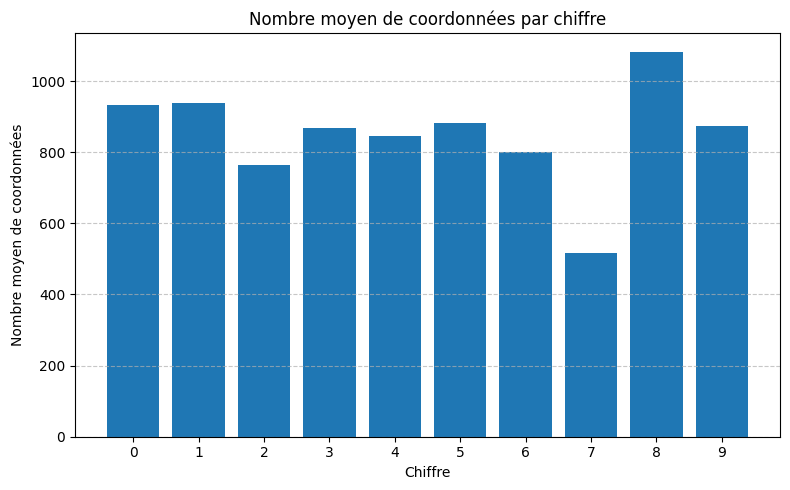

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_18460\850610002.py:62: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---
Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 12s 110ms/step - accuracy: 0.1200 - loss: 2.3821
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - accuracy: 0.6111 - loss: 1.1519
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 110ms/step - accuracy: 0.9022 - loss: 0.3107
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 112ms/step - accuracy: 0.9100 - loss: 0.2468
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 109ms/step - accuracy: 0.9500 - loss: 0.1641
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 109ms/step - accuracy: 0.9511 - loss: 0.1598
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - accuracy: 0.9767 - loss: 0.0740
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - accuracy: 0.9811 - loss: 0.0720
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 114ms/step - accuracy: 0.9867 - loss: 0.0369
Epoch 10/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 112ms/step - accuracy: 0.9733 - loss: 0.0734
Epoch 11/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 109ms/step - accuracy: 0.9867 - loss: 0.0510
Epoch 12/50
29/29 ━━━

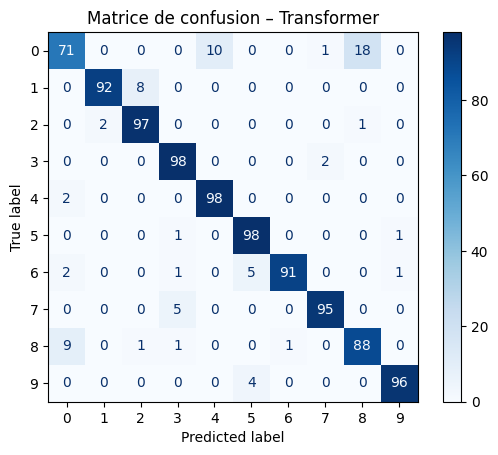

In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import layers, models
import tensorflow as tf

# ordre de test : 1) d_model → tester 64, 128, 256. , 2) num_heads → 2, 4, 8.,3) , num_layers →  2, 3,4 ,4)dff → 128, 256, 512. ,5)Dense final hidden → 64, 128, 256.
#6) batch_size → 16, 32, 64 (si GPU limité).

# onsirpation de :https://github.com/gyselph/transformer-sequence-classification?
# est un model esupervise comme lstm mais pas dtw edti distanc eetc et traite le signale en entier et pas frame par frame 
# ------------------------
# 1. Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


# ------------------------
# 2. Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")


# ------------------------
# 3. Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


# ------------------------
# 4. Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


# ------------------------
# 5. Split user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test


# -------------------------------------------------------
# 6. POSITONAL ENCODING (VERSION 100% COMPATIBLE TF2)
# -------------------------------------------------------
class PositionalEncoding(layers.Layer):
    def __init__(self, max_len, d_model):
        super().__init__()
        self.max_len = max_len
        self.d_model = d_model

        # Pré-calcul numpy -> constant TensorFlow
        pos = np.arange(max_len)[:, np.newaxis]
        i = np.arange(d_model)[np.newaxis, :]
        angle_rates = 1 / np.power(10000, (2 * (i // 2)) / np.float32(d_model))

        angle_rads = pos * angle_rates

        pe = np.zeros((max_len, d_model))
        pe[:, 0::2] = np.sin(angle_rads[:, 0::2])
        pe[:, 1::2] = np.cos(angle_rads[:, 1::2])

        self.positional_encoding = tf.constant(pe[np.newaxis, ...], dtype=tf.float32)

    def call(self, x):
        seq_len = tf.shape(x)[1]
        return x + self.positional_encoding[:, :seq_len, :]


# ------------------------
# 7. Transformer Encoder Model
# ------------------------
def transformer_encoder(x, num_heads, d_model, dff, dropout):
    attn_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=d_model)(x, x)
    attn_output = layers.Dropout(dropout)(attn_output)
    out1 = layers.LayerNormalization(epsilon=1e-6)(x + attn_output)

    ffn = models.Sequential([
        layers.Dense(dff, activation="relu"),
        layers.Dense(d_model),
    ])
    ffn_output = ffn(out1)
    ffn_output = layers.Dropout(dropout)(ffn_output)
    out2 = layers.LayerNormalization(epsilon=1e-6)(out1 + ffn_output)

    return out2


def create_transformer_model(input_shape, num_classes, seq_len=100):
    inputs = layers.Input(shape=input_shape)

    d_model = 128
    num_heads = 4
    num_layers = 2
    dff = 256
    dropout = 0.1

    x = layers.Dense(d_model)(inputs)
    x = PositionalEncoding(seq_len, d_model)(x)

    for _ in range(num_layers):
        x = transformer_encoder(x, num_heads, d_model, dff, dropout)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(128, activation='relu')(x)
    x = layers.Dropout(0.2)(x)

    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs, outputs)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    return model


# ------------------------
# 8. Test leave-one-user-out
# ------------------------
def test_transformer_user_independent(df, loop_range=10, epochs=30, batch_size=32, verbose_fit=1):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")

        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        n_classes = len(np.unique(y_train))
        input_shape = (X_train.shape[1], X_train.shape[2])

        model = create_transformer_model(input_shape=input_shape, num_classes=n_classes)

        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=verbose_fit)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale Transformer : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – Transformer")
    plt.show()


# ------------------------
# 9. Lancer le test Transformer
# ------------------------
test_transformer_user_independent(df100, loop_range=10, epochs=50, batch_size=32, verbose_fit=1)

# vrai test encoder bon regulatisaiton 0,3 , bon epoche 2 x 50 et pas 30 , augmente une chocuge de plus  chagemenr petit hyperpara 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_20196\232600669.py:27: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


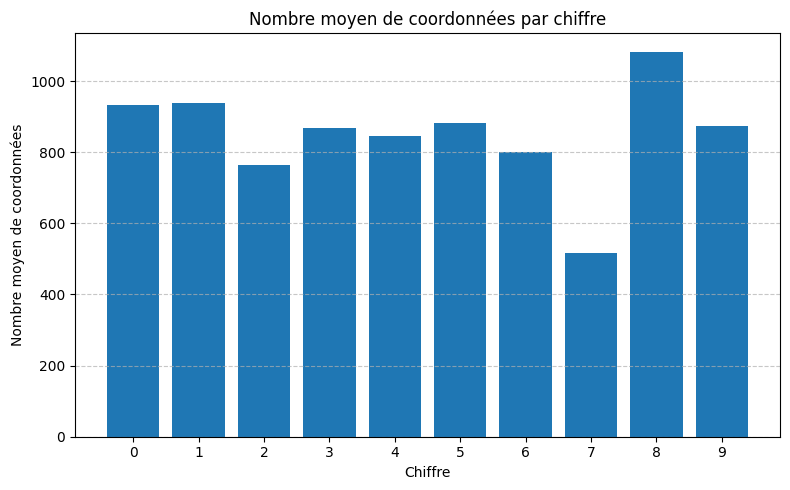

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_20196\232600669.py:66: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---

Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - accuracy: 0.1056 - loss: 2.4218
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - accuracy: 0.1178 - loss: 2.3160
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - accuracy: 0.3489 - loss: 1.6988
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - accuracy: 0.7433 - loss: 0.6802
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - accuracy: 0.8467 - loss: 0.4402
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - accuracy: 0.8711 - loss: 0.3910
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - accuracy: 0.9011 - loss: 0.2844
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 6s 195ms/step - accuracy: 0.9367 - loss: 0.1941
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 171ms/step - accuracy: 0.9222 - loss: 0.2056
Epoch 10/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 172ms/step - accuracy: 0.9367 - loss: 0.1674
Epoch 11/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 168ms/step - accuracy: 0.9578 - loss: 0.1215
Epoch 12/50
29/29 ━━

KeyboardInterrupt: 

In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import layers, models
import tensorflow as tf

# ordre de test : 1) d_model → tester 64, 128, 256. , 2) num_heads → 2, 4, 8.,3) , num_layers →  2, 3,4 ,4)dff → 128, 256, 512. ,5)Dense final hidden → 64, 128, 256.
#6) batch_size → 16, 32, 64 (si GPU limité).

# onsirpation de :https://github.com/gyselph/transformer-sequence-classification?
# est un model esupervise comme lstm mais pas dtw edti distanc eetc et traite le signale en entier et pas frame par frame 
# ------------------------
# 1. Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


# ------------------------
# 2. Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")


# ------------------------
# 3. Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


# ------------------------
# 4. Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


# ------------------------
# 5. Split user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test


# -------------------------------------------------------
# 6. POSITONAL ENCODING (VERSION 100% COMPATIBLE TF2)
# -------------------------------------------------------
class PositionalEncoding(layers.Layer):
    def __init__(self, max_len, d_model):
        super().__init__()
        self.max_len = max_len
        self.d_model = d_model

        # Pré-calcul numpy -> constant TensorFlow
        pos = np.arange(max_len)[:, np.newaxis]
        i = np.arange(d_model)[np.newaxis, :]
        angle_rates = 1 / np.power(10000, (2 * (i // 2)) / np.float32(d_model))

        angle_rads = pos * angle_rates

        pe = np.zeros((max_len, d_model))
        pe[:, 0::2] = np.sin(angle_rads[:, 0::2])
        pe[:, 1::2] = np.cos(angle_rads[:, 1::2])

        self.positional_encoding = tf.constant(pe[np.newaxis, ...], dtype=tf.float32)

    def call(self, x):
        seq_len = tf.shape(x)[1]
        return x + self.positional_encoding[:, :seq_len, :]


# ------------------------
# 7. Transformer Encoder Model
# ------------------------
def transformer_encoder(x, num_heads, d_model, dff, dropout):
    attn_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=d_model)(x, x)
    attn_output = layers.Dropout(dropout)(attn_output)
    out1 = layers.LayerNormalization(epsilon=1e-6)(x + attn_output)

    ffn = models.Sequential([
        layers.Dense(dff, activation="relu"),
        layers.Dense(d_model),
    ])
    ffn_output = ffn(out1)
    ffn_output = layers.Dropout(dropout)(ffn_output)
    out2 = layers.LayerNormalization(epsilon=1e-6)(out1 + ffn_output)

    return out2


def create_transformer_model(input_shape, num_classes, seq_len=100):
    inputs = layers.Input(shape=input_shape)

    d_model = 128
    num_heads = 4
    num_layers = 3
    dff = 256
    dropout = 0.3

    x = layers.Dense(d_model)(inputs)
    x = PositionalEncoding(seq_len, d_model)(x)

    for _ in range(num_layers):
        x = transformer_encoder(x, num_heads, d_model, dff, dropout)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(128, activation='relu')(x)
    x = layers.Dropout(0.2)(x)

    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs, outputs)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    return model


# ------------------------
# 8. Test leave-one-user-out
# ------------------------
def test_transformer_user_independent(df, loop_range=10, epochs=50, batch_size=32, verbose_fit=1):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")

        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        n_classes = len(np.unique(y_train))
        input_shape = (X_train.shape[1], X_train.shape[2])

        model = create_transformer_model(input_shape=input_shape, num_classes=n_classes)

        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=verbose_fit)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale Transformer : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – Transformer")
    plt.show()


# ------------------------
# 9. Lancer le test Transformer
# ------------------------
test_transformer_user_independent(df100, loop_range=10, epochs=50, batch_size=32, verbose_fit=1)

# utlime augmente nombre dff a 256 et dense 64 et pas 128 car 128 surapprend 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_20196\1576239199.py:27: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


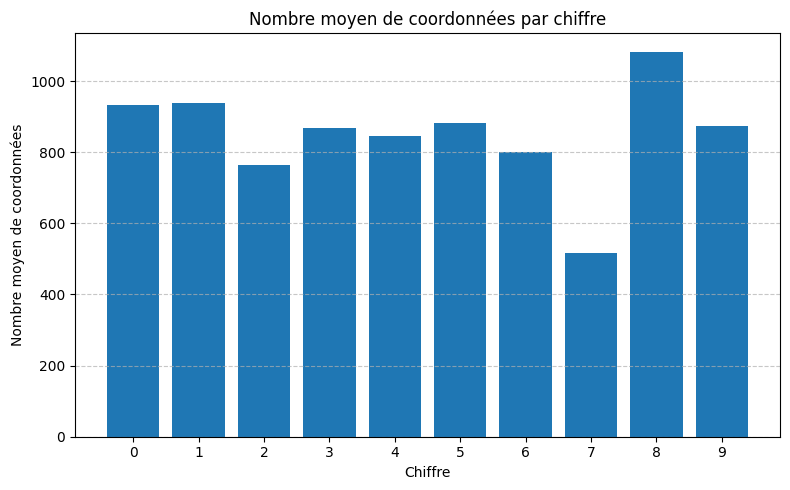

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_20196\1576239199.py:66: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---
Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 12s 313ms/step - accuracy: 0.0989 - loss: 2.4340
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 9s 315ms/step - accuracy: 0.1000 - loss: 2.3048
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 9s 317ms/step - accuracy: 0.1000 - loss: 2.3027
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 9s 321ms/step - accuracy: 0.1000 - loss: 2.3028
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 9s 320ms/step - accuracy: 0.1000 - loss: 2.3027
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 9s 325ms/step - accuracy: 0.1000 - loss: 2.3027
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 9s 325ms/step - accuracy: 0.1000 - loss: 2.3028
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 9s 320ms/step - accuracy: 0.1000 - loss: 2.3027
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 9s 326ms/step - accuracy: 0.1000 - loss: 2.3028
Epoch 10/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 9s 319ms/step - accuracy: 0.1000 - loss: 2.3027
Epoch 11/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 9s 324ms/step - accuracy: 0.1000 - loss: 2.3027
Epoch 12/50
29/29 ━━━

KeyboardInterrupt: 

In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import layers, models
import tensorflow as tf

# ordre de test : 1) d_model → tester 64, 128, 256. , 2) num_heads → 2, 4, 8.,3) , num_layers →  2, 3,4 ,4)dff → 128, 256, 512. ,5)Dense final hidden → 64, 128, 256.
#6) batch_size → 16, 32, 64 (si GPU limité).

# onsirpation de :https://github.com/gyselph/transformer-sequence-classification?
# est un model esupervise comme lstm mais pas dtw edti distanc eetc et traite le signale en entier et pas frame par frame 
# ------------------------
# 1. Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


# ------------------------
# 2. Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")


# ------------------------
# 3. Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


# ------------------------
# 4. Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


# ------------------------
# 5. Split user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test


# -------------------------------------------------------
# 6. POSITONAL ENCODING (VERSION 100% COMPATIBLE TF2)
# -------------------------------------------------------
class PositionalEncoding(layers.Layer):
    def __init__(self, max_len, d_model):
        super().__init__()
        self.max_len = max_len
        self.d_model = d_model

        # Pré-calcul numpy -> constant TensorFlow
        pos = np.arange(max_len)[:, np.newaxis]
        i = np.arange(d_model)[np.newaxis, :]
        angle_rates = 1 / np.power(10000, (2 * (i // 2)) / np.float32(d_model))

        angle_rads = pos * angle_rates

        pe = np.zeros((max_len, d_model))
        pe[:, 0::2] = np.sin(angle_rads[:, 0::2])
        pe[:, 1::2] = np.cos(angle_rads[:, 1::2])

        self.positional_encoding = tf.constant(pe[np.newaxis, ...], dtype=tf.float32)

    def call(self, x):
        seq_len = tf.shape(x)[1]
        return x + self.positional_encoding[:, :seq_len, :]


# ------------------------
# 7. Transformer Encoder Model
# ------------------------
def transformer_encoder(x, num_heads, d_model, dff, dropout):
    attn_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=d_model)(x, x)
    attn_output = layers.Dropout(dropout)(attn_output)
    out1 = layers.LayerNormalization(epsilon=1e-6)(x + attn_output)

    ffn = models.Sequential([
        layers.Dense(dff, activation="relu"),
        layers.Dense(d_model),
    ])
    ffn_output = ffn(out1)
    ffn_output = layers.Dropout(dropout)(ffn_output)
    out2 = layers.LayerNormalization(epsilon=1e-6)(out1 + ffn_output)

    return out2


def create_transformer_model(input_shape, num_classes, seq_len=100):
    inputs = layers.Input(shape=input_shape)

    d_model = 256
    num_heads = 4
    num_layers = 2
    dff = 256
    dropout = 0.3

    x = layers.Dense(d_model)(inputs)
    x = PositionalEncoding(seq_len, d_model)(x)

    for _ in range(num_layers):
        x = transformer_encoder(x, num_heads, d_model, dff, dropout)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(64, activation='relu')(x)
    x = layers.Dropout(0.2)(x)

    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs, outputs)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    return model


# ------------------------
# 8. Test leave-one-user-out
# ------------------------
def test_transformer_user_independent(df, loop_range=10, epochs=50, batch_size=32, verbose_fit=1):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")

        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        n_classes = len(np.unique(y_train))
        input_shape = (X_train.shape[1], X_train.shape[2])

        model = create_transformer_model(input_shape=input_shape, num_classes=n_classes)

        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=verbose_fit)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale Transformer : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – Transformer")
    plt.show()


# ------------------------
# 9. Lancer le test Transformer
# ------------------------
test_transformer_user_independent(df100, loop_range=10, epochs=50, batch_size=32, verbose_fit=1)

# petit modif pour comprendr e desn eviter surapprend donc comme lstm mettre tout 128 et dense 32 et pas 128 


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_17660\2532005760.py:27: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


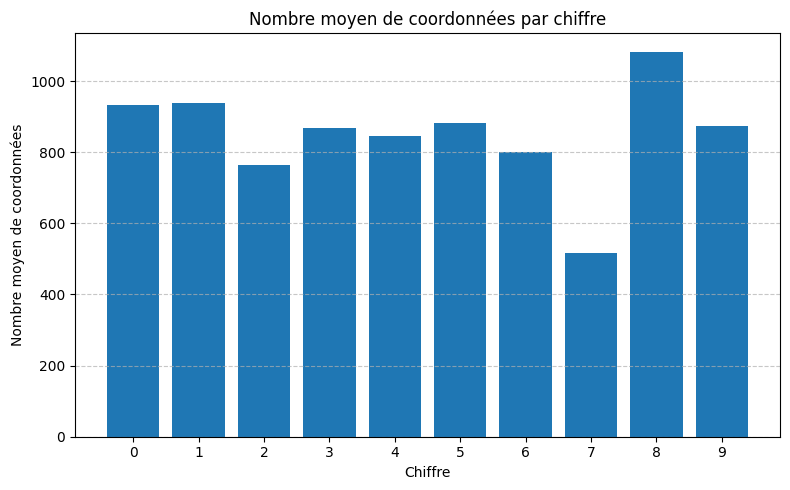

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_17660\2532005760.py:66: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---

Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 12s 110ms/step - accuracy: 0.1122 - loss: 2.4216
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 104ms/step - accuracy: 0.1533 - loss: 2.1135
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 104ms/step - accuracy: 0.3778 - loss: 1.5224
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - accuracy: 0.7556 - loss: 0.7432
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 104ms/step - accuracy: 0.8744 - loss: 0.4037
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - accuracy: 0.9089 - loss: 0.3234
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - accuracy: 0.9511 - loss: 0.1772
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - accuracy: 0.9589 - loss: 0.1601
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 109ms/step - accuracy: 0.9678 - loss: 0.1166
Epoch 10/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 108ms/step - accuracy: 0.9544 - loss: 0.1593
Epoch 11/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 110ms/step - accuracy: 0.9578 - loss: 0.1547
Epoch 12/50
29/29 ━━

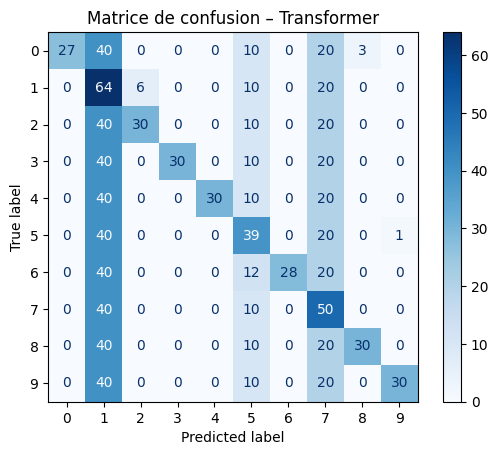

In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import layers, models
import tensorflow as tf

# ordre de test : 1) d_model → tester 64, 128, 256. , 2) num_heads → 2, 4, 8.,3) , num_layers →  2, 3,4 ,4)dff → 128, 256, 512. ,5)Dense final hidden → 64, 128, 256.
#6) batch_size → 16, 32, 64 (si GPU limité).

# onsirpation de :https://github.com/gyselph/transformer-sequence-classification?
# est un model esupervise comme lstm mais pas dtw edti distanc eetc et traite le signale en entier et pas frame par frame 
# ------------------------
# 1. Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


# ------------------------
# 2. Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")


# ------------------------
# 3. Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


# ------------------------
# 4. Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


# ------------------------
# 5. Split user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test


# -------------------------------------------------------
# 6. POSITONAL ENCODING (VERSION 100% COMPATIBLE TF2)
# -------------------------------------------------------
class PositionalEncoding(layers.Layer):
    def __init__(self, max_len, d_model):
        super().__init__()
        self.max_len = max_len
        self.d_model = d_model

        # Pré-calcul numpy -> constant TensorFlow
        pos = np.arange(max_len)[:, np.newaxis]
        i = np.arange(d_model)[np.newaxis, :]
        angle_rates = 1 / np.power(10000, (2 * (i // 2)) / np.float32(d_model))

        angle_rads = pos * angle_rates

        pe = np.zeros((max_len, d_model))
        pe[:, 0::2] = np.sin(angle_rads[:, 0::2])
        pe[:, 1::2] = np.cos(angle_rads[:, 1::2])

        self.positional_encoding = tf.constant(pe[np.newaxis, ...], dtype=tf.float32)

    def call(self, x):
        seq_len = tf.shape(x)[1]
        return x + self.positional_encoding[:, :seq_len, :]


# ------------------------
# 7. Transformer Encoder Model
# ------------------------
def transformer_encoder(x, num_heads, d_model, dff, dropout):
    attn_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=d_model)(x, x)
    attn_output = layers.Dropout(dropout)(attn_output)
    out1 = layers.LayerNormalization(epsilon=1e-6)(x + attn_output)

    ffn = models.Sequential([
        layers.Dense(dff, activation="relu"),
        layers.Dense(d_model),
    ])
    ffn_output = ffn(out1)
    ffn_output = layers.Dropout(dropout)(ffn_output)
    out2 = layers.LayerNormalization(epsilon=1e-6)(out1 + ffn_output)

    return out2


def create_transformer_model(input_shape, num_classes, seq_len=100):
    inputs = layers.Input(shape=input_shape)

    d_model = 128
    num_heads = 4
    num_layers = 2
    dff = 128
    dropout = 0.3

    x = layers.Dense(d_model)(inputs)
    x = PositionalEncoding(seq_len, d_model)(x)

    for _ in range(num_layers):
        x = transformer_encoder(x, num_heads, d_model, dff, dropout)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(32, activation='relu')(x)
    x = layers.Dropout(0.2)(x)

    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs, outputs)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    return model


# ------------------------
# 8. Test leave-one-user-out
# ------------------------
def test_transformer_user_independent(df, loop_range=10, epochs=30, batch_size=32, verbose_fit=1):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")

        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        n_classes = len(np.unique(y_train))
        input_shape = (X_train.shape[1], X_train.shape[2])

        model = create_transformer_model(input_shape=input_shape, num_classes=n_classes)

        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=verbose_fit)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale Transformer : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – Transformer")
    plt.show()


# ------------------------
# 9. Lancer le test Transformer
# ------------------------
test_transformer_user_independent(df100, loop_range=10, epochs=50, batch_size=32, verbose_fit=1)

# teste dense 64


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_13528\3337261673.py:27: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


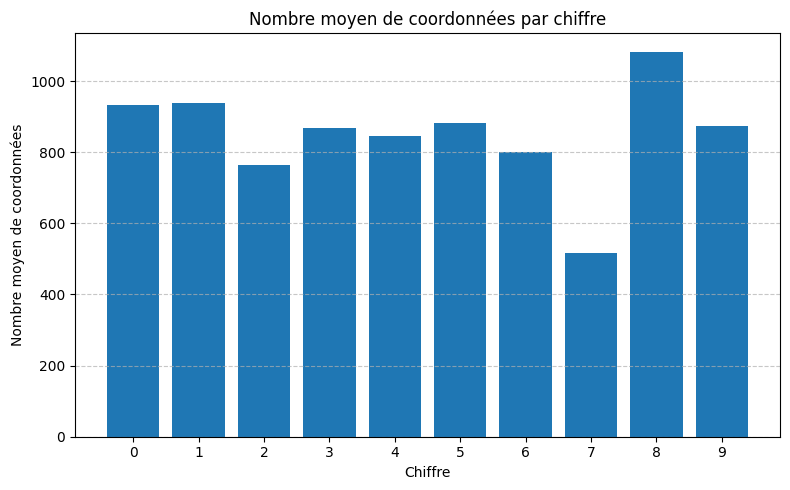

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_13528\3337261673.py:66: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---

Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - accuracy: 0.1011 - loss: 2.3891
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 113ms/step - accuracy: 0.2100 - loss: 2.0540
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - accuracy: 0.5889 - loss: 1.1482
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - accuracy: 0.8489 - loss: 0.4635
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - accuracy: 0.9022 - loss: 0.3338
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 122ms/step - accuracy: 0.9400 - loss: 0.2008
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - accuracy: 0.9544 - loss: 0.1516
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 117ms/step - accuracy: 0.9578 - loss: 0.1587
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 117ms/step - accuracy: 0.9778 - loss: 0.0861
Epoch 10/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - accuracy: 0.9678 - loss: 0.1054
Epoch 11/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - accuracy: 0.9822 - loss: 0.0773
Epoch 12/50
29/29 ━━

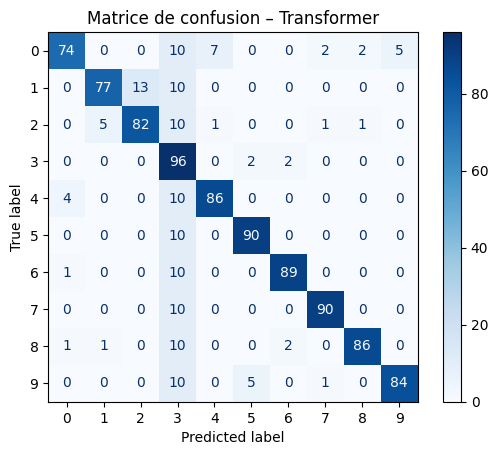

In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import layers, models
import tensorflow as tf

# ordre de test : 1) d_model → tester 64, 128, 256. , 2) num_heads → 2, 4, 8.,3) , num_layers →  2, 3,4 ,4)dff → 128, 256, 512. ,5)Dense final hidden → 64, 128, 256.
#6) batch_size → 16, 32, 64 (si GPU limité).

# onsirpation de :https://github.com/gyselph/transformer-sequence-classification?
# est un model esupervise comme lstm mais pas dtw edti distanc eetc et traite le signale en entier et pas frame par frame 
# ------------------------
# 1. Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


# ------------------------
# 2. Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")


# ------------------------
# 3. Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


# ------------------------
# 4. Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


# ------------------------
# 5. Split user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test


# -------------------------------------------------------
# 6. POSITONAL ENCODING (VERSION 100% COMPATIBLE TF2)
# -------------------------------------------------------
class PositionalEncoding(layers.Layer):
    def __init__(self, max_len, d_model):
        super().__init__()
        self.max_len = max_len
        self.d_model = d_model

        # Pré-calcul numpy -> constant TensorFlow
        pos = np.arange(max_len)[:, np.newaxis]
        i = np.arange(d_model)[np.newaxis, :]
        angle_rates = 1 / np.power(10000, (2 * (i // 2)) / np.float32(d_model))

        angle_rads = pos * angle_rates

        pe = np.zeros((max_len, d_model))
        pe[:, 0::2] = np.sin(angle_rads[:, 0::2])
        pe[:, 1::2] = np.cos(angle_rads[:, 1::2])

        self.positional_encoding = tf.constant(pe[np.newaxis, ...], dtype=tf.float32)

    def call(self, x):
        seq_len = tf.shape(x)[1]
        return x + self.positional_encoding[:, :seq_len, :]


# ------------------------
# 7. Transformer Encoder Model
# ------------------------
def transformer_encoder(x, num_heads, d_model, dff, dropout):
    attn_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=d_model)(x, x)
    attn_output = layers.Dropout(dropout)(attn_output)
    out1 = layers.LayerNormalization(epsilon=1e-6)(x + attn_output)

    ffn = models.Sequential([
        layers.Dense(dff, activation="relu"),
        layers.Dense(d_model),
    ])
    ffn_output = ffn(out1)
    ffn_output = layers.Dropout(dropout)(ffn_output)
    out2 = layers.LayerNormalization(epsilon=1e-6)(out1 + ffn_output)

    return out2


def create_transformer_model(input_shape, num_classes, seq_len=100):
    inputs = layers.Input(shape=input_shape)

    d_model = 128
    num_heads = 4
    num_layers = 2
    dff = 256
    dropout = 0.3

    x = layers.Dense(d_model)(inputs)
    x = PositionalEncoding(seq_len, d_model)(x)

    for _ in range(num_layers):
        x = transformer_encoder(x, num_heads, d_model, dff, dropout)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(64, activation='relu')(x)
    x = layers.Dropout(0.2)(x)

    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs, outputs)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    return model


# ------------------------
# 8. Test leave-one-user-out
# ------------------------
def test_transformer_user_independent(df, loop_range=10, epochs=30, batch_size=32, verbose_fit=1):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")

        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        n_classes = len(np.unique(y_train))
        input_shape = (X_train.shape[1], X_train.shape[2])

        model = create_transformer_model(input_shape=input_shape, num_classes=n_classes)

        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=verbose_fit)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale Transformer : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – Transformer")
    plt.show()


# ------------------------
# 9. Lancer le test Transformer
# ------------------------
test_transformer_user_independent(df100, loop_range=10, epochs=50, batch_size=32, verbose_fit=1)

# elemioner malade

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_13528\3238685336.py:27: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


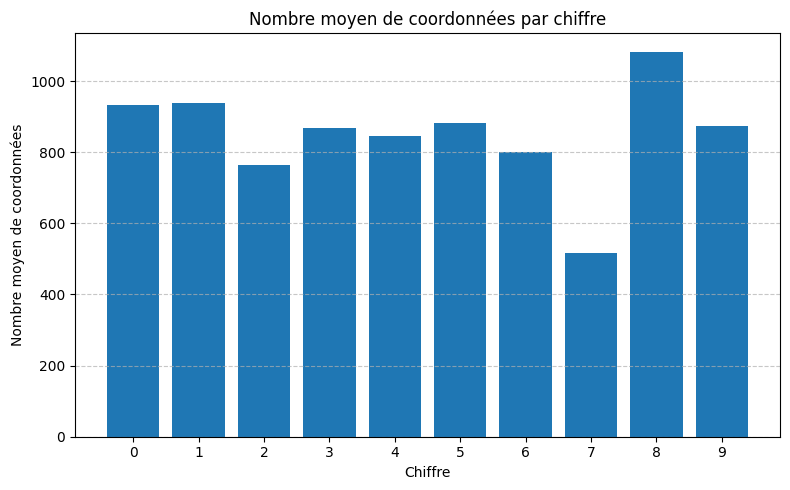

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_13528\3238685336.py:66: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---
Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 6s 107ms/step - accuracy: 0.0989 - loss: 2.3953
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 111ms/step - accuracy: 0.2856 - loss: 1.8962
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 108ms/step - accuracy: 0.7900 - loss: 0.6341
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 107ms/step - accuracy: 0.9222 - loss: 0.3043
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 108ms/step - accuracy: 0.9489 - loss: 0.2053
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 106ms/step - accuracy: 0.9856 - loss: 0.0778
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 109ms/step - accuracy: 0.9744 - loss: 0.1003
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 109ms/step - accuracy: 0.9833 - loss: 0.0558
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 112ms/step - accuracy: 0.9111 - loss: 0.2626
Epoch 10/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - accuracy: 0.9678 - loss: 0.1072
Epoch 11/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - accuracy: 0.9778 - loss: 0.0630
Epoch 12/50
29/29 ━━━━

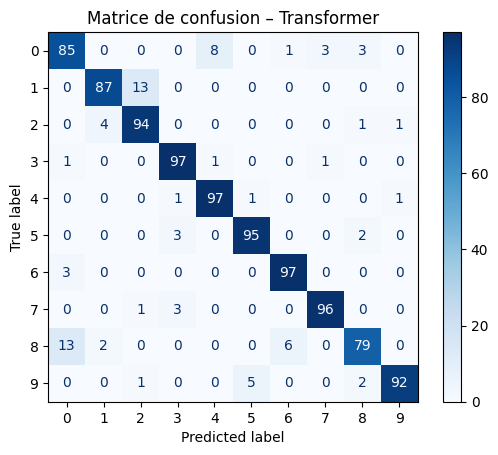

In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import layers, models
import tensorflow as tf

# ordre de test : 1) d_model → tester 64, 128, 256. , 2) num_heads → 2, 4, 8.,3) , num_layers →  2, 3,4 ,4)dff → 128, 256, 512. ,5)Dense final hidden → 64, 128, 256.
#6) batch_size → 16, 32, 64 (si GPU limité).

# onsirpation de :https://github.com/gyselph/transformer-sequence-classification?
# est un model esupervise comme lstm mais pas dtw edti distanc eetc et traite le signale en entier et pas frame par frame 
# ------------------------
# 1. Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


# ------------------------
# 2. Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")


# ------------------------
# 3. Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


# ------------------------
# 4. Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


# ------------------------
# 5. Split user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test


# -------------------------------------------------------
# 6. POSITONAL ENCODING (VERSION 100% COMPATIBLE TF2)
# -------------------------------------------------------
class PositionalEncoding(layers.Layer):
    def __init__(self, max_len, d_model):
        super().__init__()
        self.max_len = max_len
        self.d_model = d_model

        # Pré-calcul numpy -> constant TensorFlow
        pos = np.arange(max_len)[:, np.newaxis]
        i = np.arange(d_model)[np.newaxis, :]
        angle_rates = 1 / np.power(10000, (2 * (i // 2)) / np.float32(d_model))

        angle_rads = pos * angle_rates

        pe = np.zeros((max_len, d_model))
        pe[:, 0::2] = np.sin(angle_rads[:, 0::2])
        pe[:, 1::2] = np.cos(angle_rads[:, 1::2])

        self.positional_encoding = tf.constant(pe[np.newaxis, ...], dtype=tf.float32)

    def call(self, x):
        seq_len = tf.shape(x)[1]
        return x + self.positional_encoding[:, :seq_len, :]


# ------------------------
# 7. Transformer Encoder Model
# ------------------------
def transformer_encoder(x, num_heads, d_model, dff, dropout):
    attn_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=d_model)(x, x)
    attn_output = layers.Dropout(dropout)(attn_output)
    out1 = layers.LayerNormalization(epsilon=1e-6)(x + attn_output)

    ffn = models.Sequential([
        layers.Dense(dff, activation="relu"),
        layers.Dense(d_model),
    ])
    ffn_output = ffn(out1)
    ffn_output = layers.Dropout(dropout)(ffn_output)
    out2 = layers.LayerNormalization(epsilon=1e-6)(out1 + ffn_output)

    return out2


def create_transformer_model(input_shape, num_classes, seq_len=100):
    inputs = layers.Input(shape=input_shape)

    d_model = 128
    num_heads = 4
    num_layers = 2
    dff = 256
    dropout = 0.1

    x = layers.Dense(d_model)(inputs)
    x = PositionalEncoding(seq_len, d_model)(x)

    for _ in range(num_layers):
        x = transformer_encoder(x, num_heads, d_model, dff, dropout)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(64, activation='relu')(x)
    x = layers.Dropout(0.2)(x)

    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs, outputs)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    return model


# ------------------------
# 8. Test leave-one-user-out
# ------------------------
def test_transformer_user_independent(df, loop_range=10, epochs=30, batch_size=32, verbose_fit=1):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")

        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        n_classes = len(np.unique(y_train))
        input_shape = (X_train.shape[1], X_train.shape[2])

        model = create_transformer_model(input_shape=input_shape, num_classes=n_classes)

        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=verbose_fit)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale Transformer : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – Transformer")
    plt.show()


# ------------------------
# 9. Lancer le test Transformer
# ------------------------
test_transformer_user_independent(df100, loop_range=10, epochs=50, batch_size=32, verbose_fit=1)

# 0,2 regu 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_13528\1465787062.py:27: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


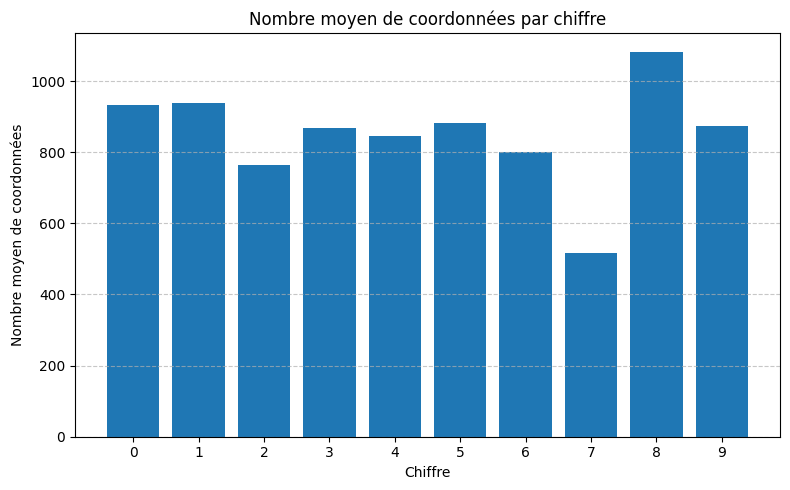

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_13528\1465787062.py:66: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---
Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 112ms/step - accuracy: 0.0989 - loss: 2.3544
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - accuracy: 0.3733 - loss: 1.6983
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 113ms/step - accuracy: 0.7767 - loss: 0.6297
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 113ms/step - accuracy: 0.9056 - loss: 0.3143
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 113ms/step - accuracy: 0.9233 - loss: 0.2484
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 112ms/step - accuracy: 0.9500 - loss: 0.1391
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - accuracy: 0.9622 - loss: 0.1365
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 114ms/step - accuracy: 0.9867 - loss: 0.0646
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - accuracy: 0.9944 - loss: 0.0294
Epoch 10/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - accuracy: 0.9867 - loss: 0.0512
Epoch 11/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - accuracy: 0.9800 - loss: 0.0753
Epoch 12/50
29/29 ━━━━

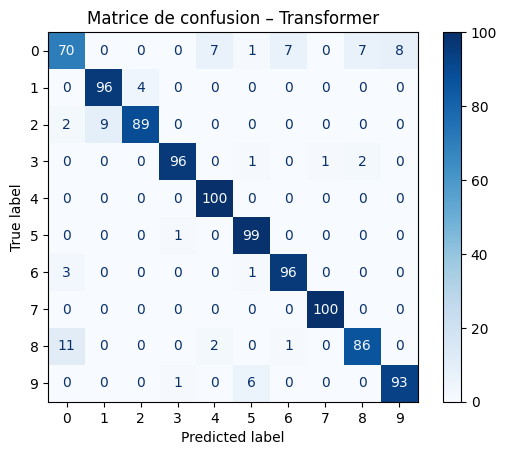

In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import layers, models
import tensorflow as tf

# ordre de test : 1) d_model → tester 64, 128, 256. , 2) num_heads → 2, 4, 8.,3) , num_layers →  2, 3,4 ,4)dff → 128, 256, 512. ,5)Dense final hidden → 64, 128, 256.
#6) batch_size → 16, 32, 64 (si GPU limité).

# onsirpation de :https://github.com/gyselph/transformer-sequence-classification?
# est un model esupervise comme lstm mais pas dtw edti distanc eetc et traite le signale en entier et pas frame par frame 
# ------------------------
# 1. Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


# ------------------------
# 2. Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")


# ------------------------
# 3. Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


# ------------------------
# 4. Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


# ------------------------
# 5. Split user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test


# -------------------------------------------------------
# 6. POSITONAL ENCODING (VERSION 100% COMPATIBLE TF2)
# -------------------------------------------------------
class PositionalEncoding(layers.Layer):
    def __init__(self, max_len, d_model):
        super().__init__()
        self.max_len = max_len
        self.d_model = d_model

        # Pré-calcul numpy -> constant TensorFlow
        pos = np.arange(max_len)[:, np.newaxis]
        i = np.arange(d_model)[np.newaxis, :]
        angle_rates = 1 / np.power(10000, (2 * (i // 2)) / np.float32(d_model))

        angle_rads = pos * angle_rates

        pe = np.zeros((max_len, d_model))
        pe[:, 0::2] = np.sin(angle_rads[:, 0::2])
        pe[:, 1::2] = np.cos(angle_rads[:, 1::2])

        self.positional_encoding = tf.constant(pe[np.newaxis, ...], dtype=tf.float32)

    def call(self, x):
        seq_len = tf.shape(x)[1]
        return x + self.positional_encoding[:, :seq_len, :]


# ------------------------
# 7. Transformer Encoder Model
# ------------------------
def transformer_encoder(x, num_heads, d_model, dff, dropout):
    attn_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=d_model)(x, x)
    attn_output = layers.Dropout(dropout)(attn_output)
    out1 = layers.LayerNormalization(epsilon=1e-6)(x + attn_output)

    ffn = models.Sequential([
        layers.Dense(dff, activation="relu"),
        layers.Dense(d_model),
    ])
    ffn_output = ffn(out1)
    ffn_output = layers.Dropout(dropout)(ffn_output)
    out2 = layers.LayerNormalization(epsilon=1e-6)(out1 + ffn_output)

    return out2


def create_transformer_model(input_shape, num_classes, seq_len=100):
    inputs = layers.Input(shape=input_shape)

    d_model = 128
    num_heads = 4
    num_layers = 2
    dff = 256
    dropout = 0.2

    x = layers.Dense(d_model)(inputs)
    x = PositionalEncoding(seq_len, d_model)(x)

    for _ in range(num_layers):
        x = transformer_encoder(x, num_heads, d_model, dff, dropout)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(64, activation='relu')(x)
    x = layers.Dropout(0.2)(x)

    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs, outputs)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    return model


# ------------------------
# 8. Test leave-one-user-out
# ------------------------
def test_transformer_user_independent(df, loop_range=10, epochs=30, batch_size=32, verbose_fit=1):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")

        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        n_classes = len(np.unique(y_train))
        input_shape = (X_train.shape[1], X_train.shape[2])

        model = create_transformer_model(input_shape=input_shape, num_classes=n_classes)

        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=verbose_fit)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale Transformer : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – Transformer")
    plt.show()


# ------------------------
# 9. Lancer le test Transformer
# ------------------------
test_transformer_user_independent(df100, loop_range=10, epochs=50, batch_size=32, verbose_fit=1)

# dense 128 avec reug 2 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_13528\3133602473.py:27: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


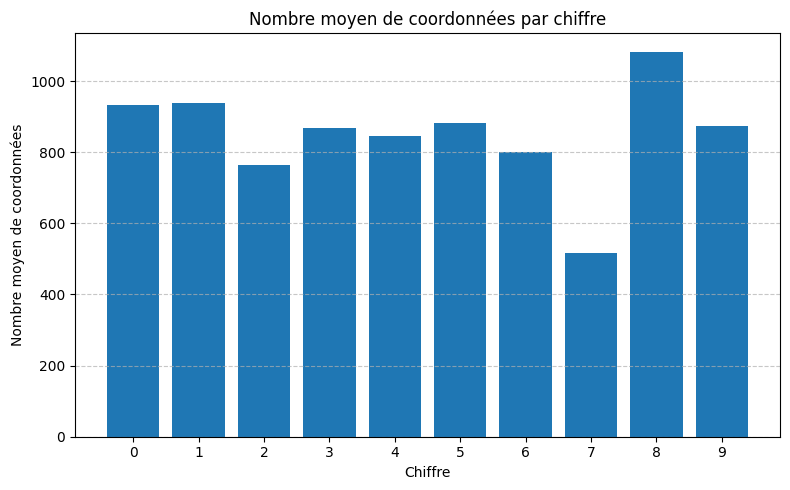

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_13528\3133602473.py:66: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---
Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 6s 111ms/step - accuracy: 0.1022 - loss: 2.3606
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 110ms/step - accuracy: 0.5444 - loss: 1.3069
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 111ms/step - accuracy: 0.8689 - loss: 0.3676
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 109ms/step - accuracy: 0.9189 - loss: 0.2008
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 110ms/step - accuracy: 0.9456 - loss: 0.1416
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 111ms/step - accuracy: 0.9744 - loss: 0.0859
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 111ms/step - accuracy: 0.9533 - loss: 0.1253
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 111ms/step - accuracy: 0.9800 - loss: 0.0779
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 112ms/step - accuracy: 0.9722 - loss: 0.0742
Epoch 10/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - accuracy: 0.9667 - loss: 0.1167
Epoch 11/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - accuracy: 0.9589 - loss: 0.1075
Epoch 12/50
29/29 ━━━━

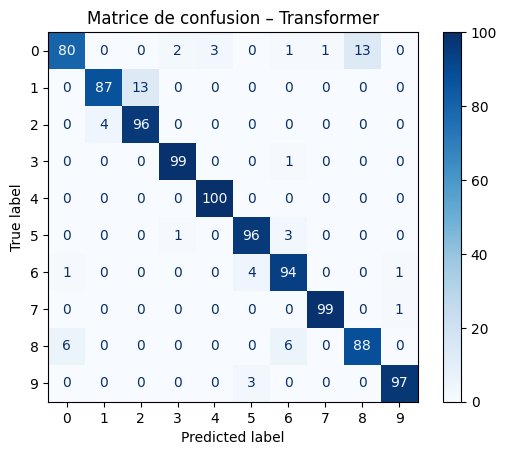

In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import layers, models
import tensorflow as tf

# ordre de test : 1) d_model → tester 64, 128, 256. , 2) num_heads → 2, 4, 8.,3) , num_layers →  2, 3,4 ,4)dff → 128, 256, 512. ,5)Dense final hidden → 64, 128, 256.
#6) batch_size → 16, 32, 64 (si GPU limité).

# onsirpation de :https://github.com/gyselph/transformer-sequence-classification?
# est un model esupervise comme lstm mais pas dtw edti distanc eetc et traite le signale en entier et pas frame par frame 
# ------------------------
# 1. Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


# ------------------------
# 2. Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")


# ------------------------
# 3. Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


# ------------------------
# 4. Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


# ------------------------
# 5. Split user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test


# -------------------------------------------------------
# 6. POSITONAL ENCODING (VERSION 100% COMPATIBLE TF2)
# -------------------------------------------------------
class PositionalEncoding(layers.Layer):
    def __init__(self, max_len, d_model):
        super().__init__()
        self.max_len = max_len
        self.d_model = d_model

        # Pré-calcul numpy -> constant TensorFlow
        pos = np.arange(max_len)[:, np.newaxis]
        i = np.arange(d_model)[np.newaxis, :]
        angle_rates = 1 / np.power(10000, (2 * (i // 2)) / np.float32(d_model))

        angle_rads = pos * angle_rates

        pe = np.zeros((max_len, d_model))
        pe[:, 0::2] = np.sin(angle_rads[:, 0::2])
        pe[:, 1::2] = np.cos(angle_rads[:, 1::2])

        self.positional_encoding = tf.constant(pe[np.newaxis, ...], dtype=tf.float32)

    def call(self, x):
        seq_len = tf.shape(x)[1]
        return x + self.positional_encoding[:, :seq_len, :]


# ------------------------
# 7. Transformer Encoder Model
# ------------------------
def transformer_encoder(x, num_heads, d_model, dff, dropout):
    attn_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=d_model)(x, x)
    attn_output = layers.Dropout(dropout)(attn_output)
    out1 = layers.LayerNormalization(epsilon=1e-6)(x + attn_output)

    ffn = models.Sequential([
        layers.Dense(dff, activation="relu"),
        layers.Dense(d_model),
    ])
    ffn_output = ffn(out1)
    ffn_output = layers.Dropout(dropout)(ffn_output)
    out2 = layers.LayerNormalization(epsilon=1e-6)(out1 + ffn_output)

    return out2


def create_transformer_model(input_shape, num_classes, seq_len=100):
    inputs = layers.Input(shape=input_shape)

    d_model = 128
    num_heads = 4
    num_layers = 2
    dff = 256
    dropout = 0.2

    x = layers.Dense(d_model)(inputs)
    x = PositionalEncoding(seq_len, d_model)(x)

    for _ in range(num_layers):
        x = transformer_encoder(x, num_heads, d_model, dff, dropout)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(128, activation='relu')(x)
    x = layers.Dropout(0.2)(x)

    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs, outputs)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    return model


# ------------------------
# 8. Test leave-one-user-out
# ------------------------
def test_transformer_user_independent(df, loop_range=10, epochs=30, batch_size=32, verbose_fit=1):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")

        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        n_classes = len(np.unique(y_train))
        input_shape = (X_train.shape[1], X_train.shape[2])

        model = create_transformer_model(input_shape=input_shape, num_classes=n_classes)

        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=verbose_fit)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale Transformer : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – Transformer")
    plt.show()


# ------------------------
# 9. Lancer le test Transformer
# ------------------------
test_transformer_user_independent(df100, loop_range=10, epochs=50, batch_size=32, verbose_fit=1)

# tets encore plus le epoche 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_13528\1283511782.py:27: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


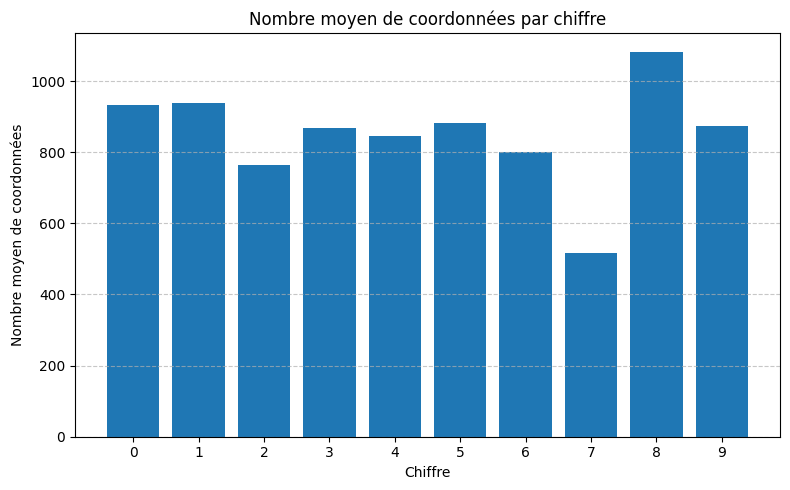

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_13528\1283511782.py:66: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---
Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - accuracy: 0.1433 - loss: 2.3199
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 104ms/step - accuracy: 0.7289 - loss: 0.7847
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 106ms/step - accuracy: 0.8533 - loss: 0.3232
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - accuracy: 0.9200 - loss: 0.1979
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - accuracy: 0.9322 - loss: 0.1689
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - accuracy: 0.9667 - loss: 0.0927
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 106ms/step - accuracy: 0.9456 - loss: 0.1514
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - accuracy: 0.9700 - loss: 0.0878
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 104ms/step - accuracy: 0.9722 - loss: 0.0895
Epoch 10/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 109ms/step - accuracy: 0.9889 - loss: 0.0473
Epoch 11/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 108ms/step - accuracy: 0.9867 - loss: 0.0412
Epoch 12/50
29/29 ━━━━

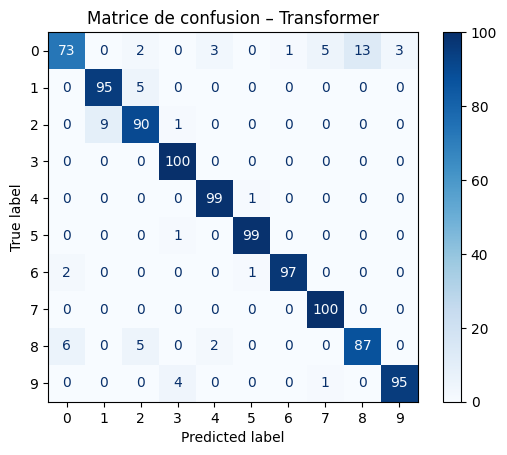

In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import layers, models
import tensorflow as tf

# ordre de test : 1) d_model → tester 64, 128, 256. , 2) num_heads → 2, 4, 8.,3) , num_layers →  2, 3,4 ,4)dff → 128, 256, 512. ,5)Dense final hidden → 64, 128, 256.
#6) batch_size → 16, 32, 64 (si GPU limité).

# onsirpation de :https://github.com/gyselph/transformer-sequence-classification?
# est un model esupervise comme lstm mais pas dtw edti distanc eetc et traite le signale en entier et pas frame par frame 
# ------------------------
# 1. Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


# ------------------------
# 2. Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")


# ------------------------
# 3. Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


# ------------------------
# 4. Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


# ------------------------
# 5. Split user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test


# -------------------------------------------------------
# 6. POSITONAL ENCODING (VERSION 100% COMPATIBLE TF2)
# -------------------------------------------------------
class PositionalEncoding(layers.Layer):
    def __init__(self, max_len, d_model):
        super().__init__()
        self.max_len = max_len
        self.d_model = d_model

        # Pré-calcul numpy -> constant TensorFlow
        pos = np.arange(max_len)[:, np.newaxis]
        i = np.arange(d_model)[np.newaxis, :]
        angle_rates = 1 / np.power(10000, (2 * (i // 2)) / np.float32(d_model))

        angle_rads = pos * angle_rates

        pe = np.zeros((max_len, d_model))
        pe[:, 0::2] = np.sin(angle_rads[:, 0::2])
        pe[:, 1::2] = np.cos(angle_rads[:, 1::2])

        self.positional_encoding = tf.constant(pe[np.newaxis, ...], dtype=tf.float32)

    def call(self, x):
        seq_len = tf.shape(x)[1]
        return x + self.positional_encoding[:, :seq_len, :]


# ------------------------
# 7. Transformer Encoder Model
# ------------------------
def transformer_encoder(x, num_heads, d_model, dff, dropout):
    attn_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=d_model)(x, x)
    attn_output = layers.Dropout(dropout)(attn_output)
    out1 = layers.LayerNormalization(epsilon=1e-6)(x + attn_output)

    ffn = models.Sequential([
        layers.Dense(dff, activation="relu"),
        layers.Dense(d_model),
    ])
    ffn_output = ffn(out1)
    ffn_output = layers.Dropout(dropout)(ffn_output)
    out2 = layers.LayerNormalization(epsilon=1e-6)(out1 + ffn_output)

    return out2


def create_transformer_model(input_shape, num_classes, seq_len=100):
    inputs = layers.Input(shape=input_shape)

    d_model = 128
    num_heads = 4
    num_layers = 2
    dff = 256
    dropout = 0.2

    x = layers.Dense(d_model)(inputs)
    x = PositionalEncoding(seq_len, d_model)(x)

    for _ in range(num_layers):
        x = transformer_encoder(x, num_heads, d_model, dff, dropout)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(128, activation='relu')(x)
    x = layers.Dropout(0.2)(x)

    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs, outputs)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    return model


# ------------------------
# 8. Test leave-one-user-out
# ------------------------
def test_transformer_user_independent(df, loop_range=10, epochs=50, batch_size=32, verbose_fit=1):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")

        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        n_classes = len(np.unique(y_train))
        input_shape = (X_train.shape[1], X_train.shape[2])

        model = create_transformer_model(input_shape=input_shape, num_classes=n_classes)

        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=verbose_fit)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale Transformer : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – Transformer")
    plt.show()


# ------------------------
# 9. Lancer le test Transformer
# ------------------------
test_transformer_user_independent(df100, loop_range=10, epochs=50, batch_size=32, verbose_fit=1)

# regu 3

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_13528\2454870984.py:27: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


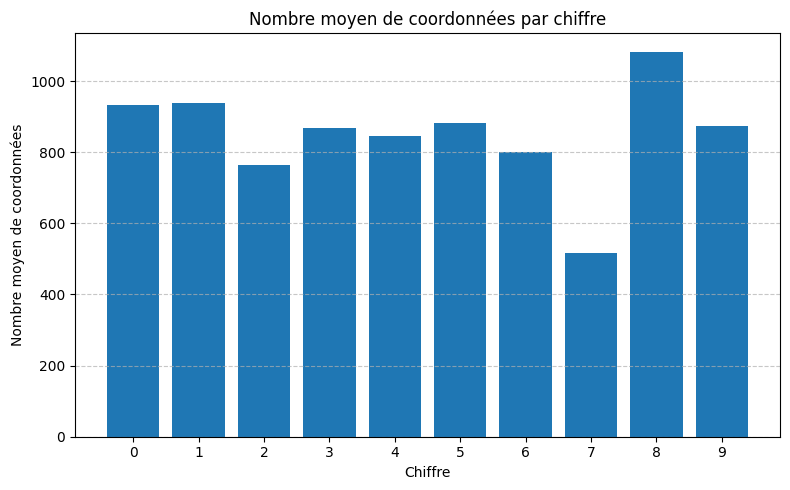

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_13528\2454870984.py:66: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---
Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 6s 109ms/step - accuracy: 0.0900 - loss: 2.3937
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - accuracy: 0.3678 - loss: 1.6960
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 109ms/step - accuracy: 0.7633 - loss: 0.5700
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - accuracy: 0.8978 - loss: 0.3077
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 108ms/step - accuracy: 0.9300 - loss: 0.2155
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 108ms/step - accuracy: 0.9400 - loss: 0.1749
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 109ms/step - accuracy: 0.9456 - loss: 0.1640
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 109ms/step - accuracy: 0.9622 - loss: 0.1042
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - accuracy: 0.9744 - loss: 0.0755
Epoch 10/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - accuracy: 0.9711 - loss: 0.0946
Epoch 11/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - accuracy: 0.9744 - loss: 0.0779
Epoch 12/50
29/29 ━━━━

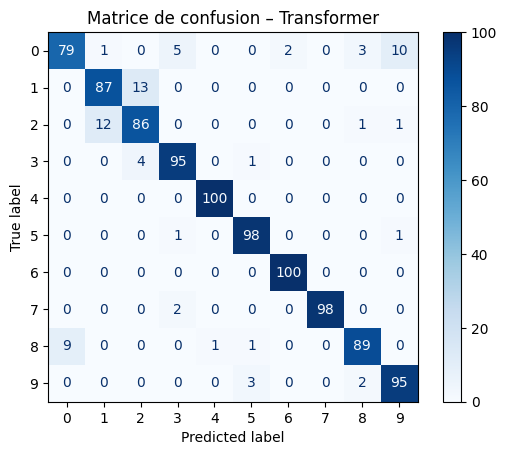

In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import layers, models
import tensorflow as tf

# ordre de test : 1) d_model → tester 64, 128, 256. , 2) num_heads → 2, 4, 8.,3) , num_layers →  2, 3,4 ,4)dff → 128, 256, 512. ,5)Dense final hidden → 64, 128, 256.
#6) batch_size → 16, 32, 64 (si GPU limité).

# onsirpation de :https://github.com/gyselph/transformer-sequence-classification?
# est un model esupervise comme lstm mais pas dtw edti distanc eetc et traite le signale en entier et pas frame par frame 
# ------------------------
# 1. Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


# ------------------------
# 2. Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")


# ------------------------
# 3. Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


# ------------------------
# 4. Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


# ------------------------
# 5. Split user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test


# -------------------------------------------------------
# 6. POSITONAL ENCODING (VERSION 100% COMPATIBLE TF2)
# -------------------------------------------------------
class PositionalEncoding(layers.Layer):
    def __init__(self, max_len, d_model):
        super().__init__()
        self.max_len = max_len
        self.d_model = d_model

        # Pré-calcul numpy -> constant TensorFlow
        pos = np.arange(max_len)[:, np.newaxis]
        i = np.arange(d_model)[np.newaxis, :]
        angle_rates = 1 / np.power(10000, (2 * (i // 2)) / np.float32(d_model))

        angle_rads = pos * angle_rates

        pe = np.zeros((max_len, d_model))
        pe[:, 0::2] = np.sin(angle_rads[:, 0::2])
        pe[:, 1::2] = np.cos(angle_rads[:, 1::2])

        self.positional_encoding = tf.constant(pe[np.newaxis, ...], dtype=tf.float32)

    def call(self, x):
        seq_len = tf.shape(x)[1]
        return x + self.positional_encoding[:, :seq_len, :]


# ------------------------
# 7. Transformer Encoder Model
# ------------------------
def transformer_encoder(x, num_heads, d_model, dff, dropout):
    attn_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=d_model)(x, x)
    attn_output = layers.Dropout(dropout)(attn_output)
    out1 = layers.LayerNormalization(epsilon=1e-6)(x + attn_output)

    ffn = models.Sequential([
        layers.Dense(dff, activation="relu"),
        layers.Dense(d_model),
    ])
    ffn_output = ffn(out1)
    ffn_output = layers.Dropout(dropout)(ffn_output)
    out2 = layers.LayerNormalization(epsilon=1e-6)(out1 + ffn_output)

    return out2


def create_transformer_model(input_shape, num_classes, seq_len=100):
    inputs = layers.Input(shape=input_shape)

    d_model = 128
    num_heads = 4
    num_layers = 2
    dff = 256
    dropout = 0.3

    x = layers.Dense(d_model)(inputs)
    x = PositionalEncoding(seq_len, d_model)(x)

    for _ in range(num_layers):
        x = transformer_encoder(x, num_heads, d_model, dff, dropout)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(128, activation='relu')(x)
    x = layers.Dropout(0.2)(x)

    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs, outputs)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    return model


# ------------------------
# 8. Test leave-one-user-out
# ------------------------
def test_transformer_user_independent(df, loop_range=10, epochs=30, batch_size=32, verbose_fit=1):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")

        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        n_classes = len(np.unique(y_train))
        input_shape = (X_train.shape[1], X_train.shape[2])

        model = create_transformer_model(input_shape=input_shape, num_classes=n_classes)

        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=verbose_fit)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale Transformer : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – Transformer")
    plt.show()


# ------------------------
# 9. Lancer le test Transformer
# ------------------------
test_transformer_user_independent(df100, loop_range=10, epochs=50, batch_size=32, verbose_fit=1)

# dense 256

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_13528\3010948498.py:27: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


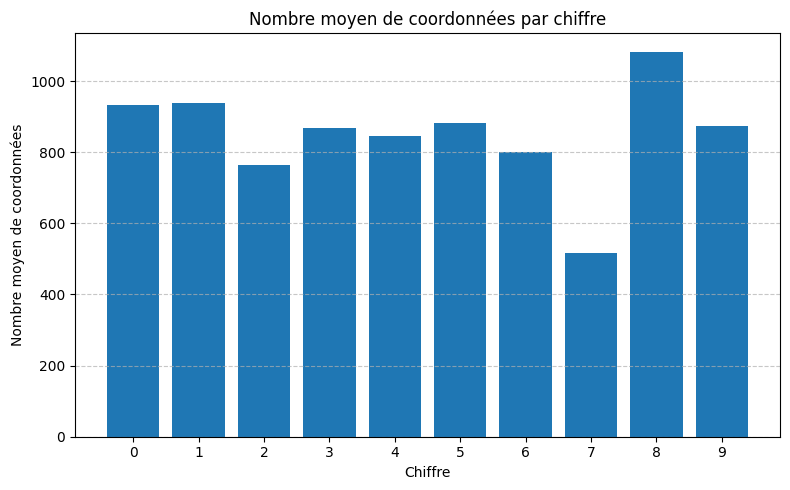

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_13528\3010948498.py:66: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---
Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 6s 113ms/step - accuracy: 0.1200 - loss: 2.3963
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 112ms/step - accuracy: 0.6200 - loss: 1.0349
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 114ms/step - accuracy: 0.8722 - loss: 0.3408
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - accuracy: 0.8967 - loss: 0.2643
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - accuracy: 0.9278 - loss: 0.1920
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 114ms/step - accuracy: 0.8978 - loss: 0.2480
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - accuracy: 0.9256 - loss: 0.1944
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 114ms/step - accuracy: 0.9578 - loss: 0.1044
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - accuracy: 0.9267 - loss: 0.2114
Epoch 10/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 122ms/step - accuracy: 0.9678 - loss: 0.1028
Epoch 11/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - accuracy: 0.9644 - loss: 0.1151
Epoch 12/50
29/29 ━━━━

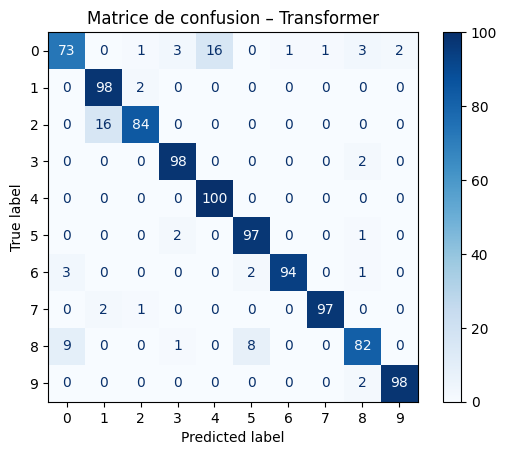

In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import layers, models
import tensorflow as tf

# ordre de test : 1) d_model → tester 64, 128, 256. , 2) num_heads → 2, 4, 8.,3) , num_layers →  2, 3,4 ,4)dff → 128, 256, 512. ,5)Dense final hidden → 64, 128, 256.
#6) batch_size → 16, 32, 64 (si GPU limité).

# onsirpation de :https://github.com/gyselph/transformer-sequence-classification?
# est un model esupervise comme lstm mais pas dtw edti distanc eetc et traite le signale en entier et pas frame par frame 
# ------------------------
# 1. Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


# ------------------------
# 2. Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")


# ------------------------
# 3. Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


# ------------------------
# 4. Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


# ------------------------
# 5. Split user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test


# -------------------------------------------------------
# 6. POSITONAL ENCODING (VERSION 100% COMPATIBLE TF2)
# -------------------------------------------------------
class PositionalEncoding(layers.Layer):
    def __init__(self, max_len, d_model):
        super().__init__()
        self.max_len = max_len
        self.d_model = d_model

        # Pré-calcul numpy -> constant TensorFlow
        pos = np.arange(max_len)[:, np.newaxis]
        i = np.arange(d_model)[np.newaxis, :]
        angle_rates = 1 / np.power(10000, (2 * (i // 2)) / np.float32(d_model))

        angle_rads = pos * angle_rates

        pe = np.zeros((max_len, d_model))
        pe[:, 0::2] = np.sin(angle_rads[:, 0::2])
        pe[:, 1::2] = np.cos(angle_rads[:, 1::2])

        self.positional_encoding = tf.constant(pe[np.newaxis, ...], dtype=tf.float32)

    def call(self, x):
        seq_len = tf.shape(x)[1]
        return x + self.positional_encoding[:, :seq_len, :]


# ------------------------
# 7. Transformer Encoder Model
# ------------------------
def transformer_encoder(x, num_heads, d_model, dff, dropout):
    attn_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=d_model)(x, x)
    attn_output = layers.Dropout(dropout)(attn_output)
    out1 = layers.LayerNormalization(epsilon=1e-6)(x + attn_output)

    ffn = models.Sequential([
        layers.Dense(dff, activation="relu"),
        layers.Dense(d_model),
    ])
    ffn_output = ffn(out1)
    ffn_output = layers.Dropout(dropout)(ffn_output)
    out2 = layers.LayerNormalization(epsilon=1e-6)(out1 + ffn_output)

    return out2


def create_transformer_model(input_shape, num_classes, seq_len=100):
    inputs = layers.Input(shape=input_shape)

    d_model = 128
    num_heads = 4
    num_layers = 2
    dff = 256
    dropout = 0.2

    x = layers.Dense(d_model)(inputs)
    x = PositionalEncoding(seq_len, d_model)(x)

    for _ in range(num_layers):
        x = transformer_encoder(x, num_heads, d_model, dff, dropout)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(256, activation='relu')(x)
    x = layers.Dropout(0.2)(x)

    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs, outputs)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    return model


# ------------------------
# 8. Test leave-one-user-out
# ------------------------
def test_transformer_user_independent(df, loop_range=10, epochs=30, batch_size=32, verbose_fit=1):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")

        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        n_classes = len(np.unique(y_train))
        input_shape = (X_train.shape[1], X_train.shape[2])

        model = create_transformer_model(input_shape=input_shape, num_classes=n_classes)

        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=verbose_fit)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale Transformer : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – Transformer")
    plt.show()


# ------------------------
# 9. Lancer le test Transformer
# ------------------------
test_transformer_user_independent(df100, loop_range=10, epochs=50, batch_size=32, verbose_fit=1)

#head 2 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_13528\80025666.py:27: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


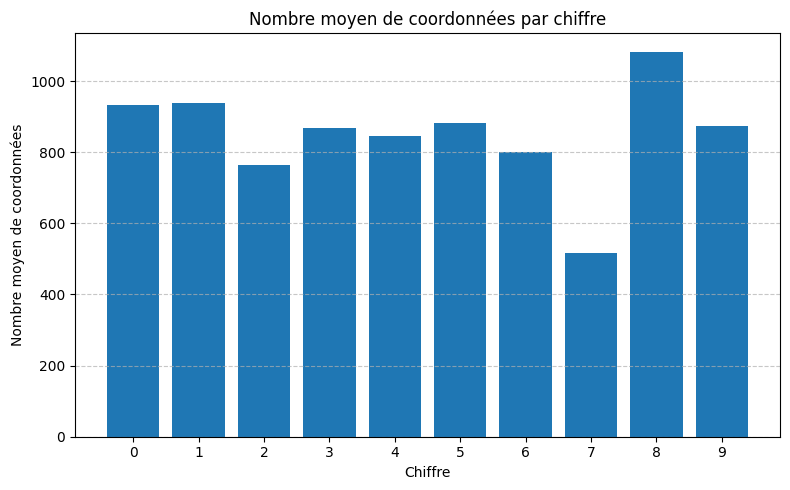

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_13528\80025666.py:66: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---
Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 10s 242ms/step - accuracy: 0.0800 - loss: 2.4420
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 237ms/step - accuracy: 0.3300 - loss: 1.7429
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 236ms/step - accuracy: 0.7233 - loss: 0.6998
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 243ms/step - accuracy: 0.8822 - loss: 0.3303
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 246ms/step - accuracy: 0.9400 - loss: 0.1877
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 249ms/step - accuracy: 0.9411 - loss: 0.1751
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 252ms/step - accuracy: 0.8689 - loss: 0.3430
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 257ms/step - accuracy: 0.9111 - loss: 0.1951
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 256ms/step - accuracy: 0.9244 - loss: 0.1581
Epoch 10/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 250ms/step - accuracy: 0.9489 - loss: 0.1257
Epoch 11/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 243ms/step - accuracy: 0.9644 - loss: 0.0977
Epoch 12/50
29/29 ━━━

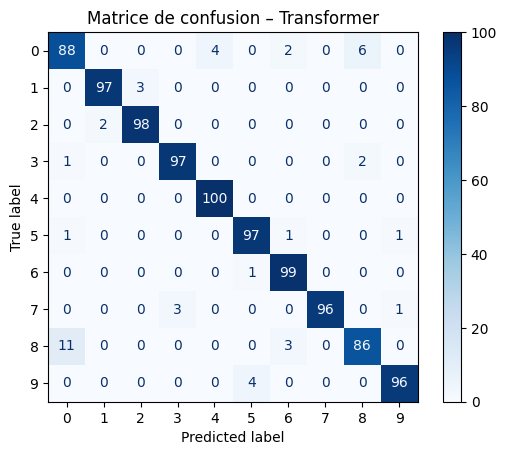

In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import layers, models
import tensorflow as tf

# ordre de test : 1) d_model → tester 64, 128, 256. , 2) num_heads → 2, 4, 8.,3) , num_layers →  2, 3,4 ,4)dff → 128, 256, 512. ,5)Dense final hidden → 64, 128, 256.
#6) batch_size → 16, 32, 64 (si GPU limité).

# onsirpation de :https://github.com/gyselph/transformer-sequence-classification?
# est un model esupervise comme lstm mais pas dtw edti distanc eetc et traite le signale en entier et pas frame par frame 
# ------------------------
# 1. Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


# ------------------------
# 2. Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")


# ------------------------
# 3. Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


# ------------------------
# 4. Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


# ------------------------
# 5. Split user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test


# -------------------------------------------------------
# 6. POSITONAL ENCODING (VERSION 100% COMPATIBLE TF2)
# -------------------------------------------------------
class PositionalEncoding(layers.Layer):
    def __init__(self, max_len, d_model):
        super().__init__()
        self.max_len = max_len
        self.d_model = d_model

        # Pré-calcul numpy -> constant TensorFlow
        pos = np.arange(max_len)[:, np.newaxis]
        i = np.arange(d_model)[np.newaxis, :]
        angle_rates = 1 / np.power(10000, (2 * (i // 2)) / np.float32(d_model))

        angle_rads = pos * angle_rates

        pe = np.zeros((max_len, d_model))
        pe[:, 0::2] = np.sin(angle_rads[:, 0::2])
        pe[:, 1::2] = np.cos(angle_rads[:, 1::2])

        self.positional_encoding = tf.constant(pe[np.newaxis, ...], dtype=tf.float32)

    def call(self, x):
        seq_len = tf.shape(x)[1]
        return x + self.positional_encoding[:, :seq_len, :]


# ------------------------
# 7. Transformer Encoder Model
# ------------------------
def transformer_encoder(x, num_heads, d_model, dff, dropout):
    attn_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=d_model)(x, x)
    attn_output = layers.Dropout(dropout)(attn_output)
    out1 = layers.LayerNormalization(epsilon=1e-6)(x + attn_output)

    ffn = models.Sequential([
        layers.Dense(dff, activation="relu"),
        layers.Dense(d_model),
    ])
    ffn_output = ffn(out1)
    ffn_output = layers.Dropout(dropout)(ffn_output)
    out2 = layers.LayerNormalization(epsilon=1e-6)(out1 + ffn_output)

    return out2


def create_transformer_model(input_shape, num_classes, seq_len=100):
    inputs = layers.Input(shape=input_shape)

    d_model = 128
    num_heads = 8
    num_layers = 2
    dff = 256
    dropout = 0.2

    x = layers.Dense(d_model)(inputs)
    x = PositionalEncoding(seq_len, d_model)(x)

    for _ in range(num_layers):
        x = transformer_encoder(x, num_heads, d_model, dff, dropout)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(128, activation='relu')(x)
    x = layers.Dropout(0.2)(x)

    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs, outputs)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    return model


# ------------------------
# 8. Test leave-one-user-out
# ------------------------
def test_transformer_user_independent(df, loop_range=10, epochs=30, batch_size=32, verbose_fit=1):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")

        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        n_classes = len(np.unique(y_train))
        input_shape = (X_train.shape[1], X_train.shape[2])

        model = create_transformer_model(input_shape=input_shape, num_classes=n_classes)

        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=verbose_fit)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale Transformer : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – Transformer")
    plt.show()


# ------------------------
# 9. Lancer le test Transformer
# ------------------------
test_transformer_user_independent(df100, loop_range=10, epochs=50, batch_size=32, verbose_fit=1)

#head 2 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_10284\1206041453.py:27: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


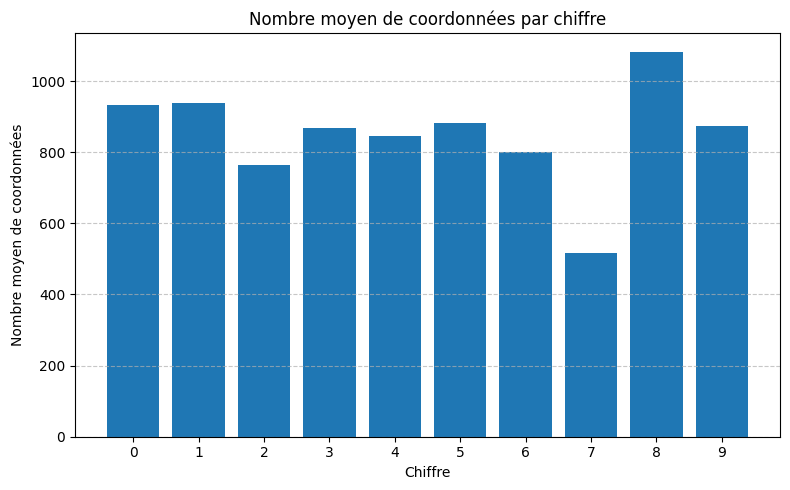

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_10284\1206041453.py:66: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---

Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - accuracy: 0.1144 - loss: 2.3768
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step - accuracy: 0.6633 - loss: 1.0624
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step - accuracy: 0.8778 - loss: 0.3324
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - accuracy: 0.9300 - loss: 0.2297
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - accuracy: 0.9411 - loss: 0.1674
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - accuracy: 0.9522 - loss: 0.1256
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.9456 - loss: 0.1628
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.9500 - loss: 0.1761
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step - accuracy: 0.9733 - loss: 0.0833
Epoch 10/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - accuracy: 0.9756 - loss: 0.0819
Epoch 11/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.9767 - loss: 0.0696
Epoch 12/50
29/29 ━━━━━━━━━━━━━

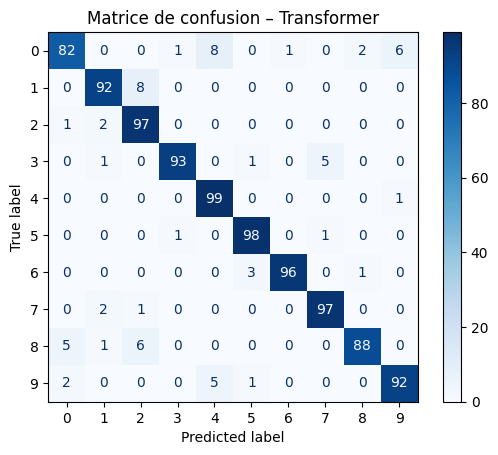

In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import layers, models
import tensorflow as tf

# ordre de test : 1) d_model → tester 64, 128, 256. , 2) num_heads → 2, 4, 8.,3) , num_layers →  2, 3,4 ,4)dff → 128, 256, 512. ,5)Dense final hidden → 64, 128, 256.
#6) batch_size → 16, 32, 64 (si GPU limité).

# onsirpation de :https://github.com/gyselph/transformer-sequence-classification?
# est un model esupervise comme lstm mais pas dtw edti distanc eetc et traite le signale en entier et pas frame par frame 
# ------------------------
# 1. Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


# ------------------------
# 2. Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")


# ------------------------
# 3. Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


# ------------------------
# 4. Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


# ------------------------
# 5. Split user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test


# -------------------------------------------------------
# 6. POSITONAL ENCODING (VERSION 100% COMPATIBLE TF2)
# -------------------------------------------------------
class PositionalEncoding(layers.Layer):
    def __init__(self, max_len, d_model):
        super().__init__()
        self.max_len = max_len
        self.d_model = d_model

        # Pré-calcul numpy -> constant TensorFlow
        pos = np.arange(max_len)[:, np.newaxis]
        i = np.arange(d_model)[np.newaxis, :]
        angle_rates = 1 / np.power(10000, (2 * (i // 2)) / np.float32(d_model))

        angle_rads = pos * angle_rates

        pe = np.zeros((max_len, d_model))
        pe[:, 0::2] = np.sin(angle_rads[:, 0::2])
        pe[:, 1::2] = np.cos(angle_rads[:, 1::2])

        self.positional_encoding = tf.constant(pe[np.newaxis, ...], dtype=tf.float32)

    def call(self, x):
        seq_len = tf.shape(x)[1]
        return x + self.positional_encoding[:, :seq_len, :]


# ------------------------
# 7. Transformer Encoder Model
# ------------------------
def transformer_encoder(x, num_heads, d_model, dff, dropout):
    attn_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=d_model)(x, x)
    attn_output = layers.Dropout(dropout)(attn_output)
    out1 = layers.LayerNormalization(epsilon=1e-6)(x + attn_output)

    ffn = models.Sequential([
        layers.Dense(dff, activation="relu"),
        layers.Dense(d_model),
    ])
    ffn_output = ffn(out1)
    ffn_output = layers.Dropout(dropout)(ffn_output)
    out2 = layers.LayerNormalization(epsilon=1e-6)(out1 + ffn_output)

    return out2


def create_transformer_model(input_shape, num_classes, seq_len=100):
    inputs = layers.Input(shape=input_shape)

    d_model = 128
    num_heads = 2
    num_layers = 2
    dff = 256
    dropout = 0.2

    x = layers.Dense(d_model)(inputs)
    x = PositionalEncoding(seq_len, d_model)(x)

    for _ in range(num_layers):
        x = transformer_encoder(x, num_heads, d_model, dff, dropout)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(128, activation='relu')(x)
    x = layers.Dropout(0.2)(x)

    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs, outputs)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    return model


# ------------------------
# 8. Test leave-one-user-out
# ------------------------
def test_transformer_user_independent(df, loop_range=10, epochs=30, batch_size=32, verbose_fit=1):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")

        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        n_classes = len(np.unique(y_train))
        input_shape = (X_train.shape[1], X_train.shape[2])

        model = create_transformer_model(input_shape=input_shape, num_classes=n_classes)

        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=verbose_fit)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale Transformer : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – Transformer")
    plt.show()


# ------------------------
# 9. Lancer le test Transformer
# ------------------------
test_transformer_user_independent(df100, loop_range=10, epochs=50, batch_size=32, verbose_fit=1)

# epoche 20-20

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_10284\700265434.py:27: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


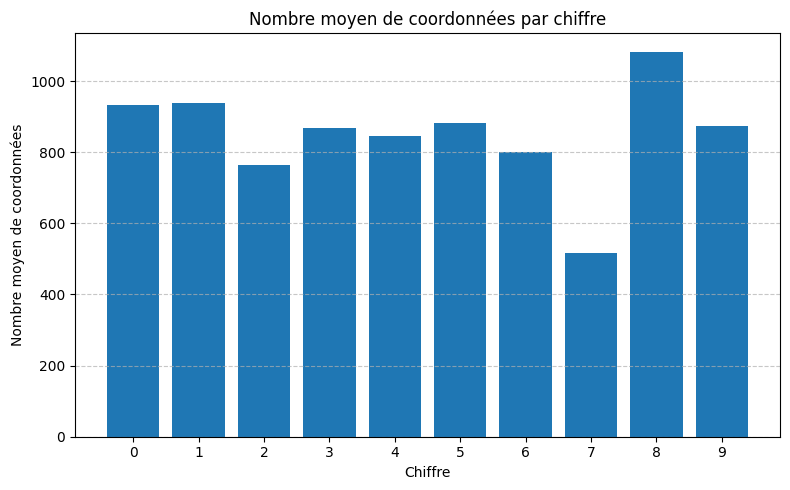

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_10284\700265434.py:66: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---
Epoch 1/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 10s 244ms/step - accuracy: 0.0967 - loss: 2.4427
Epoch 2/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 279ms/step - accuracy: 0.2400 - loss: 2.0284
Epoch 3/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 276ms/step - accuracy: 0.7544 - loss: 0.6894
Epoch 4/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 269ms/step - accuracy: 0.9111 - loss: 0.2355
Epoch 5/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 275ms/step - accuracy: 0.9667 - loss: 0.1192
Epoch 6/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 267ms/step - accuracy: 0.9733 - loss: 0.1028
Epoch 7/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 260ms/step - accuracy: 0.9644 - loss: 0.1290
Epoch 8/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 258ms/step - accuracy: 0.9733 - loss: 0.0903
Epoch 9/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 254ms/step - accuracy: 0.9889 - loss: 0.0455
Epoch 10/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 270ms/step - accuracy: 0.9900 - loss: 0.0332
Epoch 11/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 244ms/step - accuracy: 0.9900 - loss: 0.0445
Epoch 12/20
29/29 ━━━

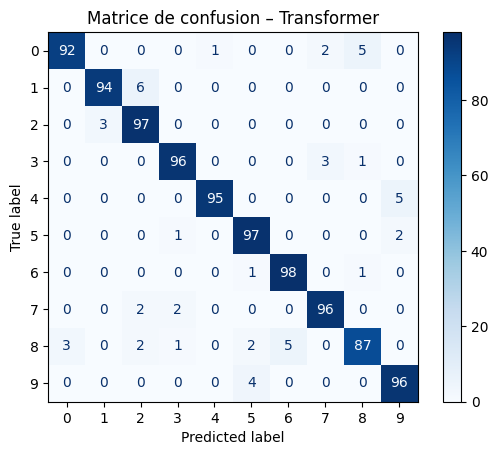

In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import layers, models
import tensorflow as tf

# ordre de test : 1) d_model → tester 64, 128, 256. , 2) num_heads → 2, 4, 8.,3) , num_layers →  2, 3,4 ,4)dff → 128, 256, 512. ,5)Dense final hidden → 64, 128, 256.
#6) batch_size → 16, 32, 64 (si GPU limité).

# onsirpation de :https://github.com/gyselph/transformer-sequence-classification?
# est un model esupervise comme lstm mais pas dtw edti distanc eetc et traite le signale en entier et pas frame par frame 
# ------------------------
# 1. Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


# ------------------------
# 2. Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")


# ------------------------
# 3. Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


# ------------------------
# 4. Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


# ------------------------
# 5. Split user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test


# -------------------------------------------------------
# 6. POSITONAL ENCODING (VERSION 100% COMPATIBLE TF2)
# -------------------------------------------------------
class PositionalEncoding(layers.Layer):
    def __init__(self, max_len, d_model):
        super().__init__()
        self.max_len = max_len
        self.d_model = d_model

        # Pré-calcul numpy -> constant TensorFlow
        pos = np.arange(max_len)[:, np.newaxis]
        i = np.arange(d_model)[np.newaxis, :]
        angle_rates = 1 / np.power(10000, (2 * (i // 2)) / np.float32(d_model))

        angle_rads = pos * angle_rates

        pe = np.zeros((max_len, d_model))
        pe[:, 0::2] = np.sin(angle_rads[:, 0::2])
        pe[:, 1::2] = np.cos(angle_rads[:, 1::2])

        self.positional_encoding = tf.constant(pe[np.newaxis, ...], dtype=tf.float32)

    def call(self, x):
        seq_len = tf.shape(x)[1]
        return x + self.positional_encoding[:, :seq_len, :]


# ------------------------
# 7. Transformer Encoder Model
# ------------------------
def transformer_encoder(x, num_heads, d_model, dff, dropout):
    attn_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=d_model)(x, x)
    attn_output = layers.Dropout(dropout)(attn_output)
    out1 = layers.LayerNormalization(epsilon=1e-6)(x + attn_output)

    ffn = models.Sequential([
        layers.Dense(dff, activation="relu"),
        layers.Dense(d_model),
    ])
    ffn_output = ffn(out1)
    ffn_output = layers.Dropout(dropout)(ffn_output)
    out2 = layers.LayerNormalization(epsilon=1e-6)(out1 + ffn_output)

    return out2


def create_transformer_model(input_shape, num_classes, seq_len=100):
    inputs = layers.Input(shape=input_shape)

    d_model = 128
    num_heads = 8
    num_layers = 2
    dff = 256
    dropout = 0.2

    x = layers.Dense(d_model)(inputs)
    x = PositionalEncoding(seq_len, d_model)(x)

    for _ in range(num_layers):
        x = transformer_encoder(x, num_heads, d_model, dff, dropout)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(128, activation='relu')(x)
    x = layers.Dropout(0.2)(x)

    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs, outputs)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    return model


# ------------------------
# 8. Test leave-one-user-out
# ------------------------
def test_transformer_user_independent(df, loop_range=10, epochs=20, batch_size=32, verbose_fit=1):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")

        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        n_classes = len(np.unique(y_train))
        input_shape = (X_train.shape[1], X_train.shape[2])

        model = create_transformer_model(input_shape=input_shape, num_classes=n_classes)

        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=verbose_fit)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale Transformer : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – Transformer")
    plt.show()


# ------------------------
# 9. Lancer le test Transformer
# ------------------------
test_transformer_user_independent(df100, loop_range=10, epochs=20, batch_size=32, verbose_fit=1)

# embedding 64 


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_10284\102519764.py:27: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


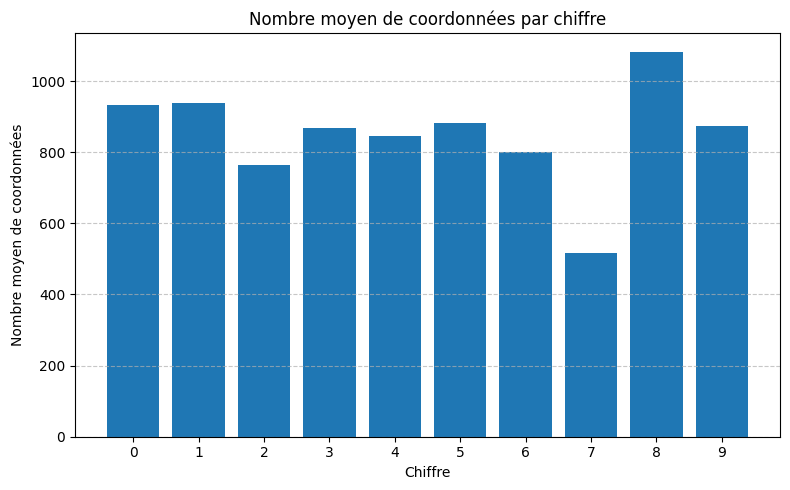

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_10284\102519764.py:66: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---
Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 114ms/step - accuracy: 0.1033 - loss: 2.3396
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - accuracy: 0.4733 - loss: 1.5627 
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - accuracy: 0.8300 - loss: 0.5634
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - accuracy: 0.9133 - loss: 0.2588
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 122ms/step - accuracy: 0.9467 - loss: 0.1770
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - accuracy: 0.9578 - loss: 0.1248
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - accuracy: 0.9800 - loss: 0.0735
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - accuracy: 0.9800 - loss: 0.0750
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - accuracy: 0.9867 - loss: 0.0413
Epoch 10/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - accuracy: 0.9911 - loss: 0.0324
Epoch 11/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - accuracy: 0.9889 - loss: 0.0446
Epoch 12/50
29/29 ━━━━

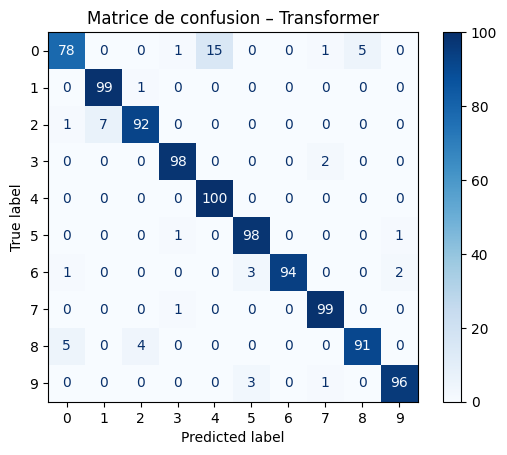

In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import layers, models
import tensorflow as tf

# ordre de test : 1) d_model → tester 64, 128, 256. , 2) num_heads → 2, 4, 8.,3) , num_layers →  2, 3,4 ,4)dff → 128, 256, 512. ,5)Dense final hidden → 64, 128, 256.
#6) batch_size → 16, 32, 64 (si GPU limité).

# onsirpation de :https://github.com/gyselph/transformer-sequence-classification?
# est un model esupervise comme lstm mais pas dtw edti distanc eetc et traite le signale en entier et pas frame par frame 
# ------------------------
# 1. Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


# ------------------------
# 2. Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")


# ------------------------
# 3. Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


# ------------------------
# 4. Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


# ------------------------
# 5. Split user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test


# -------------------------------------------------------
# 6. POSITONAL ENCODING (VERSION 100% COMPATIBLE TF2)
# -------------------------------------------------------
class PositionalEncoding(layers.Layer):
    def __init__(self, max_len, d_model):
        super().__init__()
        self.max_len = max_len
        self.d_model = d_model

        # Pré-calcul numpy -> constant TensorFlow
        pos = np.arange(max_len)[:, np.newaxis]
        i = np.arange(d_model)[np.newaxis, :]
        angle_rates = 1 / np.power(10000, (2 * (i // 2)) / np.float32(d_model))

        angle_rads = pos * angle_rates

        pe = np.zeros((max_len, d_model))
        pe[:, 0::2] = np.sin(angle_rads[:, 0::2])
        pe[:, 1::2] = np.cos(angle_rads[:, 1::2])

        self.positional_encoding = tf.constant(pe[np.newaxis, ...], dtype=tf.float32)

    def call(self, x):
        seq_len = tf.shape(x)[1]
        return x + self.positional_encoding[:, :seq_len, :]


# ------------------------
# 7. Transformer Encoder Model
# ------------------------
def transformer_encoder(x, num_heads, d_model, dff, dropout):
    attn_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=d_model)(x, x)
    attn_output = layers.Dropout(dropout)(attn_output)
    out1 = layers.LayerNormalization(epsilon=1e-6)(x + attn_output)

    ffn = models.Sequential([
        layers.Dense(dff, activation="relu"),
        layers.Dense(d_model),
    ])
    ffn_output = ffn(out1)
    ffn_output = layers.Dropout(dropout)(ffn_output)
    out2 = layers.LayerNormalization(epsilon=1e-6)(out1 + ffn_output)

    return out2


def create_transformer_model(input_shape, num_classes, seq_len=100):
    inputs = layers.Input(shape=input_shape)

    d_model = 64
    num_heads = 8
    num_layers = 2
    dff = 256
    dropout = 0.2

    x = layers.Dense(d_model)(inputs)
    x = PositionalEncoding(seq_len, d_model)(x)

    for _ in range(num_layers):
        x = transformer_encoder(x, num_heads, d_model, dff, dropout)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(128, activation='relu')(x)
    x = layers.Dropout(0.2)(x)

    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs, outputs)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    return model


# ------------------------
# 8. Test leave-one-user-out
# ------------------------
def test_transformer_user_independent(df, loop_range=10, epochs=30, batch_size=32, verbose_fit=1):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")

        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        n_classes = len(np.unique(y_train))
        input_shape = (X_train.shape[1], X_train.shape[2])

        model = create_transformer_model(input_shape=input_shape, num_classes=n_classes)

        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=verbose_fit)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale Transformer : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – Transformer")
    plt.show()


# ------------------------
# 9. Lancer le test Transformer
# ------------------------
test_transformer_user_independent(df100, loop_range=10, epochs=50, batch_size=32, verbose_fit=1)

#embedding 256

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_10284\4059349011.py:27: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


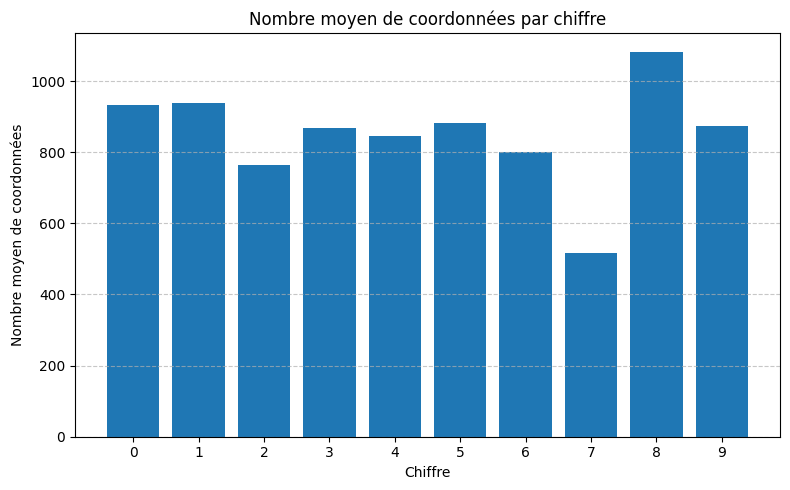

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_10284\4059349011.py:66: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---
Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step - accuracy: 0.1233 - loss: 2.3007
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - accuracy: 0.3156 - loss: 1.9829
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - accuracy: 0.6656 - loss: 1.0843
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - accuracy: 0.8178 - loss: 0.5254
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step - accuracy: 0.8933 - loss: 0.3114
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - accuracy: 0.9544 - loss: 0.1632
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - accuracy: 0.9633 - loss: 0.1324
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - accuracy: 0.9656 - loss: 0.1004
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - accuracy: 0.9800 - loss: 0.0758
Epoch 10/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - accuracy: 0.9867 - loss: 0.0516
Epoch 11/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - accuracy: 0.9956 - loss: 0.0336
Epoch 12/50
29/29 ━━━━━━━━━━━━━━━

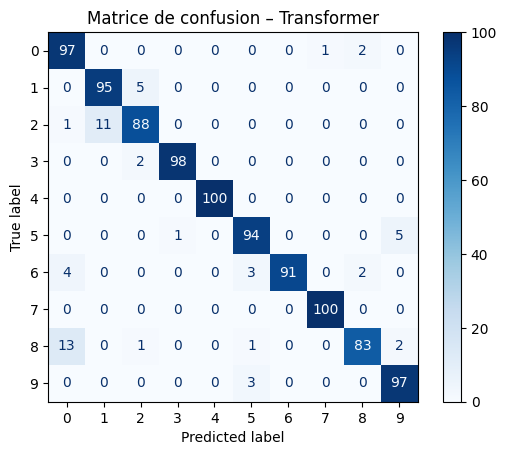

In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import layers, models
import tensorflow as tf

# ordre de test : 1) d_model → tester 64, 128, 256. , 2) num_heads → 2, 4, 8.,3) , num_layers →  2, 3,4 ,4)dff → 128, 256, 512. ,5)Dense final hidden → 64, 128, 256.
#6) batch_size → 16, 32, 64 (si GPU limité).

# onsirpation de :https://github.com/gyselph/transformer-sequence-classification?
# est un model esupervise comme lstm mais pas dtw edti distanc eetc et traite le signale en entier et pas frame par frame 
# ------------------------
# 1. Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


# ------------------------
# 2. Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")


# ------------------------
# 3. Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


# ------------------------
# 4. Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


# ------------------------
# 5. Split user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test


# -------------------------------------------------------
# 6. POSITONAL ENCODING (VERSION 100% COMPATIBLE TF2)
# -------------------------------------------------------
class PositionalEncoding(layers.Layer):
    def __init__(self, max_len, d_model):
        super().__init__()
        self.max_len = max_len
        self.d_model = d_model

        # Pré-calcul numpy -> constant TensorFlow
        pos = np.arange(max_len)[:, np.newaxis]
        i = np.arange(d_model)[np.newaxis, :]
        angle_rates = 1 / np.power(10000, (2 * (i // 2)) / np.float32(d_model))

        angle_rads = pos * angle_rates

        pe = np.zeros((max_len, d_model))
        pe[:, 0::2] = np.sin(angle_rads[:, 0::2])
        pe[:, 1::2] = np.cos(angle_rads[:, 1::2])

        self.positional_encoding = tf.constant(pe[np.newaxis, ...], dtype=tf.float32)

    def call(self, x):
        seq_len = tf.shape(x)[1]
        return x + self.positional_encoding[:, :seq_len, :]


# ------------------------
# 7. Transformer Encoder Model
# ------------------------
def transformer_encoder(x, num_heads, d_model, dff, dropout):
    attn_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=d_model)(x, x)
    attn_output = layers.Dropout(dropout)(attn_output)
    out1 = layers.LayerNormalization(epsilon=1e-6)(x + attn_output)

    ffn = models.Sequential([
        layers.Dense(dff, activation="relu"),
        layers.Dense(d_model),
    ])
    ffn_output = ffn(out1)
    ffn_output = layers.Dropout(dropout)(ffn_output)
    out2 = layers.LayerNormalization(epsilon=1e-6)(out1 + ffn_output)

    return out2


def create_transformer_model(input_shape, num_classes, seq_len=100):
    inputs = layers.Input(shape=input_shape)

    d_model = 32
    num_heads = 8
    num_layers = 2
    dff = 256
    dropout = 0.2

    x = layers.Dense(d_model)(inputs)
    x = PositionalEncoding(seq_len, d_model)(x)

    for _ in range(num_layers):
        x = transformer_encoder(x, num_heads, d_model, dff, dropout)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(128, activation='relu')(x)
    x = layers.Dropout(0.2)(x)

    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs, outputs)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    return model


# ------------------------
# 8. Test leave-one-user-out
# ------------------------
def test_transformer_user_independent(df, loop_range=10, epochs=30, batch_size=32, verbose_fit=1):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")

        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        n_classes = len(np.unique(y_train))
        input_shape = (X_train.shape[1], X_train.shape[2])

        model = create_transformer_model(input_shape=input_shape, num_classes=n_classes)

        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=verbose_fit)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale Transformer : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – Transformer")
    plt.show()


# ------------------------
# 9. Lancer le test Transformer
# ------------------------
test_transformer_user_independent(df100, loop_range=10, epochs=50, batch_size=32, verbose_fit=1)

# epoche 75 -75

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_10284\3972571853.py:27: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


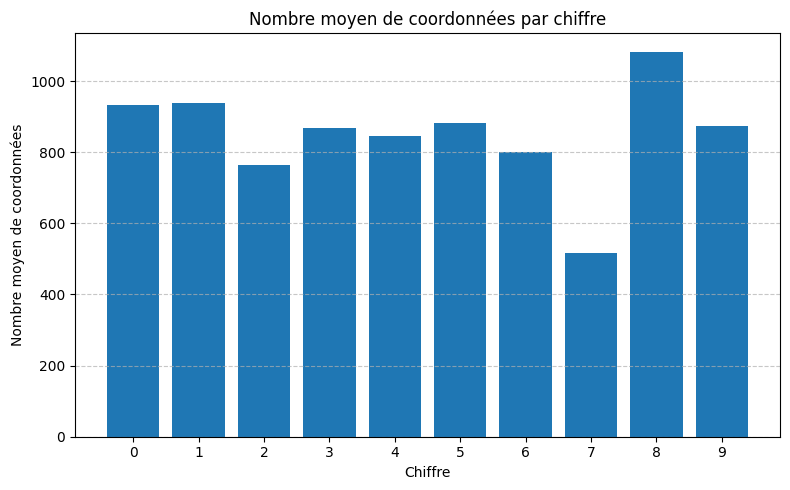

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_10284\3972571853.py:66: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---
Epoch 1/75
29/29 ━━━━━━━━━━━━━━━━━━━━ 10s 232ms/step - accuracy: 0.1000 - loss: 2.4048
Epoch 2/75
29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 256ms/step - accuracy: 0.1767 - loss: 2.1659
Epoch 3/75
29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 253ms/step - accuracy: 0.7211 - loss: 0.7096
Epoch 4/75
29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 249ms/step - accuracy: 0.8556 - loss: 0.3489
Epoch 5/75
29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 240ms/step - accuracy: 0.8900 - loss: 0.2084
Epoch 6/75
29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 243ms/step - accuracy: 0.8989 - loss: 0.2034
Epoch 7/75
29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 242ms/step - accuracy: 0.9422 - loss: 0.1482
Epoch 8/75
29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 244ms/step - accuracy: 0.8933 - loss: 0.2298
Epoch 9/75
29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 241ms/step - accuracy: 0.9256 - loss: 0.1722
Epoch 10/75
29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 246ms/step - accuracy: 0.9300 - loss: 0.1475
Epoch 11/75
29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 249ms/step - accuracy: 0.9456 - loss: 0.1228
Epoch 12/75
29/29 ━━━

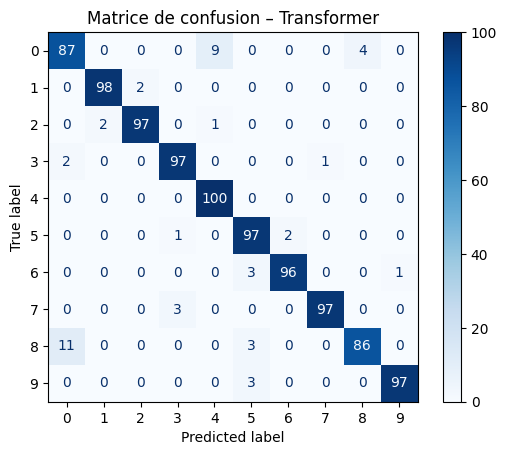

In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import layers, models
import tensorflow as tf

# ordre de test : 1) d_model → tester 64, 128, 256. , 2) num_heads → 2, 4, 8.,3) , num_layers →  2, 3,4 ,4)dff → 128, 256, 512. ,5)Dense final hidden → 64, 128, 256.
#6) batch_size → 16, 32, 64 (si GPU limité).

# onsirpation de :https://github.com/gyselph/transformer-sequence-classification?
# est un model esupervise comme lstm mais pas dtw edti distanc eetc et traite le signale en entier et pas frame par frame 
# ------------------------
# 1. Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


# ------------------------
# 2. Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")


# ------------------------
# 3. Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


# ------------------------
# 4. Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


# ------------------------
# 5. Split user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test


# -------------------------------------------------------
# 6. POSITONAL ENCODING (VERSION 100% COMPATIBLE TF2)
# -------------------------------------------------------
class PositionalEncoding(layers.Layer):
    def __init__(self, max_len, d_model):
        super().__init__()
        self.max_len = max_len
        self.d_model = d_model

        # Pré-calcul numpy -> constant TensorFlow
        pos = np.arange(max_len)[:, np.newaxis]
        i = np.arange(d_model)[np.newaxis, :]
        angle_rates = 1 / np.power(10000, (2 * (i // 2)) / np.float32(d_model))

        angle_rads = pos * angle_rates

        pe = np.zeros((max_len, d_model))
        pe[:, 0::2] = np.sin(angle_rads[:, 0::2])
        pe[:, 1::2] = np.cos(angle_rads[:, 1::2])

        self.positional_encoding = tf.constant(pe[np.newaxis, ...], dtype=tf.float32)

    def call(self, x):
        seq_len = tf.shape(x)[1]
        return x + self.positional_encoding[:, :seq_len, :]


# ------------------------
# 7. Transformer Encoder Model
# ------------------------
def transformer_encoder(x, num_heads, d_model, dff, dropout):
    attn_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=d_model)(x, x)
    attn_output = layers.Dropout(dropout)(attn_output)
    out1 = layers.LayerNormalization(epsilon=1e-6)(x + attn_output)

    ffn = models.Sequential([
        layers.Dense(dff, activation="relu"),
        layers.Dense(d_model),
    ])
    ffn_output = ffn(out1)
    ffn_output = layers.Dropout(dropout)(ffn_output)
    out2 = layers.LayerNormalization(epsilon=1e-6)(out1 + ffn_output)

    return out2


def create_transformer_model(input_shape, num_classes, seq_len=100):
    inputs = layers.Input(shape=input_shape)

    d_model = 128
    num_heads = 8
    num_layers = 2
    dff = 256
    dropout = 0.2

    x = layers.Dense(d_model)(inputs)
    x = PositionalEncoding(seq_len, d_model)(x)

    for _ in range(num_layers):
        x = transformer_encoder(x, num_heads, d_model, dff, dropout)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(128, activation='relu')(x)
    x = layers.Dropout(0.2)(x)

    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs, outputs)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    return model


# ------------------------
# 8. Test leave-one-user-out
# ------------------------
def test_transformer_user_independent(df, loop_range=10, epochs=75, batch_size=32, verbose_fit=1):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")

        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        n_classes = len(np.unique(y_train))
        input_shape = (X_train.shape[1], X_train.shape[2])

        model = create_transformer_model(input_shape=input_shape, num_classes=n_classes)

        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=verbose_fit)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale Transformer : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – Transformer")
    plt.show()


# ------------------------
# 9. Lancer le test Transformer
# ------------------------
test_transformer_user_independent(df100, loop_range=10, epochs=75, batch_size=32, verbose_fit=1)

# embedding 256

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_10836\2086224663.py:27: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


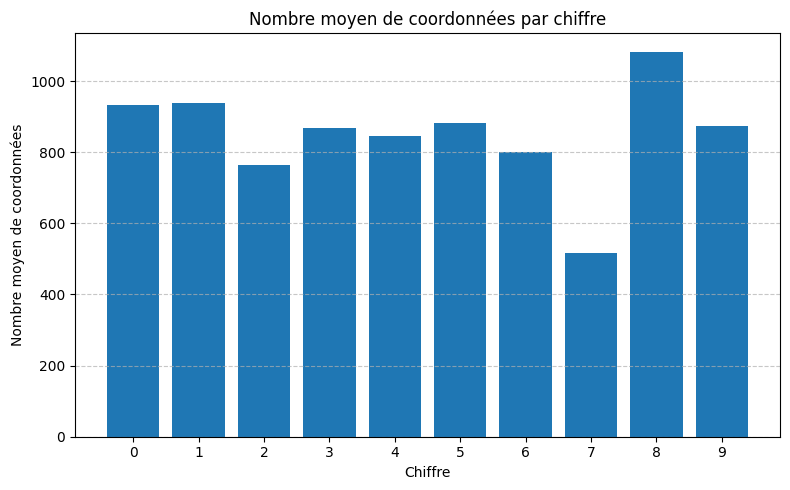

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_10836\2086224663.py:66: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---

Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 28s 730ms/step - accuracy: 0.0967 - loss: 2.4748
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 22s 742ms/step - accuracy: 0.0944 - loss: 2.3146
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 22s 746ms/step - accuracy: 0.1000 - loss: 2.3066
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 23s 784ms/step - accuracy: 0.1011 - loss: 2.3101
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 22s 769ms/step - accuracy: 0.0978 - loss: 2.3029
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 22s 764ms/step - accuracy: 0.1000 - loss: 2.3027
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 22s 748ms/step - accuracy: 0.1000 - loss: 2.3027
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 21s 733ms/step - accuracy: 0.1000 - loss: 2.3027
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 22s 756ms/step - accuracy: 0.1000 - loss: 2.3028
Epoch 10/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 21s 736ms/step - accuracy: 0.1000 - loss: 2.3027
Epoch 11/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 21s 736ms/step - accuracy: 0.1000 - loss: 2.3027
Epoch 12/5

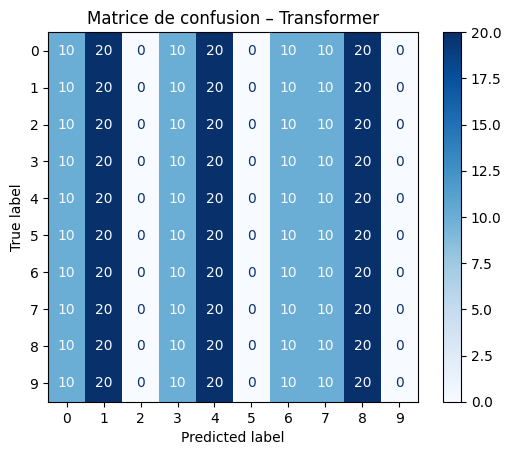

In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import layers, models
import tensorflow as tf

# ordre de test : 1) d_model → tester 64, 128, 256. , 2) num_heads → 2, 4, 8.,3) , num_layers →  2, 3,4 ,4)dff → 128, 256, 512. ,5)Dense final hidden → 64, 128, 256.
#6) batch_size → 16, 32, 64 (si GPU limité).

# onsirpation de :https://github.com/gyselph/transformer-sequence-classification?
# est un model esupervise comme lstm mais pas dtw edti distanc eetc et traite le signale en entier et pas frame par frame 
# ------------------------
# 1. Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


# ------------------------
# 2. Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")


# ------------------------
# 3. Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


# ------------------------
# 4. Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


# ------------------------
# 5. Split user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test


# -------------------------------------------------------
# 6. POSITONAL ENCODING (VERSION 100% COMPATIBLE TF2)
# -------------------------------------------------------
class PositionalEncoding(layers.Layer):
    def __init__(self, max_len, d_model):
        super().__init__()
        self.max_len = max_len
        self.d_model = d_model

        # Pré-calcul numpy -> constant TensorFlow
        pos = np.arange(max_len)[:, np.newaxis]
        i = np.arange(d_model)[np.newaxis, :]
        angle_rates = 1 / np.power(10000, (2 * (i // 2)) / np.float32(d_model))

        angle_rads = pos * angle_rates

        pe = np.zeros((max_len, d_model))
        pe[:, 0::2] = np.sin(angle_rads[:, 0::2])
        pe[:, 1::2] = np.cos(angle_rads[:, 1::2])

        self.positional_encoding = tf.constant(pe[np.newaxis, ...], dtype=tf.float32)

    def call(self, x):
        seq_len = tf.shape(x)[1]
        return x + self.positional_encoding[:, :seq_len, :]


# ------------------------
# 7. Transformer Encoder Model
# ------------------------
def transformer_encoder(x, num_heads, d_model, dff, dropout):
    attn_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=d_model)(x, x)
    attn_output = layers.Dropout(dropout)(attn_output)
    out1 = layers.LayerNormalization(epsilon=1e-6)(x + attn_output)

    ffn = models.Sequential([
        layers.Dense(dff, activation="relu"),
        layers.Dense(d_model),
    ])
    ffn_output = ffn(out1)
    ffn_output = layers.Dropout(dropout)(ffn_output)
    out2 = layers.LayerNormalization(epsilon=1e-6)(out1 + ffn_output)

    return out2


def create_transformer_model(input_shape, num_classes, seq_len=100):
    inputs = layers.Input(shape=input_shape)

    d_model = 256
    num_heads = 8
    num_layers = 2
    dff = 256
    dropout = 0.2

    x = layers.Dense(d_model)(inputs)
    x = PositionalEncoding(seq_len, d_model)(x)

    for _ in range(num_layers):
        x = transformer_encoder(x, num_heads, d_model, dff, dropout)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(128, activation='relu')(x)
    x = layers.Dropout(0.2)(x)

    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs, outputs)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    return model


# ------------------------
# 8. Test leave-one-user-out
# ------------------------
def test_transformer_user_independent(df, loop_range=10, epochs=30, batch_size=32, verbose_fit=1):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")

        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        n_classes = len(np.unique(y_train))
        input_shape = (X_train.shape[1], X_train.shape[2])

        model = create_transformer_model(input_shape=input_shape, num_classes=n_classes)

        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=verbose_fit)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale Transformer : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – Transformer")
    plt.show()


# ------------------------
# 9. Lancer le test Transformer
# ------------------------
test_transformer_user_independent(df100, loop_range=10, epochs=50, batch_size=32, verbose_fit=1)

# batch 16 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_19736\1084019828.py:27: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


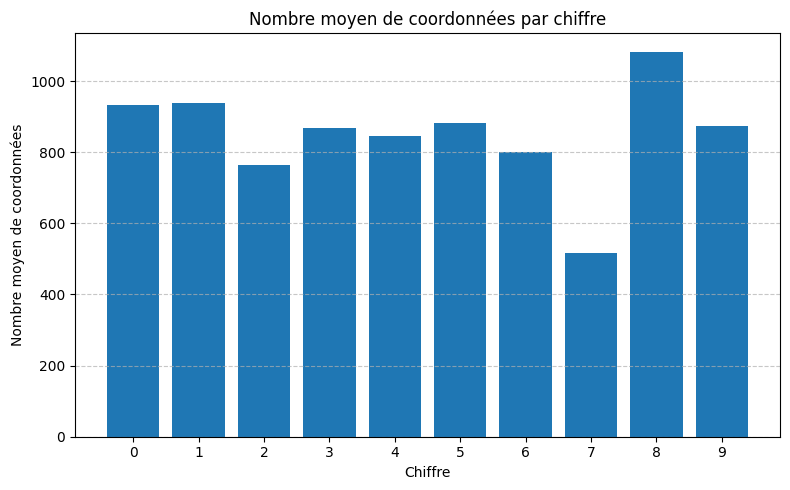

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_19736\1084019828.py:66: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---
Epoch 1/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 9s 107ms/step - accuracy: 0.1100 - loss: 2.4180
Epoch 2/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 6s 108ms/step - accuracy: 0.3989 - loss: 1.5511
Epoch 3/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 6s 113ms/step - accuracy: 0.7956 - loss: 0.5370
Epoch 4/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 6s 110ms/step - accuracy: 0.8633 - loss: 0.3093
Epoch 5/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 6s 110ms/step - accuracy: 0.8811 - loss: 0.2958
Epoch 6/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 6s 111ms/step - accuracy: 0.9078 - loss: 0.2297
Epoch 7/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 6s 111ms/step - accuracy: 0.9200 - loss: 0.2396
Epoch 8/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 6s 110ms/step - accuracy: 0.9256 - loss: 0.2280
Epoch 9/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 6s 110ms/step - accuracy: 0.9222 - loss: 0.2302
Epoch 10/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 6s 113ms/step - accuracy: 0.9322 - loss: 0.1850
Epoch 11/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 6s 110ms/step - accuracy: 0.9478 - loss: 0.1659
Epoch 12/50
57/57 ━━━━

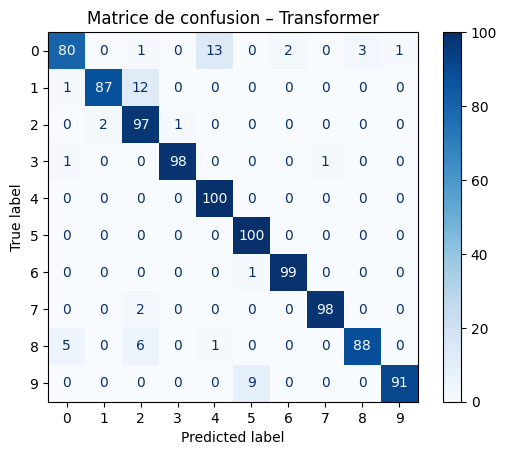

In [3]:
import pandas as pd
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import layers, models
import tensorflow as tf

# ordre de test : 1) d_model → tester 64, 128, 256. , 2) num_heads → 2, 4, 8.,3) , num_layers →  2, 3,4 ,4)dff → 128, 256, 512. ,5)Dense final hidden → 64, 128, 256.
#6) batch_size → 16, 32, 64 (si GPU limité).

# onsirpation de :https://github.com/gyselph/transformer-sequence-classification?
# est un model esupervise comme lstm mais pas dtw edti distanc eetc et traite le signale en entier et pas frame par frame 
# ------------------------
# 1. Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


# ------------------------
# 2. Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")


# ------------------------
# 3. Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


# ------------------------
# 4. Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


# ------------------------
# 5. Split user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test


# -------------------------------------------------------
# 6. POSITONAL ENCODING (VERSION 100% COMPATIBLE TF2)
# -------------------------------------------------------
class PositionalEncoding(layers.Layer):
    def __init__(self, max_len, d_model):
        super().__init__()
        self.max_len = max_len
        self.d_model = d_model

        # Pré-calcul numpy -> constant TensorFlow
        pos = np.arange(max_len)[:, np.newaxis]
        i = np.arange(d_model)[np.newaxis, :]
        angle_rates = 1 / np.power(10000, (2 * (i // 2)) / np.float32(d_model))

        angle_rads = pos * angle_rates

        pe = np.zeros((max_len, d_model))
        pe[:, 0::2] = np.sin(angle_rads[:, 0::2])
        pe[:, 1::2] = np.cos(angle_rads[:, 1::2])

        self.positional_encoding = tf.constant(pe[np.newaxis, ...], dtype=tf.float32)

    def call(self, x):
        seq_len = tf.shape(x)[1]
        return x + self.positional_encoding[:, :seq_len, :]


# ------------------------
# 7. Transformer Encoder Model
# ------------------------
def transformer_encoder(x, num_heads, d_model, dff, dropout):
    attn_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=d_model)(x, x)
    attn_output = layers.Dropout(dropout)(attn_output)
    out1 = layers.LayerNormalization(epsilon=1e-6)(x + attn_output)

    ffn = models.Sequential([
        layers.Dense(dff, activation="relu"),
        layers.Dense(d_model),
    ])
    ffn_output = ffn(out1)
    ffn_output = layers.Dropout(dropout)(ffn_output)
    out2 = layers.LayerNormalization(epsilon=1e-6)(out1 + ffn_output)

    return out2


def create_transformer_model(input_shape, num_classes, seq_len=100):
    inputs = layers.Input(shape=input_shape)

    d_model = 128
    num_heads = 8
    num_layers = 2
    dff = 256
    dropout = 0.2

    x = layers.Dense(d_model)(inputs)
    x = PositionalEncoding(seq_len, d_model)(x)

    for _ in range(num_layers):
        x = transformer_encoder(x, num_heads, d_model, dff, dropout)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(128, activation='relu')(x)
    x = layers.Dropout(0.2)(x)

    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs, outputs)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    return model


# ------------------------
# 8. Test leave-one-user-out
# ------------------------
def test_transformer_user_independent(df, loop_range=10, epochs=30, batch_size=16, verbose_fit=1):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")

        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        n_classes = len(np.unique(y_train))
        input_shape = (X_train.shape[1], X_train.shape[2])

        model = create_transformer_model(input_shape=input_shape, num_classes=n_classes)

        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=verbose_fit)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale Transformer : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – Transformer")
    plt.show()


# ------------------------
# 9. Lancer le test Transformer
# ------------------------
test_transformer_user_independent(df100, loop_range=10, epochs=50, batch_size=16, verbose_fit=1)

# bac size 64 

C:\Users\Isadiki\AppData\Local\Temp\ipykernel_19736\81672948.py:27: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, file])


            x         y         z       t gesture subject iter
0    0.042075  0.036799  0.258380     6.0       0       1    1
1    0.041904  0.037187  0.258505    37.0       0       1    1
2    0.041739  0.037219  0.258619    67.0       0       1    1
3    0.041446  0.037573  0.258731   101.0       0       1    1
4    0.041303  0.037331  0.258830   132.0       0       1    1
..        ...       ...       ...     ...     ...     ...  ...
114  0.126548 -0.070249  0.279681  3832.0       9      10   10
115  0.126768 -0.070271  0.279268  3861.0       9      10   10
116  0.126849 -0.070454  0.278912  3894.0       9      10   10
117  0.126905 -0.070754  0.278601  3928.0       9      10   10
118  0.127055 -0.070855  0.278318  3973.0       9      10   10

[85095 rows x 7 columns]


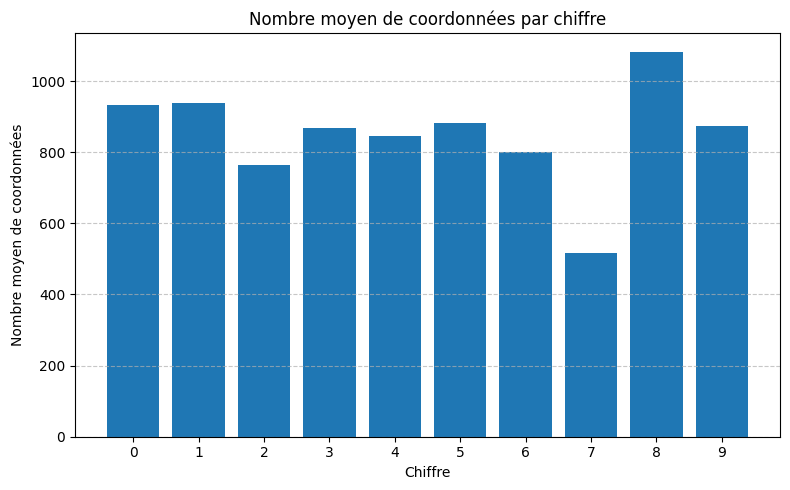

Chiffre 0 : 4857.60 s
Chiffre 1 : 4350.10 s
Chiffre 2 : 3353.00 s
Chiffre 3 : 4241.10 s
Chiffre 4 : 4317.50 s
Chiffre 5 : 3981.30 s
Chiffre 6 : 3534.60 s
Chiffre 7 : 2118.60 s
Chiffre 8 : 4925.90 s
Chiffre 9 : 4598.90 s


C:\Users\Isadiki\AppData\Local\Temp\ipykernel_19736\81672948.py:66: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)



--- Test subject OUT : 1 ---
Epoch 1/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 11s 505ms/step - accuracy: 0.0944 - loss: 2.4905
Epoch 2/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 8s 527ms/step - accuracy: 0.1289 - loss: 2.3540
Epoch 3/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 8s 510ms/step - accuracy: 0.3178 - loss: 1.8432
Epoch 4/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 8s 507ms/step - accuracy: 0.7300 - loss: 0.7603
Epoch 5/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 8s 503ms/step - accuracy: 0.8822 - loss: 0.3343
Epoch 6/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 8s 511ms/step - accuracy: 0.9522 - loss: 0.1585
Epoch 7/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 8s 504ms/step - accuracy: 0.9567 - loss: 0.1329
Epoch 8/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 8s 504ms/step - accuracy: 0.9800 - loss: 0.0718
Epoch 9/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 8s 503ms/step - accuracy: 0.9911 - loss: 0.0374
Epoch 10/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 8s 516ms/step - accuracy: 0.9922 - loss: 0.0331
Epoch 11/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 8s 518ms/step - accuracy: 0.9922 - loss: 0.0314
Epoch 12/50
15/15 ━━━

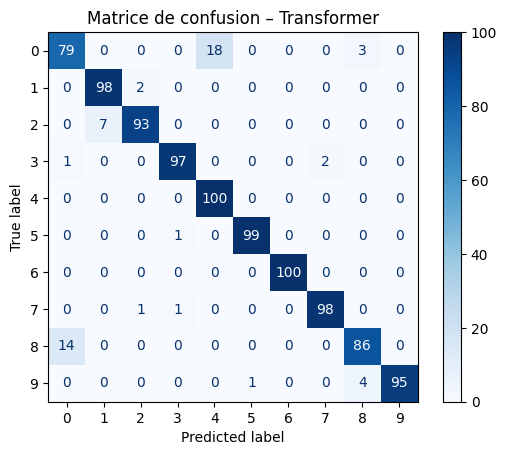

In [4]:
import pandas as pd
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from tensorflow.keras import layers, models
import tensorflow as tf

# ordre de test : 1) d_model → tester 64, 128, 256. , 2) num_heads → 2, 4, 8.,3) , num_layers →  2, 3,4 ,4)dff → 128, 256, 512. ,5)Dense final hidden → 64, 128, 256.
#6) batch_size → 16, 32, 64 (si GPU limité).

# onsirpation de :https://github.com/gyselph/transformer-sequence-classification?
# est un model esupervise comme lstm mais pas dtw edti distanc eetc et traite le signale en entier et pas frame par frame 
# ------------------------
# 1. Chargement des fichiers
# ------------------------
df = pd.DataFrame(columns=['<x>', '<y>', '<z>', '<t>', 'gesture', 'subject', 'iter'])

for subject in range(1, 11):
    for number in range(0, 10):
        for iteration in range(1, 11):
            filename = f'Domain1_csv/Subject{subject}-{number}-{iteration}.csv'
            file = pd.read_csv(filename)
            file['gesture'] = number
            file['subject'] = subject
            file['iter'] = iteration
            df = pd.concat([df, file])

df.columns = ['x', 'y', 'z', 't', 'gesture', 'subject', 'iter']
print(df)


# ------------------------
# 2. Analyse exploratoire
# ------------------------
grouped = df.groupby(['gesture', 'iter'])
sequence_lengths = grouped.size().reset_index(name='length')
mean_lengths = sequence_lengths.groupby('gesture')['length'].mean().reset_index()
mean_lengths.columns = ['Chiffre', 'Frames moyennes']

plt.figure(figsize=(8, 5))
plt.bar(mean_lengths["Chiffre"], mean_lengths["Frames moyennes"])
plt.title("Nombre moyen de coordonnées par chiffre")
plt.xlabel("Chiffre")
plt.ylabel("Nombre moyen de coordonnées")
plt.xticks(mean_lengths["Chiffre"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

durations = df.groupby(['gesture', 'iter'])['t'].agg(lambda x: x.max() - x.min()).reset_index(name='duration')
mean_durations = durations.groupby('gesture')['duration'].mean()
for gesture, mean_dur in mean_durations.items():
    print(f"Chiffre {gesture} : {mean_dur:.2f} s")


# ------------------------
# 3. Standardisation
# ------------------------
def standardize_gesture(df_group):
    df = df_group.copy()
    for axis in ['x', 'y', 'z']:
        df[f'{axis}_std'] = (df[axis] - df[axis].mean()) / df[axis].std()
    return df

df = df.groupby(['subject', 'gesture', 'iter'], group_keys=False).apply(standardize_gesture)
df.to_csv('df.csv', index=False)


# ------------------------
# 4. Resampling à longueur fixe
# ------------------------
def resample_gesture(df, target_len=100):
    resampled_data = []

    for (gesture, subject, iteration), group in df.groupby(['gesture', 'subject', 'iter']):
        n = len(group)
        original_idx = np.arange(n)
        target_idx = np.linspace(0, n - 1, target_len)
        interp = lambda col: interp1d(original_idx, group[col], kind='linear')(target_idx)

        resampled_data.append(pd.DataFrame({
            'gesture': [gesture] * target_len,
            'subject': [subject] * target_len,
            'iter': [iteration] * target_len,
            'x_std': interp('x_std'),
            'y_std': interp('y_std'),
            'z_std': interp('z_std')
        }))

    return pd.concat(resampled_data, ignore_index=True)

df100 = resample_gesture(df)


# ------------------------
# 5. Split user-independent
# ------------------------
def create_user_independent_split(df, subj_out):
    train_df = df[df['subject'] != subj_out]
    test_df = df[df['subject'] == subj_out]

    def df_to_array(df_in):
        X, y = [], []
        for (gesture, subject, iteration), group in df_in.groupby(['gesture', 'subject', 'iter']):
            X.append(group[['x_std', 'y_std', 'z_std']].values)
            y.append(gesture)
        return np.array(X), np.array(y)

    X_train, y_train = df_to_array(train_df)
    X_test, y_test = df_to_array(test_df)
    return X_train, y_train, X_test, y_test


# -------------------------------------------------------
# 6. POSITONAL ENCODING (VERSION 100% COMPATIBLE TF2)
# -------------------------------------------------------
class PositionalEncoding(layers.Layer):
    def __init__(self, max_len, d_model):
        super().__init__()
        self.max_len = max_len
        self.d_model = d_model

        # Pré-calcul numpy -> constant TensorFlow
        pos = np.arange(max_len)[:, np.newaxis]
        i = np.arange(d_model)[np.newaxis, :]
        angle_rates = 1 / np.power(10000, (2 * (i // 2)) / np.float32(d_model))

        angle_rads = pos * angle_rates

        pe = np.zeros((max_len, d_model))
        pe[:, 0::2] = np.sin(angle_rads[:, 0::2])
        pe[:, 1::2] = np.cos(angle_rads[:, 1::2])

        self.positional_encoding = tf.constant(pe[np.newaxis, ...], dtype=tf.float32)

    def call(self, x):
        seq_len = tf.shape(x)[1]
        return x + self.positional_encoding[:, :seq_len, :]


# ------------------------
# 7. Transformer Encoder Model
# ------------------------
def transformer_encoder(x, num_heads, d_model, dff, dropout):
    attn_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=d_model)(x, x)
    attn_output = layers.Dropout(dropout)(attn_output)
    out1 = layers.LayerNormalization(epsilon=1e-6)(x + attn_output)

    ffn = models.Sequential([
        layers.Dense(dff, activation="relu"),
        layers.Dense(d_model),
    ])
    ffn_output = ffn(out1)
    ffn_output = layers.Dropout(dropout)(ffn_output)
    out2 = layers.LayerNormalization(epsilon=1e-6)(out1 + ffn_output)

    return out2


def create_transformer_model(input_shape, num_classes, seq_len=100):
    inputs = layers.Input(shape=input_shape)

    d_model = 128
    num_heads = 8
    num_layers = 2
    dff = 256
    dropout = 0.2

    x = layers.Dense(d_model)(inputs)
    x = PositionalEncoding(seq_len, d_model)(x)

    for _ in range(num_layers):
        x = transformer_encoder(x, num_heads, d_model, dff, dropout)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(128, activation='relu')(x)
    x = layers.Dropout(0.2)(x)

    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs, outputs)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    return model


# ------------------------
# 8. Test leave-one-user-out
# ------------------------
def test_transformer_user_independent(df, loop_range=10, epochs=30, batch_size=64, verbose_fit=1):
    total_true, total_pred = [], []

    for subj_out in range(1, loop_range + 1):
        print(f"\n--- Test subject OUT : {subj_out} ---")

        X_train, y_train, X_test, y_test = create_user_independent_split(df, subj_out)

        n_classes = len(np.unique(y_train))
        input_shape = (X_train.shape[1], X_train.shape[2])

        model = create_transformer_model(input_shape=input_shape, num_classes=n_classes)

        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=verbose_fit)

        y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
        acc = accuracy_score(y_test, y_pred)
        print(f"Exactitude subject {subj_out} : {acc:.2%}")

        total_true.extend(y_test)
        total_pred.extend(y_pred)

    final_acc = accuracy_score(total_true, total_pred)
    print(f"\nExactitude globale Transformer : {final_acc:.2%}")

    cm = confusion_matrix(total_true, total_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(cmap="Blues")
    plt.title("Matrice de confusion – Transformer")
    plt.show()


# ------------------------
# 9. Lancer le test Transformer
# ------------------------
test_transformer_user_independent(df100, loop_range=10, epochs=50, batch_size=64, verbose_fit=1)